# 新一轮空值填充和模型训练
## 1 数据填充

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')   # 忽略matplot的警告
warnings.simplefilter('ignore')     # 忽略sklearn的警告

In [2]:
train = pd.read_csv("./data/data.csv")

In [3]:
train.shape

(1460, 81)

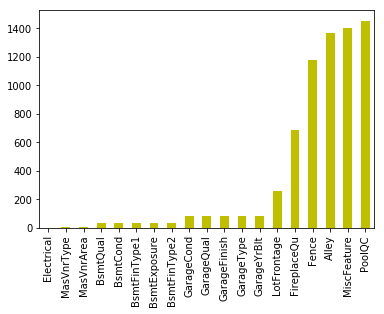

In [4]:
# 统计缺失值
x = train.isnull().sum()
x[x>0].sort_values().plot.bar(color='y')

- 柱状图越高，代表对应特征缺失值得数目越多

In [5]:
x[x>0]

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

- 写一个函数，获取当前的空值特征情况

In [6]:
# 做一个get空的函数
def getnullcount():
    x = train.isnull().sum()
    print(x[x>0])
    x[x>0].sort_values().plot.bar()

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


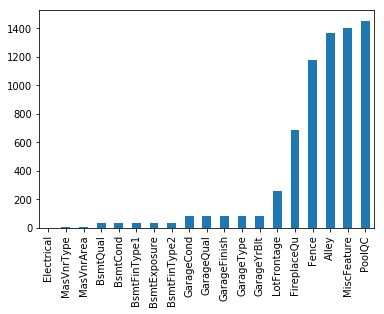

In [7]:
getnullcount()

### 1.1 LotFrontage的填充
- LotFrontage：临街面; 临海或临路部分的土地; 临街地界; 正面宽度; 屋向; 前方; 正面; 临街地。
- 填充的思路
    - （1）思路一：填不同的Neighborhood的均值和中位数
    - （2）思路二：通过LotArea进行填充，分析Lotfrontage 与 LotArea相关性

In [8]:
train['LotFrontage'].head()

0    65.0
1    80.0
2    68.0
3    60.0
4    84.0
Name: LotFrontage, dtype: float64

#### 1.1.1 填不同的Neighborhood的均值和中位数
- 这里只分析，并不真正填充。

In [9]:
import seaborn as sns

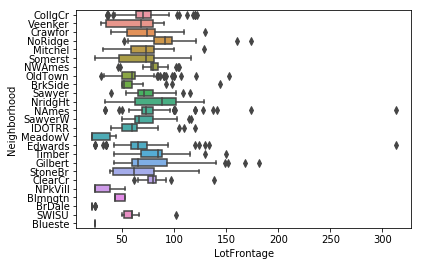

In [10]:
# 用箱线图看'LotFrontage'与'Neighborhood'的关系
sns.boxplot('LotFrontage', 'Neighborhood', data=train)

In [11]:
# 按Neighborhood的种类分组，各组的中位数和均值如下：
neighborhood_group=train.groupby("Neighborhood")
lot_medians=neighborhood_group["LotFrontage"].median()
lot_mean=neighborhood_group["LotFrontage"].mean()

In [12]:
lot_medians

Neighborhood
Blmngtn    43.0
Blueste    24.0
BrDale     21.0
BrkSide    52.0
ClearCr    80.0
CollgCr    70.0
Crawfor    74.0
Edwards    65.5
Gilbert    65.0
IDOTRR     60.0
MeadowV    21.0
Mitchel    73.0
NAmes      73.0
NPkVill    24.0
NWAmes     80.0
NoRidge    91.0
NridgHt    88.5
OldTown    60.0
SWISU      60.0
Sawyer     71.0
SawyerW    66.5
Somerst    73.5
StoneBr    61.5
Timber     85.0
Veenker    68.0
Name: LotFrontage, dtype: float64

In [13]:
lot_mean

Neighborhood
Blmngtn    47.142857
Blueste    24.000000
BrDale     21.562500
BrkSide    57.509804
ClearCr    83.461538
CollgCr    71.682540
Crawfor    71.804878
Edwards    68.217391
Gilbert    79.877551
IDOTRR     62.500000
MeadowV    27.800000
Mitchel    70.083333
NAmes      76.462366
NPkVill    32.285714
NWAmes     81.288889
NoRidge    91.878788
NridgHt    81.881579
OldTown    62.788991
SWISU      58.913043
Sawyer     74.437500
SawyerW    71.500000
Somerst    64.666667
StoneBr    62.700000
Timber     80.133333
Veenker    59.714286
Name: LotFrontage, dtype: float64

In [14]:
# 查看LotFrontage是空值的行的Neighborhood的值
train[train["LotFrontage"].isnull()]["Neighborhood"]

7        NWAmes
12       Sawyer
14        NAmes
16        NAmes
24       Sawyer
31       Sawyer
42      SawyerW
43      CollgCr
50      Gilbert
64      CollgCr
66        NAmes
76        NAmes
84      Gilbert
95      Gilbert
100      NWAmes
104      IDOTRR
111     Gilbert
113     Crawfor
116      Sawyer
120     ClearCr
126     NPkVill
131     Gilbert
133      Timber
136       NAmes
147     Gilbert
149     BrkSide
152      NWAmes
153     ClearCr
160     Veenker
166     ClearCr
         ...   
1300    Gilbert
1301    Crawfor
1309    SawyerW
1312    NoRidge
1318    CollgCr
1321    BrkSide
1342    CollgCr
1346     NWAmes
1348    SawyerW
1354    CollgCr
1356      NAmes
1357      NAmes
1358    Somerst
1362      NAmes
1365    Somerst
1368    CollgCr
1373    NoRidge
1381      NAmes
1383     Sawyer
1396     Timber
1407    Mitchel
1417    NoRidge
1419    Crawfor
1423    Edwards
1424      NAmes
1429     NWAmes
1431    NPkVill
1441    CollgCr
1443    BrkSide
1446    Mitchel
Name: Neighborhood, Leng

- 就此打住，不做填充了。

#### 1.1.2 通过LotArea进行填充

In [15]:
# 分析LotFrontage与LotArea相关性
train['LotFrontage'].corr(train["LotArea"])

0.4260950187718079

In [16]:
# 可见相关性不高，这是他们的度量衡不一样 area是平方后的数据
train['LotFrontage'].corr(np.sqrt(train["LotArea"]))

0.6020022167939361

In [17]:
# 相关性比较大，可添加一列SqrtLotArea
train['SqrtLotArea']=np.sqrt(train["LotArea"])

In [18]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,SqrtLotArea
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,91.923882
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,97.979590
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,106.066017
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,97.724101
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,119.415242


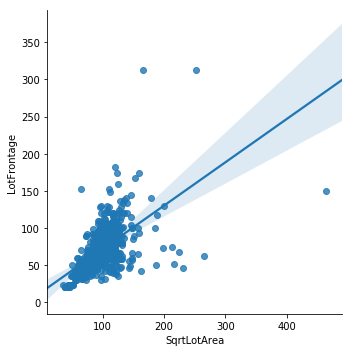

In [19]:
# 画出带回归的散点图，阴影置信区间
sns.lmplot('SqrtLotArea', 'LotFrontage', data=train)

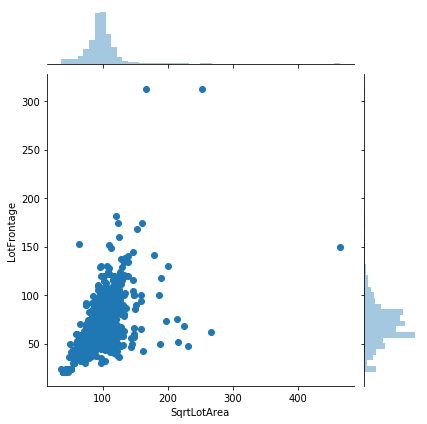

In [20]:
# 看一下两个的分布是否相近
sns.jointplot('SqrtLotArea', 'LotFrontage', data=train)

In [21]:
filter_LotFrontage = train['LotFrontage'].isnull()

In [22]:
train.LotFrontage[filter_LotFrontage] = 0.6*train.SqrtLotArea[filter_LotFrontage]

In [23]:
# 之前索引为7的LotFrontage是空值，现在看一下填充后的
train['LotFrontage'][7]

61.13525987513261

In [24]:
# 填充后的不是空值了
filter_LotFrontage.sum()

259

In [25]:
# 统计填充后的LotFrontage空值数量，可见没有空值了
train['LotFrontage'].isnull().sum()

0

### 1.2 MasVnrtype与MasVnrArea的填充
- MasVnrtype：Masonry veneer type，砖石镶板种类
       BrkCmn：Brick Common
       BrkFace：Brick Face
       CBlock：Cinder Block
       None：None
       Stone：Stone
- MasVnrArea：Masonry veneer area in square feet，砖石镶板面积

Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


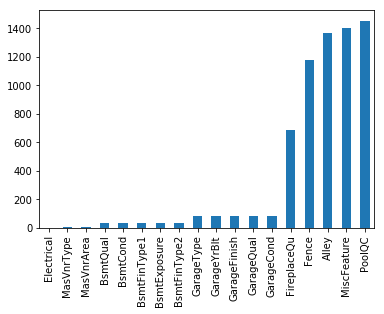

In [26]:
getnullcount()

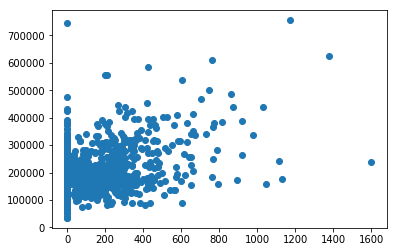

In [27]:
# 画MasVnrArea与SalePrice的散点图，看两者的相关性
plt.scatter(train["MasVnrArea"], train["SalePrice"])

In [28]:
train['MasVnrArea'].corr(train["SalePrice"])

0.4774930470957165

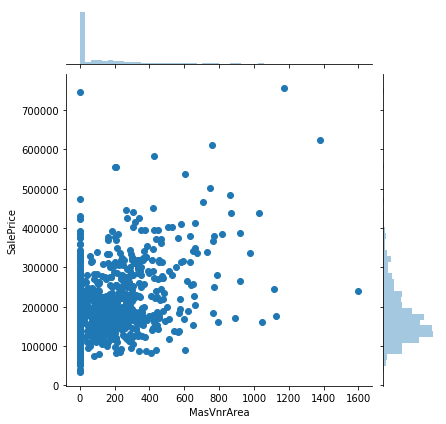

In [29]:
# 查看下分布情况
sns.jointplot(train["MasVnrArea"], train["SalePrice"])

- 看不出有啥相关性

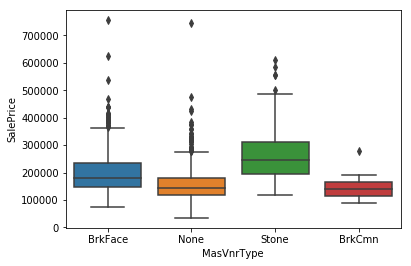

In [30]:
sns.boxplot("MasVnrType", "SalePrice", data=train)

In [31]:
# 统计MasVnrType各种类型的数量
train.groupby(["MasVnrType"]).count()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,SqrtLotArea
MasVnrType,,,,,,,,,,,,,,,,,,,,,
BrkCmn,15,15,15,15,15,15,0,15,15,15,...,0,7,2,15,15,15,15,15,15,15
BrkFace,445,445,445,445,445,445,10,445,445,445,...,2,80,11,445,445,445,445,445,445,445
None,864,864,864,864,864,864,77,864,864,864,...,4,188,40,864,864,864,864,864,864,864
Stone,128,128,128,128,128,128,3,128,128,128,...,1,6,1,128,128,128,128,128,128,128


In [32]:
# 过滤
train[train.MasVnrType=='None'][["MasVnrType", "MasVnrArea"]]

,MasVnrType,MasVnrArea
1,None,0.0
3,None,0.0
5,None,0.0
8,None,0.0
9,None,0.0
10,None,0.0
12,None,0.0
15,None,0.0
17,None,0.0
18,None,0.0


In [33]:
train[["MasVnrType", "MasVnrArea"]]

,MasVnrType,MasVnrArea
0,BrkFace,196.0
1,None,0.0
2,BrkFace,162.0
3,None,0.0
4,BrkFace,350.0
5,None,0.0
6,Stone,186.0
7,Stone,240.0
8,None,0.0
9,None,0.0


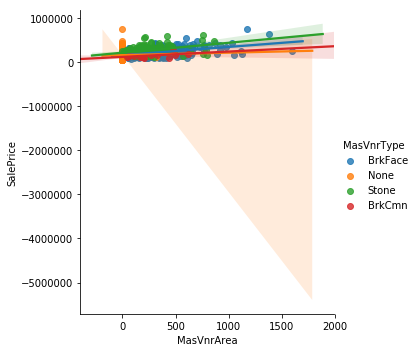

In [34]:
# 画出带回归的散点图，看下相关性，看斜率
sns.lmplot("MasVnrArea", "SalePrice", hue="MasVnrType", data=train)

In [35]:
# 可见相关性并不是很大，可以填充众数
filter_MasVnrArea = train['MasVnrArea'].isnull()   # 好像全部都是不是空啊

In [36]:
train.MasVnrArea[filter_MasVnrArea] = 0.0

In [37]:
filter_MasVnrType = train["MasVnrType"].isnull()
train.MasVnrType[filter_MasVnrType] = 'None'

- 后续在EDA的特征工程中，可以使用如下填充方法：分类进行预测MasVnrType,使用回归来回归MasVnrArea

In [38]:
train['MasVnrArea'].isnull().sum()

0

In [39]:
train["MasVnrType"].isnull().sum()

0

### 1.3 Electrical的填充
- Electrical：Electrical system，电气系统。
    - SBrkr：Standard Circuit Breakers & Romex
    - FuseA：Fuse Box over 60 AMP and all Romex wiring (Average)	
    - FuseF：60 AMP Fuse Box and mostly Romex wiring (Fair)
    - FuseP：60 AMP Fuse Box and mostly knob & tube wiring (poor)
    - Mix：Mixed

Alley           1369
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


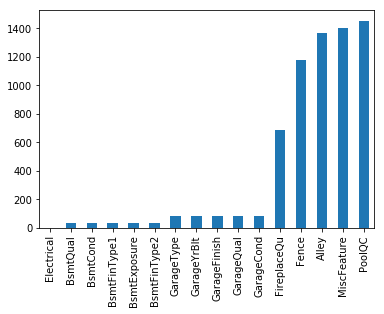

In [40]:
getnullcount()

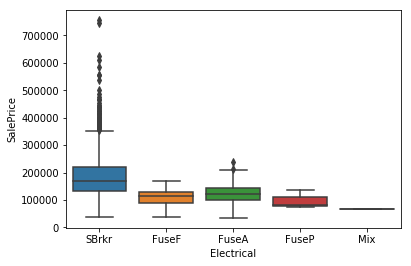

In [41]:
# 查看相关性
sns.boxplot("Electrical", "SalePrice", data=train)

In [42]:
# 分组统计下
train.groupby(["Electrical"]).count()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,SqrtLotArea
Electrical,,,,,,,,,,,,,,,,,,,,,
FuseA,94,94,94,94,94,94,12,94,94,94,...,0,23,2,94,94,94,94,94,94,94
FuseF,27,27,27,27,27,27,4,27,27,27,...,0,2,0,27,27,27,27,27,27,27
FuseP,3,3,3,3,3,3,2,3,3,3,...,0,0,0,3,3,3,3,3,3,3
Mix,1,1,1,1,1,1,0,1,1,1,...,0,0,0,1,1,1,1,1,1,1
SBrkr,1334,1334,1334,1334,1334,1334,73,1334,1334,1334,...,7,256,52,1334,1334,1334,1334,1334,1334,1334


In [43]:
# 直接填充众数
filter_Electrical = train["Electrical"].isnull()
train["Electrical"][filter_Electrical] = "SBrkr"

In [44]:
train["Electrical"].isnull().sum()

0

### 1.4 Alley(小巷子)的填充
- Alley: Type of alley access，胡同通道的类型。
    - Grvl：Gravel
    - Pave：Paved
    - NA ：No alley access 没有小巷
- EDA后半段考虑删掉
- 80%以上为空

In [45]:
train["Alley"].value_counts()

Grvl    50
Pave    41
Name: Alley, dtype: int64

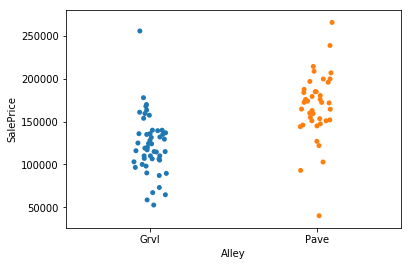

In [46]:
sns.stripplot("Alley", "SalePrice", data=train)

In [47]:
train['Alley']

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
21      Grvl
22       NaN
23       NaN
24       NaN
25       NaN
26       NaN
27       NaN
28       NaN
29       NaN
        ... 
1430     NaN
1431     NaN
1432    Grvl
1433     NaN
1434     NaN
1435     NaN
1436     NaN
1437     NaN
1438     NaN
1439     NaN
1440     NaN
1441     NaN
1442     NaN
1443     NaN
1444     NaN
1445     NaN
1446     NaN
1447     NaN
1448     NaN
1449     NaN
1450     NaN
1451     NaN
1452     NaN
1453     NaN
1454    Pave
1455     NaN
1456     NaN
1457     NaN
1458     NaN
1459     NaN
Name: Alley, Length: 1460, dtype: object

In [48]:
# 填充None
train["Alley"] = train["Alley"].fillna("None")

In [49]:
train["Alley"].isnull().sum()

0

In [50]:
len(train.columns)

82

### 1.5 BaseMent群填充
- TotalBsmtSF是一个完整的关于BaseMent的列，可以拿出来与SalePrice进行相关性分析

- BsmtQual: Evaluates the height of the basement，地下室的高度。
    - Ex: Excellent (100+ inches)
    - Gd: Good (90-99 inches)
    - TA: Typical (80-89 inches)
    - Fa: Fair (70-79 inches)
    - Po: Poor (<70 inches
    - NA: No Basement
       
- BsmtCond: Evaluates the general condition of the basement，地下室的一般状况。
    - Ex：Excellent
    - Gd：Good
    - TA：Typical - slight dampness allowed
    - Fa：Fair - dampness or some cracking or settling
    - Po：Poor - Severe cracking, settling, or wetness
    - NA：No Basement

- BsmtExposure: Refers to walkout or garden level walls,罢工或花园级地下室的墙壁,裸露的地下室部分。
    - Gd：Good Exposure
    - Av：Average Exposure (split levels or foyers typically score average or above)	
    - Mn：Mimimum Exposure
    - No：No Exposure
    - NA：No Basement

- BsmtFinType1: Rating of basement finished area，地下室成品面积质量。
    - GLQ：Good Living Quarters
    - ALQ：Average Living Quarters
    - BLQ：Below Average Living Quarters
    - Rec：Average Rec Room
    - LwQ：Low Quality
    - Unf：Unfinshed
    - NA：No Basement
       
- BsmtFinSF1: Type 1 finished square feet，1型方形脚。

- BsmtFinType2: Rating of basement finished area (if multiple types)，第二个完成区域的质量（如果存在）。
    - GLQ：Good Living Quarters
    - ALQ：Average Living Quarters
    - BLQ：Below Average Living Quarters
    - Rec：Average Rec Room
    - LwQ：Low Quality
    - Unf：Unfinshed
    - NA：No Basement

- BsmtFinSF2: Type 2 finished square feet，2型完成的平方英尺。

- BsmtUnfSF: Unfinished square feet of basement area，未完成的地下室面积。

- TotalBsmtSF: Total square feet of basement area，地下室面积的平方英尺。

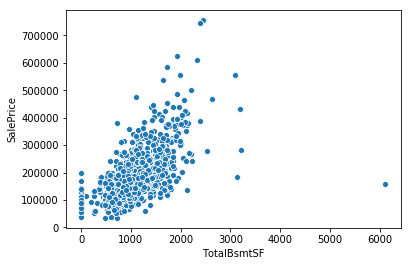

In [51]:
# 查看TotalBsmtSF与SalePrice的相关性
sns.scatterplot("TotalBsmtSF", "SalePrice", data=train)

In [52]:
train['TotalBsmtSF'].corr(train['SalePrice'])

0.6135805515591953

- 可见相关性比较高

In [53]:
basement_cols = ['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','BsmtFinSF1','BsmtFinSF2']

In [54]:
train[basement_cols+['TotalBsmtSF']][train['BsmtQual'].isnull()==True]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF1,BsmtFinSF2,TotalBsmtSF
17,NaN,NaN,NaN,NaN,NaN,0,0,0
39,NaN,NaN,NaN,NaN,NaN,0,0,0
90,NaN,NaN,NaN,NaN,NaN,0,0,0
102,NaN,NaN,NaN,NaN,NaN,0,0,0
156,NaN,NaN,NaN,NaN,NaN,0,0,0
182,NaN,NaN,NaN,NaN,NaN,0,0,0
259,NaN,NaN,NaN,NaN,NaN,0,0,0
342,NaN,NaN,NaN,NaN,NaN,0,0,0
362,NaN,NaN,NaN,NaN,NaN,0,0,0
371,NaN,NaN,NaN,NaN,NaN,0,0,0


In [55]:
# 
train[train.BsmtCond=='NA']

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,SqrtLotArea


In [56]:
# 离散的列填充None,数值的列的已经是0了。
for col in basement_cols:
    if 'FinSF' not in col:
        train[col]=train[col].fillna("None")

FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


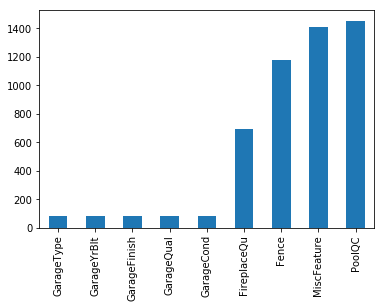

In [57]:
getnullcount()

### 1.6 FireplaceQu填充
- FireplaceQu: Fireplace quality， 壁炉质量。
    - Ex：Excellent - Exceptional Masonry Fireplace
    - Gd：Good - Masonry Fireplace in main level
    - TA：Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
    - Fa：Fair - Prefabricated Fireplace in basement
    - Po：Poor - Ben Franklin Stove
    - NA：No Fireplace

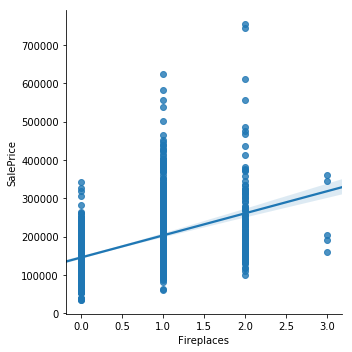

In [58]:
sns.lmplot("Fireplaces", "SalePrice", data=train)

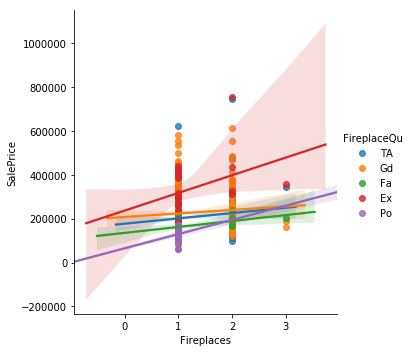

In [59]:
sns.lmplot("Fireplaces", "SalePrice", data=train, hue="FireplaceQu")

In [60]:
# 相关性不大，直接填充None
train["FireplaceQu"]=train["FireplaceQu"].fillna("None")

GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


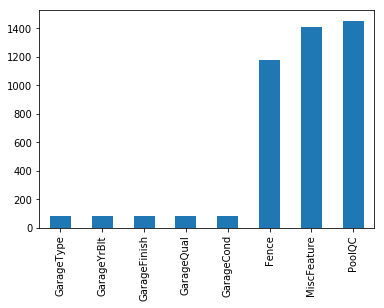

In [61]:
getnullcount()

### 1.7 Garage群的填充

- GarageType: Garage location，车库位置。
    - 2Types: More than one type of garage
    - Attchd: Attached to home
    - Basment: Basement Garage
    - BuiltIn: Built-In (Garage part of house - typically has room above garage)
    - CarPort: Car Port
    - Detchd: Detached from home
    - NA: No Garage

- GarageYrBlt: Year garage was built，年建车库。

- GarageFinish: Interior finish of the garage，车库内部装修。
    - Fin: Finished
    - RFn: Rough Finished	
    - Unf: Unfinished
    - NA: No Garage

- GarageCars: Size of garage in car capacity，车库的车库容量。

- GarageArea: Size of garage in square feet，平方英尺车库大小。

- GarageQual: Garage quality，车库质量。
    - Ex: Excellent
    - Gd: Good
    - TA: Typical/Average
    - Fa: Fair
    - Po: Poor
    - NA: No Garage

- GarageCond: Garage condition，车库条件。
    - Ex: Excellent
    - Gd: Good
    - TA: Typical/Average
    - Fa: Fair
    - Po: Poor
    - NA: No Garage


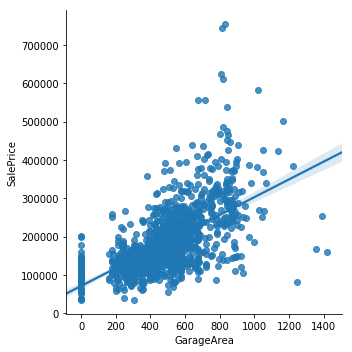

In [62]:
sns.lmplot("GarageArea", "SalePrice", data=train)

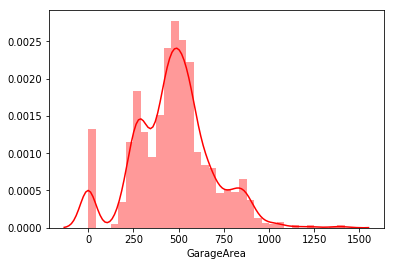

In [63]:
sns.distplot(train["GarageArea"], color='r', kde=True)

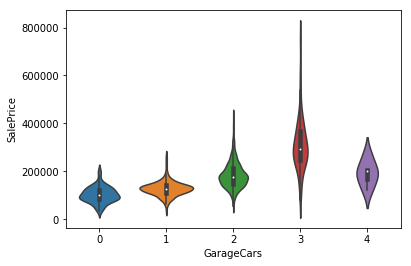

In [64]:
sns.violinplot(train["GarageCars"], train["SalePrice"])

In [65]:
garage_cols=['GarageType','GarageQual','GarageCond','GarageYrBlt','GarageFinish','GarageCars','GarageArea']

In [66]:
train[garage_cols][train['GarageType'].isnull()]

,GarageType,GarageQual,GarageCond,GarageYrBlt,GarageFinish,GarageCars,GarageArea
39,NaN,NaN,NaN,NaN,NaN,0,0
48,NaN,NaN,NaN,NaN,NaN,0,0
78,NaN,NaN,NaN,NaN,NaN,0,0
88,NaN,NaN,NaN,NaN,NaN,0,0
89,NaN,NaN,NaN,NaN,NaN,0,0
99,NaN,NaN,NaN,NaN,NaN,0,0
108,NaN,NaN,NaN,NaN,NaN,0,0
125,NaN,NaN,NaN,NaN,NaN,0,0
127,NaN,NaN,NaN,NaN,NaN,0,0
140,NaN,NaN,NaN,NaN,NaN,0,0


In [67]:
for col in garage_cols:
    if train[col].dtype == np.object:
        train[col]=train[col].fillna("None")
    else:
        train[col]=train[col].fillna(0)

PoolQC         1453
Fence          1179
MiscFeature    1406
dtype: int64


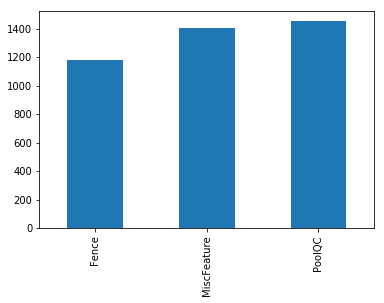

In [68]:
getnullcount()

### 1.8 PoolQC的填充
- Pool quality,  游泳池质量
    - Ex：Excellent
    - Gd：Good
    - TA：Average/Typical
    - Fa：Fair
    - NA：No Pool

In [69]:
train.filter(like="Pool", axis=1)

,PoolArea,PoolQC
0,0,NaN
1,0,NaN
2,0,NaN
3,0,NaN
4,0,NaN
5,0,NaN
6,0,NaN
7,0,NaN
8,0,NaN
9,0,NaN


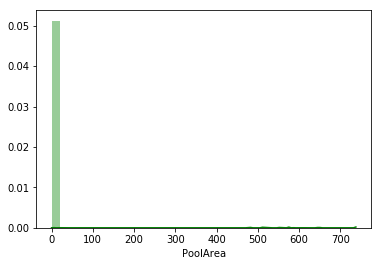

In [70]:
sns.distplot(train["PoolArea"],color="g", kde=True)

In [71]:
train['PoolQC'].isnull().sum()

1453

In [72]:
# 基本都是空值
train.PoolQC = train.PoolQC.fillna("None")

Fence          1179
MiscFeature    1406
dtype: int64


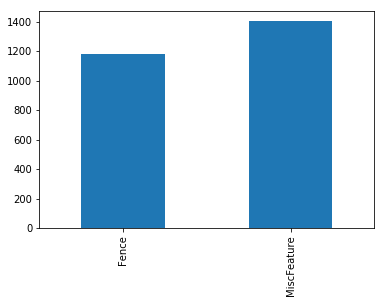

In [73]:
getnullcount()

### 1.9 Fence的填充
- Fence: Fence quality，栅栏质量。
    - GdPrv：Good Privacy
    - MnPrv：Minimum Privacy
    - GdWo：Good Wood
    - MnWw：Minimum Wood/Wire
    - NA：No Fence

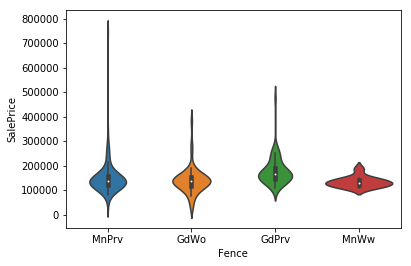

In [74]:
sns.violinplot(train["Fence"], train["SalePrice"])

In [75]:
# 因为总共有5个类型，然而可以统计出来的类型一共只有4类，因此可以断定最后一类NA用空值代替
train["Fence"]=train["Fence"].fillna("None")

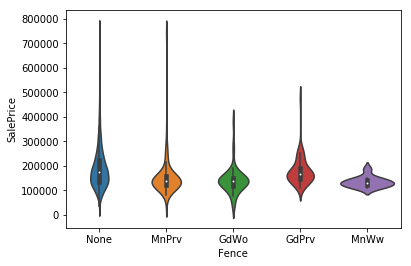

In [76]:
# 回看填充后的数据分布
sns.violinplot(train["Fence"], train["SalePrice"])

### 1.10 MiscFeature的填充
- Miscellaneous feature not covered in other categories，其余特征。
- Elev：Elevator
- Gar2：2nd Garage (if not described in garage section)
- Othr：Other
- Shed：Shed (over 100 SF)
- TenC：Tennis Court
- NA：None

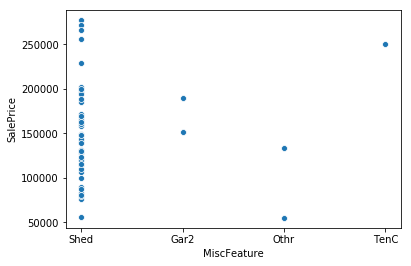

In [77]:
sns.scatterplot("MiscFeature", "SalePrice", data=train)

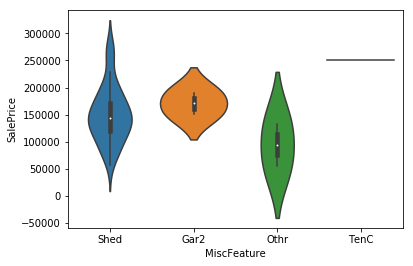

In [78]:
sns.violinplot(train["MiscFeature"], train["SalePrice"])

In [79]:
# 因为MiscFeature本来有5类，然而只统计出4类，因此可以断定第五类NA是空值
train["MiscFeature"]=train["MiscFeature"].fillna("None")

In [80]:
# getnullcount() # 没有数据了，所以报错。

In [81]:
train.shape

(1460, 82)

- 新一轮数据填充完毕。
- 保存数据。

In [82]:
train.to_csv('./data/train_1.csv')

## 2 模型训练部分
- 数据分析完成了，需要开始机器学习训练了。
- 需要考虑各种单独的模型的各自表现后，筛选出表现较好的模型，并进行集成学习。单独的模型包括：

- 1.线性回归类模型
    - 1.1 朴素线性回归
    - 1.2 基于L1的线性回归   
    - 1.3 基于L2的线性回归 
    - 1.4 ElasticNet（弹性网络）
    
- 2.树回归-CART
    - 2.1 CART
    - 2.2 RF
    - 2.3 AdaBoost
    - 2.4 GBDT--XGBoost--lightGBM
    
- 3.SVM类型
    - 3.1SVR
    
- 4.神经网络
    - 4.1FC神经网络

- 5.集成学习
    - 5.1 Stacking Ensemble

## 2.1 数据集的准备

In [83]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

In [84]:
new_train = pd.read_csv("./data/train_1.csv")
y = new_train["SalePrice"]
train1 = new_train.drop(["Id", "SalePrice"], axis=1)
X = pd.get_dummies(train1).reset_index(drop=True)

In [85]:
X.head()

,Unnamed: 0,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,0,0,1,0,0,0,0,1,0
1,1,20,80.0,9600,6,8,1976,1976,0.0,978,...,0,0,0,1,0,0,0,0,1,0
2,2,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,0,0,1,0,0,0,0,1,0
3,3,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,0,0,1,1,0,0,0,0,0
4,4,60,84.0,14260,8,5,2000,2000,350.0,655,...,0,0,0,1,0,0,0,0,1,0


In [86]:
X['Unnamed: 0'].head()

0    0
1    1
2    2
3    3
4    4
Name: Unnamed: 0, dtype: int64

In [87]:
X =X.drop(['Unnamed: 0'], axis=1)

In [88]:
X.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,0,0,1,0,0,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,0,0,0,1,0,0,0,0,1,0
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,0,0,0,1,0,0,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,0,0,0,1,1,0,0,0,0,0
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,0,0,0,1,0,0,0,0,1,0


In [89]:
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=123)

## 2.2 基础线性回归

In [90]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [91]:
lm = LinearRegression()

In [92]:
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [93]:
def benchmark(model):
    pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, pred))
    logrmse = np.sqrt(mean_squared_error(np.log(y_test), np.log(pred)))
    print("RMSE: {} \nLOGRMSE: {}".format(rmse, logrmse))
    return rmse, logrmse

In [94]:
benchmark(lm)

RMSE: 24973.913406556367 
LOGRMSE: 0.12627809622157873


(24973.913406556367, 0.12627809622157873)

## 2.3 带规模化预处理的基础线性回归
- StandardScaler-处理成标准正态分布（难以改变数据的偏度）

In [95]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler

In [96]:
lm_model = make_pipeline(RobustScaler(), LinearRegression())

In [97]:
lm_model.fit(X_train, y_train)

Pipeline(memory=None,
     steps=[('robustscaler', RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True)), ('linearregression', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False))])

In [98]:
benchmark(lm_model)

RMSE: 24973.91340655596 
LOGRMSE: 0.12627809622156672


(24973.91340655596, 0.12627809622156672)

## 2.4 LassoRegression
### 2.4.1 原始Lasso

In [99]:
from sklearn.linear_model import Lasso

In [100]:
lasso_model = Lasso(alpha=1,random_state=123,max_iter=3000)

In [101]:
lasso_model.fit(X_train, y_train)

Lasso(alpha=1, copy_X=True, fit_intercept=True, max_iter=3000,
   normalize=False, positive=False, precompute=False, random_state=123,
   selection='cyclic', tol=0.0001, warm_start=False)

In [102]:
benchmark(lasso_model)

RMSE: 24784.837851375352 
LOGRMSE: 0.12580415715130433


(24784.837851375352, 0.12580415715130433)

### 2.4.2 pipeline Lasso

In [103]:
lasso_model_pipe = make_pipeline(RobustScaler(), Lasso(alpha=10, max_iter = 3000, random_state=123))

In [104]:
lasso_model_pipe.fit(X_train, y_train)

Pipeline(memory=None,
     steps=[('robustscaler', RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True)), ('lasso', Lasso(alpha=10, copy_X=True, fit_intercept=True, max_iter=3000,
   normalize=False, positive=False, precompute=False, random_state=123,
   selection='cyclic', tol=0.0001, warm_start=False))])

In [105]:
benchmark(lasso_model_pipe)

RMSE: 24713.133694963697 
LOGRMSE: 0.1217752189483346


(24713.133694963697, 0.1217752189483346)

### 2.4.3 Lasso找出最佳参数

In [106]:
from sklearn.model_selection import KFold

In [107]:
kfolds = KFold(n_splits=10, shuffle=True, random_state=123)

In [108]:
from sklearn.linear_model import LassoCV
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning) 

In [109]:
l_alphas = np.logspace(-10, 2.8, 150)

In [110]:
def lasso_train_test(alpha):
    lasso_model =  make_pipeline(RobustScaler(), LassoCV(alphas=[alpha], cv=kfolds))
    lasso_model.fit(X_train, y_train)
    r = benchmark(lasso_model)
    return r[1]

In [111]:
scores = []
for k in l_alphas:
    scores.append(lasso_train_test(k))

RMSE: 24910.987078806724 
LOGRMSE: 0.12669462621586886
RMSE: 24910.987079200255 
LOGRMSE: 0.12669462621633493
RMSE: 24910.9870796798 
LOGRMSE: 0.12669462621690253
RMSE: 24910.987080264244 
LOGRMSE: 0.12669462621759447
RMSE: 24910.987080976534 
LOGRMSE: 0.1266946262184375
RMSE: 24910.98708184463 
LOGRMSE: 0.12669462621946526
RMSE: 24910.98708290258 
LOGRMSE: 0.12669462622071764
RMSE: 24910.987084191926 
LOGRMSE: 0.12669462622224384
RMSE: 24910.987085763267 
LOGRMSE: 0.12669462622410385
RMSE: 24910.98708767836 
LOGRMSE: 0.12669462622637093
RMSE: 24910.98709001231 
LOGRMSE: 0.12669462622913388
RMSE: 24910.98709285675 
LOGRMSE: 0.12669462623250094
RMSE: 24910.987096323333 
LOGRMSE: 0.1266946262366046
RMSE: 24910.987100548125 
LOGRMSE: 0.12669462624160568
RMSE: 24910.987105697033 
LOGRMSE: 0.12669462624770064
RMSE: 24910.987111972143 
LOGRMSE: 0.12669462625512884
RMSE: 24910.98711961975 
LOGRMSE: 0.12669462626418185
RMSE: 24910.987128940098 
LOGRMSE: 0.1266946262752148
RMSE: 24910.987140299

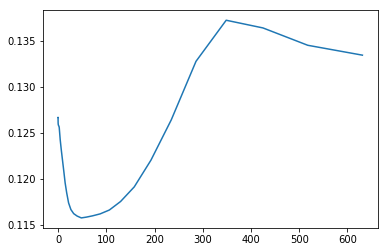

In [112]:
plt.plot(l_alphas, scores)

In [113]:
# 自动筛选
lasso_model2 = make_pipeline(RobustScaler(), LassoCV(
    alphas=l_alphas, cv=kfolds
)).fit(X_train, y_train)

In [114]:
benchmark(lasso_model2)

RMSE: 25431.111829508856 
LOGRMSE: 0.12203176481488646


(25431.111829508856, 0.12203176481488646)

In [115]:
lasso_model2.steps[1][1].alpha_

192.5589718453296

## 2.5 RidgeRegression
### 2.5.1 原始Ridge

In [116]:
from sklearn.linear_model import Ridge

In [117]:
ridge_model = Ridge(alpha=10, max_iter=3000, random_state=123)

In [118]:
ridge_model.fit(X_train, y_train)

Ridge(alpha=10, copy_X=True, fit_intercept=True, max_iter=3000,
   normalize=False, random_state=123, solver='auto', tol=0.001)

In [119]:
benchmark(ridge_model)

RMSE: 25891.109899200143 
LOGRMSE: 0.1308067788196696


(25891.109899200143, 0.1308067788196696)

### 2.5.2 带预处理的Ridge

In [120]:
ridge_model_pipe = make_pipeline(RobustScaler(), Ridge(alpha=100, max_iter=3000, random_state=123))

In [121]:
ridge_model_pipe.fit(X_train, y_train)

Pipeline(memory=None,
     steps=[('robustscaler', RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True)), ('ridge', Ridge(alpha=100, copy_X=True, fit_intercept=True, max_iter=3000,
   normalize=False, random_state=123, solver='auto', tol=0.001))])

In [122]:
benchmark(ridge_model_pipe)

RMSE: 26907.894016511178 
LOGRMSE: 0.12385966794851827


(26907.894016511178, 0.12385966794851827)

### 2.5.2 带CV的Ridge回归

In [123]:
from sklearn.model_selection import KFold
from sklearn.linear_model import RidgeCV

In [124]:
kfolds = KFold(n_splits=10, shuffle=True, random_state=123)

In [125]:
r_alphas = [0.01, 0.1, 1, 3, 5, 7, 10, 100]

In [126]:
ridge_model_cv = make_pipeline(RobustScaler(), RidgeCV(alphas=r_alphas, cv=kfolds))

In [127]:
ridge_model_cv.fit(X_train, y_train)

/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Pipeline(memory=None,
     steps=[('robustscaler', RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True)), ('ridgecv', RidgeCV(alphas=array([1.e-02, 1.e-01, 1.e+00, 3.e+00, 5.e+00, 7.e+00, 1.e+01, 1.e+02]),
    cv=KFold(n_splits=10, random_state=123, shuffle=True),
    fit_intercept=True, gcv_mode=None, normalize=False, scoring=None,
    store_cv_values=False))])

In [128]:
benchmark(ridge_model_cv)

RMSE: 26907.894016511178 
LOGRMSE: 0.12385966794851827


(26907.894016511178, 0.12385966794851827)

### 2.5.3 画出alphas与log rmse的关系图
- 寻找最佳系数

In [129]:
r_alphas = [
    .0001, .0003, .0005, .0007, .0009, .01, .05, 0.1, 0.3, 1, 3, 5, 7, 10, 20, 30, 50, 70, 80
]

In [130]:
def ridge_train_test(alpha):
    m=make_pipeline(RobustScaler(),RidgeCV(alphas=[alpha],cv=kfolds))
    m.fit(X_train,y_train)
    return benchmark(m)[1]

In [131]:
scores = []
for a in r_alphas:
    scores.append(ridge_train_test(a))

/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.96924941271 
LOGRMSE: 0.12627904574614068


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.080818491773 
LOGRMSE: 0.1262809158011166


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.192243121473 
LOGRMSE: 0.1262827479190089


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.303534436083 
LOGRMSE: 0.12628454294738034


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.414703912702 
LOGRMSE: 0.126286301714575


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24979.528134383796 
LOGRMSE: 0.12633870541445757


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25012.204406896646 
LOGRMSE: 0.1264170991394407


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25072.955925340022 
LOGRMSE: 0.12658566764241783


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25328.501950347778 
LOGRMSE: 0.12762387547257256


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25776.231528192835 
LOGRMSE: 0.12993386266803725
RMSE: 26017.008304352825 
LOGRMSE: 0.1313335955487699
RMSE: 26002.202070522966 
LOGRMSE: 0.13104277583538734
RMSE: 25955.05131666002 
LOGRMSE: 0.13050748908122117
RMSE: 25890.568567439033 
LOGRMSE: 0.1297114290664528
RMSE: 25816.15857835702 
LOGRMSE: 0.12775697253955362
RMSE: 25873.843585167848 
LOGRMSE: 0.12652048146318925
RMSE: 26130.63901498298 
LOGRMSE: 0.12506392340075137
RMSE: 26440.645901425924 
LOGRMSE: 0.124308039003794
RMSE: 26598.29289487178 
LOGRMSE: 0.1240877083105839


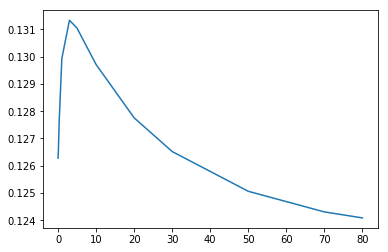

In [132]:
plt.plot(r_alphas, scores)

### 2.5.4 RidgeCV 自动筛选参数

In [133]:
# 开始点和结束点是10的幂，-10代表10的-10次方，2.8代表10的2.8次方。150代表150个点。
n_alphas = np.logspace(-10, 2.8, 150)

In [134]:
n_alphas

array([1.00000000e-10, 1.21872590e-10, 1.48529282e-10, 1.81016482e-10,
       2.20609475e-10, 2.68862481e-10, 3.27669668e-10, 3.99339511e-10,
       4.86685405e-10, 5.93136107e-10, 7.22870335e-10, 8.80980799e-10,
       1.07367412e-09, 1.30851445e-09, 1.59472045e-09, 1.94352711e-09,
       2.36862683e-09, 2.88670686e-09, 3.51810441e-09, 4.28760496e-09,
       5.22541521e-09, 6.36834885e-09, 7.76127168e-09, 9.45886280e-09,
       1.15277611e-08, 1.40491810e-08, 1.71221007e-08, 2.08671476e-08,
       2.54313332e-08, 3.09938244e-08, 3.77729765e-08, 4.60349047e-08,
       5.61039306e-08, 6.83753132e-08, 8.33307651e-08, 1.01557362e-07,
       1.23770587e-07, 1.50842420e-07, 1.83835563e-07, 2.24045162e-07,
       2.73049642e-07, 3.32772670e-07, 4.05558671e-07, 4.94264856e-07,
       6.02373381e-07, 7.34128040e-07, 8.94700855e-07, 1.09039510e-06,
       1.32889275e-06, 1.61955601e-06, 1.97379486e-06, 2.40551491e-06,
       2.93166332e-06, 3.57289402e-06, 4.35437848e-06, 5.30679382e-06,
      

In [135]:
auto_scores = []
for a in n_alphas:
    auto_scores.append(ridge_train_test(a))

/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.335856010206 
LOGRMSE: 0.1262783003343975
RMSE: 24974.239448052886 
LOGRMSE: 0.12627818234001378


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.20398210463 
LOGRMSE: 0.12627827924889984
RMSE: 24974.175107685656 
LOGRMSE: 0.1262781620839689


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.14027025891 
LOGRMSE: 0.1262783065310664
RMSE: 24974.095290827583 
LOGRMSE: 0.1262782048979313


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.078666478017 
LOGRMSE: 0.12627821552723872
RMSE: 24974.01441591913 
LOGRMSE: 0.1262780796974432


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.01263485758 
LOGRMSE: 0.12627815259550823
RMSE: 24974.000536694162 
LOGRMSE: 0.12627813650954153


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.987404574917 
LOGRMSE: 0.1262781436953431
RMSE: 24973.963151472457 
LOGRMSE: 0.12627812146578296


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.950661377396 
LOGRMSE: 0.12627810467034542
RMSE: 24973.95052059733 
LOGRMSE: 0.12627811489527146


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.947765917903 
LOGRMSE: 0.1262781272732384
RMSE: 24973.937767525913 
LOGRMSE: 0.12627810443735313


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.93320817324 
LOGRMSE: 0.12627810770166947
RMSE: 24973.929088604236 
LOGRMSE: 0.12627810882259852


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.929183855766 
LOGRMSE: 0.12627811134624053
RMSE: 24973.92574559266 
LOGRMSE: 0.12627810426944305


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.92398909476 
LOGRMSE: 0.12627810480458795
RMSE: 24973.92184718261 
LOGRMSE: 0.12627810319774144


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.919316110456 
LOGRMSE: 0.1262781008221659
RMSE: 24973.918510464973 
LOGRMSE: 0.1262780990870443


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.91738460375 
LOGRMSE: 0.12627809926118547
RMSE: 24973.91682058698 
LOGRMSE: 0.12627809770891907


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.916262123268 
LOGRMSE: 0.12627810003201748
RMSE: 24973.91567073641 
LOGRMSE: 0.1262780980216981


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.915445543662 
LOGRMSE: 0.12627809818455504
RMSE: 24973.91479623559 
LOGRMSE: 0.12627809730115852


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.91470754223 
LOGRMSE: 0.12627809700908463
RMSE: 24973.91441136579 
LOGRMSE: 0.12627809703545095


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.91411962148 
LOGRMSE: 0.1262780969338596
RMSE: 24973.914119243418 
LOGRMSE: 0.12627809725917144


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.914031909542 
LOGRMSE: 0.12627809735256962
RMSE: 24973.91389676039 
LOGRMSE: 0.12627809730423417


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.9138810541 
LOGRMSE: 0.12627809769724663
RMSE: 24973.91382562215 
LOGRMSE: 0.12627809793686137


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.913756128466 
LOGRMSE: 0.12627809813216753
RMSE: 24973.913717397656 
LOGRMSE: 0.12627809845957744


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.91374776065 
LOGRMSE: 0.12627809892362937
RMSE: 24973.913726688217 
LOGRMSE: 0.1262780994659533


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.913745376438 
LOGRMSE: 0.1262781001331234
RMSE: 24973.913774843422 
LOGRMSE: 0.12627810098496062


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.913822514303 
LOGRMSE: 0.12627810202489723
RMSE: 24973.91386101622 
LOGRMSE: 0.1262781032076572


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.913965696185 
LOGRMSE: 0.1262781048053836
RMSE: 24973.914054999557 
LOGRMSE: 0.1262781066431598


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.914183336183 
LOGRMSE: 0.1262781089248044
RMSE: 24973.914341417298 
LOGRMSE: 0.12627811170393266


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.91453362532 
LOGRMSE: 0.12627811508387551
RMSE: 24973.91477236481 
LOGRMSE: 0.1262781191857742


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.915060521074 
LOGRMSE: 0.1262781242043993
RMSE: 24973.915415279775 
LOGRMSE: 0.1262781303205201


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.915851292928 
LOGRMSE: 0.12627813777795316
RMSE: 24973.916381460545 
LOGRMSE: 0.1262781468654201


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.91702784157 
LOGRMSE: 0.12627815793583563
RMSE: 24973.917815255536 
LOGRMSE: 0.12627817142289116


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.918777215815 
LOGRMSE: 0.12627818786162084
RMSE: 24973.91995027809 
LOGRMSE: 0.12627820789149263


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.921379598312 
LOGRMSE: 0.1262782322979072
RMSE: 24973.923122411838 
LOGRMSE: 0.12627826203472742


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.92524631266 
LOGRMSE: 0.12627829826265735
RMSE: 24973.92783539623 
LOGRMSE: 0.12627834239639307


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.930989611603 
LOGRMSE: 0.1262783961528735
RMSE: 24973.934834357755 
LOGRMSE: 0.12627846162524384


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.939519929547 
LOGRMSE: 0.1262785413566192
RMSE: 24973.945229989906 
LOGRMSE: 0.126278638434614


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.95218852843 
LOGRMSE: 0.1262787566077105
RMSE: 24973.96066840516 
LOGRMSE: 0.12627890042434656


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.971001712285 
LOGRMSE: 0.12627907539393657
RMSE: 24973.983593433724 
LOGRMSE: 0.1262792881849341


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24973.998936800934 
LOGRMSE: 0.12627954685370862
RMSE: 24974.01763227147 
LOGRMSE: 0.12627986111482373


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.04041116954 
LOGRMSE: 0.1262802426552038
RMSE: 24974.068164024506 
LOGRMSE: 0.1262807054931358


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.101974990914 
LOGRMSE: 0.12628126638309556
RMSE: 24974.1431635585 
LOGRMSE: 0.126281945259676


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.193335717224 
LOGRMSE: 0.12628276571014008
RMSE: 24974.254445378272 
LOGRMSE: 0.12628375545028014


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.32886976026 
LOGRMSE: 0.12628494676387544
RMSE: 24974.419500854598 
LOGRMSE: 0.12628637684158453


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.529857261226 
LOGRMSE: 0.12628808792250168
RMSE: 24974.664221395306 
LOGRMSE: 0.12629012710035453


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24974.82780961456 
LOGRMSE: 0.12629254560607409
RMSE: 24975.02698538049 
LOGRMSE: 0.1262953973211845


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24975.269531602124 
LOGRMSE: 0.12629873623083107
RMSE: 24975.565007050933 
LOGRMSE: 0.1263026125031164


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24975.92522726484 
LOGRMSE: 0.1263070669347897
RMSE: 24976.364935790385 
LOGRMSE: 0.12631212368546188


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24976.902772394224 
LOGRMSE: 0.12631778163052493
RMSE: 24977.562708562946 
LOGRMSE: 0.12632400540212826


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24978.37621257231 
LOGRMSE: 0.12633071835807988
RMSE: 24979.38552997298 
LOGRMSE: 0.1263378013543697


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24980.64860991614 
LOGRMSE: 0.1263451031710564
RMSE: 24982.246341514805 
LOGRMSE: 0.126352470358112


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24984.292820120267 
LOGRMSE: 0.12635980538201522
RMSE: 24986.94923549034 
LOGRMSE: 0.1263671612060944


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 24990.44152907274 
LOGRMSE: 0.1263748766741887
RMSE: 24995.081081271284 
LOGRMSE: 0.12638374945741931


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25001.286306305312 
LOGRMSE: 0.1263952318739452
RMSE: 25009.601239978234 
LOGRMSE: 0.1264116208793032


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25020.705305626405 
LOGRMSE: 0.1264361997196143
RMSE: 25035.406993329107 
LOGRMSE: 0.126473279360379


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25054.61398101904 
LOGRMSE: 0.12652808813378177
RMSE: 25079.274149649627 
LOGRMSE: 0.12660647338889852


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25110.28663924281 
LOGRMSE: 0.12671441237991232
RMSE: 25148.38942403277 
LOGRMSE: 0.12685737859872795


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25194.038402466413 
LOGRMSE: 0.1270396625020294
RMSE: 25247.299799973393 
LOGRMSE: 0.1272637807770423


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25307.7791748189 
LOGRMSE: 0.1275301012784942
RMSE: 25374.603983494882 
LOGRMSE: 0.12783674727428987


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25446.46312558856 
LOGRMSE: 0.12817973641978175
RMSE: 25521.690785001854 
LOGRMSE: 0.12855320087785724


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25598.370316573364 
LOGRMSE: 0.12894948779336912
RMSE: 25674.432821786584 
LOGRMSE: 0.12935900287322916


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25747.735512778185 
LOGRMSE: 0.1297698335144531
RMSE: 25816.12201787358 
LOGRMSE: 0.130167403817615


/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE: 25877.481631615585 
LOGRMSE: 0.1305345543595018
RMSE: 25929.829150389058 
LOGRMSE: 0.13085239381105326
RMSE: 25971.41868424518 
LOGRMSE: 0.13110200714384468
RMSE: 26000.88805776479 
LOGRMSE: 0.1312667227531881
RMSE: 26017.414065008303 
LOGRMSE: 0.1313343312193116
RMSE: 26020.85119121686 
LOGRMSE: 0.13129859140948494
RMSE: 26011.830321202953 
LOGRMSE: 0.13115960125438256
RMSE: 25991.805825995503 
LOGRMSE: 0.13092302661902866
RMSE: 25963.05214035757 
LOGRMSE: 0.13059855963932354
RMSE: 25928.618426004057 
LOGRMSE: 0.13019815183232164
RMSE: 25892.25025971824 
LOGRMSE: 0.12973450327585098
RMSE: 25858.283048145004 
LOGRMSE: 0.12922007359610682
RMSE: 25831.507851857637 
LOGRMSE: 0.12866664610298817
RMSE: 25817.010412559917 
LOGRMSE: 0.12808532811530565
RMSE: 25819.989133581075 
LOGRMSE: 0.12748684647342137
RMSE: 25845.56484578193 
LOGRMSE: 0.12688206601376395
RMSE: 25898.600227923158 
LOGRMSE: 0.12628274268392098
RMSE: 25983.546991372652 
LOGRMSE: 0.12570253861398778
RMSE: 26104.3346583

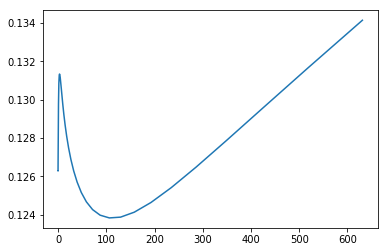

In [136]:
plt.plot(n_alphas, auto_scores)

- 上图可看出最佳的alpha在100多一点
- 接下来我们用RidgeCV自动筛选出最优的alpha

In [137]:
ridge_model_auto = make_pipeline(RobustScaler(), RidgeCV(
    alphas = n_alphas, cv=kfolds
)).fit(X_train, y_train)

/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [138]:
benchmark(ridge_model_auto)

RMSE: 25983.546991372652 
LOGRMSE: 0.12570253861398778


(25983.546991372652, 0.12570253861398778)

In [139]:
# 最佳alpha
ridge_model_auto.steps[1][1].alpha_

39.56538865832277

### 思考： 为什么不是100多呢？

## 2.6 ElasticNet 

In [140]:
from sklearn.linear_model import ElasticNetCV

In [141]:
e_l1ratio = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 1]

In [142]:
e_alphas = n_alphas

In [143]:
def elastic_train_test(alpha, l1ratio):
    e_model = make_pipeline(RobustScaler(), ElasticNetCV(alphas=[alpha], l1_ratio=[l1ratio]))
    e_model.fit(X_train, y_train)
    r = benchmark1(e_model)
    return r[1]

In [144]:
elastic_model = make_pipeline(RobustScaler(), ElasticNetCV(alphas=e_alphas, l1_ratio=e_l1ratio)).fit(X_train, y_train)

In [145]:
benchmark(elastic_model)

RMSE: 25431.111829508856 
LOGRMSE: 0.12203176481488646


(25431.111829508856, 0.12203176481488646)

In [146]:
elastic_model.steps[1][1].alpha_

192.5589718453296

In [147]:
elastic_model.steps[1][1].l1_ratio_

1.0

In [148]:
?make_pipeline

## XGboost

In [ ]:
xg_reg=xgb.XGBRegressor(objective='reg:linear',
                        colsample_bytree=0.7,
                        learning_rate=0.01,
                        max_depth=3,
                        n_estimators=3000,
                        subsample=0.7,
                        reg_alpha=0.0006,
                        nthread=6)
xg_reg.fit(X_train,y_train)

In [ ]:
benchmark1(xg_reg)

## ANN

In [149]:
import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras import metrics
from keras import backend as K
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

Using TensorFlow backend.


In [153]:
?KerasRegressor

In [151]:
def create_model():
    model = Sequential()
    model.add(Dense(10, input_dim=X_train.shape[1], activation="relu"))
    model.add(Dense(300,activation="relu")) 
    model.add(Dropout(0.2))
    model.add(Dense(50, activation="relu"))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

In [161]:
batch_size =32   # 这里只能是整数，没法传列表
epochs = 3000
ann_model = make_pipeline(RobustScaler(),
                         KerasRegressor(build_fn=create_model, batch_size=batch_size,epochs=epochs, verbose=0))


In [162]:
ann_model.fit(X_train, y_train)

Pipeline(memory=None,
     steps=[('robustscaler', RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True)), ('kerasregressor', <keras.wrappers.scikit_learn.KerasRegressor object at 0x7f555c194b38>)])

In [163]:
benchmark(ann_model)

RMSE: 25319.965481746498 
LOGRMSE: 0.13645979602719047


(25319.965481746498, 0.13645979602719047)

In [164]:
class grid():
    def __init__(self,model):
        self.model = model
    
    def grid_get(self, X, y, param_grid):
        grid_search = GridSearchCV(self.model, param_grid, cv=5, scoring="neg_mean_squared_error")
        grid_search.fit(X,y)
        print(grid_search.best_params_, np.sqrt(-grid_search.best_score_))
        grid_search.cv_results_['mean_test_score'] = np.sqrt(-grid_search.cv_results_['mean_test_score'])
        print(pd.DataFrame(grid_search.cv_results_)[['params','mean_test_score','std_test_score']])

In [168]:
batch_size = [32,64]   
epochs = [2500,3000,3500]
grid(KerasRegressor(build_fn=create_model)).grid_get(X_train,y_train, dict(batch_size=batch_size,epochs=epochs))

Epoch 1/2500
934/934 [==============================] - 0s 528us/step - loss: 37771900204.4026
Epoch 2/2500
934/934 [==============================] - 0s 50us/step - loss: 30406056792.2570
Epoch 3/2500
934/934 [==============================] - 0s 49us/step - loss: 9294281885.3276
Epoch 4/2500
934/934 [==============================] - 0s 49us/step - loss: 6646676182.8865
Epoch 5/2500
934/934 [==============================] - 0s 51us/step - loss: 5355614749.8758
Epoch 6/2500
934/934 [==============================] - 0s 50us/step - loss: 4721388431.5546
Epoch 7/2500
934/934 [==============================] - 0s 50us/step - loss: 4228407783.8801
Epoch 8/2500
934/934 [==============================] - 0s 50us/step - loss: 4026923439.9657
Epoch 9/2500
934/934 [==============================] - 0s 51us/step - loss: 3705222395.0664
Epoch 10/2500
934/934 [==============================] - 0s 50us/step - loss: 3616647990.5439
Epoch 11/2500
934/934 [==============================] - 0s 49us/s

934/934 [==============================] - 0s 50us/step - loss: 1517187709.3961
Epoch 175/2500
934/934 [==============================] - 0s 51us/step - loss: 1518443853.9443
Epoch 176/2500
934/934 [==============================] - 0s 50us/step - loss: 1622773316.7966
Epoch 177/2500
934/934 [==============================] - 0s 49us/step - loss: 1610597079.4347
Epoch 178/2500
934/934 [==============================] - 0s 50us/step - loss: 1590628088.0514
Epoch 179/2500
934/934 [==============================] - 0s 49us/step - loss: 1610422256.3769
Epoch 180/2500
934/934 [==============================] - 0s 49us/step - loss: 1475868457.5246
Epoch 181/2500
934/934 [==============================] - 0s 49us/step - loss: 1508796053.9957
Epoch 182/2500
934/934 [==============================] - 0s 49us/step - loss: 1539714645.3790
Epoch 183/2500
934/934 [==============================] - 0s 50us/step - loss: 1554699396.3854
Epoch 184/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 49us/step - loss: 1203897037.5332
Epoch 347/2500
934/934 [==============================] - 0s 49us/step - loss: 1199395983.0236
Epoch 348/2500
934/934 [==============================] - 0s 48us/step - loss: 1138104872.0514
Epoch 349/2500
934/934 [==============================] - 0s 48us/step - loss: 1166381764.2484
Epoch 350/2500
934/934 [==============================] - 0s 49us/step - loss: 1297128285.7388
Epoch 351/2500
934/934 [==============================] - 0s 50us/step - loss: 1119832427.8544
Epoch 352/2500
934/934 [==============================] - 0s 48us/step - loss: 1133221082.5182
Epoch 353/2500
934/934 [==============================] - 0s 48us/step - loss: 1157072317.3961
Epoch 354/2500
934/934 [==============================] - 0s 48us/step - loss: 1213021350.5096
Epoch 355/2500
934/934 [==============================] - 0s 49us/step - loss: 1286885533.3276
Epoch 356/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 51us/step - loss: 895610794.2784
Epoch 520/2500
934/934 [==============================] - 0s 49us/step - loss: 940290487.5032
Epoch 521/2500
934/934 [==============================] - 0s 50us/step - loss: 826014362.3126
Epoch 522/2500
934/934 [==============================] - 0s 49us/step - loss: 881729397.7216
Epoch 523/2500
934/934 [==============================] - 0s 49us/step - loss: 854555898.1756
Epoch 524/2500
934/934 [==============================] - 0s 51us/step - loss: 959174433.0278
Epoch 525/2500
934/934 [==============================] - 0s 49us/step - loss: 847152686.8009
Epoch 526/2500
934/934 [==============================] - 0s 50us/step - loss: 882402589.5675
Epoch 527/2500
934/934 [==============================] - 0s 49us/step - loss: 879201175.9829
Epoch 528/2500
934/934 [==============================] - 0s 49us/step - loss: 837288859.7516
Epoch 529/2500
934/934 [==============================] - 0s 48us/step - lo

934/934 [==============================] - 0s 49us/step - loss: 793075473.0621
Epoch 694/2500
934/934 [==============================] - 0s 50us/step - loss: 854216799.1092
Epoch 695/2500
934/934 [==============================] - 0s 50us/step - loss: 778402282.9636
Epoch 696/2500
934/934 [==============================] - 0s 49us/step - loss: 722585429.7901
Epoch 697/2500
934/934 [==============================] - 0s 49us/step - loss: 771353070.1842
Epoch 698/2500
934/934 [==============================] - 0s 50us/step - loss: 739313579.6831
Epoch 699/2500
934/934 [==============================] - 0s 49us/step - loss: 861690297.2505
Epoch 700/2500
934/934 [==============================] - 0s 49us/step - loss: 819436730.2099
Epoch 701/2500
934/934 [==============================] - 0s 50us/step - loss: 791852564.6767
Epoch 702/2500
934/934 [==============================] - 0s 50us/step - loss: 734747771.4775
Epoch 703/2500
934/934 [==============================] - 0s 50us/step - lo

934/934 [==============================] - 0s 50us/step - loss: 638377986.4668
Epoch 868/2500
934/934 [==============================] - 0s 49us/step - loss: 639190253.4989
Epoch 869/2500
934/934 [==============================] - 0s 49us/step - loss: 678000409.2163
Epoch 870/2500
934/934 [==============================] - 0s 49us/step - loss: 620592098.3298
Epoch 871/2500
934/934 [==============================] - 0s 48us/step - loss: 644458571.8373
Epoch 872/2500
934/934 [==============================] - 0s 49us/step - loss: 613283545.3533
Epoch 873/2500
934/934 [==============================] - 0s 50us/step - loss: 783053289.7302
Epoch 874/2500
934/934 [==============================] - 0s 51us/step - loss: 726761691.4775
Epoch 875/2500
934/934 [==============================] - 0s 50us/step - loss: 718174734.3212
Epoch 876/2500
934/934 [==============================] - 0s 50us/step - loss: 691318231.9829
Epoch 877/2500
934/934 [==============================] - 0s 49us/step - lo

934/934 [==============================] - 0s 50us/step - loss: 530743009.7816
Epoch 1041/2500
934/934 [==============================] - 0s 50us/step - loss: 537576798.0128
Epoch 1042/2500
934/934 [==============================] - 0s 50us/step - loss: 684698084.7623
Epoch 1043/2500
934/934 [==============================] - 0s 50us/step - loss: 624890592.4797
Epoch 1044/2500
934/934 [==============================] - 0s 50us/step - loss: 577621550.8694
Epoch 1045/2500
934/934 [==============================] - 0s 50us/step - loss: 531172758.9208
Epoch 1046/2500
934/934 [==============================] - 0s 50us/step - loss: 484211589.0707
Epoch 1047/2500
934/934 [==============================] - 0s 50us/step - loss: 508276767.3833
Epoch 1048/2500
934/934 [==============================] - 0s 50us/step - loss: 505531888.3769
Epoch 1049/2500
934/934 [==============================] - 0s 51us/step - loss: 563977361.2677
Epoch 1050/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 48us/step - loss: 571691929.7302
Epoch 1213/2500
934/934 [==============================] - 0s 53us/step - loss: 544819455.4176
Epoch 1214/2500
934/934 [==============================] - 0s 57us/step - loss: 561574260.2484
Epoch 1215/2500
934/934 [==============================] - 0s 58us/step - loss: 515466318.9379
Epoch 1216/2500
934/934 [==============================] - 0s 55us/step - loss: 526262152.6338
Epoch 1217/2500
934/934 [==============================] - 0s 50us/step - loss: 596789627.0664
Epoch 1218/2500
934/934 [==============================] - 0s 50us/step - loss: 536638980.6595
Epoch 1219/2500
934/934 [==============================] - 0s 53us/step - loss: 523336740.7623
Epoch 1220/2500
934/934 [==============================] - 0s 50us/step - loss: 450742082.3983
Epoch 1221/2500
934/934 [==============================] - 0s 50us/step - loss: 450926963.7859
Epoch 1222/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 50us/step - loss: 465874517.9272
Epoch 1385/2500
934/934 [==============================] - 0s 49us/step - loss: 398133582.3212
Epoch 1386/2500
934/934 [==============================] - 0s 47us/step - loss: 404904241.8844
Epoch 1387/2500
934/934 [==============================] - 0s 49us/step - loss: 453874546.8437
Epoch 1388/2500
934/934 [==============================] - 0s 49us/step - loss: 456160066.8094
Epoch 1389/2500
934/934 [==============================] - 0s 50us/step - loss: 411348009.4904
Epoch 1390/2500
934/934 [==============================] - 0s 49us/step - loss: 414073153.8501
Epoch 1391/2500
934/934 [==============================] - 0s 51us/step - loss: 434798971.1692
Epoch 1392/2500
934/934 [==============================] - 0s 49us/step - loss: 452087734.3897
Epoch 1393/2500
934/934 [==============================] - 0s 48us/step - loss: 513585872.1028
Epoch 1394/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 49us/step - loss: 447047067.1349
Epoch 1557/2500
934/934 [==============================] - 0s 48us/step - loss: 466738720.3426
Epoch 1558/2500
934/934 [==============================] - 0s 50us/step - loss: 442707866.7666
Epoch 1559/2500
934/934 [==============================] - 0s 49us/step - loss: 419429963.4090
Epoch 1560/2500
934/934 [==============================] - 0s 49us/step - loss: 429486184.4968
Epoch 1561/2500
934/934 [==============================] - 0s 49us/step - loss: 346836963.2548
Epoch 1562/2500
934/934 [==============================] - 0s 49us/step - loss: 463200999.5375
Epoch 1563/2500
934/934 [==============================] - 0s 49us/step - loss: 422538776.9422
Epoch 1564/2500
934/934 [==============================] - 0s 49us/step - loss: 420960600.7366
Epoch 1565/2500
934/934 [==============================] - 0s 48us/step - loss: 464775486.0128
Epoch 1566/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 52us/step - loss: 346698353.8330
Epoch 1729/2500
934/934 [==============================] - 0s 52us/step - loss: 366903254.5439
Epoch 1730/2500
934/934 [==============================] - 0s 50us/step - loss: 344171036.4368
Epoch 1731/2500
934/934 [==============================] - 0s 50us/step - loss: 456142694.1328
Epoch 1732/2500
934/934 [==============================] - 0s 49us/step - loss: 444124642.3298
Epoch 1733/2500
934/934 [==============================] - 0s 49us/step - loss: 387178521.8158
Epoch 1734/2500
934/934 [==============================] - 0s 48us/step - loss: 376517764.2484
Epoch 1735/2500
934/934 [==============================] - 0s 49us/step - loss: 380290140.1970
Epoch 1736/2500
934/934 [==============================] - 0s 50us/step - loss: 400987825.4732
Epoch 1737/2500
934/934 [==============================] - 0s 50us/step - loss: 372598171.7859
Epoch 1738/2500
934/934 [==============================] - 0s 48us

934/934 [==============================] - 0s 48us/step - loss: 367811774.6296
Epoch 1901/2500
934/934 [==============================] - 0s 49us/step - loss: 348932675.4261
Epoch 1902/2500
934/934 [==============================] - 0s 49us/step - loss: 342851654.9893
Epoch 1903/2500
934/934 [==============================] - 0s 47us/step - loss: 334567066.7923
Epoch 1904/2500
934/934 [==============================] - 0s 48us/step - loss: 319658862.7152
Epoch 1905/2500
934/934 [==============================] - 0s 48us/step - loss: 351928887.0064
Epoch 1906/2500
934/934 [==============================] - 0s 49us/step - loss: 303025345.4390
Epoch 1907/2500
934/934 [==============================] - 0s 53us/step - loss: 338683836.0600
Epoch 1908/2500
934/934 [==============================] - 0s 48us/step - loss: 375118477.3961
Epoch 1909/2500
934/934 [==============================] - 0s 48us/step - loss: 386443818.6039
Epoch 1910/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 51us/step - loss: 468549426.2270
Epoch 2073/2500
934/934 [==============================] - 0s 49us/step - loss: 509063214.0128
Epoch 2074/2500
934/934 [==============================] - 0s 49us/step - loss: 502554138.3126
Epoch 2075/2500
934/934 [==============================] - 0s 49us/step - loss: 481538356.3512
Epoch 2076/2500
934/934 [==============================] - 0s 47us/step - loss: 457659889.6445
Epoch 2077/2500
934/934 [==============================] - 0s 48us/step - loss: 510441796.8137
Epoch 2078/2500
934/934 [==============================] - 0s 48us/step - loss: 484453302.6124
Epoch 2079/2500
934/934 [==============================] - 0s 48us/step - loss: 447160514.4668
Epoch 2080/2500
934/934 [==============================] - 0s 49us/step - loss: 430488062.8009
Epoch 2081/2500
934/934 [==============================] - 0s 48us/step - loss: 477108571.7516
Epoch 2082/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 49us/step - loss: 402538595.9058
Epoch 2245/2500
934/934 [==============================] - 0s 49us/step - loss: 424633651.2206
Epoch 2246/2500
934/934 [==============================] - 0s 49us/step - loss: 435055749.4818
Epoch 2247/2500
934/934 [==============================] - 0s 49us/step - loss: 479936226.9122
Epoch 2248/2500
934/934 [==============================] - 0s 48us/step - loss: 407600603.5460
Epoch 2249/2500
934/934 [==============================] - 0s 48us/step - loss: 419135474.5353
Epoch 2250/2500
934/934 [==============================] - 0s 48us/step - loss: 405074167.0236
Epoch 2251/2500
934/934 [==============================] - 0s 50us/step - loss: 498141827.8373
Epoch 2252/2500
934/934 [==============================] - 0s 50us/step - loss: 463513560.8223
Epoch 2253/2500
934/934 [==============================] - 0s 48us/step - loss: 417928595.4604
Epoch 2254/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 49us/step - loss: 455210162.9807
Epoch 2417/2500
934/934 [==============================] - 0s 50us/step - loss: 443957747.8715
Epoch 2418/2500
934/934 [==============================] - 0s 50us/step - loss: 447312050.7066
Epoch 2419/2500
934/934 [==============================] - 0s 50us/step - loss: 401088801.8844
Epoch 2420/2500
934/934 [==============================] - 0s 51us/step - loss: 393121386.6210
Epoch 2421/2500
934/934 [==============================] - 0s 49us/step - loss: 342916849.9872
Epoch 2422/2500
934/934 [==============================] - 0s 50us/step - loss: 410817321.3533
Epoch 2423/2500
934/934 [==============================] - 0s 49us/step - loss: 361160251.7173
Epoch 2424/2500
934/934 [==============================] - 0s 49us/step - loss: 392034195.1178
Epoch 2425/2500
934/934 [==============================] - 0s 49us/step - loss: 420340097.6445
Epoch 2426/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 51us/step - loss: 2160463644.9165
Epoch 90/2500
934/934 [==============================] - 0s 50us/step - loss: 2236349125.6188
Epoch 91/2500
934/934 [==============================] - 0s 50us/step - loss: 2213448047.8287
Epoch 92/2500
934/934 [==============================] - 0s 50us/step - loss: 2169797382.0642
Epoch 93/2500
934/934 [==============================] - 0s 50us/step - loss: 2093008132.3854
Epoch 94/2500
934/934 [==============================] - 0s 51us/step - loss: 2217544694.1328
Epoch 95/2500
934/934 [==============================] - 0s 50us/step - loss: 2147292794.9979
Epoch 96/2500
934/934 [==============================] - 0s 49us/step - loss: 2170524224.5482
Epoch 97/2500
934/934 [==============================] - 0s 49us/step - loss: 2094734219.2377
Epoch 98/2500
934/934 [==============================] - 0s 49us/step - loss: 2135773402.4497
Epoch 99/2500
934/934 [==============================] - 0s 49us/step - lo

934/934 [==============================] - 0s 52us/step - loss: 1539625218.6039
Epoch 262/2500
934/934 [==============================] - 0s 49us/step - loss: 1544862057.2505
Epoch 263/2500
934/934 [==============================] - 0s 49us/step - loss: 1553474198.2013
Epoch 264/2500
934/934 [==============================] - 0s 49us/step - loss: 1577676854.8180
Epoch 265/2500
934/934 [==============================] - 0s 50us/step - loss: 1694579742.2869
Epoch 266/2500
934/934 [==============================] - 0s 49us/step - loss: 1542811641.4218
Epoch 267/2500
934/934 [==============================] - 0s 49us/step - loss: 1592006663.8116
Epoch 268/2500
934/934 [==============================] - 0s 50us/step - loss: 1567616475.2719
Epoch 269/2500
934/934 [==============================] - 0s 49us/step - loss: 1613607137.9872
Epoch 270/2500
934/934 [==============================] - 0s 48us/step - loss: 1629652298.5525
Epoch 271/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 49us/step - loss: 1000556546.3298
Epoch 434/2500
934/934 [==============================] - 0s 49us/step - loss: 952513349.0707
Epoch 435/2500
934/934 [==============================] - 0s 49us/step - loss: 991671803.6146
Epoch 436/2500
934/934 [==============================] - 0s 50us/step - loss: 1205644252.5739
Epoch 437/2500
934/934 [==============================] - 0s 50us/step - loss: 963580862.2184
Epoch 438/2500
934/934 [==============================] - 0s 49us/step - loss: 929889638.0985
Epoch 439/2500
934/934 [==============================] - 0s 49us/step - loss: 871739022.5953
Epoch 440/2500
934/934 [==============================] - 0s 50us/step - loss: 830693761.9872
Epoch 441/2500
934/934 [==============================] - 0s 49us/step - loss: 1049294828.5396
Epoch 442/2500
934/934 [==============================] - 0s 49us/step - loss: 893855226.1071
Epoch 443/2500
934/934 [==============================] - 0s 50us/step -

934/934 [==============================] - 0s 50us/step - loss: 589998070.9208
Epoch 608/2500
934/934 [==============================] - 0s 50us/step - loss: 579154926.1842
Epoch 609/2500
934/934 [==============================] - 0s 48us/step - loss: 1053056861.4647
Epoch 610/2500
934/934 [==============================] - 0s 48us/step - loss: 624361461.3790
Epoch 611/2500
934/934 [==============================] - 0s 48us/step - loss: 640024239.4347
Epoch 612/2500
934/934 [==============================] - 0s 49us/step - loss: 545882146.5353
Epoch 613/2500
934/934 [==============================] - 0s 49us/step - loss: 567630768.8908
Epoch 614/2500
934/934 [==============================] - 0s 49us/step - loss: 547313480.6338
Epoch 615/2500
934/934 [==============================] - 0s 50us/step - loss: 537283024.3426
Epoch 616/2500
934/934 [==============================] - 0s 50us/step - loss: 553348699.6831
Epoch 617/2500
934/934 [==============================] - 0s 50us/step - l

934/934 [==============================] - 0s 50us/step - loss: 471998044.9165
Epoch 782/2500
934/934 [==============================] - 0s 50us/step - loss: 461602888.2912
Epoch 783/2500
934/934 [==============================] - 0s 49us/step - loss: 459523856.3769
Epoch 784/2500
934/934 [==============================] - 0s 49us/step - loss: 467092983.1606
Epoch 785/2500
934/934 [==============================] - 0s 50us/step - loss: 497704008.0857
Epoch 786/2500
934/934 [==============================] - 0s 48us/step - loss: 481855755.6488
Epoch 787/2500
934/934 [==============================] - 0s 49us/step - loss: 465553748.9679
Epoch 788/2500
934/934 [==============================] - 0s 49us/step - loss: 484784944.6167
Epoch 789/2500
934/934 [==============================] - 0s 49us/step - loss: 443950501.8244
Epoch 790/2500
934/934 [==============================] - 0s 50us/step - loss: 503075664.8051
Epoch 791/2500
934/934 [==============================] - 0s 51us/step - lo

934/934 [==============================] - 0s 50us/step - loss: 398417373.4647
Epoch 956/2500
934/934 [==============================] - 0s 48us/step - loss: 384594728.7024
Epoch 957/2500
934/934 [==============================] - 0s 48us/step - loss: 426308375.6403
Epoch 958/2500
934/934 [==============================] - 0s 51us/step - loss: 392971399.5375
Epoch 959/2500
934/934 [==============================] - 0s 48us/step - loss: 421056160.8223
Epoch 960/2500
934/934 [==============================] - 0s 49us/step - loss: 420250833.9529
Epoch 961/2500
934/934 [==============================] - 0s 50us/step - loss: 474915509.0193
Epoch 962/2500
934/934 [==============================] - 0s 48us/step - loss: 504091729.1306
Epoch 963/2500
934/934 [==============================] - 0s 51us/step - loss: 429021221.1392
Epoch 964/2500
934/934 [==============================] - 0s 48us/step - loss: 419190865.5418
Epoch 965/2500
934/934 [==============================] - 0s 49us/step - lo

934/934 [==============================] - 0s 49us/step - loss: 369194096.4797
Epoch 1128/2500
934/934 [==============================] - 0s 49us/step - loss: 385499117.1563
Epoch 1129/2500
934/934 [==============================] - 0s 49us/step - loss: 363959881.2505
Epoch 1130/2500
934/934 [==============================] - 0s 50us/step - loss: 362090006.5011
Epoch 1131/2500
934/934 [==============================] - 0s 51us/step - loss: 358236251.8201
Epoch 1132/2500
934/934 [==============================] - 0s 48us/step - loss: 348429632.2398
Epoch 1133/2500
934/934 [==============================] - 0s 49us/step - loss: 385893874.2955
Epoch 1134/2500
934/934 [==============================] - 0s 50us/step - loss: 397402715.8201
Epoch 1135/2500
934/934 [==============================] - 0s 50us/step - loss: 345092825.9700
Epoch 1136/2500
934/934 [==============================] - 0s 50us/step - loss: 357227704.1199
Epoch 1137/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 50us/step - loss: 381991617.3019
Epoch 1300/2500
934/934 [==============================] - 0s 50us/step - loss: 340669547.4433
Epoch 1301/2500
934/934 [==============================] - 0s 49us/step - loss: 303677750.7495
Epoch 1302/2500
934/934 [==============================] - 0s 50us/step - loss: 318520989.1221
Epoch 1303/2500
934/934 [==============================] - 0s 51us/step - loss: 340886340.4197
Epoch 1304/2500
934/934 [==============================] - 0s 51us/step - loss: 336459390.5953
Epoch 1305/2500
934/934 [==============================] - 0s 50us/step - loss: 348563840.0685
Epoch 1306/2500
934/934 [==============================] - 0s 50us/step - loss: 420619633.7473
Epoch 1307/2500
934/934 [==============================] - 0s 53us/step - loss: 332758121.1135
Epoch 1308/2500
934/934 [==============================] - 0s 49us/step - loss: 308343935.7259
Epoch 1309/2500
934/934 [==============================] - 0s 51us

934/934 [==============================] - 0s 50us/step - loss: 311654437.1221
Epoch 1472/2500
934/934 [==============================] - 0s 49us/step - loss: 307728802.9122
Epoch 1473/2500
934/934 [==============================] - 0s 49us/step - loss: 285183009.5760
Epoch 1474/2500
934/934 [==============================] - 0s 49us/step - loss: 304202569.1820
Epoch 1475/2500
934/934 [==============================] - 0s 49us/step - loss: 377862523.2377
Epoch 1476/2500
934/934 [==============================] - 0s 50us/step - loss: 286226010.2441
Epoch 1477/2500
934/934 [==============================] - 0s 49us/step - loss: 305672572.2998
Epoch 1478/2500
934/934 [==============================] - 0s 49us/step - loss: 324817915.6831
Epoch 1479/2500
934/934 [==============================] - 0s 50us/step - loss: 327669032.9079
Epoch 1480/2500
934/934 [==============================] - 0s 51us/step - loss: 394529498.7923
Epoch 1481/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 49us/step - loss: 300215698.6381
Epoch 1644/2500
934/934 [==============================] - 0s 49us/step - loss: 306698591.3490
Epoch 1645/2500
934/934 [==============================] - 0s 50us/step - loss: 306589677.4989
Epoch 1646/2500
934/934 [==============================] - 0s 50us/step - loss: 274047276.8480
Epoch 1647/2500
934/934 [==============================] - 0s 49us/step - loss: 284824739.3062
Epoch 1648/2500
934/934 [==============================] - 0s 49us/step - loss: 263562533.1392
Epoch 1649/2500
934/934 [==============================] - 0s 49us/step - loss: 301639874.3983
Epoch 1650/2500
934/934 [==============================] - 0s 49us/step - loss: 289740493.5675
Epoch 1651/2500
934/934 [==============================] - 0s 49us/step - loss: 317361043.7345
Epoch 1652/2500
934/934 [==============================] - 0s 49us/step - loss: 336329649.5418
Epoch 1653/2500
934/934 [==============================] - 0s 51us

934/934 [==============================] - 0s 50us/step - loss: 294819359.0064
Epoch 1816/2500
934/934 [==============================] - 0s 50us/step - loss: 272365705.0107
Epoch 1817/2500
934/934 [==============================] - 0s 50us/step - loss: 276457463.5032
Epoch 1818/2500
934/934 [==============================] - 0s 51us/step - loss: 308219973.7901
Epoch 1819/2500
934/934 [==============================] - 0s 51us/step - loss: 304203995.1092
Epoch 1820/2500
934/934 [==============================] - 0s 51us/step - loss: 240906906.4497
Epoch 1821/2500
934/934 [==============================] - 0s 50us/step - loss: 326099134.5953
Epoch 1822/2500
934/934 [==============================] - 0s 51us/step - loss: 303486231.0578
Epoch 1823/2500
934/934 [==============================] - 0s 49us/step - loss: 235990138.8951
Epoch 1824/2500
934/934 [==============================] - 0s 50us/step - loss: 254577115.3597
Epoch 1825/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 49us/step - loss: 275562643.2206
Epoch 1988/2500
934/934 [==============================] - 0s 49us/step - loss: 274402322.0899
Epoch 1989/2500
934/934 [==============================] - 0s 50us/step - loss: 285291078.9893
Epoch 1990/2500
934/934 [==============================] - 0s 50us/step - loss: 276352632.2741
Epoch 1991/2500
934/934 [==============================] - 0s 51us/step - loss: 246056743.1263
Epoch 1992/2500
934/934 [==============================] - 0s 50us/step - loss: 250934165.9957
Epoch 1993/2500
934/934 [==============================] - 0s 49us/step - loss: 283250388.0600
Epoch 1994/2500
934/934 [==============================] - 0s 50us/step - loss: 259775669.0364
Epoch 1995/2500
934/934 [==============================] - 0s 49us/step - loss: 363737014.8694
Epoch 1996/2500
934/934 [==============================] - 0s 50us/step - loss: 286851011.6317
Epoch 1997/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 51us/step - loss: 225079483.6660
Epoch 2160/2500
934/934 [==============================] - 0s 50us/step - loss: 243339765.0364
Epoch 2161/2500
934/934 [==============================] - 0s 50us/step - loss: 238804432.8565
Epoch 2162/2500
934/934 [==============================] - 0s 50us/step - loss: 296189285.1392
Epoch 2163/2500
934/934 [==============================] - 0s 49us/step - loss: 548406525.2591
Epoch 2164/2500
934/934 [==============================] - 0s 49us/step - loss: 301753124.9336
Epoch 2165/2500
934/934 [==============================] - 0s 50us/step - loss: 276791292.0771
Epoch 2166/2500
934/934 [==============================] - 0s 50us/step - loss: 230175083.6317
Epoch 2167/2500
934/934 [==============================] - 0s 50us/step - loss: 240827542.3555
Epoch 2168/2500
934/934 [==============================] - 0s 50us/step - loss: 243590758.5096
Epoch 2169/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 48us/step - loss: 233811660.5739
Epoch 2332/2500
934/934 [==============================] - 0s 49us/step - loss: 228528071.9829
Epoch 2333/2500
934/934 [==============================] - 0s 49us/step - loss: 244816072.4797
Epoch 2334/2500
934/934 [==============================] - 0s 50us/step - loss: 232863674.4668
Epoch 2335/2500
934/934 [==============================] - 0s 49us/step - loss: 237332011.1777
Epoch 2336/2500
934/934 [==============================] - 0s 49us/step - loss: 213159749.3961
Epoch 2337/2500
934/934 [==============================] - 0s 50us/step - loss: 257585002.9636
Epoch 2338/2500
934/934 [==============================] - 0s 50us/step - loss: 225854070.3298
Epoch 2339/2500
934/934 [==============================] - 0s 50us/step - loss: 226109936.9251
Epoch 2340/2500
934/934 [==============================] - 0s 50us/step - loss: 240519208.5653
Epoch 2341/2500
934/934 [==============================] - 0s 49us

934/934 [==============================] - 0s 51us/step - loss: 8635793844.8994
Epoch 4/2500
934/934 [==============================] - 0s 50us/step - loss: 7035804234.0043
Epoch 5/2500
934/934 [==============================] - 0s 59us/step - loss: 6029813651.4604
Epoch 6/2500
934/934 [==============================] - 0s 56us/step - loss: 5420095019.8544
Epoch 7/2500
934/934 [==============================] - 0s 59us/step - loss: 4847565672.1542
Epoch 8/2500
934/934 [==============================] - 0s 54us/step - loss: 4186610669.6360
Epoch 9/2500
934/934 [==============================] - 0s 51us/step - loss: 3954921437.3276
Epoch 10/2500
934/934 [==============================] - 0s 51us/step - loss: 3770610345.9358
Epoch 11/2500
934/934 [==============================] - 0s 53us/step - loss: 3544915331.7002
Epoch 12/2500
934/934 [==============================] - 0s 51us/step - loss: 3339512374.8180
Epoch 13/2500
934/934 [==============================] - 0s 50us/step - loss: 32

934/934 [==============================] - 0s 51us/step - loss: 1600213396.5567
Epoch 177/2500
934/934 [==============================] - 0s 50us/step - loss: 1613305824.7537
Epoch 178/2500
934/934 [==============================] - 0s 50us/step - loss: 1637115652.3854
Epoch 179/2500
934/934 [==============================] - 0s 51us/step - loss: 1523451264.1713
Epoch 180/2500
934/934 [==============================] - 0s 51us/step - loss: 1619637386.1413
Epoch 181/2500
934/934 [==============================] - 0s 51us/step - loss: 1456552740.7281
Epoch 182/2500
934/934 [==============================] - 0s 50us/step - loss: 1649451561.4218
Epoch 183/2500
934/934 [==============================] - 0s 51us/step - loss: 1469563809.1649
Epoch 184/2500
934/934 [==============================] - 0s 50us/step - loss: 1549814398.9036
Epoch 185/2500
934/934 [==============================] - 0s 51us/step - loss: 1501423137.5760
Epoch 186/2500
934/934 [==============================] - 0s 51us

934/934 [==============================] - 0s 50us/step - loss: 1106175215.3490
Epoch 349/2500
934/934 [==============================] - 0s 54us/step - loss: 1108606412.2655
Epoch 350/2500
934/934 [==============================] - 0s 51us/step - loss: 1128240631.2291
Epoch 351/2500
934/934 [==============================] - 0s 51us/step - loss: 1152441422.9379
Epoch 352/2500
934/934 [==============================] - 0s 50us/step - loss: 1115032557.2248
Epoch 353/2500
934/934 [==============================] - 0s 50us/step - loss: 1089388387.0835
Epoch 354/2500
934/934 [==============================] - 0s 51us/step - loss: 1056837126.1670
Epoch 355/2500
934/934 [==============================] - 0s 49us/step - loss: 1071672292.7623
Epoch 356/2500
934/934 [==============================] - 0s 50us/step - loss: 1104115043.7687
Epoch 357/2500
934/934 [==============================] - 0s 51us/step - loss: 1095260255.3833
Epoch 358/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 50us/step - loss: 764981246.5696
Epoch 522/2500
934/934 [==============================] - 0s 50us/step - loss: 703212806.0471
Epoch 523/2500
934/934 [==============================] - 0s 50us/step - loss: 619647496.4968
Epoch 524/2500
934/934 [==============================] - 0s 51us/step - loss: 608840887.2291
Epoch 525/2500
934/934 [==============================] - 0s 51us/step - loss: 665014004.3854
Epoch 526/2500
934/934 [==============================] - 0s 50us/step - loss: 665106938.5182
Epoch 527/2500
934/934 [==============================] - 0s 49us/step - loss: 671515575.6403
Epoch 528/2500
934/934 [==============================] - 0s 50us/step - loss: 673030792.4968
Epoch 529/2500
934/934 [==============================] - 0s 49us/step - loss: 702410030.1156
Epoch 530/2500
934/934 [==============================] - 0s 50us/step - loss: 726190839.3662
Epoch 531/2500
934/934 [==============================] - 0s 50us/step - lo

934/934 [==============================] - 0s 49us/step - loss: 498401399.7430
Epoch 696/2500
934/934 [==============================] - 0s 49us/step - loss: 482120540.9165
Epoch 697/2500
934/934 [==============================] - 0s 50us/step - loss: 491016167.3319
Epoch 698/2500
934/934 [==============================] - 0s 49us/step - loss: 474493207.1263
Epoch 699/2500
934/934 [==============================] - 0s 49us/step - loss: 520078679.0236
Epoch 700/2500
934/934 [==============================] - 0s 49us/step - loss: 630457232.7709
Epoch 701/2500
934/934 [==============================] - 0s 49us/step - loss: 572316443.6146
Epoch 702/2500
934/934 [==============================] - 0s 49us/step - loss: 563887848.7281
Epoch 703/2500
934/934 [==============================] - 0s 50us/step - loss: 545840269.0193
Epoch 704/2500
934/934 [==============================] - 0s 50us/step - loss: 612132926.2184
Epoch 705/2500
934/934 [==============================] - 0s 53us/step - lo

934/934 [==============================] - 0s 50us/step - loss: 410880512.2741
Epoch 870/2500
934/934 [==============================] - 0s 48us/step - loss: 432882844.7794
Epoch 871/2500
934/934 [==============================] - 0s 49us/step - loss: 412111333.2077
Epoch 872/2500
934/934 [==============================] - 0s 50us/step - loss: 392520976.4454
Epoch 873/2500
934/934 [==============================] - 0s 49us/step - loss: 379919117.9443
Epoch 874/2500
934/934 [==============================] - 0s 50us/step - loss: 377666003.4261
Epoch 875/2500
934/934 [==============================] - 0s 50us/step - loss: 415812637.5675
Epoch 876/2500
934/934 [==============================] - 0s 49us/step - loss: 371834746.9293
Epoch 877/2500
934/934 [==============================] - 0s 48us/step - loss: 432874092.2313
Epoch 878/2500
934/934 [==============================] - 0s 49us/step - loss: 394693868.9850
Epoch 879/2500
934/934 [==============================] - 0s 50us/step - lo

934/934 [==============================] - 0s 52us/step - loss: 404924451.4261
Epoch 1043/2500
934/934 [==============================] - 0s 51us/step - loss: 386444557.1906
Epoch 1044/2500
934/934 [==============================] - 0s 51us/step - loss: 356738454.9893
Epoch 1045/2500
934/934 [==============================] - 0s 51us/step - loss: 340392072.2912
Epoch 1046/2500
934/934 [==============================] - 0s 51us/step - loss: 379997750.4069
Epoch 1047/2500
934/934 [==============================] - 0s 50us/step - loss: 384371715.1520
Epoch 1048/2500
934/934 [==============================] - 0s 51us/step - loss: 351223312.4454
Epoch 1049/2500
934/934 [==============================] - 0s 51us/step - loss: 359236269.1563
Epoch 1050/2500
934/934 [==============================] - 0s 51us/step - loss: 368059892.7366
Epoch 1051/2500
934/934 [==============================] - 0s 50us/step - loss: 331756846.2527
Epoch 1052/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 50us/step - loss: 331414509.7730
Epoch 1215/2500
934/934 [==============================] - 0s 49us/step - loss: 359238683.2719
Epoch 1216/2500
934/934 [==============================] - 0s 50us/step - loss: 321346922.4839
Epoch 1217/2500
934/934 [==============================] - 0s 49us/step - loss: 324809797.8929
Epoch 1218/2500
934/934 [==============================] - 0s 50us/step - loss: 317258004.8394
Epoch 1219/2500
934/934 [==============================] - 0s 50us/step - loss: 368210868.9679
Epoch 1220/2500
934/934 [==============================] - 0s 49us/step - loss: 326414091.1692
Epoch 1221/2500
934/934 [==============================] - 0s 50us/step - loss: 309273999.5546
Epoch 1222/2500
934/934 [==============================] - 0s 50us/step - loss: 394671378.6381
Epoch 1223/2500
934/934 [==============================] - 0s 51us/step - loss: 332881239.2976
Epoch 1224/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 50us/step - loss: 273787853.2677
Epoch 1387/2500
934/934 [==============================] - 0s 50us/step - loss: 321107138.8094
Epoch 1388/2500
934/934 [==============================] - 0s 50us/step - loss: 313680883.2206
Epoch 1389/2500
934/934 [==============================] - 0s 52us/step - loss: 351864104.9764
Epoch 1390/2500
934/934 [==============================] - 0s 50us/step - loss: 336876711.4518
Epoch 1391/2500
934/934 [==============================] - 0s 51us/step - loss: 385710910.4925
Epoch 1392/2500
934/934 [==============================] - 0s 52us/step - loss: 319294918.1670
Epoch 1393/2500
934/934 [==============================] - 0s 50us/step - loss: 386991381.8587
Epoch 1394/2500
934/934 [==============================] - 0s 52us/step - loss: 318285380.8308
Epoch 1395/2500
934/934 [==============================] - 0s 51us/step - loss: 387212323.4261
Epoch 1396/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 50us/step - loss: 294196641.9186
Epoch 1559/2500
934/934 [==============================] - 0s 50us/step - loss: 307622880.1370
Epoch 1560/2500
934/934 [==============================] - 0s 50us/step - loss: 325182451.3919
Epoch 1561/2500
934/934 [==============================] - 0s 51us/step - loss: 312991033.0792
Epoch 1562/2500
934/934 [==============================] - 0s 51us/step - loss: 268365075.5289
Epoch 1563/2500
934/934 [==============================] - 0s 51us/step - loss: 279819215.0749
Epoch 1564/2500
934/934 [==============================] - 0s 50us/step - loss: 305803470.1499
Epoch 1565/2500
934/934 [==============================] - 0s 51us/step - loss: 273077672.1542
Epoch 1566/2500
934/934 [==============================] - 0s 51us/step - loss: 308879072.6852
Epoch 1567/2500
934/934 [==============================] - 0s 51us/step - loss: 271270350.9379
Epoch 1568/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 50us/step - loss: 268803301.8929
Epoch 1731/2500
934/934 [==============================] - 0s 50us/step - loss: 262525519.7944
Epoch 1732/2500
934/934 [==============================] - 0s 49us/step - loss: 243492015.8801
Epoch 1733/2500
934/934 [==============================] - 0s 49us/step - loss: 275734288.9936
Epoch 1734/2500
934/934 [==============================] - 0s 50us/step - loss: 250416651.8544
Epoch 1735/2500
934/934 [==============================] - 0s 50us/step - loss: 289790641.9529
Epoch 1736/2500
934/934 [==============================] - 0s 50us/step - loss: 378371110.9208
Epoch 1737/2500
934/934 [==============================] - 0s 50us/step - loss: 311522793.3191
Epoch 1738/2500
934/934 [==============================] - 0s 50us/step - loss: 272508357.6874
Epoch 1739/2500
934/934 [==============================] - 0s 50us/step - loss: 267871709.1906
Epoch 1740/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 51us/step - loss: 279943968.0685
Epoch 1903/2500
934/934 [==============================] - 0s 50us/step - loss: 301877238.9208
Epoch 1904/2500
934/934 [==============================] - 0s 50us/step - loss: 258040719.0064
Epoch 1905/2500
934/934 [==============================] - 0s 50us/step - loss: 260904012.9507
Epoch 1906/2500
934/934 [==============================] - 0s 50us/step - loss: 282738432.8908
Epoch 1907/2500
934/934 [==============================] - 0s 50us/step - loss: 252783851.7516
Epoch 1908/2500
934/934 [==============================] - 0s 50us/step - loss: 219378446.7323
Epoch 1909/2500
934/934 [==============================] - 0s 50us/step - loss: 240248818.3812
Epoch 1910/2500
934/934 [==============================] - 0s 50us/step - loss: 251797069.8758
Epoch 1911/2500
934/934 [==============================] - 0s 50us/step - loss: 256479107.5632
Epoch 1912/2500
934/934 [==============================] - 0s 51us

934/934 [==============================] - 0s 51us/step - loss: 227624117.0364
Epoch 2075/2500
934/934 [==============================] - 0s 51us/step - loss: 291337498.9979
Epoch 2076/2500
934/934 [==============================] - 0s 50us/step - loss: 295520455.7944
Epoch 2077/2500
934/934 [==============================] - 0s 49us/step - loss: 247515426.0043
Epoch 2078/2500
934/934 [==============================] - 0s 51us/step - loss: 240610601.7987
Epoch 2079/2500
934/934 [==============================] - 0s 50us/step - loss: 248257270.2698
Epoch 2080/2500
934/934 [==============================] - 0s 51us/step - loss: 247606035.2719
Epoch 2081/2500
934/934 [==============================] - 0s 50us/step - loss: 227109800.1542
Epoch 2082/2500
934/934 [==============================] - 0s 50us/step - loss: 224382557.0878
Epoch 2083/2500
934/934 [==============================] - 0s 51us/step - loss: 227989744.5139
Epoch 2084/2500
934/934 [==============================] - 0s 51us

934/934 [==============================] - 0s 51us/step - loss: 254197973.8073
Epoch 2247/2500
934/934 [==============================] - 0s 51us/step - loss: 232075916.7452
Epoch 2248/2500
934/934 [==============================] - 0s 51us/step - loss: 245398299.9657
Epoch 2249/2500
934/934 [==============================] - 0s 50us/step - loss: 252955471.5203
Epoch 2250/2500
934/934 [==============================] - 0s 50us/step - loss: 263440715.1692
Epoch 2251/2500
934/934 [==============================] - 0s 50us/step - loss: 273284559.4176
Epoch 2252/2500
934/934 [==============================] - 0s 51us/step - loss: 238680338.2955
Epoch 2253/2500
934/934 [==============================] - 0s 51us/step - loss: 257138092.0600
Epoch 2254/2500
934/934 [==============================] - 0s 50us/step - loss: 232342736.1585
Epoch 2255/2500
934/934 [==============================] - 0s 50us/step - loss: 230511205.4475
Epoch 2256/2500
934/934 [==============================] - 0s 50us

934/934 [==============================] - 0s 51us/step - loss: 224481272.5653
Epoch 2419/2500
934/934 [==============================] - 0s 51us/step - loss: 308302076.6424
Epoch 2420/2500
934/934 [==============================] - 0s 52us/step - loss: 294404823.8116
Epoch 2421/2500
934/934 [==============================] - 0s 50us/step - loss: 248014225.3704
Epoch 2422/2500
934/934 [==============================] - 0s 50us/step - loss: 221951538.2270
Epoch 2423/2500
934/934 [==============================] - 0s 50us/step - loss: 215718315.0321
Epoch 2424/2500
934/934 [==============================] - 0s 51us/step - loss: 223860064.7537
Epoch 2425/2500
934/934 [==============================] - 0s 51us/step - loss: 255054052.1799
Epoch 2426/2500
934/934 [==============================] - 0s 52us/step - loss: 216266991.0064
Epoch 2427/2500
934/934 [==============================] - 0s 52us/step - loss: 221167542.7495
Epoch 2428/2500
934/934 [==============================] - 0s 52us

935/935 [==============================] - 0s 51us/step - loss: 1829000182.0064
Epoch 92/2500
935/935 [==============================] - 0s 51us/step - loss: 1850788283.2770
Epoch 93/2500
935/935 [==============================] - 0s 50us/step - loss: 2005083910.7080
Epoch 94/2500
935/935 [==============================] - 0s 51us/step - loss: 1823850593.4032
Epoch 95/2500
935/935 [==============================] - 0s 52us/step - loss: 1924657751.0674
Epoch 96/2500
935/935 [==============================] - 0s 52us/step - loss: 2089190532.1070
Epoch 97/2500
935/935 [==============================] - 0s 51us/step - loss: 1871606132.6032
Epoch 98/2500
935/935 [==============================] - 0s 52us/step - loss: 1912472039.8888
Epoch 99/2500
935/935 [==============================] - 0s 52us/step - loss: 1974307898.1818
Epoch 100/2500
935/935 [==============================] - 0s 51us/step - loss: 1864073422.7166
Epoch 101/2500
935/935 [==============================] - 0s 52us/step - 

935/935 [==============================] - 0s 51us/step - loss: 957042841.2578
Epoch 264/2500
935/935 [==============================] - 0s 51us/step - loss: 1020721077.6984
Epoch 265/2500
935/935 [==============================] - 0s 50us/step - loss: 959503203.5251
Epoch 266/2500
935/935 [==============================] - 0s 51us/step - loss: 986320612.6888
Epoch 267/2500
935/935 [==============================] - 0s 50us/step - loss: 945843696.6332
Epoch 268/2500
935/935 [==============================] - 0s 51us/step - loss: 944785483.2257
Epoch 269/2500
935/935 [==============================] - 0s 49us/step - loss: 956428262.2631
Epoch 270/2500
935/935 [==============================] - 0s 50us/step - loss: 940263111.5979
Epoch 271/2500
935/935 [==============================] - 0s 51us/step - loss: 1082508298.4043
Epoch 272/2500
935/935 [==============================] - 0s 51us/step - loss: 979497208.6075
Epoch 273/2500
935/935 [==============================] - 0s 50us/step - 

935/935 [==============================] - 0s 51us/step - loss: 593918229.2877
Epoch 438/2500
935/935 [==============================] - 0s 50us/step - loss: 554740595.2000
Epoch 439/2500
935/935 [==============================] - 0s 50us/step - loss: 605595929.1380
Epoch 440/2500
935/935 [==============================] - 0s 50us/step - loss: 585669945.9080
Epoch 441/2500
935/935 [==============================] - 0s 51us/step - loss: 576396253.8096
Epoch 442/2500
935/935 [==============================] - 0s 51us/step - loss: 628445686.6567
Epoch 443/2500
935/935 [==============================] - 0s 51us/step - loss: 582365977.4802
Epoch 444/2500
935/935 [==============================] - 0s 50us/step - loss: 603438724.4834
Epoch 445/2500
935/935 [==============================] - 0s 50us/step - loss: 526034907.8588
Epoch 446/2500
935/935 [==============================] - 0s 51us/step - loss: 594984816.7187
Epoch 447/2500
935/935 [==============================] - 0s 51us/step - lo

935/935 [==============================] - 0s 51us/step - loss: 443145884.5775
Epoch 612/2500
935/935 [==============================] - 0s 51us/step - loss: 450545507.2171
Epoch 613/2500
935/935 [==============================] - 0s 51us/step - loss: 450239741.5701
Epoch 614/2500
935/935 [==============================] - 0s 52us/step - loss: 458959288.2481
Epoch 615/2500
935/935 [==============================] - 0s 51us/step - loss: 439616239.8460
Epoch 616/2500
935/935 [==============================] - 0s 50us/step - loss: 477415740.2866
Epoch 617/2500
935/935 [==============================] - 0s 50us/step - loss: 443885650.2075
Epoch 618/2500
935/935 [==============================] - 0s 51us/step - loss: 459522658.0535
Epoch 619/2500
935/935 [==============================] - 0s 50us/step - loss: 422416060.3722
Epoch 620/2500
935/935 [==============================] - 0s 51us/step - loss: 450667084.2524
Epoch 621/2500
935/935 [==============================] - 0s 50us/step - lo

935/935 [==============================] - 0s 51us/step - loss: 398842968.2995
Epoch 786/2500
935/935 [==============================] - 0s 50us/step - loss: 374497955.2856
Epoch 787/2500
935/935 [==============================] - 0s 51us/step - loss: 382094958.5968
Epoch 788/2500
935/935 [==============================] - 0s 50us/step - loss: 384074100.1754
Epoch 789/2500
935/935 [==============================] - 0s 50us/step - loss: 369899974.3487
Epoch 790/2500
935/935 [==============================] - 0s 51us/step - loss: 358653369.1380
Epoch 791/2500
935/935 [==============================] - 0s 51us/step - loss: 382234439.3925
Epoch 792/2500
935/935 [==============================] - 0s 50us/step - loss: 429695195.7219
Epoch 793/2500
935/935 [==============================] - 0s 50us/step - loss: 423264167.0075
Epoch 794/2500
935/935 [==============================] - 0s 50us/step - loss: 385893240.7444
Epoch 795/2500
935/935 [==============================] - 0s 49us/step - lo

935/935 [==============================] - 0s 51us/step - loss: 390055024.1198
Epoch 960/2500
935/935 [==============================] - 0s 51us/step - loss: 340586003.3027
Epoch 961/2500
935/935 [==============================] - 0s 51us/step - loss: 396602720.0342
Epoch 962/2500
935/935 [==============================] - 0s 50us/step - loss: 355884110.0321
Epoch 963/2500
935/935 [==============================] - 0s 51us/step - loss: 326571807.6920
Epoch 964/2500
935/935 [==============================] - 0s 49us/step - loss: 337869715.2684
Epoch 965/2500
935/935 [==============================] - 0s 50us/step - loss: 343692618.9947
Epoch 966/2500
935/935 [==============================] - 0s 50us/step - loss: 372348240.8727
Epoch 967/2500
935/935 [==============================] - 0s 51us/step - loss: 356131345.9166
Epoch 968/2500
935/935 [==============================] - 0s 52us/step - loss: 324359856.8727
Epoch 969/2500
935/935 [==============================] - 0s 51us/step - lo

935/935 [==============================] - 0s 51us/step - loss: 335860745.2064
Epoch 1132/2500
935/935 [==============================] - 0s 51us/step - loss: 315157566.4428
Epoch 1133/2500
935/935 [==============================] - 0s 51us/step - loss: 344318981.4417
Epoch 1134/2500
935/935 [==============================] - 0s 52us/step - loss: 318650506.1989
Epoch 1135/2500
935/935 [==============================] - 0s 50us/step - loss: 320224399.6406
Epoch 1136/2500
935/935 [==============================] - 0s 51us/step - loss: 298288094.4599
Epoch 1137/2500
935/935 [==============================] - 0s 50us/step - loss: 324907888.9497
Epoch 1138/2500
935/935 [==============================] - 0s 53us/step - loss: 298237702.0578
Epoch 1139/2500
935/935 [==============================] - 0s 51us/step - loss: 318046062.3743
Epoch 1140/2500
935/935 [==============================] - 0s 51us/step - loss: 332478610.3529
Epoch 1141/2500
935/935 [==============================] - 0s 51us

935/935 [==============================] - 0s 52us/step - loss: 299708501.1679
Epoch 1304/2500
935/935 [==============================] - 0s 52us/step - loss: 346573786.7979
Epoch 1305/2500
935/935 [==============================] - 0s 52us/step - loss: 447109396.5348
Epoch 1306/2500
935/935 [==============================] - 0s 52us/step - loss: 342803593.3433
Epoch 1307/2500
935/935 [==============================] - 0s 54us/step - loss: 345578525.4674
Epoch 1308/2500
935/935 [==============================] - 0s 52us/step - loss: 328798370.8406
Epoch 1309/2500
935/935 [==============================] - 0s 51us/step - loss: 314175879.2214
Epoch 1310/2500
935/935 [==============================] - 0s 50us/step - loss: 285399390.4599
Epoch 1311/2500
935/935 [==============================] - 0s 51us/step - loss: 301785182.3658
Epoch 1312/2500
935/935 [==============================] - 0s 52us/step - loss: 301398266.7893
Epoch 1313/2500
935/935 [==============================] - 0s 52us

935/935 [==============================] - 0s 51us/step - loss: 316947097.1893
Epoch 1476/2500
935/935 [==============================] - 0s 51us/step - loss: 280357981.9294
Epoch 1477/2500
935/935 [==============================] - 0s 54us/step - loss: 288676635.2428
Epoch 1478/2500
935/935 [==============================] - 0s 50us/step - loss: 294688756.7743
Epoch 1479/2500
935/935 [==============================] - 0s 51us/step - loss: 376009461.8695
Epoch 1480/2500
935/935 [==============================] - 0s 50us/step - loss: 292065787.5508
Epoch 1481/2500
935/935 [==============================] - 0s 50us/step - loss: 295732676.3123
Epoch 1482/2500
935/935 [==============================] - 0s 55us/step - loss: 342690795.5166
Epoch 1483/2500
935/935 [==============================] - 0s 50us/step - loss: 283990393.8738
Epoch 1484/2500
935/935 [==============================] - 0s 50us/step - loss: 307243511.8545
Epoch 1485/2500
935/935 [==============================] - 0s 51us

935/935 [==============================] - 0s 51us/step - loss: 287943387.5850
Epoch 1648/2500
935/935 [==============================] - 0s 50us/step - loss: 260718864.2139
Epoch 1649/2500
935/935 [==============================] - 0s 51us/step - loss: 286252823.1701
Epoch 1650/2500
935/935 [==============================] - 0s 50us/step - loss: 268627942.0235
Epoch 1651/2500
935/935 [==============================] - 0s 52us/step - loss: 331072477.0396
Epoch 1652/2500
935/935 [==============================] - 0s 51us/step - loss: 270589832.8642
Epoch 1653/2500
935/935 [==============================] - 0s 51us/step - loss: 277041341.6385
Epoch 1654/2500
935/935 [==============================] - 0s 50us/step - loss: 331852639.5209
Epoch 1655/2500
935/935 [==============================] - 0s 50us/step - loss: 276499485.7027
Epoch 1656/2500
935/935 [==============================] - 0s 50us/step - loss: 278158780.0984
Epoch 1657/2500
935/935 [==============================] - 0s 50us

935/935 [==============================] - 0s 50us/step - loss: 264239215.4866
Epoch 1820/2500
935/935 [==============================] - 0s 51us/step - loss: 267244884.5005
Epoch 1821/2500
935/935 [==============================] - 0s 50us/step - loss: 265517804.3679
Epoch 1822/2500
935/935 [==============================] - 0s 51us/step - loss: 270125266.7209
Epoch 1823/2500
935/935 [==============================] - 0s 50us/step - loss: 256278189.1337
Epoch 1824/2500
935/935 [==============================] - 0s 50us/step - loss: 287949713.2150
Epoch 1825/2500
935/935 [==============================] - 0s 50us/step - loss: 270689575.0631
Epoch 1826/2500
935/935 [==============================] - 0s 49us/step - loss: 288021481.3091
Epoch 1827/2500
935/935 [==============================] - 0s 49us/step - loss: 251307371.0973
Epoch 1828/2500
935/935 [==============================] - 0s 50us/step - loss: 264746848.4278
Epoch 1829/2500
935/935 [==============================] - 0s 50us

935/935 [==============================] - 0s 51us/step - loss: 278099636.8941
Epoch 1992/2500
935/935 [==============================] - 0s 51us/step - loss: 296735733.0053
Epoch 1993/2500
935/935 [==============================] - 0s 51us/step - loss: 249066265.4545
Epoch 1994/2500
935/935 [==============================] - 0s 52us/step - loss: 296163364.1583
Epoch 1995/2500
935/935 [==============================] - 0s 52us/step - loss: 288112588.2866
Epoch 1996/2500
935/935 [==============================] - 0s 51us/step - loss: 258265187.8674
Epoch 1997/2500
935/935 [==============================] - 0s 51us/step - loss: 239628617.7198
Epoch 1998/2500
935/935 [==============================] - 0s 51us/step - loss: 250198794.1733
Epoch 1999/2500
935/935 [==============================] - 0s 51us/step - loss: 291412339.2684
Epoch 2000/2500
935/935 [==============================] - 0s 51us/step - loss: 267142392.1882
Epoch 2001/2500
935/935 [==============================] - 0s 51us

935/935 [==============================] - 0s 52us/step - loss: 266009682.9775
Epoch 2164/2500
935/935 [==============================] - 0s 51us/step - loss: 253742353.1807
Epoch 2165/2500
935/935 [==============================] - 0s 54us/step - loss: 262710880.5134
Epoch 2166/2500
935/935 [==============================] - 0s 50us/step - loss: 281744920.7016
Epoch 2167/2500
935/935 [==============================] - 0s 50us/step - loss: 278705590.2289
Epoch 2168/2500
935/935 [==============================] - 0s 50us/step - loss: 247981974.8278
Epoch 2169/2500
935/935 [==============================] - 0s 51us/step - loss: 249893133.1594
Epoch 2170/2500
935/935 [==============================] - 0s 50us/step - loss: 305207757.2278
Epoch 2171/2500
935/935 [==============================] - 0s 51us/step - loss: 237530168.2567
Epoch 2172/2500
935/935 [==============================] - 0s 50us/step - loss: 243550751.0930
Epoch 2173/2500
935/935 [==============================] - 0s 51us

935/935 [==============================] - 0s 51us/step - loss: 257800212.1925
Epoch 2336/2500
935/935 [==============================] - 0s 51us/step - loss: 254658018.2289
Epoch 2337/2500
935/935 [==============================] - 0s 51us/step - loss: 232318888.6246
Epoch 2338/2500
935/935 [==============================] - 0s 52us/step - loss: 314982476.4235
Epoch 2339/2500
935/935 [==============================] - 0s 51us/step - loss: 299119670.6909
Epoch 2340/2500
935/935 [==============================] - 0s 50us/step - loss: 258354111.5294
Epoch 2341/2500
935/935 [==============================] - 0s 51us/step - loss: 246043729.4545
Epoch 2342/2500
935/935 [==============================] - 0s 51us/step - loss: 281030853.2449
Epoch 2343/2500
935/935 [==============================] - 0s 51us/step - loss: 240221660.0299
Epoch 2344/2500
935/935 [==============================] - 0s 51us/step - loss: 283767075.3283
Epoch 2345/2500
935/935 [==============================] - 0s 50us

935/935 [==============================] - 0s 51us/step - loss: 5581193096.8984
Epoch 8/2500
935/935 [==============================] - 0s 51us/step - loss: 4826387899.8246
Epoch 9/2500
935/935 [==============================] - 0s 51us/step - loss: 4626060122.6267
Epoch 10/2500
935/935 [==============================] - 0s 51us/step - loss: 4331381301.6642
Epoch 11/2500
935/935 [==============================] - 0s 53us/step - loss: 4034257030.7080
Epoch 12/2500
935/935 [==============================] - 0s 53us/step - loss: 3973483246.7508
Epoch 13/2500
935/935 [==============================] - 0s 54us/step - loss: 3656743765.9722
Epoch 14/2500
935/935 [==============================] - 0s 53us/step - loss: 3423176829.8096
Epoch 15/2500
935/935 [==============================] - 0s 53us/step - loss: 3287084876.0471
Epoch 16/2500
935/935 [==============================] - 0s 65us/step - loss: 3242730627.9701
Epoch 17/2500
935/935 [==============================] - 0s 67us/step - loss

935/935 [==============================] - 0s 52us/step - loss: 1520214877.6385
Epoch 181/2500
935/935 [==============================] - 0s 51us/step - loss: 1507931221.9722
Epoch 182/2500
935/935 [==============================] - 0s 52us/step - loss: 1541443467.7733
Epoch 183/2500
935/935 [==============================] - 0s 51us/step - loss: 1472329015.0332
Epoch 184/2500
935/935 [==============================] - 0s 51us/step - loss: 1528134272.1369
Epoch 185/2500
935/935 [==============================] - 0s 52us/step - loss: 1545600625.6941
Epoch 186/2500
935/935 [==============================] - 0s 52us/step - loss: 1489756158.2545
Epoch 187/2500
935/935 [==============================] - 0s 50us/step - loss: 1465418153.7027
Epoch 188/2500
935/935 [==============================] - 0s 51us/step - loss: 1374092758.8620
Epoch 189/2500
935/935 [==============================] - 0s 51us/step - loss: 1459697899.4652
Epoch 190/2500
935/935 [==============================] - 0s 50us

935/935 [==============================] - 0s 51us/step - loss: 1084009467.5850
Epoch 353/2500
935/935 [==============================] - 0s 50us/step - loss: 1170700749.7668
Epoch 354/2500
935/935 [==============================] - 0s 50us/step - loss: 1047162264.6417
Epoch 355/2500
935/935 [==============================] - 0s 51us/step - loss: 1137903958.6567
Epoch 356/2500
935/935 [==============================] - 0s 50us/step - loss: 1138917553.4203
Epoch 357/2500
935/935 [==============================] - 0s 50us/step - loss: 1161307183.7775
Epoch 358/2500
935/935 [==============================] - 0s 50us/step - loss: 1090935930.4214
Epoch 359/2500
935/935 [==============================] - 0s 51us/step - loss: 1200332025.7027
Epoch 360/2500
935/935 [==============================] - 0s 50us/step - loss: 1100163959.8203
Epoch 361/2500
935/935 [==============================] - 0s 51us/step - loss: 1077424341.9722
Epoch 362/2500
935/935 [==============================] - 0s 51us

935/935 [==============================] - 0s 51us/step - loss: 899192509.5016
Epoch 526/2500
935/935 [==============================] - 0s 52us/step - loss: 890031308.1668
Epoch 527/2500
935/935 [==============================] - 0s 52us/step - loss: 936253414.2631
Epoch 528/2500
935/935 [==============================] - 0s 51us/step - loss: 888802688.8898
Epoch 529/2500
935/935 [==============================] - 0s 51us/step - loss: 866181776.2909
Epoch 530/2500
935/935 [==============================] - 0s 51us/step - loss: 891763843.9016
Epoch 531/2500
935/935 [==============================] - 0s 51us/step - loss: 895303666.8578
Epoch 532/2500
935/935 [==============================] - 0s 51us/step - loss: 861312418.3957
Epoch 533/2500
935/935 [==============================] - 0s 51us/step - loss: 954221849.3262
Epoch 534/2500
935/935 [==============================] - 0s 51us/step - loss: 1084615193.0524
Epoch 535/2500
935/935 [==============================] - 0s 51us/step - l

935/935 [==============================] - 0s 51us/step - loss: 609759557.2021
Epoch 700/2500
935/935 [==============================] - 0s 51us/step - loss: 630985189.8524
Epoch 701/2500
935/935 [==============================] - 0s 51us/step - loss: 586999962.6096
Epoch 702/2500
935/935 [==============================] - 0s 51us/step - loss: 623577217.3690
Epoch 703/2500
935/935 [==============================] - 0s 51us/step - loss: 590252054.9305
Epoch 704/2500
935/935 [==============================] - 0s 52us/step - loss: 663354104.1968
Epoch 705/2500
935/935 [==============================] - 0s 52us/step - loss: 604658323.2342
Epoch 706/2500
935/935 [==============================] - 0s 51us/step - loss: 597146663.6321
Epoch 707/2500
935/935 [==============================] - 0s 52us/step - loss: 556930753.5743
Epoch 708/2500
935/935 [==============================] - 0s 51us/step - loss: 665474390.0064
Epoch 709/2500
935/935 [==============================] - 0s 51us/step - lo

935/935 [==============================] - 0s 52us/step - loss: 515961842.5497
Epoch 874/2500
935/935 [==============================] - 0s 52us/step - loss: 417148617.4631
Epoch 875/2500
935/935 [==============================] - 0s 52us/step - loss: 430102127.2727
Epoch 876/2500
935/935 [==============================] - 0s 51us/step - loss: 479437689.6684
Epoch 877/2500
935/935 [==============================] - 0s 51us/step - loss: 421400559.1957
Epoch 878/2500
935/935 [==============================] - 0s 52us/step - loss: 446952735.1102
Epoch 879/2500
935/935 [==============================] - 0s 51us/step - loss: 460708980.7615
Epoch 880/2500
935/935 [==============================] - 0s 52us/step - loss: 455772541.6385
Epoch 881/2500
935/935 [==============================] - 0s 51us/step - loss: 446501127.9914
Epoch 882/2500
935/935 [==============================] - 0s 51us/step - loss: 454763923.7476
Epoch 883/2500
935/935 [==============================] - 0s 51us/step - lo

935/935 [==============================] - 0s 55us/step - loss: 389443453.3733
Epoch 1047/2500
935/935 [==============================] - 0s 53us/step - loss: 460828734.1262
Epoch 1048/2500
935/935 [==============================] - 0s 53us/step - loss: 427317577.1893
Epoch 1049/2500
935/935 [==============================] - 0s 52us/step - loss: 400623376.7358
Epoch 1050/2500
935/935 [==============================] - 0s 53us/step - loss: 402302875.2428
Epoch 1051/2500
935/935 [==============================] - 0s 53us/step - loss: 454652186.0278
Epoch 1052/2500
935/935 [==============================] - 0s 53us/step - loss: 394521405.5529
Epoch 1053/2500
935/935 [==============================] - 0s 55us/step - loss: 431067844.2439
Epoch 1054/2500
935/935 [==============================] - 0s 53us/step - loss: 406426760.8299
Epoch 1055/2500
935/935 [==============================] - 0s 54us/step - loss: 447278934.7080
Epoch 1056/2500
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 51us/step - loss: 357755208.0086
Epoch 1219/2500
935/935 [==============================] - 0s 52us/step - loss: 388012025.2578
Epoch 1220/2500
935/935 [==============================] - 0s 52us/step - loss: 370849516.7144
Epoch 1221/2500
935/935 [==============================] - 0s 51us/step - loss: 383530116.2096
Epoch 1222/2500
935/935 [==============================] - 0s 53us/step - loss: 354221166.0321
Epoch 1223/2500
935/935 [==============================] - 0s 52us/step - loss: 379207861.5273
Epoch 1224/2500
935/935 [==============================] - 0s 52us/step - loss: 418504567.6834
Epoch 1225/2500
935/935 [==============================] - 0s 52us/step - loss: 424515908.5861
Epoch 1226/2500
935/935 [==============================] - 0s 51us/step - loss: 435030007.2727
Epoch 1227/2500
935/935 [==============================] - 0s 51us/step - loss: 378519492.5861
Epoch 1228/2500
935/935 [==============================] - 0s 52us

935/935 [==============================] - 0s 52us/step - loss: 347409519.5037
Epoch 1391/2500
935/935 [==============================] - 0s 51us/step - loss: 374916983.2043
Epoch 1392/2500
935/935 [==============================] - 0s 52us/step - loss: 355510230.2118
Epoch 1393/2500
935/935 [==============================] - 0s 52us/step - loss: 369928006.7422
Epoch 1394/2500
935/935 [==============================] - 0s 52us/step - loss: 364789247.2813
Epoch 1395/2500
935/935 [==============================] - 0s 52us/step - loss: 381512682.1305
Epoch 1396/2500
935/935 [==============================] - 0s 52us/step - loss: 394353622.8278
Epoch 1397/2500
935/935 [==============================] - 0s 52us/step - loss: 367556186.1476
Epoch 1398/2500
935/935 [==============================] - 0s 52us/step - loss: 350944182.7765
Epoch 1399/2500
935/935 [==============================] - 0s 52us/step - loss: 372155391.9658
Epoch 1400/2500
935/935 [==============================] - 0s 52us

935/935 [==============================] - 0s 52us/step - loss: 324028657.9679
Epoch 1563/2500
935/935 [==============================] - 0s 52us/step - loss: 357439296.4278
Epoch 1564/2500
935/935 [==============================] - 0s 52us/step - loss: 345651037.3647
Epoch 1565/2500
935/935 [==============================] - 0s 51us/step - loss: 336370761.1722
Epoch 1566/2500
935/935 [==============================] - 0s 51us/step - loss: 347187499.1487
Epoch 1567/2500
935/935 [==============================] - 0s 51us/step - loss: 398964242.7551
Epoch 1568/2500
935/935 [==============================] - 0s 53us/step - loss: 399347885.6214
Epoch 1569/2500
935/935 [==============================] - 0s 52us/step - loss: 341191291.4481
Epoch 1570/2500
935/935 [==============================] - 0s 51us/step - loss: 345393806.8535
Epoch 1571/2500
935/935 [==============================] - 0s 51us/step - loss: 326667324.8513
Epoch 1572/2500
935/935 [==============================] - 0s 51us

935/935 [==============================] - 0s 52us/step - loss: 321354773.3561
Epoch 1735/2500
935/935 [==============================] - 0s 51us/step - loss: 324782060.5604
Epoch 1736/2500
935/935 [==============================] - 0s 52us/step - loss: 380165470.6310
Epoch 1737/2500
935/935 [==============================] - 0s 52us/step - loss: 329774653.6556
Epoch 1738/2500
935/935 [==============================] - 0s 52us/step - loss: 336489747.3369
Epoch 1739/2500
935/935 [==============================] - 0s 52us/step - loss: 319761174.5198
Epoch 1740/2500
935/935 [==============================] - 0s 52us/step - loss: 322259250.3615
Epoch 1741/2500
935/935 [==============================] - 0s 52us/step - loss: 335358891.8759
Epoch 1742/2500
935/935 [==============================] - 0s 52us/step - loss: 308258758.5112
Epoch 1743/2500
935/935 [==============================] - 0s 51us/step - loss: 335566190.6139
Epoch 1744/2500
935/935 [==============================] - 0s 51us

935/935 [==============================] - 0s 52us/step - loss: 347437455.1615
Epoch 1907/2500
935/935 [==============================] - 0s 52us/step - loss: 313531517.5701
Epoch 1908/2500
935/935 [==============================] - 0s 52us/step - loss: 288692668.2353
Epoch 1909/2500
935/935 [==============================] - 0s 51us/step - loss: 347670111.1786
Epoch 1910/2500
935/935 [==============================] - 0s 51us/step - loss: 303284614.2973
Epoch 1911/2500
935/935 [==============================] - 0s 50us/step - loss: 337733335.4439
Epoch 1912/2500
935/935 [==============================] - 0s 52us/step - loss: 368717894.1604
Epoch 1913/2500
935/935 [==============================] - 0s 51us/step - loss: 361205467.1059
Epoch 1914/2500
935/935 [==============================] - 0s 51us/step - loss: 358510466.6011
Epoch 1915/2500
935/935 [==============================] - 0s 52us/step - loss: 377521059.9016
Epoch 1916/2500
935/935 [==============================] - 0s 51us

935/935 [==============================] - 0s 51us/step - loss: 295028944.8385
Epoch 2079/2500
935/935 [==============================] - 0s 52us/step - loss: 357289111.8203
Epoch 2080/2500
935/935 [==============================] - 0s 52us/step - loss: 396157084.8000
Epoch 2081/2500
935/935 [==============================] - 0s 52us/step - loss: 380039860.0898
Epoch 2082/2500
935/935 [==============================] - 0s 52us/step - loss: 324646664.4877
Epoch 2083/2500
935/935 [==============================] - 0s 51us/step - loss: 319358976.7872
Epoch 2084/2500
935/935 [==============================] - 0s 51us/step - loss: 296017688.8471
Epoch 2085/2500
935/935 [==============================] - 0s 49us/step - loss: 287775687.4952
Epoch 2086/2500
935/935 [==============================] - 0s 51us/step - loss: 293529531.5337
Epoch 2087/2500
935/935 [==============================] - 0s 52us/step - loss: 321278040.5219
Epoch 2088/2500
935/935 [==============================] - 0s 50us

935/935 [==============================] - 0s 51us/step - loss: 286161658.5412
Epoch 2251/2500
935/935 [==============================] - 0s 51us/step - loss: 321999855.1957
Epoch 2252/2500
935/935 [==============================] - 0s 51us/step - loss: 324592742.0021
Epoch 2253/2500
935/935 [==============================] - 0s 51us/step - loss: 324110581.7668
Epoch 2254/2500
935/935 [==============================] - 0s 51us/step - loss: 294849300.0342
Epoch 2255/2500
935/935 [==============================] - 0s 51us/step - loss: 298780086.0406
Epoch 2256/2500
935/935 [==============================] - 0s 52us/step - loss: 293227480.0941
Epoch 2257/2500
935/935 [==============================] - 0s 51us/step - loss: 313173221.3733
Epoch 2258/2500
935/935 [==============================] - 0s 51us/step - loss: 318135296.7872
Epoch 2259/2500
935/935 [==============================] - 0s 51us/step - loss: 316448487.7005
Epoch 2260/2500
935/935 [==============================] - 0s 52us

935/935 [==============================] - 0s 59us/step - loss: 290228883.3711
Epoch 2423/2500
935/935 [==============================] - 0s 55us/step - loss: 273840078.6652
Epoch 2424/2500
935/935 [==============================] - 0s 54us/step - loss: 293004833.0610
Epoch 2425/2500
935/935 [==============================] - 0s 54us/step - loss: 288252044.1840
Epoch 2426/2500
935/935 [==============================] - 0s 55us/step - loss: 375635891.6706
Epoch 2427/2500
935/935 [==============================] - 0s 53us/step - loss: 256836633.0866
Epoch 2428/2500
935/935 [==============================] - 0s 55us/step - loss: 293504779.8845
Epoch 2429/2500
935/935 [==============================] - 0s 56us/step - loss: 291954179.2171
Epoch 2430/2500
935/935 [==============================] - 0s 54us/step - loss: 313625524.7230
Epoch 2431/2500
935/935 [==============================] - 0s 54us/step - loss: 285738211.9444
Epoch 2432/2500
935/935 [==============================] - 0s 54us

934/934 [==============================] - 0s 52us/step - loss: 1981301336.8051
Epoch 96/3000
934/934 [==============================] - 0s 53us/step - loss: 1997394629.6188
Epoch 97/3000
934/934 [==============================] - 0s 52us/step - loss: 2060875817.7987
Epoch 98/3000
934/934 [==============================] - 0s 52us/step - loss: 1998196947.5974
Epoch 99/3000
934/934 [==============================] - 0s 52us/step - loss: 2105866135.8458
Epoch 100/3000
934/934 [==============================] - 0s 52us/step - loss: 2024124182.4754
Epoch 101/3000
934/934 [==============================] - 0s 53us/step - loss: 1925486926.8009
Epoch 102/3000
934/934 [==============================] - 0s 52us/step - loss: 2073111376.5824
Epoch 103/3000
934/934 [==============================] - 0s 52us/step - loss: 1995060315.5460
Epoch 104/3000
934/934 [==============================] - 0s 52us/step - loss: 2040771460.3854
Epoch 105/3000
934/934 [==============================] - 0s 52us/ste

934/934 [==============================] - 0s 52us/step - loss: 1614947952.4797
Epoch 268/3000
934/934 [==============================] - 0s 53us/step - loss: 1775036695.4347
Epoch 269/3000
934/934 [==============================] - 0s 52us/step - loss: 1756587428.8651
Epoch 270/3000
934/934 [==============================] - 0s 52us/step - loss: 1680070124.8137
Epoch 271/3000
934/934 [==============================] - 0s 52us/step - loss: 1658342251.1692
Epoch 272/3000
934/934 [==============================] - 0s 51us/step - loss: 1592282531.9058
Epoch 273/3000
934/934 [==============================] - 0s 52us/step - loss: 1710017281.7473
Epoch 274/3000
934/934 [==============================] - 0s 51us/step - loss: 1631035701.3790
Epoch 275/3000
934/934 [==============================] - 0s 52us/step - loss: 1591988162.6039
Epoch 276/3000
934/934 [==============================] - 0s 52us/step - loss: 1577237677.4989
Epoch 277/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 1124269630.2184
Epoch 440/3000
934/934 [==============================] - 0s 52us/step - loss: 1108551418.0043
Epoch 441/3000
934/934 [==============================] - 0s 51us/step - loss: 1064716790.5439
Epoch 442/3000
934/934 [==============================] - 0s 53us/step - loss: 1078125829.7559
Epoch 443/3000
934/934 [==============================] - 0s 51us/step - loss: 1245201395.4946
Epoch 444/3000
934/934 [==============================] - 0s 51us/step - loss: 1084144187.7516
Epoch 445/3000
934/934 [==============================] - 0s 51us/step - loss: 1134777237.1049
Epoch 446/3000
934/934 [==============================] - 0s 52us/step - loss: 1164483023.3490
Epoch 447/3000
934/934 [==============================] - 0s 52us/step - loss: 1124755946.0728
Epoch 448/3000
934/934 [==============================] - 0s 52us/step - loss: 1074317409.7816
Epoch 449/3000
934/934 [==============================] - 0s 51us

934/934 [==============================] - 0s 51us/step - loss: 668642400.8223
Epoch 613/3000
934/934 [==============================] - 0s 52us/step - loss: 621410359.8116
Epoch 614/3000
934/934 [==============================] - 0s 52us/step - loss: 610343240.2227
Epoch 615/3000
934/934 [==============================] - 0s 53us/step - loss: 619421610.3469
Epoch 616/3000
934/934 [==============================] - 0s 51us/step - loss: 680619352.0514
Epoch 617/3000
934/934 [==============================] - 0s 51us/step - loss: 718126369.7131
Epoch 618/3000
934/934 [==============================] - 0s 51us/step - loss: 635278033.5931
Epoch 619/3000
934/934 [==============================] - 0s 52us/step - loss: 605562500.0428
Epoch 620/3000
934/934 [==============================] - 0s 52us/step - loss: 647066129.2677
Epoch 621/3000
934/934 [==============================] - 0s 51us/step - loss: 623003692.6767
Epoch 622/3000
934/934 [==============================] - 0s 51us/step - lo

934/934 [==============================] - 0s 50us/step - loss: 496060663.5032
Epoch 787/3000
934/934 [==============================] - 0s 51us/step - loss: 487266085.9615
Epoch 788/3000
934/934 [==============================] - 0s 52us/step - loss: 490171876.0428
Epoch 789/3000
934/934 [==============================] - 0s 51us/step - loss: 490378846.5610
Epoch 790/3000
934/934 [==============================] - 0s 51us/step - loss: 485895251.6660
Epoch 791/3000
934/934 [==============================] - 0s 51us/step - loss: 506553220.1799
Epoch 792/3000
934/934 [==============================] - 0s 52us/step - loss: 453078912.6852
Epoch 793/3000
934/934 [==============================] - 0s 52us/step - loss: 454360343.2976
Epoch 794/3000
934/934 [==============================] - 0s 52us/step - loss: 482798080.9593
Epoch 795/3000
934/934 [==============================] - 0s 51us/step - loss: 533914425.6959
Epoch 796/3000
934/934 [==============================] - 0s 52us/step - lo

934/934 [==============================] - 0s 53us/step - loss: 392010423.8116
Epoch 961/3000
934/934 [==============================] - 0s 52us/step - loss: 391190499.8373
Epoch 962/3000
934/934 [==============================] - 0s 52us/step - loss: 375813533.3961
Epoch 963/3000
934/934 [==============================] - 0s 53us/step - loss: 384993784.3255
Epoch 964/3000
934/934 [==============================] - 0s 52us/step - loss: 419860965.9615
Epoch 965/3000
934/934 [==============================] - 0s 53us/step - loss: 613331818.0557
Epoch 966/3000
934/934 [==============================] - 0s 51us/step - loss: 487417329.4390
Epoch 967/3000
934/934 [==============================] - 0s 51us/step - loss: 421198867.6660
Epoch 968/3000
934/934 [==============================] - 0s 52us/step - loss: 403496649.3533
Epoch 969/3000
934/934 [==============================] - 0s 52us/step - loss: 428516780.8822
Epoch 970/3000
934/934 [==============================] - 0s 51us/step - lo

934/934 [==============================] - 0s 53us/step - loss: 363005802.0385
Epoch 1133/3000
934/934 [==============================] - 0s 53us/step - loss: 366583145.9015
Epoch 1134/3000
934/934 [==============================] - 0s 54us/step - loss: 369632521.0107
Epoch 1135/3000
934/934 [==============================] - 0s 53us/step - loss: 353352661.9957
Epoch 1136/3000
934/934 [==============================] - 0s 52us/step - loss: 371538692.5225
Epoch 1137/3000
934/934 [==============================] - 0s 53us/step - loss: 442447089.1306
Epoch 1138/3000
934/934 [==============================] - 0s 57us/step - loss: 387881801.9358
Epoch 1139/3000
934/934 [==============================] - 0s 52us/step - loss: 363092868.7966
Epoch 1140/3000
934/934 [==============================] - 0s 51us/step - loss: 387290431.3833
Epoch 1141/3000
934/934 [==============================] - 0s 52us/step - loss: 377469031.0578
Epoch 1142/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 54us/step - loss: 374133180.9936
Epoch 1305/3000
934/934 [==============================] - 0s 55us/step - loss: 392428348.5054
Epoch 1306/3000
934/934 [==============================] - 0s 53us/step - loss: 336537798.7152
Epoch 1307/3000
934/934 [==============================] - 0s 54us/step - loss: 333879906.7409
Epoch 1308/3000
934/934 [==============================] - 0s 54us/step - loss: 358497537.3019
Epoch 1309/3000
934/934 [==============================] - 0s 55us/step - loss: 349943255.8458
Epoch 1310/3000
934/934 [==============================] - 0s 53us/step - loss: 377851292.6767
Epoch 1311/3000
934/934 [==============================] - 0s 53us/step - loss: 338956262.7837
Epoch 1312/3000
934/934 [==============================] - 0s 53us/step - loss: 395051455.3148
Epoch 1313/3000
934/934 [==============================] - 0s 52us/step - loss: 408194284.5396
Epoch 1314/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 337806940.4368
Epoch 1477/3000
934/934 [==============================] - 0s 53us/step - loss: 316066548.7623
Epoch 1478/3000
934/934 [==============================] - 0s 52us/step - loss: 314197692.5739
Epoch 1479/3000
934/934 [==============================] - 0s 54us/step - loss: 386081772.0600
Epoch 1480/3000
934/934 [==============================] - 0s 52us/step - loss: 326515170.3298
Epoch 1481/3000
934/934 [==============================] - 0s 53us/step - loss: 369983926.6809
Epoch 1482/3000
934/934 [==============================] - 0s 54us/step - loss: 338702869.4475
Epoch 1483/3000
934/934 [==============================] - 0s 54us/step - loss: 366587052.8137
Epoch 1484/3000
934/934 [==============================] - 0s 54us/step - loss: 385744686.0128
Epoch 1485/3000
934/934 [==============================] - 0s 53us/step - loss: 354938417.1306
Epoch 1486/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 52us/step - loss: 361537280.2741
Epoch 1649/3000
934/934 [==============================] - 0s 52us/step - loss: 342538326.0300
Epoch 1650/3000
934/934 [==============================] - 0s 53us/step - loss: 346112393.3833
Epoch 1651/3000
934/934 [==============================] - 0s 53us/step - loss: 361192704.6767
Epoch 1652/3000
934/934 [==============================] - 0s 52us/step - loss: 366546806.7495
Epoch 1653/3000
934/934 [==============================] - 0s 52us/step - loss: 374811731.2719
Epoch 1654/3000
934/934 [==============================] - 0s 52us/step - loss: 333920824.5139
Epoch 1655/3000
934/934 [==============================] - 0s 52us/step - loss: 310386339.9058
Epoch 1656/3000
934/934 [==============================] - 0s 52us/step - loss: 301740541.7388
Epoch 1657/3000
934/934 [==============================] - 0s 52us/step - loss: 327541923.2206
Epoch 1658/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 366397268.1456
Epoch 1821/3000
934/934 [==============================] - 0s 51us/step - loss: 372483724.7452
Epoch 1822/3000
934/934 [==============================] - 0s 52us/step - loss: 396569525.9957
Epoch 1823/3000
934/934 [==============================] - 0s 52us/step - loss: 390199434.6210
Epoch 1824/3000
934/934 [==============================] - 0s 52us/step - loss: 416728703.4176
Epoch 1825/3000
934/934 [==============================] - 0s 53us/step - loss: 401801090.4668
Epoch 1826/3000
934/934 [==============================] - 0s 53us/step - loss: 432999465.5931
Epoch 1827/3000
934/934 [==============================] - 0s 52us/step - loss: 353614256.3769
Epoch 1828/3000
934/934 [==============================] - 0s 52us/step - loss: 384954353.7473
Epoch 1829/3000
934/934 [==============================] - 0s 52us/step - loss: 376858812.9507
Epoch 1830/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 362959545.4218
Epoch 1993/3000
934/934 [==============================] - 0s 51us/step - loss: 300506104.2227
Epoch 1994/3000
934/934 [==============================] - 0s 52us/step - loss: 307846080.4454
Epoch 1995/3000
934/934 [==============================] - 0s 52us/step - loss: 297812968.8051
Epoch 1996/3000
934/934 [==============================] - 0s 52us/step - loss: 324956186.9636
Epoch 1997/3000
934/934 [==============================] - 0s 52us/step - loss: 298657125.0707
Epoch 1998/3000
934/934 [==============================] - 0s 53us/step - loss: 361065103.3490
Epoch 1999/3000
934/934 [==============================] - 0s 52us/step - loss: 494014444.2655
Epoch 2000/3000
934/934 [==============================] - 0s 52us/step - loss: 458320337.1306
Epoch 2001/3000
934/934 [==============================] - 0s 53us/step - loss: 386692324.6424
Epoch 2002/3000
934/934 [==============================] - 0s 51us

934/934 [==============================] - 0s 52us/step - loss: 328847852.5396
Epoch 2165/3000
934/934 [==============================] - 0s 53us/step - loss: 299730463.6231
Epoch 2166/3000
934/934 [==============================] - 0s 53us/step - loss: 310414915.7002
Epoch 2167/3000
934/934 [==============================] - 0s 52us/step - loss: 403299133.5161
Epoch 2168/3000
934/934 [==============================] - 0s 52us/step - loss: 322480429.6017
Epoch 2169/3000
934/934 [==============================] - 0s 52us/step - loss: 315596273.1306
Epoch 2170/3000
934/934 [==============================] - 0s 52us/step - loss: 324242819.4604
Epoch 2171/3000
934/934 [==============================] - 0s 52us/step - loss: 317378532.1627
Epoch 2172/3000
934/934 [==============================] - 0s 52us/step - loss: 312187052.4540
Epoch 2173/3000
934/934 [==============================] - 0s 52us/step - loss: 335390153.0107
Epoch 2174/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 52us/step - loss: 464873697.5931
Epoch 2337/3000
934/934 [==============================] - 0s 53us/step - loss: 476364845.3619
Epoch 2338/3000
934/934 [==============================] - 0s 53us/step - loss: 437771365.0707
Epoch 2339/3000
934/934 [==============================] - 0s 53us/step - loss: 381405189.3448
Epoch 2340/3000
934/934 [==============================] - 0s 52us/step - loss: 362929104.3084
Epoch 2341/3000
934/934 [==============================] - 0s 53us/step - loss: 309951097.2848
Epoch 2342/3000
934/934 [==============================] - 0s 52us/step - loss: 283292150.2013
Epoch 2343/3000
934/934 [==============================] - 0s 52us/step - loss: 297010816.6296
Epoch 2344/3000
934/934 [==============================] - 0s 53us/step - loss: 300732736.0685
Epoch 2345/3000
934/934 [==============================] - 0s 52us/step - loss: 289279592.1542
Epoch 2346/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 308068313.7302
Epoch 2509/3000
934/934 [==============================] - 0s 53us/step - loss: 293641634.0899
Epoch 2510/3000
934/934 [==============================] - 0s 52us/step - loss: 307183905.0107
Epoch 2511/3000
934/934 [==============================] - 0s 53us/step - loss: 324344681.4561
Epoch 2512/3000
934/934 [==============================] - 0s 52us/step - loss: 299055320.5482
Epoch 2513/3000
934/934 [==============================] - 0s 52us/step - loss: 275215388.9165
Epoch 2514/3000
934/934 [==============================] - 0s 52us/step - loss: 360777957.9615
Epoch 2515/3000
934/934 [==============================] - 0s 52us/step - loss: 284159649.4047
Epoch 2516/3000
934/934 [==============================] - 0s 53us/step - loss: 273567104.6852
Epoch 2517/3000
934/934 [==============================] - 0s 52us/step - loss: 284840788.6253
Epoch 2518/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 53us/step - loss: 272887041.8501
Epoch 2681/3000
934/934 [==============================] - 0s 52us/step - loss: 264135944.4283
Epoch 2682/3000
934/934 [==============================] - 0s 52us/step - loss: 263105061.2077
Epoch 2683/3000
934/934 [==============================] - 0s 52us/step - loss: 300769159.6745
Epoch 2684/3000
934/934 [==============================] - 0s 53us/step - loss: 376185710.1842
Epoch 2685/3000
934/934 [==============================] - 0s 53us/step - loss: 776119664.7880
Epoch 2686/3000
934/934 [==============================] - 0s 52us/step - loss: 496893122.6039
Epoch 2687/3000
934/934 [==============================] - 0s 52us/step - loss: 605190583.6403
Epoch 2688/3000
934/934 [==============================] - 0s 52us/step - loss: 367609936.8908
Epoch 2689/3000
934/934 [==============================] - 0s 52us/step - loss: 302113342.9893
Epoch 2690/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 53us/step - loss: 317131128.3255
Epoch 2853/3000
934/934 [==============================] - 0s 52us/step - loss: 332337858.5567
Epoch 2854/3000
934/934 [==============================] - 0s 52us/step - loss: 270860010.9979
Epoch 2855/3000
934/934 [==============================] - 0s 53us/step - loss: 297801122.9465
Epoch 2856/3000
934/934 [==============================] - 0s 53us/step - loss: 290914810.8608
Epoch 2857/3000
934/934 [==============================] - 0s 53us/step - loss: 288955600.3426
Epoch 2858/3000
934/934 [==============================] - 0s 53us/step - loss: 323747134.9379
Epoch 2859/3000
934/934 [==============================] - 0s 53us/step - loss: 279072696.5310
Epoch 2860/3000
934/934 [==============================] - 0s 53us/step - loss: 276473917.2248
Epoch 2861/3000
934/934 [==============================] - 0s 53us/step - loss: 293314172.9850
Epoch 2862/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 53us/step - loss: 2349744739.7687
Epoch 25/3000
934/934 [==============================] - 0s 52us/step - loss: 2305239327.2463
Epoch 26/3000
934/934 [==============================] - 0s 53us/step - loss: 2417612745.3876
Epoch 27/3000
934/934 [==============================] - 0s 53us/step - loss: 2141678296.1199
Epoch 28/3000
934/934 [==============================] - 0s 53us/step - loss: 2310071675.8887
Epoch 29/3000
934/934 [==============================] - 0s 52us/step - loss: 2172979640.4625
Epoch 30/3000
934/934 [==============================] - 0s 53us/step - loss: 2370245181.7388
Epoch 31/3000
934/934 [==============================] - 0s 53us/step - loss: 2378063215.2805
Epoch 32/3000
934/934 [==============================] - 0s 53us/step - loss: 2247776146.3640
Epoch 33/3000
934/934 [==============================] - 0s 53us/step - loss: 2255259857.1306
Epoch 34/3000
934/934 [==============================] - 0s 53us/step - lo

934/934 [==============================] - 0s 52us/step - loss: 1678790896.9593
Epoch 198/3000
934/934 [==============================] - 0s 52us/step - loss: 1713788308.5567
Epoch 199/3000
934/934 [==============================] - 0s 52us/step - loss: 1622716221.9443
Epoch 200/3000
934/934 [==============================] - 0s 52us/step - loss: 1649847246.9379
Epoch 201/3000
934/934 [==============================] - 0s 52us/step - loss: 1674387270.6467
Epoch 202/3000
934/934 [==============================] - 0s 52us/step - loss: 1723181073.4732
Epoch 203/3000
934/934 [==============================] - 0s 52us/step - loss: 1611126371.7002
Epoch 204/3000
934/934 [==============================] - 0s 52us/step - loss: 1725146798.8694
Epoch 205/3000
934/934 [==============================] - 0s 52us/step - loss: 1822477563.3405
Epoch 206/3000
934/934 [==============================] - 0s 52us/step - loss: 1607811762.4325
Epoch 207/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 53us/step - loss: 1308204345.5589
Epoch 370/3000
934/934 [==============================] - 0s 53us/step - loss: 1340370378.1585
Epoch 371/3000
934/934 [==============================] - 0s 53us/step - loss: 1389079959.4347
Epoch 372/3000
934/934 [==============================] - 0s 52us/step - loss: 1473955806.5610
Epoch 373/3000
934/934 [==============================] - 0s 52us/step - loss: 1357324464.2398
Epoch 374/3000
934/934 [==============================] - 0s 52us/step - loss: 1358848613.4133
Epoch 375/3000
934/934 [==============================] - 0s 53us/step - loss: 1256931236.4540
Epoch 376/3000
934/934 [==============================] - 0s 52us/step - loss: 1363780111.0407
Epoch 377/3000
934/934 [==============================] - 0s 53us/step - loss: 1351352817.7473
Epoch 378/3000
934/934 [==============================] - 0s 52us/step - loss: 1265633445.4133
Epoch 379/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 53us/step - loss: 1131550693.1392
Epoch 542/3000
934/934 [==============================] - 0s 54us/step - loss: 1060390550.4582
Epoch 543/3000
934/934 [==============================] - 0s 53us/step - loss: 1088622781.7987
Epoch 544/3000
934/934 [==============================] - 0s 52us/step - loss: 1020386912.7537
Epoch 545/3000
934/934 [==============================] - 0s 54us/step - loss: 1136315973.3448
Epoch 546/3000
934/934 [==============================] - 0s 53us/step - loss: 978231411.2548
Epoch 547/3000
934/934 [==============================] - 0s 53us/step - loss: 995406514.5696
Epoch 548/3000
934/934 [==============================] - 0s 53us/step - loss: 1115828032.3084
Epoch 549/3000
934/934 [==============================] - 0s 53us/step - loss: 1036914071.8458
Epoch 550/3000
934/934 [==============================] - 0s 53us/step - loss: 954229741.1906
Epoch 551/3000
934/934 [==============================] - 0s 54us/st

934/934 [==============================] - 0s 53us/step - loss: 968317191.8801
Epoch 715/3000
934/934 [==============================] - 0s 52us/step - loss: 820466332.4368
Epoch 716/3000
934/934 [==============================] - 0s 52us/step - loss: 825216287.4004
Epoch 717/3000
934/934 [==============================] - 0s 53us/step - loss: 795817948.6253
Epoch 718/3000
934/934 [==============================] - 0s 53us/step - loss: 823353036.1285
Epoch 719/3000
934/934 [==============================] - 0s 53us/step - loss: 731323157.6531
Epoch 720/3000
934/934 [==============================] - 0s 53us/step - loss: 750283470.5268
Epoch 721/3000
934/934 [==============================] - 0s 53us/step - loss: 824049125.1392
Epoch 722/3000
934/934 [==============================] - 0s 54us/step - loss: 865794810.9979
Epoch 723/3000
934/934 [==============================] - 0s 53us/step - loss: 834566885.1392
Epoch 724/3000
934/934 [==============================] - 0s 53us/step - lo

934/934 [==============================] - 0s 52us/step - loss: 616483465.4561
Epoch 889/3000
934/934 [==============================] - 0s 52us/step - loss: 631735195.3747
Epoch 890/3000
934/934 [==============================] - 0s 51us/step - loss: 683084142.0471
Epoch 891/3000
934/934 [==============================] - 0s 51us/step - loss: 580872244.6938
Epoch 892/3000
934/934 [==============================] - 0s 53us/step - loss: 636465188.4968
Epoch 893/3000
934/934 [==============================] - 0s 52us/step - loss: 648760710.5096
Epoch 894/3000
934/934 [==============================] - 0s 52us/step - loss: 632399563.2377
Epoch 895/3000
934/934 [==============================] - 0s 52us/step - loss: 628987090.9122
Epoch 896/3000
934/934 [==============================] - 0s 53us/step - loss: 624155246.1156
Epoch 897/3000
934/934 [==============================] - 0s 52us/step - loss: 722002732.7794
Epoch 898/3000
934/934 [==============================] - 0s 53us/step - lo

934/934 [==============================] - 0s 52us/step - loss: 510656320.0000
Epoch 1062/3000
934/934 [==============================] - 0s 53us/step - loss: 569402534.5096
Epoch 1063/3000
934/934 [==============================] - 0s 52us/step - loss: 597223905.3704
Epoch 1064/3000
934/934 [==============================] - 0s 53us/step - loss: 601070185.4561
Epoch 1065/3000
934/934 [==============================] - 0s 53us/step - loss: 539312378.3812
Epoch 1066/3000
934/934 [==============================] - 0s 53us/step - loss: 514079478.1328
Epoch 1067/3000
934/934 [==============================] - 0s 56us/step - loss: 716616682.0385
Epoch 1068/3000
934/934 [==============================] - 0s 51us/step - loss: 582613207.9143
Epoch 1069/3000
934/934 [==============================] - 0s 53us/step - loss: 627957319.1606
Epoch 1070/3000
934/934 [==============================] - 0s 53us/step - loss: 500186010.7923
Epoch 1071/3000
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 52us/step - loss: 477500269.3619
Epoch 1234/3000
934/934 [==============================] - 0s 52us/step - loss: 445409751.9143
Epoch 1235/3000
934/934 [==============================] - 0s 52us/step - loss: 467908917.5846
Epoch 1236/3000
934/934 [==============================] - 0s 52us/step - loss: 469948983.9143
Epoch 1237/3000
934/934 [==============================] - 0s 52us/step - loss: 421956554.2099
Epoch 1238/3000
934/934 [==============================] - 0s 52us/step - loss: 465043466.5525
Epoch 1239/3000
934/934 [==============================] - 0s 52us/step - loss: 539091764.0771
Epoch 1240/3000
934/934 [==============================] - 0s 53us/step - loss: 430891421.6702
Epoch 1241/3000
934/934 [==============================] - 0s 52us/step - loss: 439020806.8180
Epoch 1242/3000
934/934 [==============================] - 0s 52us/step - loss: 497769527.1606
Epoch 1243/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 51us/step - loss: 398209581.5332
Epoch 1406/3000
934/934 [==============================] - 0s 53us/step - loss: 401387584.8223
Epoch 1407/3000
934/934 [==============================] - 0s 53us/step - loss: 436320983.0236
Epoch 1408/3000
934/934 [==============================] - 0s 52us/step - loss: 423651138.9465
Epoch 1409/3000
934/934 [==============================] - 0s 53us/step - loss: 455114323.4946
Epoch 1410/3000
934/934 [==============================] - 0s 53us/step - loss: 487919750.9550
Epoch 1411/3000
934/934 [==============================] - 0s 53us/step - loss: 392985134.3897
Epoch 1412/3000
934/934 [==============================] - 0s 52us/step - loss: 381241186.9807
Epoch 1413/3000
934/934 [==============================] - 0s 52us/step - loss: 401913471.0749
Epoch 1414/3000
934/934 [==============================] - 0s 52us/step - loss: 374437669.8929
Epoch 1415/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 390412388.3169
Epoch 1578/3000
934/934 [==============================] - 0s 53us/step - loss: 354961561.9872
Epoch 1579/3000
934/934 [==============================] - 0s 53us/step - loss: 491118850.1242
Epoch 1580/3000
934/934 [==============================] - 0s 53us/step - loss: 382201709.0021
Epoch 1581/3000
934/934 [==============================] - 0s 52us/step - loss: 370091572.1456
Epoch 1582/3000
934/934 [==============================] - 0s 53us/step - loss: 430412053.0364
Epoch 1583/3000
934/934 [==============================] - 0s 53us/step - loss: 449792903.8287
Epoch 1584/3000
934/934 [==============================] - 0s 53us/step - loss: 393274979.3576
Epoch 1585/3000
934/934 [==============================] - 0s 52us/step - loss: 378869621.2762
Epoch 1586/3000
934/934 [==============================] - 0s 52us/step - loss: 340715507.1006
Epoch 1587/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 53us/step - loss: 372078903.0236
Epoch 1750/3000
934/934 [==============================] - 0s 53us/step - loss: 374749384.1370
Epoch 1751/3000
934/934 [==============================] - 0s 52us/step - loss: 406487350.8865
Epoch 1752/3000
934/934 [==============================] - 0s 53us/step - loss: 364303968.8908
Epoch 1753/3000
934/934 [==============================] - 0s 52us/step - loss: 342695763.7345
Epoch 1754/3000
934/934 [==============================] - 0s 52us/step - loss: 379584918.2869
Epoch 1755/3000
934/934 [==============================] - 0s 52us/step - loss: 388926315.0321
Epoch 1756/3000
934/934 [==============================] - 0s 53us/step - loss: 449666521.1135
Epoch 1757/3000
934/934 [==============================] - 0s 52us/step - loss: 365809903.8287
Epoch 1758/3000
934/934 [==============================] - 0s 53us/step - loss: 355660709.9615
Epoch 1759/3000
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 53us/step - loss: 368254774.4069
Epoch 1922/3000
934/934 [==============================] - 0s 53us/step - loss: 335607257.6617
Epoch 1923/3000
934/934 [==============================] - 0s 53us/step - loss: 343733237.4647
Epoch 1924/3000
934/934 [==============================] - 0s 54us/step - loss: 365407388.5739
Epoch 1925/3000
934/934 [==============================] - 0s 54us/step - loss: 331488971.6660
Epoch 1926/3000
934/934 [==============================] - 0s 54us/step - loss: 446908514.9465
Epoch 1927/3000
934/934 [==============================] - 0s 53us/step - loss: 472789821.8758
Epoch 1928/3000
934/934 [==============================] - 0s 53us/step - loss: 371089801.9358
Epoch 1929/3000
934/934 [==============================] - 0s 53us/step - loss: 385674900.4197
Epoch 1930/3000
934/934 [==============================] - 0s 53us/step - loss: 366102775.7773
Epoch 1931/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 52us/step - loss: 657863354.1413
Epoch 2094/3000
934/934 [==============================] - 0s 53us/step - loss: 460147132.1627
Epoch 2095/3000
934/934 [==============================] - 0s 53us/step - loss: 367501864.9079
Epoch 2096/3000
934/934 [==============================] - 0s 53us/step - loss: 351923321.0792
Epoch 2097/3000
934/934 [==============================] - 0s 53us/step - loss: 326379390.9036
Epoch 2098/3000
934/934 [==============================] - 0s 53us/step - loss: 435404205.3276
Epoch 2099/3000
934/934 [==============================] - 0s 53us/step - loss: 409379987.1178
Epoch 2100/3000
934/934 [==============================] - 0s 53us/step - loss: 400927405.7045
Epoch 2101/3000
934/934 [==============================] - 0s 52us/step - loss: 355280466.2270
Epoch 2102/3000
934/934 [==============================] - 0s 53us/step - loss: 316762119.2634
Epoch 2103/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 310330708.3854
Epoch 2266/3000
934/934 [==============================] - 0s 52us/step - loss: 291509054.4925
Epoch 2267/3000
934/934 [==============================] - 0s 52us/step - loss: 594818477.3619
Epoch 2268/3000
934/934 [==============================] - 0s 51us/step - loss: 372479326.5610
Epoch 2269/3000
934/934 [==============================] - 0s 52us/step - loss: 309709028.2141
Epoch 2270/3000
934/934 [==============================] - 0s 52us/step - loss: 367768565.5846
Epoch 2271/3000
934/934 [==============================] - 0s 51us/step - loss: 295481682.2955
Epoch 2272/3000
934/934 [==============================] - 0s 53us/step - loss: 289055702.6124
Epoch 2273/3000
934/934 [==============================] - 0s 52us/step - loss: 311598975.8287
Epoch 2274/3000
934/934 [==============================] - 0s 52us/step - loss: 357297848.4625
Epoch 2275/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 53us/step - loss: 305327010.3298
Epoch 2438/3000
934/934 [==============================] - 0s 53us/step - loss: 303443464.4968
Epoch 2439/3000
934/934 [==============================] - 0s 52us/step - loss: 386934552.9079
Epoch 2440/3000
934/934 [==============================] - 0s 52us/step - loss: 331058005.2420
Epoch 2441/3000
934/934 [==============================] - 0s 52us/step - loss: 351527803.3405
Epoch 2442/3000
934/934 [==============================] - 0s 52us/step - loss: 404189119.7259
Epoch 2443/3000
934/934 [==============================] - 0s 53us/step - loss: 371188540.7109
Epoch 2444/3000
934/934 [==============================] - 0s 51us/step - loss: 322541789.8415
Epoch 2445/3000
934/934 [==============================] - 0s 53us/step - loss: 325259954.7066
Epoch 2446/3000
934/934 [==============================] - 0s 53us/step - loss: 289885763.7002
Epoch 2447/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 317101716.8308
Epoch 2610/3000
934/934 [==============================] - 0s 52us/step - loss: 361325135.7944
Epoch 2611/3000
934/934 [==============================] - 0s 52us/step - loss: 327652905.6617
Epoch 2612/3000
934/934 [==============================] - 0s 56us/step - loss: 305369596.4026
Epoch 2613/3000
934/934 [==============================] - 0s 51us/step - loss: 313974942.0642
Epoch 2614/3000
934/934 [==============================] - 0s 52us/step - loss: 394443321.7559
Epoch 2615/3000
934/934 [==============================] - 0s 52us/step - loss: 337643725.2248
Epoch 2616/3000
934/934 [==============================] - 0s 52us/step - loss: 348487967.7602
Epoch 2617/3000
934/934 [==============================] - 0s 52us/step - loss: 304778300.5739
Epoch 2618/3000
934/934 [==============================] - 0s 52us/step - loss: 364080392.6253
Epoch 2619/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 335664152.7366
Epoch 2782/3000
934/934 [==============================] - 0s 53us/step - loss: 335619294.9036
Epoch 2783/3000
934/934 [==============================] - 0s 52us/step - loss: 281837379.2377
Epoch 2784/3000
934/934 [==============================] - 0s 52us/step - loss: 276209707.0321
Epoch 2785/3000
934/934 [==============================] - 0s 53us/step - loss: 289312173.0193
Epoch 2786/3000
934/934 [==============================] - 0s 52us/step - loss: 319838679.7773
Epoch 2787/3000
934/934 [==============================] - 0s 51us/step - loss: 307610165.1392
Epoch 2788/3000
934/934 [==============================] - 0s 52us/step - loss: 307431720.4625
Epoch 2789/3000
934/934 [==============================] - 0s 52us/step - loss: 266893340.2313
Epoch 2790/3000
934/934 [==============================] - 0s 52us/step - loss: 318703484.2998
Epoch 2791/3000
934/934 [==============================] - 0s 51us

934/934 [==============================] - 0s 54us/step - loss: 298733967.1777
Epoch 2954/3000
934/934 [==============================] - 0s 54us/step - loss: 299505311.9315
Epoch 2955/3000
934/934 [==============================] - 0s 53us/step - loss: 273234854.8180
Epoch 2956/3000
934/934 [==============================] - 0s 52us/step - loss: 269511008.6852
Epoch 2957/3000
934/934 [==============================] - 0s 53us/step - loss: 307426830.4240
Epoch 2958/3000
934/934 [==============================] - 0s 53us/step - loss: 366804769.1649
Epoch 2959/3000
934/934 [==============================] - 0s 53us/step - loss: 274062882.9807
Epoch 2960/3000
934/934 [==============================] - 0s 53us/step - loss: 327665322.7580
Epoch 2961/3000
934/934 [==============================] - 0s 54us/step - loss: 312092404.0086
Epoch 2962/3000
934/934 [==============================] - 0s 54us/step - loss: 298040719.4861
Epoch 2963/3000
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 53us/step - loss: 1714231029.0364
Epoch 127/3000
934/934 [==============================] - 0s 53us/step - loss: 1776973873.7473
Epoch 128/3000
934/934 [==============================] - 0s 54us/step - loss: 1737430884.3169
Epoch 129/3000
934/934 [==============================] - 0s 53us/step - loss: 1661594988.1970
Epoch 130/3000
934/934 [==============================] - 0s 54us/step - loss: 1713402006.2013
Epoch 131/3000
934/934 [==============================] - 0s 53us/step - loss: 1695173469.1906
Epoch 132/3000
934/934 [==============================] - 0s 53us/step - loss: 1667459378.5011
Epoch 133/3000
934/934 [==============================] - 0s 53us/step - loss: 1658153908.4197
Epoch 134/3000
934/934 [==============================] - 0s 54us/step - loss: 1676074918.0985
Epoch 135/3000
934/934 [==============================] - 0s 53us/step - loss: 1683308012.8137
Epoch 136/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 53us/step - loss: 1219512260.2484
Epoch 299/3000
934/934 [==============================] - 0s 53us/step - loss: 1179254052.0428
Epoch 300/3000
934/934 [==============================] - 0s 53us/step - loss: 1198365985.4390
Epoch 301/3000
934/934 [==============================] - 0s 53us/step - loss: 1221763656.9079
Epoch 302/3000
934/934 [==============================] - 0s 53us/step - loss: 1230327477.4475
Epoch 303/3000
934/934 [==============================] - 0s 54us/step - loss: 1207402399.2463
Epoch 304/3000
934/934 [==============================] - 0s 53us/step - loss: 1155463364.5225
Epoch 305/3000
934/934 [==============================] - 0s 53us/step - loss: 1195081624.5310
Epoch 306/3000
934/934 [==============================] - 0s 53us/step - loss: 1121889942.2013
Epoch 307/3000
934/934 [==============================] - 0s 52us/step - loss: 1139895901.8758
Epoch 308/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 53us/step - loss: 780894937.7131
Epoch 472/3000
934/934 [==============================] - 0s 54us/step - loss: 714973085.4647
Epoch 473/3000
934/934 [==============================] - 0s 53us/step - loss: 720666751.1777
Epoch 474/3000
934/934 [==============================] - 0s 53us/step - loss: 656322927.2805
Epoch 475/3000
934/934 [==============================] - 0s 52us/step - loss: 623135255.5717
Epoch 476/3000
934/934 [==============================] - 0s 54us/step - loss: 655592052.4625
Epoch 477/3000
934/934 [==============================] - 0s 58us/step - loss: 666041594.5182
Epoch 478/3000
934/934 [==============================] - 0s 54us/step - loss: 683445140.9679
Epoch 479/3000
934/934 [==============================] - 0s 53us/step - loss: 707642004.4882
Epoch 480/3000
934/934 [==============================] - 0s 53us/step - loss: 703308492.7452
Epoch 481/3000
934/934 [==============================] - 0s 54us/step - lo

Epoch 558/3000
934/934 [==============================] - 0s 53us/step - loss: 709558956.0600
Epoch 559/3000
934/934 [==============================] - 0s 53us/step - loss: 586343177.0107
Epoch 560/3000
934/934 [==============================] - 0s 54us/step - loss: 564018550.3041
Epoch 561/3000
934/934 [==============================] - 0s 53us/step - loss: 574964422.7152
Epoch 562/3000
934/934 [==============================] - 0s 53us/step - loss: 618794321.1649
Epoch 563/3000
934/934 [==============================] - 0s 54us/step - loss: 530750867.5289
Epoch 564/3000
934/934 [==============================] - 0s 53us/step - loss: 632125936.0343
Epoch 565/3000
934/934 [==============================] - 0s 53us/step - loss: 522634539.3062
Epoch 566/3000
934/934 [==============================] - 0s 52us/step - loss: 537848988.9850
Epoch 567/3000
934/934 [==============================] - 0s 54us/step - loss: 584667871.5203
Epoch 568/3000
934/934 [==============================] - 0s

934/934 [==============================] - 0s 53us/step - loss: 507555824.6510
Epoch 646/3000
934/934 [==============================] - 0s 52us/step - loss: 615389877.5503
Epoch 647/3000
934/934 [==============================] - 0s 53us/step - loss: 461816302.1156
Epoch 648/3000
934/934 [==============================] - 0s 52us/step - loss: 432378794.5525
Epoch 649/3000
934/934 [==============================] - 0s 53us/step - loss: 471409356.1799
Epoch 650/3000
934/934 [==============================] - 0s 53us/step - loss: 499432182.6809
Epoch 651/3000
934/934 [==============================] - 0s 53us/step - loss: 524999374.8694
Epoch 652/3000
934/934 [==============================] - 0s 53us/step - loss: 489804171.6488
Epoch 653/3000
934/934 [==============================] - 0s 53us/step - loss: 509510815.3148
Epoch 654/3000
934/934 [==============================] - 0s 53us/step - loss: 449574958.6296
Epoch 655/3000
934/934 [==============================] - 0s 53us/step - lo

934/934 [==============================] - 0s 53us/step - loss: 379989652.2827
Epoch 820/3000
934/934 [==============================] - 0s 53us/step - loss: 357421314.7066
Epoch 821/3000
934/934 [==============================] - 0s 52us/step - loss: 371747096.4283
Epoch 822/3000
934/934 [==============================] - 0s 53us/step - loss: 394784023.9829
Epoch 823/3000
934/934 [==============================] - 0s 52us/step - loss: 392905002.8951
Epoch 824/3000
934/934 [==============================] - 0s 53us/step - loss: 367645719.5032
Epoch 825/3000
934/934 [==============================] - 0s 52us/step - loss: 364029920.4111
Epoch 826/3000
934/934 [==============================] - 0s 53us/step - loss: 393474935.4004
Epoch 827/3000
934/934 [==============================] - 0s 53us/step - loss: 336232278.3383
Epoch 828/3000
934/934 [==============================] - 0s 53us/step - loss: 403592556.6767
Epoch 829/3000
934/934 [==============================] - 0s 53us/step - lo

Epoch 993/3000
934/934 [==============================] - 0s 54us/step - loss: 327005213.7559
Epoch 994/3000
934/934 [==============================] - 0s 53us/step - loss: 373136867.1178
Epoch 995/3000
934/934 [==============================] - 0s 52us/step - loss: 328418246.3726
Epoch 996/3000
934/934 [==============================] - 0s 53us/step - loss: 290314803.6146
Epoch 997/3000
934/934 [==============================] - 0s 52us/step - loss: 291101893.8929
Epoch 998/3000
934/934 [==============================] - 0s 52us/step - loss: 309545460.2141
Epoch 999/3000
934/934 [==============================] - 0s 53us/step - loss: 322064075.1349
Epoch 1000/3000
934/934 [==============================] - 0s 53us/step - loss: 331766270.2869
Epoch 1001/3000
934/934 [==============================] - 0s 54us/step - loss: 300922674.3555
Epoch 1002/3000
934/934 [==============================] - 0s 53us/step - loss: 351740213.3105
Epoch 1003/3000
934/934 [==============================] 

934/934 [==============================] - 0s 53us/step - loss: 315038788.6938
Epoch 1166/3000
934/934 [==============================] - 0s 53us/step - loss: 275938057.3876
Epoch 1167/3000
934/934 [==============================] - 0s 53us/step - loss: 307797976.7366
Epoch 1168/3000
934/934 [==============================] - 0s 53us/step - loss: 303058743.3662
Epoch 1169/3000
934/934 [==============================] - 0s 53us/step - loss: 317913666.7923
Epoch 1170/3000
934/934 [==============================] - 0s 53us/step - loss: 294595884.9165
Epoch 1171/3000
934/934 [==============================] - 0s 54us/step - loss: 327976107.8544
Epoch 1172/3000
934/934 [==============================] - 0s 54us/step - loss: 298854348.4026
Epoch 1173/3000
934/934 [==============================] - 0s 53us/step - loss: 276308396.1285
Epoch 1174/3000
934/934 [==============================] - 0s 54us/step - loss: 381993047.8458
Epoch 1175/3000
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 52us/step - loss: 265517515.5118
Epoch 1338/3000
934/934 [==============================] - 0s 52us/step - loss: 298644309.2420
Epoch 1339/3000
934/934 [==============================] - 0s 52us/step - loss: 239170904.0514
Epoch 1340/3000
934/934 [==============================] - 0s 53us/step - loss: 263400163.4946
Epoch 1341/3000
934/934 [==============================] - 0s 52us/step - loss: 252924698.1756
Epoch 1342/3000
934/934 [==============================] - 0s 53us/step - loss: 277350131.0493
Epoch 1343/3000
934/934 [==============================] - 0s 51us/step - loss: 244947167.8972
Epoch 1344/3000
934/934 [==============================] - 0s 53us/step - loss: 265882395.3062
Epoch 1345/3000
934/934 [==============================] - 0s 52us/step - loss: 270961300.0086
Epoch 1346/3000
934/934 [==============================] - 0s 53us/step - loss: 267198072.3940
Epoch 1347/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 224529439.8972
Epoch 1510/3000
934/934 [==============================] - 0s 52us/step - loss: 248314217.8330
Epoch 1511/3000
934/934 [==============================] - 0s 52us/step - loss: 266039412.6253
Epoch 1512/3000
934/934 [==============================] - 0s 52us/step - loss: 258536562.8094
Epoch 1513/3000
934/934 [==============================] - 0s 53us/step - loss: 286438870.3726
Epoch 1514/3000
934/934 [==============================] - 0s 52us/step - loss: 291672530.9807
Epoch 1515/3000
934/934 [==============================] - 0s 53us/step - loss: 284525524.6595
Epoch 1516/3000
934/934 [==============================] - 0s 54us/step - loss: 244943871.4347
Epoch 1517/3000
934/934 [==============================] - 0s 54us/step - loss: 252055243.3062
Epoch 1518/3000
934/934 [==============================] - 0s 53us/step - loss: 263436919.3319
Epoch 1519/3000
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 53us/step - loss: 391512981.0707
Epoch 1682/3000
934/934 [==============================] - 0s 52us/step - loss: 237800157.8758
Epoch 1683/3000
934/934 [==============================] - 0s 53us/step - loss: 246826585.3191
Epoch 1684/3000
934/934 [==============================] - 0s 53us/step - loss: 260191953.8330
Epoch 1685/3000
934/934 [==============================] - 0s 54us/step - loss: 220382259.5289
Epoch 1686/3000
934/934 [==============================] - 0s 53us/step - loss: 304305712.4111
Epoch 1687/3000
934/934 [==============================] - 0s 53us/step - loss: 260214347.9229
Epoch 1688/3000
934/934 [==============================] - 0s 52us/step - loss: 239963357.5332
Epoch 1689/3000
934/934 [==============================] - 0s 52us/step - loss: 260857271.0578
Epoch 1690/3000
934/934 [==============================] - 0s 53us/step - loss: 218083952.5824
Epoch 1691/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 53us/step - loss: 250896320.4111
Epoch 1854/3000
934/934 [==============================] - 0s 53us/step - loss: 214569122.3983
Epoch 1855/3000
934/934 [==============================] - 0s 53us/step - loss: 224787026.6381
Epoch 1856/3000
934/934 [==============================] - 0s 52us/step - loss: 219620908.4711
Epoch 1857/3000
934/934 [==============================] - 0s 53us/step - loss: 213503859.1520
Epoch 1858/3000
934/934 [==============================] - 0s 52us/step - loss: 223689922.4325
Epoch 1859/3000
934/934 [==============================] - 0s 52us/step - loss: 223784507.6317
Epoch 1860/3000
934/934 [==============================] - 0s 54us/step - loss: 219720768.9593
Epoch 1861/3000
934/934 [==============================] - 0s 53us/step - loss: 204863120.3084
Epoch 1862/3000
934/934 [==============================] - 0s 53us/step - loss: 225126763.9914
Epoch 1863/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 232842608.0000
Epoch 2026/3000
934/934 [==============================] - 0s 52us/step - loss: 208072626.7452
Epoch 2027/3000
934/934 [==============================] - 0s 53us/step - loss: 210640018.6638
Epoch 2028/3000
934/934 [==============================] - 0s 53us/step - loss: 194458158.7323
Epoch 2029/3000
934/934 [==============================] - 0s 53us/step - loss: 224535977.9700
Epoch 2030/3000
934/934 [==============================] - 0s 52us/step - loss: 213522318.8351
Epoch 2031/3000
934/934 [==============================] - 0s 51us/step - loss: 217335907.8030
Epoch 2032/3000
934/934 [==============================] - 0s 53us/step - loss: 213199405.2591
Epoch 2033/3000
934/934 [==============================] - 0s 52us/step - loss: 208078032.0000
Epoch 2034/3000
934/934 [==============================] - 0s 52us/step - loss: 187624027.4775
Epoch 2035/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 53us/step - loss: 303467860.5567
Epoch 2198/3000
934/934 [==============================] - 0s 53us/step - loss: 250307999.9315
Epoch 2199/3000
934/934 [==============================] - 0s 53us/step - loss: 234166288.1028
Epoch 2200/3000
934/934 [==============================] - 0s 53us/step - loss: 233074246.6467
Epoch 2201/3000
934/934 [==============================] - 0s 52us/step - loss: 240946376.0857
Epoch 2202/3000
934/934 [==============================] - 0s 53us/step - loss: 203716528.9593
Epoch 2203/3000
934/934 [==============================] - 0s 53us/step - loss: 216069814.0300
Epoch 2204/3000
934/934 [==============================] - 0s 53us/step - loss: 225441636.2827
Epoch 2205/3000
934/934 [==============================] - 0s 53us/step - loss: 194821807.5203
Epoch 2206/3000
934/934 [==============================] - 0s 53us/step - loss: 221786389.5332
Epoch 2207/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 54us/step - loss: 220756962.7066
Epoch 2370/3000
934/934 [==============================] - 0s 53us/step - loss: 195560718.1156
Epoch 2371/3000
934/934 [==============================] - 0s 53us/step - loss: 203299180.5396
Epoch 2372/3000
934/934 [==============================] - 0s 52us/step - loss: 190436706.5182
Epoch 2373/3000
934/934 [==============================] - 0s 53us/step - loss: 194559922.3812
Epoch 2374/3000
934/934 [==============================] - 0s 53us/step - loss: 201902914.7409
Epoch 2375/3000
934/934 [==============================] - 0s 53us/step - loss: 186546280.9936
Epoch 2376/3000
934/934 [==============================] - 0s 53us/step - loss: 196606930.3298
Epoch 2377/3000
934/934 [==============================] - 0s 53us/step - loss: 189329912.4625
Epoch 2378/3000
934/934 [==============================] - 0s 52us/step - loss: 207913386.6895
Epoch 2379/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 53us/step - loss: 206707146.7580
Epoch 2542/3000
934/934 [==============================] - 0s 53us/step - loss: 243492560.6510
Epoch 2543/3000
934/934 [==============================] - 0s 52us/step - loss: 193605749.2077
Epoch 2544/3000
934/934 [==============================] - 0s 53us/step - loss: 204866987.5974
Epoch 2545/3000
934/934 [==============================] - 0s 53us/step - loss: 201049363.9400
Epoch 2546/3000
934/934 [==============================] - 0s 53us/step - loss: 206398130.9465
Epoch 2547/3000
934/934 [==============================] - 0s 52us/step - loss: 200101242.3469
Epoch 2548/3000
934/934 [==============================] - 0s 52us/step - loss: 215330398.2698
Epoch 2549/3000
934/934 [==============================] - 0s 54us/step - loss: 216582880.4797
Epoch 2550/3000
934/934 [==============================] - 0s 53us/step - loss: 199284652.4711
Epoch 2551/3000
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 53us/step - loss: 229573589.0707
Epoch 2714/3000
934/934 [==============================] - 0s 53us/step - loss: 194011935.3597
Epoch 2715/3000
934/934 [==============================] - 0s 55us/step - loss: 206149944.5996
Epoch 2716/3000
934/934 [==============================] - 0s 53us/step - loss: 220180366.6124
Epoch 2717/3000
934/934 [==============================] - 0s 53us/step - loss: 188216176.3255
Epoch 2718/3000
934/934 [==============================] - 0s 53us/step - loss: 182884491.0493
Epoch 2719/3000
934/934 [==============================] - 0s 53us/step - loss: 202758733.0878
Epoch 2720/3000
934/934 [==============================] - 0s 53us/step - loss: 182560412.4711
Epoch 2721/3000
934/934 [==============================] - 0s 54us/step - loss: 175575822.6809
Epoch 2722/3000
934/934 [==============================] - 0s 53us/step - loss: 190985218.4154
Epoch 2723/3000
934/934 [==============================] - 0s 52us

934/934 [==============================] - 0s 52us/step - loss: 173904162.8779
Epoch 2886/3000
934/934 [==============================] - 0s 53us/step - loss: 220754725.7045
Epoch 2887/3000
934/934 [==============================] - 0s 52us/step - loss: 227102802.0899
Epoch 2888/3000
934/934 [==============================] - 0s 53us/step - loss: 170109031.6745
Epoch 2889/3000
934/934 [==============================] - 0s 53us/step - loss: 187291105.6445
Epoch 2890/3000
934/934 [==============================] - 0s 53us/step - loss: 185049196.8822
Epoch 2891/3000
934/934 [==============================] - 0s 54us/step - loss: 186517073.8287
Epoch 2892/3000
934/934 [==============================] - 0s 53us/step - loss: 221033862.9893
Epoch 2893/3000
934/934 [==============================] - 0s 53us/step - loss: 187950976.4111
Epoch 2894/3000
934/934 [==============================] - 0s 54us/step - loss: 173300156.1627
Epoch 2895/3000
934/934 [==============================] - 0s 54us

935/935 [==============================] - 0s 54us/step - loss: 2300479382.1775
Epoch 59/3000
935/935 [==============================] - 0s 53us/step - loss: 2302678639.8460
Epoch 60/3000
935/935 [==============================] - 0s 52us/step - loss: 2278283106.1561
Epoch 61/3000
935/935 [==============================] - 0s 53us/step - loss: 2272666476.3209
Epoch 62/3000
935/935 [==============================] - 0s 54us/step - loss: 2247404728.0941
Epoch 63/3000
935/935 [==============================] - 0s 54us/step - loss: 2169569507.2513
Epoch 64/3000
935/935 [==============================] - 0s 53us/step - loss: 2307339654.4342
Epoch 65/3000
935/935 [==============================] - 0s 53us/step - loss: 2148049795.9701
Epoch 66/3000
935/935 [==============================] - 0s 53us/step - loss: 2178920439.2385
Epoch 67/3000
935/935 [==============================] - 0s 52us/step - loss: 2088545785.3604
Epoch 68/3000
935/935 [==============================] - 0s 53us/step - lo

935/935 [==============================] - 0s 53us/step - loss: 1490357722.2845
Epoch 231/3000
935/935 [==============================] - 0s 53us/step - loss: 1452672684.5262
Epoch 232/3000
935/935 [==============================] - 0s 53us/step - loss: 1484788187.7904
Epoch 233/3000
935/935 [==============================] - 0s 53us/step - loss: 1489674254.5112
Epoch 234/3000
935/935 [==============================] - 0s 53us/step - loss: 1514868975.9144
Epoch 235/3000
935/935 [==============================] - 0s 53us/step - loss: 1571400949.0481
Epoch 236/3000
935/935 [==============================] - ETA: 0s - loss: 834893440.000 - 0s 54us/step - loss: 1537623085.9294
Epoch 237/3000
935/935 [==============================] - 0s 53us/step - loss: 1448049676.8000
Epoch 238/3000
935/935 [==============================] - 0s 53us/step - loss: 1507371117.5187
Epoch 239/3000
935/935 [==============================] - 0s 53us/step - loss: 1480914958.9219
Epoch 240/3000
935/935 [=========

935/935 [==============================] - 0s 53us/step - loss: 997452244.7401
Epoch 402/3000
935/935 [==============================] - 0s 53us/step - loss: 987785769.2064
Epoch 403/3000
935/935 [==============================] - 0s 52us/step - loss: 978483759.3668
Epoch 404/3000
935/935 [==============================] - 0s 53us/step - loss: 914813536.1711
Epoch 405/3000
935/935 [==============================] - 0s 54us/step - loss: 953032079.4011
Epoch 406/3000
935/935 [==============================] - 0s 55us/step - loss: 990539677.2620
Epoch 407/3000
935/935 [==============================] - 0s 53us/step - loss: 937649031.3925
Epoch 408/3000
935/935 [==============================] - 0s 54us/step - loss: 1132136853.7668
Epoch 409/3000
935/935 [==============================] - 0s 54us/step - loss: 935238925.3134
Epoch 410/3000
935/935 [==============================] - 0s 54us/step - loss: 952626970.2845
Epoch 411/3000
935/935 [==============================] - 0s 53us/step - l

935/935 [==============================] - 0s 54us/step - loss: 633393019.9615
Epoch 576/3000
935/935 [==============================] - 0s 54us/step - loss: 623544452.5176
Epoch 577/3000
935/935 [==============================] - 0s 54us/step - loss: 652657797.4417
Epoch 578/3000
935/935 [==============================] - 0s 54us/step - loss: 604419773.6043
Epoch 579/3000
935/935 [==============================] - 0s 54us/step - loss: 647295016.6246
Epoch 580/3000
935/935 [==============================] - 0s 54us/step - loss: 692868719.2984
Epoch 581/3000
935/935 [==============================] - 0s 54us/step - loss: 720246937.3947
Epoch 582/3000
935/935 [==============================] - 0s 53us/step - loss: 657749442.0877
Epoch 583/3000
935/935 [==============================] - 0s 53us/step - loss: 640649510.0235
Epoch 584/3000
935/935 [==============================] - 0s 54us/step - loss: 629044996.4492
Epoch 585/3000
935/935 [==============================] - 0s 53us/step - lo

935/935 [==============================] - 0s 51us/step - loss: 522743888.6674
Epoch 750/3000
935/935 [==============================] - 0s 52us/step - loss: 680365978.6267
Epoch 751/3000
935/935 [==============================] - 0s 53us/step - loss: 512948003.3882
Epoch 752/3000
935/935 [==============================] - 0s 52us/step - loss: 528709991.9743
Epoch 753/3000
935/935 [==============================] - 0s 53us/step - loss: 557004632.4706
Epoch 754/3000
935/935 [==============================] - 0s 53us/step - loss: 579665601.3348
Epoch 755/3000
935/935 [==============================] - 0s 53us/step - loss: 472388465.7283
Epoch 756/3000
935/935 [==============================] - 0s 53us/step - loss: 506315950.6310
Epoch 757/3000
935/935 [==============================] - 0s 54us/step - loss: 554005269.1166
Epoch 758/3000
935/935 [==============================] - 0s 54us/step - loss: 603730748.5775
Epoch 759/3000
935/935 [==============================] - 0s 54us/step - lo

935/935 [==============================] - 0s 54us/step - loss: 459899963.5508
Epoch 924/3000
935/935 [==============================] - 0s 53us/step - loss: 462632596.1070
Epoch 925/3000
935/935 [==============================] - 0s 52us/step - loss: 549285564.2353
Epoch 926/3000
935/935 [==============================] - 0s 51us/step - loss: 476750043.8075
Epoch 927/3000
935/935 [==============================] - 0s 53us/step - loss: 453718911.5551
Epoch 928/3000
935/935 [==============================] - 0s 53us/step - loss: 434898393.9080
Epoch 929/3000
935/935 [==============================] - 0s 52us/step - loss: 432415739.3112
Epoch 930/3000
935/935 [==============================] - 0s 53us/step - loss: 405730720.5305
Epoch 931/3000
935/935 [==============================] - 0s 52us/step - loss: 478354729.6171
Epoch 932/3000
935/935 [==============================] - 0s 52us/step - loss: 447085340.2695
Epoch 933/3000
935/935 [==============================] - 0s 53us/step - lo

935/935 [==============================] - 0s 54us/step - loss: 466206264.0941
Epoch 1097/3000
935/935 [==============================] - 0s 53us/step - loss: 396901785.6000
Epoch 1098/3000
935/935 [==============================] - 0s 53us/step - loss: 421314890.3358
Epoch 1099/3000
935/935 [==============================] - 0s 53us/step - loss: 410639131.4139
Epoch 1100/3000
935/935 [==============================] - 0s 53us/step - loss: 384449121.1807
Epoch 1101/3000
935/935 [==============================] - 0s 53us/step - loss: 391973486.5112
Epoch 1102/3000
935/935 [==============================] - 0s 53us/step - loss: 399426647.4952
Epoch 1103/3000
935/935 [==============================] - 0s 53us/step - loss: 394659859.7818
Epoch 1104/3000
935/935 [==============================] - 0s 52us/step - loss: 452317535.7091
Epoch 1105/3000
935/935 [==============================] - 0s 54us/step - loss: 367444066.2588
Epoch 1106/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 52us/step - loss: 357852579.9358
Epoch 1269/3000
935/935 [==============================] - 0s 52us/step - loss: 359456551.8374
Epoch 1270/3000
935/935 [==============================] - 0s 53us/step - loss: 380639839.8631
Epoch 1271/3000
935/935 [==============================] - 0s 54us/step - loss: 413397743.3754
Epoch 1272/3000
935/935 [==============================] - 0s 54us/step - loss: 379024412.8000
Epoch 1273/3000
935/935 [==============================] - 0s 53us/step - loss: 387629564.2353
Epoch 1274/3000
935/935 [==============================] - 0s 54us/step - loss: 374722458.2075
Epoch 1275/3000
935/935 [==============================] - 0s 55us/step - loss: 363334928.4620
Epoch 1276/3000
935/935 [==============================] - 0s 54us/step - loss: 371378769.9337
Epoch 1277/3000
935/935 [==============================] - 0s 53us/step - loss: 384376916.1155
Epoch 1278/3000
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 52us/step - loss: 365253378.2417
Epoch 1441/3000
935/935 [==============================] - 0s 54us/step - loss: 375137570.7380
Epoch 1442/3000
935/935 [==============================] - 0s 53us/step - loss: 342666706.9947
Epoch 1443/3000
935/935 [==============================] - 0s 53us/step - loss: 413901659.6877
Epoch 1444/3000
935/935 [==============================] - 0s 51us/step - loss: 420893410.5497
Epoch 1445/3000
935/935 [==============================] - 0s 52us/step - loss: 334616658.7209
Epoch 1446/3000
935/935 [==============================] - 0s 53us/step - loss: 356350944.8556
Epoch 1447/3000
935/935 [==============================] - 0s 53us/step - loss: 341157840.5005
Epoch 1448/3000
935/935 [==============================] - 0s 53us/step - loss: 328772910.0406
Epoch 1449/3000
935/935 [==============================] - 0s 55us/step - loss: 359260536.4706
Epoch 1450/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 55us/step - loss: 412472445.4075
Epoch 1613/3000
935/935 [==============================] - 0s 54us/step - loss: 355848834.0193
Epoch 1614/3000
935/935 [==============================] - 0s 55us/step - loss: 339441353.7198
Epoch 1615/3000
935/935 [==============================] - 0s 54us/step - loss: 342261085.9636
Epoch 1616/3000
935/935 [==============================] - 0s 55us/step - loss: 344173846.1433
Epoch 1617/3000
935/935 [==============================] - 0s 53us/step - loss: 333372052.9112
Epoch 1618/3000
935/935 [==============================] - 0s 54us/step - loss: 361608460.3551
Epoch 1619/3000
935/935 [==============================] - 0s 54us/step - loss: 321126076.1840
Epoch 1620/3000
935/935 [==============================] - 0s 54us/step - loss: 353886300.7829
Epoch 1621/3000
935/935 [==============================] - 0s 53us/step - loss: 318572959.3497
Epoch 1622/3000
935/935 [==============================] - 0s 55us

935/935 [==============================] - 0s 54us/step - loss: 308482990.6139
Epoch 1785/3000
935/935 [==============================] - 0s 54us/step - loss: 305053198.2374
Epoch 1786/3000
935/935 [==============================] - 0s 53us/step - loss: 358430730.9519
Epoch 1787/3000
935/935 [==============================] - 0s 53us/step - loss: 324758004.6802
Epoch 1788/3000
935/935 [==============================] - 0s 54us/step - loss: 280904011.7048
Epoch 1789/3000
935/935 [==============================] - 0s 53us/step - loss: 327527757.4674
Epoch 1790/3000
935/935 [==============================] - 0s 53us/step - loss: 318790104.4021
Epoch 1791/3000
935/935 [==============================] - 0s 52us/step - loss: 344518663.5636
Epoch 1792/3000
935/935 [==============================] - 0s 53us/step - loss: 315008275.0374
Epoch 1793/3000
935/935 [==============================] - 0s 54us/step - loss: 305197970.9775
Epoch 1794/3000
935/935 [==============================] - 0s 58us

935/935 [==============================] - 0s 52us/step - loss: 310834877.2791
Epoch 1957/3000
935/935 [==============================] - 0s 53us/step - loss: 287435279.8888
Epoch 1958/3000
935/935 [==============================] - 0s 52us/step - loss: 307136099.1144
Epoch 1959/3000
935/935 [==============================] - 0s 52us/step - loss: 319828295.3241
Epoch 1960/3000
935/935 [==============================] - 0s 53us/step - loss: 303168407.8203
Epoch 1961/3000
935/935 [==============================] - 0s 52us/step - loss: 294360310.8278
Epoch 1962/3000
935/935 [==============================] - 0s 53us/step - loss: 291153332.5005
Epoch 1963/3000
935/935 [==============================] - 0s 53us/step - loss: 312425786.3615
Epoch 1964/3000
935/935 [==============================] - 0s 52us/step - loss: 281123635.4738
Epoch 1965/3000
935/935 [==============================] - 0s 52us/step - loss: 291568656.9583
Epoch 1966/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 53us/step - loss: 539075352.7102
Epoch 2129/3000
935/935 [==============================] - 0s 53us/step - loss: 335335658.0706
Epoch 2130/3000
935/935 [==============================] - 0s 53us/step - loss: 369194291.0802
Epoch 2131/3000
935/935 [==============================] - 0s 53us/step - loss: 323765580.6460
Epoch 2132/3000
935/935 [==============================] - 0s 54us/step - loss: 285452955.3797
Epoch 2133/3000
935/935 [==============================] - 0s 53us/step - loss: 340933297.3176
Epoch 2134/3000
935/935 [==============================] - 0s 53us/step - loss: 295094608.9583
Epoch 2135/3000
935/935 [==============================] - 0s 54us/step - loss: 276866895.5294
Epoch 2136/3000
935/935 [==============================] - 0s 53us/step - loss: 296244616.4535
Epoch 2137/3000
935/935 [==============================] - 0s 53us/step - loss: 338623253.9380
Epoch 2138/3000
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 54us/step - loss: 287377056.4449
Epoch 2301/3000
935/935 [==============================] - 0s 54us/step - loss: 297496218.3358
Epoch 2302/3000
935/935 [==============================] - 0s 53us/step - loss: 281880765.1594
Epoch 2303/3000
935/935 [==============================] - 0s 53us/step - loss: 294830418.9604
Epoch 2304/3000
935/935 [==============================] - 0s 53us/step - loss: 293504473.8053
Epoch 2305/3000
935/935 [==============================] - 0s 53us/step - loss: 300305027.4225
Epoch 2306/3000
935/935 [==============================] - 0s 53us/step - loss: 330339706.3187
Epoch 2307/3000
935/935 [==============================] - 0s 54us/step - loss: 296276291.8888
Epoch 2308/3000
935/935 [==============================] - 0s 54us/step - loss: 286338411.9273
Epoch 2309/3000
935/935 [==============================] - 0s 54us/step - loss: 286461252.3123
Epoch 2310/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 53us/step - loss: 279502466.6695
Epoch 2473/3000
935/935 [==============================] - 0s 53us/step - loss: 272988122.0449
Epoch 2474/3000
935/935 [==============================] - 0s 53us/step - loss: 270713308.0813
Epoch 2475/3000
935/935 [==============================] - 0s 53us/step - loss: 264031602.9348
Epoch 2476/3000
935/935 [==============================] - 0s 52us/step - loss: 289982336.0342
Epoch 2477/3000
935/935 [==============================] - 0s 53us/step - loss: 300775727.2299
Epoch 2478/3000
935/935 [==============================] - 0s 54us/step - loss: 253329471.3155
Epoch 2479/3000
935/935 [==============================] - 0s 52us/step - loss: 286517079.8203
Epoch 2480/3000
935/935 [==============================] - 0s 52us/step - loss: 277730181.7412
Epoch 2481/3000
935/935 [==============================] - 0s 53us/step - loss: 260595104.7872
Epoch 2482/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 53us/step - loss: 282646868.5348
Epoch 2645/3000
935/935 [==============================] - 0s 53us/step - loss: 304590528.5647
Epoch 2646/3000
935/935 [==============================] - 0s 54us/step - loss: 289483006.7936
Epoch 2647/3000
935/935 [==============================] - 0s 53us/step - loss: 301912594.7551
Epoch 2648/3000
935/935 [==============================] - 0s 53us/step - loss: 250608927.1444
Epoch 2649/3000
935/935 [==============================] - 0s 53us/step - loss: 287095407.1786
Epoch 2650/3000
935/935 [==============================] - 0s 53us/step - loss: 253518702.4000
Epoch 2651/3000
935/935 [==============================] - 0s 53us/step - loss: 290485710.2203
Epoch 2652/3000
935/935 [==============================] - 0s 52us/step - loss: 249492405.6299
Epoch 2653/3000
935/935 [==============================] - 0s 53us/step - loss: 299691174.2631
Epoch 2654/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 56us/step - loss: 297421565.2791
Epoch 2817/3000
935/935 [==============================] - 0s 58us/step - loss: 299572874.9519
Epoch 2818/3000
935/935 [==============================] - 0s 56us/step - loss: 328497800.1283
Epoch 2819/3000
935/935 [==============================] - 0s 56us/step - loss: 270326096.2567
Epoch 2820/3000
935/935 [==============================] - 0s 56us/step - loss: 265267501.2449
Epoch 2821/3000
935/935 [==============================] - 0s 56us/step - loss: 258028376.4193
Epoch 2822/3000
935/935 [==============================] - 0s 55us/step - loss: 247732311.0160
Epoch 2823/3000
935/935 [==============================] - 0s 55us/step - loss: 259371543.2299
Epoch 2824/3000
935/935 [==============================] - 0s 55us/step - loss: 266441518.4428
Epoch 2825/3000
935/935 [==============================] - 0s 55us/step - loss: 271078312.3850
Epoch 2826/3000
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 53us/step - loss: 281654671.2898
Epoch 2989/3000
935/935 [==============================] - 0s 52us/step - loss: 263365419.6193
Epoch 2990/3000
935/935 [==============================] - 0s 53us/step - loss: 272923098.1647
Epoch 2991/3000
935/935 [==============================] - 0s 53us/step - loss: 262539299.5594
Epoch 2992/3000
935/935 [==============================] - 0s 53us/step - loss: 243462936.1968
Epoch 2993/3000
935/935 [==============================] - 0s 53us/step - loss: 253842788.0214
Epoch 2994/3000
935/935 [==============================] - 0s 53us/step - loss: 256164761.9123
Epoch 2995/3000
935/935 [==============================] - 0s 53us/step - loss: 287648936.6930
Epoch 2996/3000
935/935 [==============================] - 0s 53us/step - loss: 252115652.7401
Epoch 2997/3000
935/935 [==============================] - 0s 53us/step - loss: 255066160.4193
Epoch 2998/3000
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 54us/step - loss: 1478673045.7668
Epoch 162/3000
935/935 [==============================] - 0s 54us/step - loss: 1408149481.4118
Epoch 163/3000
935/935 [==============================] - 0s 54us/step - loss: 1414914588.0299
Epoch 164/3000
935/935 [==============================] - 0s 55us/step - loss: 1409506929.7797
Epoch 165/3000
935/935 [==============================] - 0s 55us/step - loss: 1505630487.5465
Epoch 166/3000
935/935 [==============================] - 0s 54us/step - loss: 1411893077.3561
Epoch 167/3000
935/935 [==============================] - 0s 55us/step - loss: 1394186170.4214
Epoch 168/3000
935/935 [==============================] - 0s 54us/step - loss: 1452471715.1829
Epoch 169/3000
935/935 [==============================] - 0s 54us/step - loss: 1399115545.7369
Epoch 170/3000
935/935 [==============================] - 0s 54us/step - loss: 1442932761.3947
Epoch 171/3000
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 54us/step - loss: 1104990101.7668
Epoch 334/3000
935/935 [==============================] - 0s 53us/step - loss: 1099770282.1989
Epoch 335/3000
935/935 [==============================] - 0s 54us/step - loss: 1139469294.6139
Epoch 336/3000
935/935 [==============================] - 0s 54us/step - loss: 1067989050.6952
Epoch 337/3000
935/935 [==============================] - 0s 54us/step - loss: 1070886983.1529
Epoch 338/3000
935/935 [==============================] - 0s 53us/step - loss: 1095515464.4193
Epoch 339/3000
935/935 [==============================] - 0s 55us/step - loss: 1007878283.6364
Epoch 340/3000
935/935 [==============================] - 0s 53us/step - loss: 1123350216.4877
Epoch 341/3000
935/935 [==============================] - 0s 54us/step - loss: 1138814675.9187
Epoch 342/3000
935/935 [==============================] - 0s 53us/step - loss: 1120357761.2321
Epoch 343/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 53us/step - loss: 944611204.4492
Epoch 507/3000
935/935 [==============================] - 0s 53us/step - loss: 1055546556.5775
Epoch 508/3000
935/935 [==============================] - 0s 53us/step - loss: 968894675.0289
Epoch 509/3000
935/935 [==============================] - 0s 53us/step - loss: 942806712.7444
Epoch 510/3000
935/935 [==============================] - 0s 53us/step - loss: 908297138.2417
Epoch 511/3000
935/935 [==============================] - 0s 53us/step - loss: 972485071.3326
Epoch 512/3000
935/935 [==============================] - 0s 53us/step - loss: 902858960.4963
Epoch 513/3000
935/935 [==============================] - 0s 54us/step - loss: 871694799.6064
Epoch 514/3000
935/935 [==============================] - 0s 54us/step - loss: 889448434.9947
Epoch 515/3000
935/935 [==============================] - 0s 56us/step - loss: 844683406.0321
Epoch 516/3000
935/935 [==============================] - 0s 54us/step - l

935/935 [==============================] - 0s 53us/step - loss: 736461796.7059
Epoch 681/3000
935/935 [==============================] - 0s 52us/step - loss: 790708415.1102
Epoch 682/3000
935/935 [==============================] - 0s 54us/step - loss: 784088395.4995
Epoch 683/3000
935/935 [==============================] - 0s 54us/step - loss: 812475148.8684
Epoch 684/3000
935/935 [==============================] - 0s 53us/step - loss: 1026802938.7979
Epoch 685/3000
935/935 [==============================] - 0s 52us/step - loss: 850142316.3209
Epoch 686/3000
935/935 [==============================] - 0s 52us/step - loss: 779149769.7882
Epoch 687/3000
935/935 [==============================] - 0s 53us/step - loss: 1880377924.4492
Epoch 688/3000
935/935 [==============================] - 0s 53us/step - loss: 898127682.3957
Epoch 689/3000
935/935 [==============================] - 0s 53us/step - loss: 768633294.9904
Epoch 690/3000
935/935 [==============================] - 0s 54us/step - 

935/935 [==============================] - 0s 53us/step - loss: 668046453.1850
Epoch 855/3000
935/935 [==============================] - 0s 54us/step - loss: 752206750.3914
Epoch 856/3000
935/935 [==============================] - 0s 53us/step - loss: 643170695.7690
Epoch 857/3000
935/935 [==============================] - 0s 54us/step - loss: 621533832.4535
Epoch 858/3000
935/935 [==============================] - 0s 53us/step - loss: 704083614.3914
Epoch 859/3000
935/935 [==============================] - 0s 54us/step - loss: 702872560.8043
Epoch 860/3000
935/935 [==============================] - 0s 54us/step - loss: 729207223.5465
Epoch 861/3000
935/935 [==============================] - 0s 54us/step - loss: 666052577.8481
Epoch 862/3000
935/935 [==============================] - 0s 53us/step - loss: 624478842.5326
Epoch 863/3000
935/935 [==============================] - 0s 54us/step - loss: 623472955.4481
Epoch 864/3000
935/935 [==============================] - 0s 54us/step - lo

935/935 [==============================] - 0s 54us/step - loss: 668932997.4075
Epoch 1029/3000
935/935 [==============================] - 0s 54us/step - loss: 609502533.0652
Epoch 1030/3000
935/935 [==============================] - 0s 55us/step - loss: 677737077.9123
Epoch 1031/3000
935/935 [==============================] - 0s 59us/step - loss: 591653097.6856
Epoch 1032/3000
935/935 [==============================] - 0s 55us/step - loss: 619429160.6930
Epoch 1033/3000
935/935 [==============================] - 0s 54us/step - loss: 770509513.6513
Epoch 1034/3000
935/935 [==============================] - 0s 54us/step - loss: 577324212.1925
Epoch 1035/3000
935/935 [==============================] - 0s 54us/step - loss: 597162942.9733
Epoch 1036/3000
935/935 [==============================] - 0s 53us/step - loss: 585380318.1861
Epoch 1037/3000
935/935 [==============================] - 0s 54us/step - loss: 558132244.1583
Epoch 1038/3000
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 56us/step - loss: 540517505.5743
Epoch 1201/3000
935/935 [==============================] - 0s 54us/step - loss: 548860480.9925
Epoch 1202/3000
935/935 [==============================] - 0s 54us/step - loss: 497729816.7615
Epoch 1203/3000
935/935 [==============================] - 0s 55us/step - loss: 562059344.9241
Epoch 1204/3000
935/935 [==============================] - 0s 54us/step - loss: 523573549.6214
Epoch 1205/3000
935/935 [==============================] - 0s 54us/step - loss: 591891259.8246
Epoch 1206/3000
935/935 [==============================] - 0s 54us/step - loss: 579460771.0460
Epoch 1207/3000
935/935 [==============================] - 0s 53us/step - loss: 624244356.3123
Epoch 1208/3000
935/935 [==============================] - 0s 53us/step - loss: 544355759.7091
Epoch 1209/3000
935/935 [==============================] - 0s 54us/step - loss: 643655156.9797
Epoch 1210/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 52us/step - loss: 595208660.7059
Epoch 1373/3000
935/935 [==============================] - 0s 53us/step - loss: 475841070.7508
Epoch 1374/3000
935/935 [==============================] - 0s 53us/step - loss: 510828210.5155
Epoch 1375/3000
935/935 [==============================] - 0s 54us/step - loss: 522299731.2342
Epoch 1376/3000
935/935 [==============================] - 0s 55us/step - loss: 488389544.4193
Epoch 1377/3000
935/935 [==============================] - 0s 54us/step - loss: 503087853.3818
Epoch 1378/3000
935/935 [==============================] - 0s 53us/step - loss: 462562974.2545
Epoch 1379/3000
935/935 [==============================] - 0s 54us/step - loss: 473517457.2321
Epoch 1380/3000
935/935 [==============================] - 0s 54us/step - loss: 520786501.0824
Epoch 1381/3000
935/935 [==============================] - 0s 53us/step - loss: 528702962.8064
Epoch 1382/3000
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 53us/step - loss: 515822770.0021
Epoch 1545/3000
935/935 [==============================] - 0s 53us/step - loss: 558554470.7080
Epoch 1546/3000
935/935 [==============================] - 0s 54us/step - loss: 524557893.1679
Epoch 1547/3000
935/935 [==============================] - 0s 54us/step - loss: 481948467.8503
Epoch 1548/3000
935/935 [==============================] - 0s 54us/step - loss: 462271989.2535
Epoch 1549/3000
935/935 [==============================] - 0s 54us/step - loss: 584867010.3273
Epoch 1550/3000
935/935 [==============================] - 0s 55us/step - loss: 455160810.9519
Epoch 1551/3000
935/935 [==============================] - 0s 54us/step - loss: 444401266.2075
Epoch 1552/3000
935/935 [==============================] - 0s 53us/step - loss: 457345230.5112
Epoch 1553/3000
935/935 [==============================] - 0s 52us/step - loss: 507186574.1176
Epoch 1554/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 54us/step - loss: 403716786.0364
Epoch 1717/3000
935/935 [==============================] - 0s 54us/step - loss: 429937666.3273
Epoch 1718/3000
935/935 [==============================] - 0s 54us/step - loss: 517064188.4406
Epoch 1719/3000
935/935 [==============================] - 0s 54us/step - loss: 466971808.4449
Epoch 1720/3000
935/935 [==============================] - 0s 54us/step - loss: 463580003.3198
Epoch 1721/3000
935/935 [==============================] - 0s 53us/step - loss: 412575396.0727
Epoch 1722/3000
935/935 [==============================] - 0s 53us/step - loss: 468363725.0053
Epoch 1723/3000
935/935 [==============================] - 0s 53us/step - loss: 475336233.3091
Epoch 1724/3000
935/935 [==============================] - 0s 54us/step - loss: 545796923.7561
Epoch 1725/3000
935/935 [==============================] - 0s 54us/step - loss: 451815408.5476
Epoch 1726/3000
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 52us/step - loss: 404483614.6652
Epoch 1889/3000
935/935 [==============================] - 0s 52us/step - loss: 428057617.9936
Epoch 1890/3000
935/935 [==============================] - 0s 54us/step - loss: 427993539.5422
Epoch 1891/3000
935/935 [==============================] - 0s 53us/step - loss: 461210817.1294
Epoch 1892/3000
935/935 [==============================] - 0s 54us/step - loss: 434686164.7829
Epoch 1893/3000
935/935 [==============================] - 0s 53us/step - loss: 411006379.4310
Epoch 1894/3000
935/935 [==============================] - 0s 53us/step - loss: 384383071.8289
Epoch 1895/3000
935/935 [==============================] - 0s 53us/step - loss: 797797629.1251
Epoch 1896/3000
935/935 [==============================] - 0s 53us/step - loss: 402628738.8406
Epoch 1897/3000
935/935 [==============================] - 0s 53us/step - loss: 441029105.4545
Epoch 1898/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 53us/step - loss: 441742122.7465
Epoch 2061/3000
935/935 [==============================] - 0s 55us/step - loss: 358026247.3241
Epoch 2062/3000
935/935 [==============================] - 0s 54us/step - loss: 469017654.3144
Epoch 2063/3000
935/935 [==============================] - 0s 54us/step - loss: 395615668.8086
Epoch 2064/3000
935/935 [==============================] - 0s 54us/step - loss: 385692982.5198
Epoch 2065/3000
935/935 [==============================] - 0s 53us/step - loss: 338311680.9925
Epoch 2066/3000
935/935 [==============================] - 0s 55us/step - loss: 362622939.5594
Epoch 2067/3000
935/935 [==============================] - 0s 55us/step - loss: 389577217.8481
Epoch 2068/3000
935/935 [==============================] - 0s 55us/step - loss: 369958411.5679
Epoch 2069/3000
935/935 [==============================] - 0s 54us/step - loss: 358876901.5444
Epoch 2070/3000
935/935 [==============================] - 0s 52us

935/935 [==============================] - 0s 53us/step - loss: 387279619.7390
Epoch 2233/3000
935/935 [==============================] - 0s 53us/step - loss: 406022559.0759
Epoch 2234/3000
935/935 [==============================] - 0s 53us/step - loss: 470579970.7380
Epoch 2235/3000
935/935 [==============================] - 0s 54us/step - loss: 359934186.3016
Epoch 2236/3000
935/935 [==============================] - 0s 55us/step - loss: 385303879.7861
Epoch 2237/3000
935/935 [==============================] - 0s 55us/step - loss: 366644820.0898
Epoch 2238/3000
935/935 [==============================] - 0s 54us/step - loss: 366938752.2738
Epoch 2239/3000
935/935 [==============================] - 0s 54us/step - loss: 345535881.7540
Epoch 2240/3000
935/935 [==============================] - 0s 53us/step - loss: 340899789.4160
Epoch 2241/3000
935/935 [==============================] - 0s 54us/step - loss: 354641088.1027
Epoch 2242/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 53us/step - loss: 372593397.8011
Epoch 2405/3000
935/935 [==============================] - 0s 53us/step - loss: 338266087.5465
Epoch 2406/3000
935/935 [==============================] - 0s 53us/step - loss: 270199059.3369
Epoch 2407/3000
935/935 [==============================] - 0s 53us/step - loss: 307641764.7572
Epoch 2408/3000
935/935 [==============================] - 0s 53us/step - loss: 349447205.5615
Epoch 2409/3000
935/935 [==============================] - 0s 53us/step - loss: 349422510.9219
Epoch 2410/3000
935/935 [==============================] - 0s 54us/step - loss: 330674446.4599
Epoch 2411/3000
935/935 [==============================] - 0s 54us/step - loss: 353807631.0588
Epoch 2412/3000
935/935 [==============================] - 0s 53us/step - loss: 331943505.9979
Epoch 2413/3000
935/935 [==============================] - 0s 54us/step - loss: 290798594.4556
Epoch 2414/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 52us/step - loss: 356554599.1914
Epoch 2577/3000
935/935 [==============================] - 0s 53us/step - loss: 333602547.6107
Epoch 2578/3000
935/935 [==============================] - 0s 53us/step - loss: 419910325.5615
Epoch 2579/3000
935/935 [==============================] - 0s 54us/step - loss: 499871807.7091
Epoch 2580/3000
935/935 [==============================] - 0s 53us/step - loss: 349528193.5743
Epoch 2581/3000
935/935 [==============================] - 0s 53us/step - loss: 304385035.5337
Epoch 2582/3000
935/935 [==============================] - 0s 53us/step - loss: 287479545.4802
Epoch 2583/3000
935/935 [==============================] - 0s 54us/step - loss: 336867622.6053
Epoch 2584/3000
935/935 [==============================] - 0s 54us/step - loss: 322945080.4193
Epoch 2585/3000
935/935 [==============================] - 0s 54us/step - loss: 292189448.0770
Epoch 2586/3000
935/935 [==============================] - 0s 54us

935/935 [==============================] - 0s 55us/step - loss: 291216187.4139
Epoch 2749/3000
935/935 [==============================] - 0s 53us/step - loss: 285767166.6824
Epoch 2750/3000
935/935 [==============================] - 0s 54us/step - loss: 280967169.0267
Epoch 2751/3000
935/935 [==============================] - 0s 54us/step - loss: 286568110.4428
Epoch 2752/3000
935/935 [==============================] - 0s 53us/step - loss: 286082088.7187
Epoch 2753/3000
935/935 [==============================] - 0s 53us/step - loss: 354368968.5904
Epoch 2754/3000
935/935 [==============================] - 0s 54us/step - loss: 340355869.7754
Epoch 2755/3000
935/935 [==============================] - 0s 54us/step - loss: 366619612.6802
Epoch 2756/3000
935/935 [==============================] - 0s 55us/step - loss: 301963227.5166
Epoch 2757/3000
935/935 [==============================] - 0s 54us/step - loss: 320564627.9872
Epoch 2758/3000
935/935 [==============================] - 0s 53us

935/935 [==============================] - 0s 58us/step - loss: 292875842.9433
Epoch 2921/3000
935/935 [==============================] - 0s 55us/step - loss: 546070053.4759
Epoch 2922/3000
935/935 [==============================] - 0s 54us/step - loss: 285500174.1604
Epoch 2923/3000
935/935 [==============================] - 0s 54us/step - loss: 283097113.6342
Epoch 2924/3000
935/935 [==============================] - 0s 54us/step - loss: 282978103.6150
Epoch 2925/3000
935/935 [==============================] - 0s 53us/step - loss: 286587008.4449
Epoch 2926/3000
935/935 [==============================] - 0s 53us/step - loss: 326324501.7540
Epoch 2927/3000
935/935 [==============================] - 0s 53us/step - loss: 304197133.3818
Epoch 2928/3000
935/935 [==============================] - 0s 53us/step - loss: 296483331.4567
Epoch 2929/3000
935/935 [==============================] - 0s 54us/step - loss: 270364074.7807
Epoch 2930/3000
935/935 [==============================] - 0s 54us

934/934 [==============================] - 0s 54us/step - loss: 1875705815.0236
Epoch 94/3500
934/934 [==============================] - 0s 55us/step - loss: 1942316545.6445
Epoch 95/3500
934/934 [==============================] - 0s 55us/step - loss: 1853878086.1670
Epoch 96/3500
934/934 [==============================] - 0s 55us/step - loss: 1908135336.1542
Epoch 97/3500
934/934 [==============================] - 0s 53us/step - loss: 1847774713.2163
Epoch 98/3500
934/934 [==============================] - 0s 54us/step - loss: 1943025205.9957
Epoch 99/3500
934/934 [==============================] - 0s 55us/step - loss: 2043535386.4497
Epoch 100/3500
934/934 [==============================] - 0s 54us/step - loss: 2039743284.6253
Epoch 101/3500
934/934 [==============================] - 0s 54us/step - loss: 1945730898.2955
Epoch 102/3500
934/934 [==============================] - 0s 55us/step - loss: 1899604739.0150
Epoch 103/3500
934/934 [==============================] - 0s 54us/step 

934/934 [==============================] - 0s 54us/step - loss: 1442487711.5203
Epoch 266/3500
934/934 [==============================] - 0s 55us/step - loss: 1493622415.4861
Epoch 267/3500
934/934 [==============================] - 0s 57us/step - loss: 1494552739.7687
Epoch 268/3500
934/934 [==============================] - 0s 63us/step - loss: 1380844542.5610
Epoch 269/3500
934/934 [==============================] - 0s 62us/step - loss: 1460800717.4304
Epoch 270/3500
934/934 [==============================] - 0s 61us/step - loss: 1391007973.6874
Epoch 271/3500
934/934 [==============================] - 0s 59us/step - loss: 1399846712.3255
Epoch 272/3500
934/934 [==============================] - 0s 57us/step - loss: 1373933530.1756
Epoch 273/3500
934/934 [==============================] - 0s 60us/step - loss: 1439008420.4540
Epoch 274/3500
934/934 [==============================] - 0s 56us/step - loss: 1428900897.7131
Epoch 275/3500
934/934 [==============================] - 0s 57us

934/934 [==============================] - 0s 54us/step - loss: 692298751.9315
Epoch 439/3500
934/934 [==============================] - 0s 54us/step - loss: 681969016.9251
Epoch 440/3500
934/934 [==============================] - 0s 53us/step - loss: 621137513.2505
Epoch 441/3500
934/934 [==============================] - 0s 54us/step - loss: 623101963.1692
Epoch 442/3500
934/934 [==============================] - 0s 55us/step - loss: 702483658.4154
Epoch 443/3500
934/934 [==============================] - 0s 55us/step - loss: 673517705.5246
Epoch 444/3500
934/934 [==============================] - 0s 54us/step - loss: 683208933.5503
Epoch 445/3500
934/934 [==============================] - 0s 55us/step - loss: 647751833.7645
Epoch 446/3500
934/934 [==============================] - 0s 55us/step - loss: 627033720.2570
Epoch 447/3500
934/934 [==============================] - 0s 54us/step - loss: 612843620.0428
Epoch 448/3500
934/934 [==============================] - 0s 55us/step - lo

934/934 [==============================] - 0s 53us/step - loss: 609748976.7195
Epoch 613/3500
934/934 [==============================] - 0s 54us/step - loss: 577023067.4775
Epoch 614/3500
934/934 [==============================] - 0s 55us/step - loss: 488928307.3919
Epoch 615/3500
934/934 [==============================] - 0s 53us/step - loss: 442065451.5803
Epoch 616/3500
934/934 [==============================] - 0s 53us/step - loss: 463731836.5054
Epoch 617/3500
934/934 [==============================] - 0s 54us/step - loss: 421417941.5846
Epoch 618/3500
934/934 [==============================] - 0s 55us/step - loss: 454985397.5161
Epoch 619/3500
934/934 [==============================] - 0s 54us/step - loss: 447895912.8394
Epoch 620/3500
934/934 [==============================] - 0s 54us/step - loss: 464720381.9272
Epoch 621/3500
934/934 [==============================] - 0s 53us/step - loss: 428273623.5717
Epoch 622/3500
934/934 [==============================] - 0s 54us/step - lo

934/934 [==============================] - 0s 54us/step - loss: 419980655.3490
Epoch 787/3500
934/934 [==============================] - 0s 53us/step - loss: 395733114.0728
Epoch 788/3500
934/934 [==============================] - 0s 55us/step - loss: 373946267.9914
Epoch 789/3500
934/934 [==============================] - 0s 54us/step - loss: 358192880.6510
Epoch 790/3500
934/934 [==============================] - 0s 55us/step - loss: 399578836.7623
Epoch 791/3500
934/934 [==============================] - 0s 54us/step - loss: 442304652.2655
Epoch 792/3500
934/934 [==============================] - 0s 53us/step - loss: 394506936.1884
Epoch 793/3500
934/934 [==============================] - 0s 54us/step - loss: 391916777.8501
Epoch 794/3500
934/934 [==============================] - 0s 55us/step - loss: 361691929.6617
Epoch 795/3500
934/934 [==============================] - 0s 54us/step - loss: 414302408.0857
Epoch 796/3500
934/934 [==============================] - 0s 54us/step - lo

934/934 [==============================] - 0s 54us/step - loss: 316379281.4732
Epoch 961/3500
934/934 [==============================] - 0s 54us/step - loss: 360039322.1756
Epoch 962/3500
934/934 [==============================] - 0s 54us/step - loss: 362119784.8394
Epoch 963/3500
934/934 [==============================] - 0s 53us/step - loss: 370791126.3383
Epoch 964/3500
934/934 [==============================] - 0s 53us/step - loss: 351217472.0000
Epoch 965/3500
934/934 [==============================] - 0s 54us/step - loss: 357918374.9208
Epoch 966/3500
934/934 [==============================] - 0s 55us/step - loss: 343729917.5332
Epoch 967/3500
934/934 [==============================] - 0s 54us/step - loss: 425677782.6124
Epoch 968/3500
934/934 [==============================] - 0s 55us/step - loss: 363553338.5182
Epoch 969/3500
934/934 [==============================] - 0s 55us/step - loss: 423436360.3597
Epoch 970/3500
934/934 [==============================] - 0s 54us/step - lo

934/934 [==============================] - 0s 54us/step - loss: 346397559.7773
Epoch 1133/3500
934/934 [==============================] - 0s 54us/step - loss: 304934091.2377
Epoch 1134/3500
934/934 [==============================] - 0s 53us/step - loss: 303439510.4754
Epoch 1135/3500
934/934 [==============================] - 0s 53us/step - loss: 315707457.2848
Epoch 1136/3500
934/934 [==============================] - 0s 53us/step - loss: 325214213.6788
Epoch 1137/3500
934/934 [==============================] - 0s 53us/step - loss: 306358973.8758
Epoch 1138/3500
934/934 [==============================] - 0s 54us/step - loss: 314119774.8351
Epoch 1139/3500
934/934 [==============================] - 0s 55us/step - loss: 379539913.4218
Epoch 1140/3500
934/934 [==============================] - 0s 53us/step - loss: 323858572.6424
Epoch 1141/3500
934/934 [==============================] - 0s 55us/step - loss: 347206141.4647
Epoch 1142/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 54us/step - loss: 315960815.0749
Epoch 1305/3500
934/934 [==============================] - 0s 54us/step - loss: 291519321.0792
Epoch 1306/3500
934/934 [==============================] - 0s 55us/step - loss: 299655954.4325
Epoch 1307/3500
934/934 [==============================] - 0s 54us/step - loss: 305221600.3084
Epoch 1308/3500
934/934 [==============================] - 0s 54us/step - loss: 280573795.9743
Epoch 1309/3500
934/934 [==============================] - 0s 54us/step - loss: 278197949.8758
Epoch 1310/3500
934/934 [==============================] - 0s 55us/step - loss: 292214686.3212
Epoch 1311/3500
934/934 [==============================] - 0s 54us/step - loss: 303933881.4561
Epoch 1312/3500
934/934 [==============================] - 0s 54us/step - loss: 293070794.2441
Epoch 1313/3500
934/934 [==============================] - 0s 53us/step - loss: 296778794.7580
Epoch 1314/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 55us/step - loss: 471463952.1370
Epoch 1477/3500
934/934 [==============================] - 0s 55us/step - loss: 386615481.1135
Epoch 1478/3500
934/934 [==============================] - 0s 54us/step - loss: 309627117.9443
Epoch 1479/3500
934/934 [==============================] - 0s 54us/step - loss: 299501482.2099
Epoch 1480/3500
934/934 [==============================] - 0s 55us/step - loss: 305420700.7452
Epoch 1481/3500
934/934 [==============================] - 0s 54us/step - loss: 273841491.7816
Epoch 1482/3500
934/934 [==============================] - 0s 53us/step - loss: 258674253.1563
Epoch 1483/3500
934/934 [==============================] - 0s 53us/step - loss: 284473190.0985
Epoch 1484/3500
934/934 [==============================] - 0s 54us/step - loss: 306116832.9593
Epoch 1485/3500
934/934 [==============================] - 0s 55us/step - loss: 298608663.2976
Epoch 1486/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 53us/step - loss: 273998083.3233
Epoch 1649/3500
934/934 [==============================] - 0s 52us/step - loss: 281313456.2056
Epoch 1650/3500
934/934 [==============================] - 0s 54us/step - loss: 280213127.1949
Epoch 1651/3500
934/934 [==============================] - 0s 53us/step - loss: 271137643.1692
Epoch 1652/3500
934/934 [==============================] - 0s 53us/step - loss: 310137877.7901
Epoch 1653/3500
934/934 [==============================] - 0s 54us/step - loss: 315704547.3576
Epoch 1654/3500
934/934 [==============================] - 0s 54us/step - loss: 298855696.4454
Epoch 1655/3500
934/934 [==============================] - 0s 53us/step - loss: 275497327.5546
Epoch 1656/3500
934/934 [==============================] - 0s 53us/step - loss: 298223707.7173
Epoch 1657/3500
934/934 [==============================] - 0s 54us/step - loss: 299788890.8608
Epoch 1658/3500
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 54us/step - loss: 278365645.9101
Epoch 1821/3500
934/934 [==============================] - 0s 53us/step - loss: 348276445.2591
Epoch 1822/3500
934/934 [==============================] - 0s 54us/step - loss: 262112044.8822
Epoch 1823/3500
934/934 [==============================] - 0s 54us/step - loss: 309096997.6916
Epoch 1824/3500
934/934 [==============================] - 0s 53us/step - loss: 298055115.5118
Epoch 1825/3500
934/934 [==============================] - 0s 54us/step - loss: 353896340.8822
Epoch 1826/3500
934/934 [==============================] - 0s 55us/step - loss: 255772996.4197
Epoch 1827/3500
934/934 [==============================] - 0s 55us/step - loss: 261991131.4775
Epoch 1828/3500
934/934 [==============================] - 0s 54us/step - loss: 275230326.4069
Epoch 1829/3500
934/934 [==============================] - 0s 54us/step - loss: 274132136.4111
Epoch 1830/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 54us/step - loss: 247213926.6809
Epoch 1993/3500
934/934 [==============================] - 0s 56us/step - loss: 254521096.1542
Epoch 1994/3500
934/934 [==============================] - 0s 55us/step - loss: 273021808.2912
Epoch 1995/3500
934/934 [==============================] - 0s 54us/step - loss: 251248279.7773
Epoch 1996/3500
934/934 [==============================] - 0s 55us/step - loss: 244848499.0236
Epoch 1997/3500
934/934 [==============================] - 0s 55us/step - loss: 255486249.8330
Epoch 1998/3500
934/934 [==============================] - 0s 54us/step - loss: 241974347.3062
Epoch 1999/3500
934/934 [==============================] - 0s 55us/step - loss: 274261678.9036
Epoch 2000/3500
934/934 [==============================] - 0s 54us/step - loss: 256326509.3961
Epoch 2001/3500
934/934 [==============================] - 0s 54us/step - loss: 253213068.4368
Epoch 2002/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 55us/step - loss: 330242681.0450
Epoch 2165/3500
934/934 [==============================] - 0s 55us/step - loss: 305282446.3383
Epoch 2166/3500
934/934 [==============================] - 0s 54us/step - loss: 295366545.2334
Epoch 2167/3500
934/934 [==============================] - 0s 55us/step - loss: 272465854.6638
Epoch 2168/3500
934/934 [==============================] - 0s 54us/step - loss: 424423999.7602
Epoch 2169/3500
934/934 [==============================] - 0s 55us/step - loss: 335551187.2548
Epoch 2170/3500
934/934 [==============================] - 0s 55us/step - loss: 279094143.4518
Epoch 2171/3500
934/934 [==============================] - 0s 54us/step - loss: 328034452.8308
Epoch 2172/3500
934/934 [==============================] - 0s 55us/step - loss: 321531017.9358
Epoch 2173/3500
934/934 [==============================] - 0s 55us/step - loss: 299953060.2827
Epoch 2174/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 54us/step - loss: 278486694.5439
Epoch 2337/3500
934/934 [==============================] - 0s 54us/step - loss: 290507176.8394
Epoch 2338/3500
934/934 [==============================] - 0s 54us/step - loss: 307454197.9615
Epoch 2339/3500
934/934 [==============================] - 0s 55us/step - loss: 267217852.6424
Epoch 2340/3500
934/934 [==============================] - 0s 55us/step - loss: 262245480.4625
Epoch 2341/3500
934/934 [==============================] - 0s 54us/step - loss: 254305608.2227
Epoch 2342/3500
934/934 [==============================] - 0s 55us/step - loss: 284578520.4968
Epoch 2343/3500
934/934 [==============================] - 0s 54us/step - loss: 280858637.6360
Epoch 2344/3500
934/934 [==============================] - 0s 55us/step - loss: 240666003.6488
Epoch 2345/3500
934/934 [==============================] - 0s 54us/step - loss: 264230475.2291
Epoch 2346/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 54us/step - loss: 266419401.4561
Epoch 2509/3500
934/934 [==============================] - 0s 54us/step - loss: 258201016.4283
Epoch 2510/3500
934/934 [==============================] - 0s 54us/step - loss: 279547408.2056
Epoch 2511/3500
934/934 [==============================] - 0s 53us/step - loss: 347014903.9143
Epoch 2512/3500
934/934 [==============================] - 0s 53us/step - loss: 321356011.1692
Epoch 2513/3500
934/934 [==============================] - 0s 53us/step - loss: 297273155.1520
Epoch 2514/3500
934/934 [==============================] - 0s 53us/step - loss: 264170241.4690
Epoch 2515/3500
934/934 [==============================] - 0s 55us/step - loss: 256261286.2698
Epoch 2516/3500
934/934 [==============================] - 0s 55us/step - loss: 238451424.3940
Epoch 2517/3500
934/934 [==============================] - 0s 54us/step - loss: 235594749.5332
Epoch 2518/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 64us/step - loss: 295894534.8522
Epoch 2681/3500
934/934 [==============================] - 0s 57us/step - loss: 257564447.9486
Epoch 2682/3500
934/934 [==============================] - 0s 56us/step - loss: 334837988.8651
Epoch 2683/3500
934/934 [==============================] - 0s 55us/step - loss: 261961735.6060
Epoch 2684/3500
934/934 [==============================] - 0s 55us/step - loss: 260459754.6210
Epoch 2685/3500
934/934 [==============================] - 0s 55us/step - loss: 254685090.7066
Epoch 2686/3500
934/934 [==============================] - 0s 61us/step - loss: 249988025.2848
Epoch 2687/3500
934/934 [==============================] - 0s 56us/step - loss: 254524471.4347
Epoch 2688/3500
934/934 [==============================] - 0s 55us/step - loss: 291501930.7238
Epoch 2689/3500
934/934 [==============================] - 0s 56us/step - loss: 280538671.9657
Epoch 2690/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 55us/step - loss: 361790430.0128
Epoch 2853/3500
934/934 [==============================] - 0s 55us/step - loss: 322430714.1028
Epoch 2854/3500
934/934 [==============================] - 0s 54us/step - loss: 261307586.3469
Epoch 2855/3500
934/934 [==============================] - 0s 55us/step - loss: 241822335.8630
Epoch 2856/3500
934/934 [==============================] - 0s 55us/step - loss: 267670391.5889
Epoch 2857/3500
934/934 [==============================] - 0s 54us/step - loss: 252235926.9379
Epoch 2858/3500
934/934 [==============================] - 0s 55us/step - loss: 277920220.3854
Epoch 2859/3500
934/934 [==============================] - 0s 55us/step - loss: 265205512.8737
Epoch 2860/3500
934/934 [==============================] - 0s 54us/step - loss: 236795609.3191
Epoch 2861/3500
934/934 [==============================] - 0s 56us/step - loss: 235112134.2013
Epoch 2862/3500
934/934 [==============================] - 0s 56us

934/934 [==============================] - 0s 55us/step - loss: 237919876.5054
Epoch 3025/3500
934/934 [==============================] - 0s 55us/step - loss: 247447105.9186
Epoch 3026/3500
934/934 [==============================] - 0s 54us/step - loss: 247070507.4604
Epoch 3027/3500
934/934 [==============================] - 0s 55us/step - loss: 246516099.4261
Epoch 3028/3500
934/934 [==============================] - 0s 55us/step - loss: 356658574.1842
Epoch 3029/3500
934/934 [==============================] - 0s 55us/step - loss: 264530375.7088
Epoch 3030/3500
934/934 [==============================] - 0s 56us/step - loss: 233717625.0107
Epoch 3031/3500
934/934 [==============================] - 0s 54us/step - loss: 227463187.6660
Epoch 3032/3500
934/934 [==============================] - 0s 54us/step - loss: 254773369.2163
Epoch 3033/3500
934/934 [==============================] - 0s 55us/step - loss: 237142301.1563
Epoch 3034/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 54us/step - loss: 241526424.3255
Epoch 3197/3500
934/934 [==============================] - 0s 55us/step - loss: 261837347.2891
Epoch 3198/3500
934/934 [==============================] - 0s 54us/step - loss: 238469636.9336
Epoch 3199/3500
934/934 [==============================] - 0s 53us/step - loss: 233475850.9636
Epoch 3200/3500
934/934 [==============================] - 0s 54us/step - loss: 243255922.2270
Epoch 3201/3500
934/934 [==============================] - 0s 54us/step - loss: 228660400.0000
Epoch 3202/3500
934/934 [==============================] - 0s 53us/step - loss: 250191612.3084
Epoch 3203/3500
934/934 [==============================] - 0s 54us/step - loss: 254409678.0642
Epoch 3204/3500
934/934 [==============================] - 0s 54us/step - loss: 258187611.2719
Epoch 3205/3500
934/934 [==============================] - 0s 54us/step - loss: 277607580.2313
Epoch 3206/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 55us/step - loss: 242469755.9743
Epoch 3369/3500
934/934 [==============================] - 0s 54us/step - loss: 251071369.7131
Epoch 3370/3500
934/934 [==============================] - 0s 55us/step - loss: 239483518.0814
Epoch 3371/3500
934/934 [==============================] - 0s 54us/step - loss: 289669018.3812
Epoch 3372/3500
934/934 [==============================] - 0s 54us/step - loss: 281580417.3876
Epoch 3373/3500
934/934 [==============================] - 0s 54us/step - loss: 269483590.7152
Epoch 3374/3500
934/934 [==============================] - 0s 54us/step - loss: 262327420.2998
Epoch 3375/3500
934/934 [==============================] - 0s 54us/step - loss: 255193861.3790
Epoch 3376/3500
934/934 [==============================] - 0s 55us/step - loss: 269248857.6959
Epoch 3377/3500
934/934 [==============================] - 0s 54us/step - loss: 275375010.5353
Epoch 3378/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 54us/step - loss: 2290347507.2548
Epoch 41/3500
934/934 [==============================] - 0s 55us/step - loss: 2422243394.7409
Epoch 42/3500
934/934 [==============================] - 0s 54us/step - loss: 2293014196.4882
Epoch 43/3500
934/934 [==============================] - 0s 55us/step - loss: 2241150554.9979
Epoch 44/3500
934/934 [==============================] - 0s 55us/step - loss: 2334179437.0878
Epoch 45/3500
934/934 [==============================] - 0s 55us/step - loss: 2118614659.5632
Epoch 46/3500
934/934 [==============================] - 0s 55us/step - loss: 2346500771.6317
Epoch 47/3500
934/934 [==============================] - 0s 55us/step - loss: 2436211876.4540
Epoch 48/3500
934/934 [==============================] - 0s 56us/step - loss: 2140450895.0064
Epoch 49/3500
934/934 [==============================] - 0s 54us/step - loss: 2279593008.2398
Epoch 50/3500
934/934 [==============================] - 0s 55us/step - lo

934/934 [==============================] - 0s 56us/step - loss: 1899533757.5332
Epoch 128/3500
934/934 [==============================] - 0s 55us/step - loss: 1821957579.9229
Epoch 129/3500
934/934 [==============================] - 0s 54us/step - loss: 1791196362.0043
Epoch 130/3500
934/934 [==============================] - 0s 54us/step - loss: 1865967740.8480
Epoch 131/3500
934/934 [==============================] - 0s 55us/step - loss: 1795021921.1649
Epoch 132/3500
934/934 [==============================] - 0s 56us/step - loss: 1799883430.6467
Epoch 133/3500
934/934 [==============================] - 0s 55us/step - loss: 1805929088.2741
Epoch 134/3500
934/934 [==============================] - 0s 54us/step - loss: 1789119833.2848
Epoch 135/3500
934/934 [==============================] - 0s 54us/step - loss: 1778735464.4283
Epoch 136/3500
934/934 [==============================] - 0s 55us/step - loss: 1845914546.6381
Epoch 137/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 55us/step - loss: 1414969076.4882
Epoch 300/3500
934/934 [==============================] - 0s 63us/step - loss: 1492188921.4218
Epoch 301/3500
934/934 [==============================] - 0s 70us/step - loss: 1376872819.8972
Epoch 302/3500
934/934 [==============================] - 0s 68us/step - loss: 1436879554.3298
Epoch 303/3500
934/934 [==============================] - 0s 61us/step - loss: 1439672065.3704
Epoch 304/3500
934/934 [==============================] - 0s 57us/step - loss: 1438164461.9101
Epoch 305/3500
934/934 [==============================] - 0s 56us/step - loss: 1461397483.9914
Epoch 306/3500
934/934 [==============================] - 0s 56us/step - loss: 1505103702.4754
Epoch 307/3500
934/934 [==============================] - 0s 55us/step - loss: 1369331421.4647
Epoch 308/3500
934/934 [==============================] - 0s 56us/step - loss: 1388273637.6874
Epoch 309/3500
934/934 [==============================] - 0s 57us

934/934 [==============================] - 0s 55us/step - loss: 929009340.0942
Epoch 472/3500
934/934 [==============================] - 0s 54us/step - loss: 916058212.3169
Epoch 473/3500
934/934 [==============================] - 0s 54us/step - loss: 886094760.2912
Epoch 474/3500
934/934 [==============================] - 0s 54us/step - loss: 885520123.2719
Epoch 475/3500
934/934 [==============================] - 0s 54us/step - loss: 890053826.4668
Epoch 476/3500
934/934 [==============================] - 0s 54us/step - loss: 860058651.4090
Epoch 477/3500
934/934 [==============================] - 0s 55us/step - loss: 910055524.2484
Epoch 478/3500
934/934 [==============================] - 0s 55us/step - loss: 1013746346.8951
Epoch 479/3500
934/934 [==============================] - 0s 54us/step - loss: 889121152.5482
Epoch 480/3500
934/934 [==============================] - 0s 55us/step - loss: 815950386.5353
Epoch 481/3500
934/934 [==============================] - 0s 54us/step - l

934/934 [==============================] - 0s 55us/step - loss: 712331950.5953
Epoch 646/3500
934/934 [==============================] - 0s 54us/step - loss: 634971571.5032
Epoch 647/3500
934/934 [==============================] - 0s 54us/step - loss: 634751867.3405
Epoch 648/3500
934/934 [==============================] - 0s 53us/step - loss: 650047161.5246
Epoch 649/3500
934/934 [==============================] - 0s 55us/step - loss: 633937817.7302
Epoch 650/3500
934/934 [==============================] - 0s 55us/step - loss: 609210876.5739
Epoch 651/3500
934/934 [==============================] - 0s 54us/step - loss: 599417673.4561
Epoch 652/3500
934/934 [==============================] - 0s 54us/step - loss: 636548873.8672
Epoch 653/3500
934/934 [==============================] - 0s 53us/step - loss: 626573883.7345
Epoch 654/3500
934/934 [==============================] - 0s 55us/step - loss: 697844470.4069
Epoch 655/3500
934/934 [==============================] - 0s 54us/step - lo

934/934 [==============================] - 0s 55us/step - loss: 490992950.2698
Epoch 820/3500
934/934 [==============================] - 0s 55us/step - loss: 532107886.1842
Epoch 821/3500
934/934 [==============================] - 0s 54us/step - loss: 508332307.4604
Epoch 822/3500
934/934 [==============================] - 0s 55us/step - loss: 518445649.1306
Epoch 823/3500
934/934 [==============================] - 0s 54us/step - loss: 564240101.7559
Epoch 824/3500
934/934 [==============================] - 0s 55us/step - loss: 520664373.3105
Epoch 825/3500
934/934 [==============================] - 0s 54us/step - loss: 608750969.5589
Epoch 826/3500
934/934 [==============================] - 0s 54us/step - loss: 589642712.3940
Epoch 827/3500
934/934 [==============================] - 0s 55us/step - loss: 533130889.3191
Epoch 828/3500
934/934 [==============================] - 0s 54us/step - loss: 510947440.1713
Epoch 829/3500
934/934 [==============================] - 0s 54us/step - lo

934/934 [==============================] - 0s 53us/step - loss: 521341049.5589
Epoch 994/3500
934/934 [==============================] - 0s 54us/step - loss: 412943975.0578
Epoch 995/3500
934/934 [==============================] - 0s 55us/step - loss: 436583575.1606
Epoch 996/3500
934/934 [==============================] - 0s 54us/step - loss: 515673494.6809
Epoch 997/3500
934/934 [==============================] - 0s 54us/step - loss: 427056910.9722
Epoch 998/3500
934/934 [==============================] - 0s 54us/step - loss: 417743105.0964
Epoch 999/3500
934/934 [==============================] - 0s 55us/step - loss: 386448270.9036
Epoch 1000/3500
934/934 [==============================] - 0s 60us/step - loss: 430870797.5675
Epoch 1001/3500
934/934 [==============================] - 0s 54us/step - loss: 426093853.3448
Epoch 1002/3500
934/934 [==============================] - 0s 54us/step - loss: 487170930.1585
Epoch 1003/3500
934/934 [==============================] - 0s 55us/step 

934/934 [==============================] - 0s 55us/step - loss: 417562550.8180
Epoch 1166/3500
934/934 [==============================] - 0s 54us/step - loss: 451057042.7409
Epoch 1167/3500
934/934 [==============================] - 0s 55us/step - loss: 407635169.8501
Epoch 1168/3500
934/934 [==============================] - 0s 55us/step - loss: 445813746.3983
Epoch 1169/3500
934/934 [==============================] - 0s 54us/step - loss: 392771214.0128
Epoch 1170/3500
934/934 [==============================] - 0s 54us/step - loss: 403008888.5996
Epoch 1171/3500
934/934 [==============================] - 0s 54us/step - loss: 365216013.2334
Epoch 1172/3500
934/934 [==============================] - 0s 54us/step - loss: 364670980.8651
Epoch 1173/3500
934/934 [==============================] - 0s 54us/step - loss: 339553195.7173
Epoch 1174/3500
934/934 [==============================] - 0s 55us/step - loss: 374451376.0343
Epoch 1175/3500
934/934 [==============================] - 0s 53us

934/934 [==============================] - 0s 54us/step - loss: 390620840.3597
Epoch 1338/3500
934/934 [==============================] - 0s 54us/step - loss: 338859734.3383
Epoch 1339/3500
934/934 [==============================] - 0s 54us/step - loss: 356636604.1285
Epoch 1340/3500
934/934 [==============================] - 0s 55us/step - loss: 389140042.5182
Epoch 1341/3500
934/934 [==============================] - 0s 54us/step - loss: 365722988.4540
Epoch 1342/3500
934/934 [==============================] - 0s 54us/step - loss: 434597927.4004
Epoch 1343/3500
934/934 [==============================] - 0s 54us/step - loss: 390036422.1670
Epoch 1344/3500
934/934 [==============================] - 0s 54us/step - loss: 352158331.0664
Epoch 1345/3500
934/934 [==============================] - 0s 54us/step - loss: 385741287.4004
Epoch 1346/3500
934/934 [==============================] - 0s 54us/step - loss: 370293805.4647
Epoch 1347/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 55us/step - loss: 342556321.7816
Epoch 1510/3500
934/934 [==============================] - 0s 55us/step - loss: 363337720.5996
Epoch 1511/3500
934/934 [==============================] - 0s 54us/step - loss: 372155820.5396
Epoch 1512/3500
934/934 [==============================] - 0s 55us/step - loss: 332293428.0257
Epoch 1513/3500
934/934 [==============================] - 0s 55us/step - loss: 366741397.3790
Epoch 1514/3500
934/934 [==============================] - 0s 55us/step - loss: 344732179.3233
Epoch 1515/3500
934/934 [==============================] - 0s 55us/step - loss: 377677140.0086
Epoch 1516/3500
934/934 [==============================] - 0s 55us/step - loss: 435359797.6531
Epoch 1517/3500
934/934 [==============================] - 0s 57us/step - loss: 403220529.0621
Epoch 1518/3500
934/934 [==============================] - 0s 56us/step - loss: 428834908.5739
Epoch 1519/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 55us/step - loss: 337783456.5824
Epoch 1682/3500
934/934 [==============================] - 0s 55us/step - loss: 363675700.5567
Epoch 1683/3500
934/934 [==============================] - 0s 56us/step - loss: 319044482.1927
Epoch 1684/3500
934/934 [==============================] - 0s 54us/step - loss: 339191792.4283
Epoch 1685/3500
934/934 [==============================] - 0s 54us/step - loss: 351735723.9743
Epoch 1686/3500
934/934 [==============================] - 0s 55us/step - loss: 340002821.5503
Epoch 1687/3500
934/934 [==============================] - 0s 54us/step - loss: 345609728.7537
Epoch 1688/3500
934/934 [==============================] - 0s 54us/step - loss: 289757452.6081
Epoch 1689/3500
934/934 [==============================] - 0s 54us/step - loss: 323765243.7687
Epoch 1690/3500
934/934 [==============================] - 0s 53us/step - loss: 298221030.0985
Epoch 1691/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 54us/step - loss: 320475053.1734
Epoch 1854/3500
934/934 [==============================] - 0s 54us/step - loss: 334498014.7666
Epoch 1855/3500
934/934 [==============================] - 0s 54us/step - loss: 370878647.0921
Epoch 1856/3500
934/934 [==============================] - 0s 54us/step - loss: 342902933.6531
Epoch 1857/3500
934/934 [==============================] - 0s 55us/step - loss: 368318846.0128
Epoch 1858/3500
934/934 [==============================] - 0s 55us/step - loss: 312202209.6445
Epoch 1859/3500
934/934 [==============================] - 0s 55us/step - loss: 370782002.9807
Epoch 1860/3500
934/934 [==============================] - 0s 55us/step - loss: 312623641.1478
Epoch 1861/3500
934/934 [==============================] - 0s 54us/step - loss: 412504812.1285
Epoch 1862/3500
934/934 [==============================] - 0s 55us/step - loss: 342780568.8822
Epoch 1863/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 55us/step - loss: 278509490.6296
Epoch 2026/3500
934/934 [==============================] - 0s 55us/step - loss: 300590294.8865
Epoch 2027/3500
934/934 [==============================] - 0s 53us/step - loss: 306765814.2013
Epoch 2028/3500
934/934 [==============================] - 0s 54us/step - loss: 282799036.4711
Epoch 2029/3500
934/934 [==============================] - 0s 55us/step - loss: 398784370.5696
Epoch 2030/3500
934/934 [==============================] - 0s 55us/step - loss: 308286283.9229
Epoch 2031/3500
934/934 [==============================] - 0s 55us/step - loss: 269308583.7687
Epoch 2032/3500
934/934 [==============================] - 0s 54us/step - loss: 278840467.7002
Epoch 2033/3500
934/934 [==============================] - 0s 54us/step - loss: 291657011.5289
Epoch 2034/3500
934/934 [==============================] - 0s 56us/step - loss: 317217947.8887
Epoch 2035/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 55us/step - loss: 294564908.5396
Epoch 2198/3500
934/934 [==============================] - 0s 56us/step - loss: 324494380.5054
Epoch 2199/3500
934/934 [==============================] - 0s 54us/step - loss: 336981133.0878
Epoch 2200/3500
934/934 [==============================] - 0s 54us/step - loss: 322465838.2869
Epoch 2201/3500
934/934 [==============================] - 0s 54us/step - loss: 344399162.9293
Epoch 2202/3500
934/934 [==============================] - 0s 55us/step - loss: 295046994.2441
Epoch 2203/3500
934/934 [==============================] - 0s 55us/step - loss: 270553784.9422
Epoch 2204/3500
934/934 [==============================] - 0s 55us/step - loss: 285813996.9165
Epoch 2205/3500
934/934 [==============================] - 0s 55us/step - loss: 274464330.5182
Epoch 2206/3500
934/934 [==============================] - 0s 55us/step - loss: 284947176.2398
Epoch 2207/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 54us/step - loss: 261545014.0300
Epoch 2370/3500
934/934 [==============================] - 0s 55us/step - loss: 260028138.2784
Epoch 2371/3500
934/934 [==============================] - 0s 55us/step - loss: 300828045.5075
Epoch 2372/3500
934/934 [==============================] - 0s 54us/step - loss: 306667754.2955
Epoch 2373/3500
934/934 [==============================] - 0s 54us/step - loss: 271681435.6146
Epoch 2374/3500
934/934 [==============================] - 0s 55us/step - loss: 313414240.4797
Epoch 2375/3500
934/934 [==============================] - 0s 55us/step - loss: 241971211.5803
Epoch 2376/3500
934/934 [==============================] - 0s 54us/step - loss: 253664676.3084
Epoch 2377/3500
934/934 [==============================] - 0s 54us/step - loss: 265997011.6660
Epoch 2378/3500
934/934 [==============================] - 0s 55us/step - loss: 274484543.4176
Epoch 2379/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 56us/step - loss: 315173037.4989
Epoch 2542/3500
934/934 [==============================] - 0s 66us/step - loss: 379480712.7537
Epoch 2543/3500
934/934 [==============================] - 0s 63us/step - loss: 260451407.2120
Epoch 2544/3500
934/934 [==============================] - 0s 63us/step - loss: 292577403.5460
Epoch 2545/3500
934/934 [==============================] - 0s 59us/step - loss: 255085063.4690
Epoch 2546/3500
934/934 [==============================] - 0s 59us/step - loss: 250485837.1563
Epoch 2547/3500
934/934 [==============================] - 0s 62us/step - loss: 284824289.7473
Epoch 2548/3500
934/934 [==============================] - 0s 57us/step - loss: 258917082.0128
Epoch 2549/3500
934/934 [==============================] - 0s 60us/step - loss: 292871541.7559
Epoch 2550/3500
934/934 [==============================] - 0s 60us/step - loss: 304962432.0000
Epoch 2551/3500
934/934 [==============================] - 0s 59us

934/934 [==============================] - 0s 55us/step - loss: 243233454.6852
Epoch 2714/3500
934/934 [==============================] - 0s 55us/step - loss: 254460830.4240
Epoch 2715/3500
934/934 [==============================] - 0s 54us/step - loss: 258948552.0514
Epoch 2716/3500
934/934 [==============================] - 0s 54us/step - loss: 274383185.4390
Epoch 2717/3500
934/934 [==============================] - 0s 54us/step - loss: 268398906.0899
Epoch 2718/3500
934/934 [==============================] - 0s 55us/step - loss: 249058989.6360
Epoch 2719/3500
934/934 [==============================] - 0s 54us/step - loss: 252392518.3041
Epoch 2720/3500
934/934 [==============================] - 0s 55us/step - loss: 240548889.6788
Epoch 2721/3500
934/934 [==============================] - 0s 54us/step - loss: 266267178.3298
Epoch 2722/3500
934/934 [==============================] - 0s 54us/step - loss: 299530428.4540
Epoch 2723/3500
934/934 [==============================] - 0s 56us

934/934 [==============================] - 0s 55us/step - loss: 277725089.3019
Epoch 2886/3500
934/934 [==============================] - 0s 55us/step - loss: 252060039.8972
Epoch 2887/3500
934/934 [==============================] - 0s 54us/step - loss: 241410017.9872
Epoch 2888/3500
934/934 [==============================] - 0s 55us/step - loss: 258843064.8737
Epoch 2889/3500
934/934 [==============================] - 0s 54us/step - loss: 224105727.6745
Epoch 2890/3500
934/934 [==============================] - 0s 55us/step - loss: 236417554.4497
Epoch 2891/3500
934/934 [==============================] - 0s 55us/step - loss: 271793454.6638
Epoch 2892/3500
934/934 [==============================] - 0s 55us/step - loss: 319176978.4839
Epoch 2893/3500
934/934 [==============================] - 0s 54us/step - loss: 284886679.1949
Epoch 2894/3500
934/934 [==============================] - 0s 55us/step - loss: 239822007.5375
Epoch 2895/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 55us/step - loss: 250843384.6681
Epoch 3058/3500
934/934 [==============================] - 0s 55us/step - loss: 264400634.7752
Epoch 3059/3500
934/934 [==============================] - 0s 55us/step - loss: 243965013.6531
Epoch 3060/3500
934/934 [==============================] - 0s 55us/step - loss: 299955118.5867
Epoch 3061/3500
934/934 [==============================] - 0s 55us/step - loss: 240920688.4968
Epoch 3062/3500
934/934 [==============================] - 0s 55us/step - loss: 218848796.9679
Epoch 3063/3500
934/934 [==============================] - 0s 55us/step - loss: 241376386.8779
Epoch 3064/3500
934/934 [==============================] - 0s 55us/step - loss: 288590209.7473
Epoch 3065/3500
934/934 [==============================] - 0s 55us/step - loss: 300711117.1906
Epoch 3066/3500
934/934 [==============================] - 0s 55us/step - loss: 270748619.7859
Epoch 3067/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 55us/step - loss: 230275239.2634
Epoch 3230/3500
934/934 [==============================] - 0s 54us/step - loss: 219350368.0343
Epoch 3231/3500
934/934 [==============================] - 0s 54us/step - loss: 306733605.3961
Epoch 3232/3500
934/934 [==============================] - 0s 55us/step - loss: 306191098.3812
Epoch 3233/3500
934/934 [==============================] - 0s 56us/step - loss: 225157413.2591
Epoch 3234/3500
934/934 [==============================] - 0s 54us/step - loss: 264717337.8672
Epoch 3235/3500
934/934 [==============================] - 0s 55us/step - loss: 252599702.6809
Epoch 3236/3500
934/934 [==============================] - 0s 55us/step - loss: 246504791.4690
Epoch 3237/3500
934/934 [==============================] - 0s 55us/step - loss: 237812308.0257
Epoch 3238/3500
934/934 [==============================] - 0s 55us/step - loss: 254319270.1328
Epoch 3239/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 54us/step - loss: 245686843.5460
Epoch 3402/3500
934/934 [==============================] - 0s 55us/step - loss: 236581929.7045
Epoch 3403/3500
934/934 [==============================] - 0s 55us/step - loss: 273034089.7987
Epoch 3404/3500
934/934 [==============================] - 0s 54us/step - loss: 304896690.7238
Epoch 3405/3500
934/934 [==============================] - 0s 54us/step - loss: 199571603.0493
Epoch 3406/3500
934/934 [==============================] - 0s 54us/step - loss: 285260222.7323
Epoch 3407/3500
934/934 [==============================] - 0s 54us/step - loss: 249685166.9722
Epoch 3408/3500
934/934 [==============================] - 0s 57us/step - loss: 230507571.5289
Epoch 3409/3500
934/934 [==============================] - 0s 55us/step - loss: 223194558.4925
Epoch 3410/3500
934/934 [==============================] - 0s 54us/step - loss: 210522606.6124
Epoch 3411/3500
934/934 [==============================] - 0s 54us

934/934 [==============================] - 0s 55us/step - loss: 1989063907.4946
Epoch 75/3500
934/934 [==============================] - 0s 55us/step - loss: 1948844727.0921
Epoch 76/3500
934/934 [==============================] - 0s 55us/step - loss: 1957207543.2291
Epoch 77/3500
934/934 [==============================] - 0s 56us/step - loss: 1924891912.4968
Epoch 78/3500
934/934 [==============================] - 0s 56us/step - loss: 1915428834.1242
Epoch 79/3500
934/934 [==============================] - 0s 55us/step - loss: 2052015247.8972
Epoch 80/3500
934/934 [==============================] - 0s 57us/step - loss: 1912270702.7323
Epoch 81/3500
934/934 [==============================] - 0s 57us/step - loss: 1996018694.5782
Epoch 82/3500
934/934 [==============================] - 0s 55us/step - loss: 1926614752.6167
Epoch 83/3500
934/934 [==============================] - 0s 55us/step - loss: 2029817870.5268
Epoch 84/3500
934/934 [==============================] - 0s 54us/step - lo

934/934 [==============================] - 0s 56us/step - loss: 1122727876.2484
Epoch 247/3500
934/934 [==============================] - 0s 56us/step - loss: 1042058194.2955
Epoch 248/3500
934/934 [==============================] - 0s 57us/step - loss: 1033411814.2355
Epoch 249/3500
934/934 [==============================] - 0s 56us/step - loss: 1062408521.7302
Epoch 250/3500
934/934 [==============================] - 0s 57us/step - loss: 1106047271.6060
Epoch 251/3500
934/934 [==============================] - 0s 55us/step - loss: 985909139.4604
Epoch 252/3500
934/934 [==============================] - 0s 56us/step - loss: 1027519780.8651
Epoch 253/3500
934/934 [==============================] - 0s 57us/step - loss: 983001408.8908
Epoch 254/3500
934/934 [==============================] - 0s 56us/step - loss: 1010946682.7923
Epoch 255/3500
934/934 [==============================] - 0s 57us/step - loss: 1039199132.5054
Epoch 256/3500
934/934 [==============================] - 0s 57us/s

934/934 [==============================] - 0s 54us/step - loss: 554531085.0878
Epoch 421/3500
934/934 [==============================] - 0s 56us/step - loss: 550792371.5289
Epoch 422/3500
934/934 [==============================] - 0s 56us/step - loss: 516579060.1799
Epoch 423/3500
934/934 [==============================] - 0s 57us/step - loss: 515062741.2077
Epoch 424/3500
934/934 [==============================] - 0s 55us/step - loss: 507383156.7623
Epoch 425/3500
934/934 [==============================] - 0s 56us/step - loss: 558353906.0214
Epoch 426/3500
934/934 [==============================] - 0s 54us/step - loss: 495217963.6660
Epoch 427/3500
934/934 [==============================] - 0s 54us/step - loss: 513392828.2998
Epoch 428/3500
934/934 [==============================] - 0s 54us/step - loss: 535072219.1692
Epoch 429/3500
934/934 [==============================] - 0s 55us/step - loss: 530526139.5460
Epoch 430/3500
934/934 [==============================] - 0s 55us/step - lo

934/934 [==============================] - 0s 56us/step - loss: 376289517.9786
Epoch 595/3500
934/934 [==============================] - 0s 56us/step - loss: 397607342.9379
Epoch 596/3500
934/934 [==============================] - 0s 55us/step - loss: 429332979.6660
Epoch 597/3500
934/934 [==============================] - 0s 56us/step - loss: 405360449.3704
Epoch 598/3500
934/934 [==============================] - 0s 57us/step - loss: 390680947.0493
Epoch 599/3500
934/934 [==============================] - 0s 56us/step - loss: 382665858.7066
Epoch 600/3500
934/934 [==============================] - 0s 56us/step - loss: 381598389.7216
Epoch 601/3500
934/934 [==============================] - 0s 56us/step - loss: 445760164.7966
Epoch 602/3500
934/934 [==============================] - 0s 56us/step - loss: 402439646.6981
Epoch 603/3500
934/934 [==============================] - 0s 56us/step - loss: 391643154.5011
Epoch 604/3500
934/934 [==============================] - 0s 55us/step - lo

934/934 [==============================] - 0s 55us/step - loss: 318353292.1285
Epoch 769/3500
934/934 [==============================] - 0s 56us/step - loss: 315134554.4497
Epoch 770/3500
934/934 [==============================] - 0s 59us/step - loss: 346808247.3662
Epoch 771/3500
934/934 [==============================] - 0s 56us/step - loss: 311968759.4690
Epoch 772/3500
934/934 [==============================] - 0s 55us/step - loss: 313626608.9593
Epoch 773/3500
934/934 [==============================] - 0s 56us/step - loss: 313255272.7709
Epoch 774/3500
934/934 [==============================] - 0s 55us/step - loss: 341008615.6060
Epoch 775/3500
934/934 [==============================] - 0s 55us/step - loss: 338159771.0321
Epoch 776/3500
934/934 [==============================] - 0s 55us/step - loss: 298024790.8351
Epoch 777/3500
934/934 [==============================] - 0s 55us/step - loss: 306574252.0600
Epoch 778/3500
934/934 [==============================] - 0s 57us/step - lo

934/934 [==============================] - 0s 56us/step - loss: 272305189.0707
Epoch 943/3500
934/934 [==============================] - 0s 56us/step - loss: 341458981.9615
Epoch 944/3500
934/934 [==============================] - 0s 56us/step - loss: 360917797.5161
Epoch 945/3500
934/934 [==============================] - 0s 57us/step - loss: 297710491.7088
Epoch 946/3500
934/934 [==============================] - 0s 58us/step - loss: 282611841.3019
Epoch 947/3500
934/934 [==============================] - 0s 57us/step - loss: 298166044.6767
Epoch 948/3500
934/934 [==============================] - 0s 57us/step - loss: 299750809.9358
Epoch 949/3500
934/934 [==============================] - 0s 57us/step - loss: 282369440.0000
Epoch 950/3500
934/934 [==============================] - 0s 57us/step - loss: 276332412.4711
Epoch 951/3500
934/934 [==============================] - 0s 56us/step - loss: 292500210.3555
Epoch 952/3500
934/934 [==============================] - 0s 54us/step - lo

934/934 [==============================] - 0s 57us/step - loss: 273207608.4283
Epoch 1030/3500
934/934 [==============================] - 0s 56us/step - loss: 250132830.5782
Epoch 1031/3500
934/934 [==============================] - 0s 56us/step - loss: 284787362.9807
Epoch 1032/3500
934/934 [==============================] - 0s 57us/step - loss: 259626077.6702
Epoch 1033/3500
934/934 [==============================] - 0s 58us/step - loss: 284057372.7794
Epoch 1034/3500
934/934 [==============================] - 0s 56us/step - loss: 278414562.9807
Epoch 1035/3500
934/934 [==============================] - 0s 57us/step - loss: 266356246.2698
Epoch 1036/3500
934/934 [==============================] - 0s 55us/step - loss: 250420662.1328
Epoch 1037/3500
934/934 [==============================] - 0s 56us/step - loss: 365494167.8458
Epoch 1038/3500
934/934 [==============================] - 0s 55us/step - loss: 299433185.4561
Epoch 1039/3500
934/934 [==============================] - 0s 56us

934/934 [==============================] - 0s 57us/step - loss: 254781498.7580
Epoch 1202/3500
934/934 [==============================] - 0s 56us/step - loss: 245930176.1370
Epoch 1203/3500
934/934 [==============================] - 0s 57us/step - loss: 274385037.2248
Epoch 1204/3500
934/934 [==============================] - 0s 56us/step - loss: 258603215.4861
Epoch 1205/3500
934/934 [==============================] - 0s 56us/step - loss: 264546458.3469
Epoch 1206/3500
934/934 [==============================] - 0s 56us/step - loss: 271335453.6017
Epoch 1207/3500
934/934 [==============================] - 0s 56us/step - loss: 283453145.2163
Epoch 1208/3500
934/934 [==============================] - 0s 55us/step - loss: 261166088.7709
Epoch 1209/3500
934/934 [==============================] - 0s 56us/step - loss: 273408414.9893
Epoch 1210/3500
934/934 [==============================] - 0s 55us/step - loss: 246318559.1777
Epoch 1211/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 56us/step - loss: 225648381.8244
Epoch 1374/3500
934/934 [==============================] - 0s 60us/step - loss: 268899563.0664
Epoch 1375/3500
934/934 [==============================] - 0s 57us/step - loss: 227134629.0021
Epoch 1376/3500
934/934 [==============================] - 0s 56us/step - loss: 214195903.0407
Epoch 1377/3500
934/934 [==============================] - 0s 56us/step - loss: 252289782.8908
Epoch 1378/3500
934/934 [==============================] - 0s 57us/step - loss: 241560769.0621
Epoch 1379/3500
934/934 [==============================] - 0s 57us/step - loss: 251772194.2955
Epoch 1380/3500
934/934 [==============================] - 0s 57us/step - loss: 255146326.0600
Epoch 1381/3500
934/934 [==============================] - 0s 59us/step - loss: 253747324.7109
Epoch 1382/3500
934/934 [==============================] - 0s 57us/step - loss: 257746243.1178
Epoch 1383/3500
934/934 [==============================] - 0s 56us

934/934 [==============================] - 0s 55us/step - loss: 235678720.3769
Epoch 1546/3500
934/934 [==============================] - 0s 56us/step - loss: 220985299.8030
Epoch 1547/3500
934/934 [==============================] - 0s 57us/step - loss: 232608047.8287
Epoch 1548/3500
934/934 [==============================] - 0s 56us/step - loss: 251063240.6167
Epoch 1549/3500
934/934 [==============================] - 0s 56us/step - loss: 219140579.4946
Epoch 1550/3500
934/934 [==============================] - 0s 56us/step - loss: 270965390.9379
Epoch 1551/3500
934/934 [==============================] - 0s 56us/step - loss: 291645564.1627
Epoch 1552/3500
934/934 [==============================] - 0s 56us/step - loss: 238636232.6381
Epoch 1553/3500
934/934 [==============================] - 0s 56us/step - loss: 226859339.6874
Epoch 1554/3500
934/934 [==============================] - 0s 56us/step - loss: 251492639.2463
Epoch 1555/3500
934/934 [==============================] - 0s 56us

934/934 [==============================] - 0s 57us/step - loss: 232874489.7816
Epoch 1718/3500
934/934 [==============================] - 0s 56us/step - loss: 246735673.5589
Epoch 1719/3500
934/934 [==============================] - 0s 56us/step - loss: 212966057.6274
Epoch 1720/3500
934/934 [==============================] - 0s 56us/step - loss: 222831531.9914
Epoch 1721/3500
934/934 [==============================] - 0s 55us/step - loss: 239740039.3319
Epoch 1722/3500
934/934 [==============================] - 0s 56us/step - loss: 218370755.0664
Epoch 1723/3500
934/934 [==============================] - 0s 56us/step - loss: 229336723.5974
Epoch 1724/3500
934/934 [==============================] - 0s 56us/step - loss: 264226865.0621
Epoch 1725/3500
934/934 [==============================] - 0s 56us/step - loss: 259480180.2827
Epoch 1726/3500
934/934 [==============================] - 0s 56us/step - loss: 219954234.5139
Epoch 1727/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 57us/step - loss: 223015531.2034
Epoch 1890/3500
934/934 [==============================] - 0s 55us/step - loss: 210248706.5696
Epoch 1891/3500
934/934 [==============================] - 0s 56us/step - loss: 231525950.5610
Epoch 1892/3500
934/934 [==============================] - 0s 56us/step - loss: 199715748.3940
Epoch 1893/3500
934/934 [==============================] - 0s 57us/step - loss: 210139873.2163
Epoch 1894/3500
934/934 [==============================] - 0s 56us/step - loss: 218714483.2206
Epoch 1895/3500
934/934 [==============================] - 0s 55us/step - loss: 219889897.1135
Epoch 1896/3500
934/934 [==============================] - 0s 55us/step - loss: 214783574.4154
Epoch 1897/3500
934/934 [==============================] - 0s 56us/step - loss: 210777709.1221
Epoch 1898/3500
934/934 [==============================] - 0s 56us/step - loss: 211497765.0878
Epoch 1899/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 55us/step - loss: 180814322.8608
Epoch 2062/3500
934/934 [==============================] - 0s 55us/step - loss: 217764009.0450
Epoch 2063/3500
934/934 [==============================] - 0s 55us/step - loss: 216389675.2891
Epoch 2064/3500
934/934 [==============================] - 0s 57us/step - loss: 205796888.0514
Epoch 2065/3500
934/934 [==============================] - 0s 56us/step - loss: 214112130.8683
Epoch 2066/3500
934/934 [==============================] - 0s 56us/step - loss: 203365279.4518
Epoch 2067/3500
934/934 [==============================] - 0s 55us/step - loss: 207242885.6188
Epoch 2068/3500
934/934 [==============================] - 0s 56us/step - loss: 221410502.9807
Epoch 2069/3500
934/934 [==============================] - 0s 55us/step - loss: 201689304.7837
Epoch 2070/3500
934/934 [==============================] - 0s 56us/step - loss: 204703691.5203
Epoch 2071/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 56us/step - loss: 209598688.5910
Epoch 2234/3500
934/934 [==============================] - 0s 56us/step - loss: 196159317.0364
Epoch 2235/3500
934/934 [==============================] - 0s 56us/step - loss: 220479948.7452
Epoch 2236/3500
934/934 [==============================] - 0s 57us/step - loss: 197377796.1970
Epoch 2237/3500
934/934 [==============================] - 0s 57us/step - loss: 274307568.9251
Epoch 2238/3500
934/934 [==============================] - 0s 57us/step - loss: 392430662.8180
Epoch 2239/3500
934/934 [==============================] - 0s 56us/step - loss: 312451610.0385
Epoch 2240/3500
934/934 [==============================] - 0s 56us/step - loss: 225405352.7024
Epoch 2241/3500
934/934 [==============================] - 0s 55us/step - loss: 228539710.3555
Epoch 2242/3500
934/934 [==============================] - 0s 57us/step - loss: 217418062.6467
Epoch 2243/3500
934/934 [==============================] - 0s 56us

934/934 [==============================] - 0s 55us/step - loss: 192930388.9336
Epoch 2406/3500
934/934 [==============================] - 0s 57us/step - loss: 195192409.2505
Epoch 2407/3500
934/934 [==============================] - 0s 56us/step - loss: 198553634.2270
Epoch 2408/3500
934/934 [==============================] - 0s 58us/step - loss: 186671438.8865
Epoch 2409/3500
934/934 [==============================] - 0s 56us/step - loss: 223424934.9550
Epoch 2410/3500
934/934 [==============================] - 0s 56us/step - loss: 220364564.7195
Epoch 2411/3500
934/934 [==============================] - 0s 56us/step - loss: 193238595.5632
Epoch 2412/3500
934/934 [==============================] - 0s 56us/step - loss: 207661523.8373
Epoch 2413/3500
934/934 [==============================] - 0s 56us/step - loss: 201262602.8437
Epoch 2414/3500
934/934 [==============================] - 0s 57us/step - loss: 179715841.2505
Epoch 2415/3500
934/934 [==============================] - 0s 57us

934/934 [==============================] - 0s 57us/step - loss: 190350026.0043
Epoch 2578/3500
934/934 [==============================] - 0s 57us/step - loss: 199051943.2034
Epoch 2579/3500
934/934 [==============================] - 0s 57us/step - loss: 211342393.9700
Epoch 2580/3500
934/934 [==============================] - 0s 59us/step - loss: 202445436.0257
Epoch 2581/3500
934/934 [==============================] - 0s 58us/step - loss: 213200732.0942
Epoch 2582/3500
934/934 [==============================] - 0s 57us/step - loss: 199815773.2934
Epoch 2583/3500
934/934 [==============================] - 0s 57us/step - loss: 198847734.3726
Epoch 2584/3500
934/934 [==============================] - 0s 57us/step - loss: 192986813.1906
Epoch 2585/3500
934/934 [==============================] - 0s 57us/step - loss: 203910078.3897
Epoch 2586/3500
934/934 [==============================] - 0s 57us/step - loss: 189956523.7859
Epoch 2587/3500
934/934 [==============================] - 0s 57us

934/934 [==============================] - 0s 56us/step - loss: 164629235.4433
Epoch 2750/3500
934/934 [==============================] - 0s 55us/step - loss: 174626844.8822
Epoch 2751/3500
934/934 [==============================] - 0s 55us/step - loss: 171192021.3105
Epoch 2752/3500
934/934 [==============================] - 0s 55us/step - loss: 202967679.9229
Epoch 2753/3500
934/934 [==============================] - 0s 55us/step - loss: 210204358.4411
Epoch 2754/3500
934/934 [==============================] - 0s 55us/step - loss: 156632630.9893
Epoch 2755/3500
934/934 [==============================] - 0s 55us/step - loss: 169068589.3448
Epoch 2756/3500
934/934 [==============================] - 0s 55us/step - loss: 188179650.4668
Epoch 2757/3500
934/934 [==============================] - 0s 56us/step - loss: 182474291.8630
Epoch 2758/3500
934/934 [==============================] - 0s 56us/step - loss: 181418887.2463
Epoch 2759/3500
934/934 [==============================] - 0s 59us

934/934 [==============================] - 0s 57us/step - loss: 166917925.1049
Epoch 2922/3500
934/934 [==============================] - 0s 57us/step - loss: 168869437.1734
Epoch 2923/3500
934/934 [==============================] - 0s 57us/step - loss: 186530342.7580
Epoch 2924/3500
934/934 [==============================] - 0s 56us/step - loss: 187241200.6167
Epoch 2925/3500
934/934 [==============================] - 0s 57us/step - loss: 191491292.5396
Epoch 2926/3500
934/934 [==============================] - 0s 57us/step - loss: 200068741.7901
Epoch 2927/3500
934/934 [==============================] - 0s 58us/step - loss: 197264211.4946
Epoch 2928/3500
934/934 [==============================] - 0s 58us/step - loss: 187019340.5396
Epoch 2929/3500
934/934 [==============================] - 0s 57us/step - loss: 222532647.4004
Epoch 2930/3500
934/934 [==============================] - 0s 57us/step - loss: 155867034.0043
Epoch 2931/3500
934/934 [==============================] - 0s 57us

934/934 [==============================] - 0s 56us/step - loss: 194479595.5118
Epoch 3094/3500
934/934 [==============================] - 0s 57us/step - loss: 169765961.4390
Epoch 3095/3500
934/934 [==============================] - 0s 55us/step - loss: 162696684.9079
Epoch 3096/3500
934/934 [==============================] - 0s 58us/step - loss: 178524097.9186
Epoch 3097/3500
934/934 [==============================] - 0s 55us/step - loss: 162419669.1049
Epoch 3098/3500
934/934 [==============================] - 0s 56us/step - loss: 192710790.6467
Epoch 3099/3500
934/934 [==============================] - 0s 56us/step - loss: 253454551.3148
Epoch 3100/3500
934/934 [==============================] - 0s 56us/step - loss: 196238933.9272
Epoch 3101/3500
934/934 [==============================] - 0s 55us/step - loss: 170112210.6552
Epoch 3102/3500
934/934 [==============================] - 0s 56us/step - loss: 174800351.1092
Epoch 3103/3500
934/934 [==============================] - 0s 56us

934/934 [==============================] - 0s 57us/step - loss: 163999417.9358
Epoch 3266/3500
934/934 [==============================] - 0s 57us/step - loss: 200863942.4411
Epoch 3267/3500
934/934 [==============================] - 0s 56us/step - loss: 199366379.1692
Epoch 3268/3500
934/934 [==============================] - 0s 56us/step - loss: 174077170.5525
Epoch 3269/3500
934/934 [==============================] - 0s 56us/step - loss: 159991521.5760
Epoch 3270/3500
934/934 [==============================] - 0s 56us/step - loss: 164776014.1499
Epoch 3271/3500
934/934 [==============================] - 0s 56us/step - loss: 166113914.5182
Epoch 3272/3500
934/934 [==============================] - 0s 56us/step - loss: 215357570.0214
Epoch 3273/3500
934/934 [==============================] - 0s 56us/step - loss: 247114125.2248
Epoch 3274/3500
934/934 [==============================] - 0s 56us/step - loss: 219665439.3833
Epoch 3275/3500
934/934 [==============================] - 0s 55us

934/934 [==============================] - 0s 57us/step - loss: 178048144.6852
Epoch 3438/3500
934/934 [==============================] - 0s 57us/step - loss: 172116576.6852
Epoch 3439/3500
934/934 [==============================] - 0s 56us/step - loss: 201856619.8458
Epoch 3440/3500
934/934 [==============================] - 0s 56us/step - loss: 206427592.2227
Epoch 3441/3500
934/934 [==============================] - 0s 56us/step - loss: 165814866.5525
Epoch 3442/3500
934/934 [==============================] - 0s 57us/step - loss: 184280754.9979
Epoch 3443/3500
934/934 [==============================] - 0s 56us/step - loss: 160382140.7966
Epoch 3444/3500
934/934 [==============================] - 0s 56us/step - loss: 174756922.1071
Epoch 3445/3500
934/934 [==============================] - 0s 56us/step - loss: 181821207.1435
Epoch 3446/3500
934/934 [==============================] - 0s 56us/step - loss: 166680453.2420
Epoch 3447/3500
934/934 [==============================] - 0s 57us

935/935 [==============================] - 0s 59us/step - loss: 1655920718.1005
Epoch 111/3500
935/935 [==============================] - 0s 60us/step - loss: 1656355377.0096
Epoch 112/3500
935/935 [==============================] - 0s 61us/step - loss: 1672095136.5818
Epoch 113/3500
935/935 [==============================] - 0s 57us/step - loss: 1712695250.3444
Epoch 114/3500
935/935 [==============================] - 0s 58us/step - loss: 1770319971.9358
Epoch 115/3500
935/935 [==============================] - 0s 58us/step - loss: 1725708609.5743
Epoch 116/3500
935/935 [==============================] - 0s 57us/step - loss: 1669431581.8096
Epoch 117/3500
935/935 [==============================] - 0s 56us/step - loss: 1606720400.7016
Epoch 118/3500
935/935 [==============================] - 0s 57us/step - loss: 1622537639.4267
Epoch 119/3500
935/935 [==============================] - 0s 57us/step - loss: 1623470829.7925
Epoch 120/3500
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 55us/step - loss: 1141428046.4428
Epoch 283/3500
935/935 [==============================] - 0s 55us/step - loss: 1201132531.6449
Epoch 284/3500
935/935 [==============================] - 0s 55us/step - loss: 1224421510.1604
Epoch 285/3500
935/935 [==============================] - 0s 55us/step - loss: 1119027070.1519
Epoch 286/3500
935/935 [==============================] - 0s 56us/step - loss: 1161423108.6545
Epoch 287/3500
935/935 [==============================] - 0s 56us/step - loss: 1154026483.1658
Epoch 288/3500
935/935 [==============================] - 0s 56us/step - loss: 1178053822.1519
Epoch 289/3500
935/935 [==============================] - 0s 56us/step - loss: 1071053959.6321
Epoch 290/3500
935/935 [==============================] - 0s 56us/step - loss: 1076046817.8824
Epoch 291/3500
935/935 [==============================] - 0s 56us/step - loss: 1129185097.9251
Epoch 292/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 56us/step - loss: 825021989.5444
Epoch 456/3500
935/935 [==============================] - 0s 55us/step - loss: 784596634.3872
Epoch 457/3500
935/935 [==============================] - 0s 56us/step - loss: 798327218.7893
Epoch 458/3500
935/935 [==============================] - 0s 56us/step - loss: 700395609.5316
Epoch 459/3500
935/935 [==============================] - 0s 56us/step - loss: 662729819.6193
Epoch 460/3500
935/935 [==============================] - 0s 55us/step - loss: 714829914.5583
Epoch 461/3500
935/935 [==============================] - 0s 54us/step - loss: 731305442.0877
Epoch 462/3500
935/935 [==============================] - 0s 55us/step - loss: 657040459.2941
Epoch 463/3500
935/935 [==============================] - 0s 55us/step - loss: 649946652.7487
Epoch 464/3500
935/935 [==============================] - 0s 55us/step - loss: 650557835.9786
Epoch 465/3500
935/935 [==============================] - 0s 55us/step - lo

935/935 [==============================] - 0s 55us/step - loss: 649827841.4717
Epoch 630/3500
935/935 [==============================] - 0s 56us/step - loss: 518575371.2257
Epoch 631/3500
935/935 [==============================] - 0s 56us/step - loss: 519436012.0813
Epoch 632/3500
935/935 [==============================] - 0s 56us/step - loss: 680695370.1989
Epoch 633/3500
935/935 [==============================] - 0s 55us/step - loss: 519366734.2374
Epoch 634/3500
935/935 [==============================] - 0s 56us/step - loss: 651477922.3957
Epoch 635/3500
935/935 [==============================] - 0s 55us/step - loss: 532787983.1957
Epoch 636/3500
935/935 [==============================] - 0s 56us/step - loss: 695236290.2075
Epoch 637/3500
935/935 [==============================] - 0s 55us/step - loss: 566807937.4374
Epoch 638/3500
935/935 [==============================] - 0s 56us/step - loss: 526113821.8610
Epoch 639/3500
935/935 [==============================] - 0s 55us/step - lo

935/935 [==============================] - 0s 58us/step - loss: 447929651.0289
Epoch 804/3500
935/935 [==============================] - 0s 58us/step - loss: 517828656.1797
Epoch 805/3500
935/935 [==============================] - 0s 57us/step - loss: 437874644.7401
Epoch 806/3500
935/935 [==============================] - 0s 56us/step - loss: 528718833.0781
Epoch 807/3500
935/935 [==============================] - 0s 56us/step - loss: 503166187.0545
Epoch 808/3500
935/935 [==============================] - 0s 56us/step - loss: 446290185.7540
Epoch 809/3500
935/935 [==============================] - 0s 56us/step - loss: 430836469.9380
Epoch 810/3500
935/935 [==============================] - 0s 55us/step - loss: 446918616.5219
Epoch 811/3500
935/935 [==============================] - 0s 54us/step - loss: 532714367.8631
Epoch 812/3500
935/935 [==============================] - 0s 56us/step - loss: 478051708.3722
Epoch 813/3500
935/935 [==============================] - 0s 56us/step - lo

935/935 [==============================] - 0s 56us/step - loss: 401967142.1775
Epoch 978/3500
935/935 [==============================] - 0s 56us/step - loss: 423959072.8214
Epoch 979/3500
935/935 [==============================] - 0s 55us/step - loss: 403822457.5743
Epoch 980/3500
935/935 [==============================] - 0s 55us/step - loss: 408234318.0321
Epoch 981/3500
935/935 [==============================] - 0s 56us/step - loss: 428125122.3615
Epoch 982/3500
935/935 [==============================] - 0s 55us/step - loss: 453261193.7540
Epoch 983/3500
935/935 [==============================] - 0s 56us/step - loss: 395436862.9048
Epoch 984/3500
935/935 [==============================] - 0s 55us/step - loss: 472011802.3273
Epoch 985/3500
935/935 [==============================] - 0s 56us/step - loss: 443548209.4545
Epoch 986/3500
935/935 [==============================] - 0s 55us/step - loss: 425066015.7604
Epoch 987/3500
935/935 [==============================] - 0s 57us/step - lo

935/935 [==============================] - 0s 63us/step - loss: 392266379.7733
Epoch 1150/3500
935/935 [==============================] - 0s 65us/step - loss: 381795093.4588
Epoch 1151/3500
935/935 [==============================] - 0s 61us/step - loss: 387395620.0898
Epoch 1152/3500
935/935 [==============================] - 0s 63us/step - loss: 345460667.9957
Epoch 1153/3500
935/935 [==============================] - 0s 64us/step - loss: 359338505.9251
Epoch 1154/3500
935/935 [==============================] - 0s 61us/step - loss: 395036246.3487
Epoch 1155/3500
935/935 [==============================] - 0s 61us/step - loss: 373131864.5904
Epoch 1156/3500
935/935 [==============================] - 0s 60us/step - loss: 398701938.1733
Epoch 1157/3500
935/935 [==============================] - 0s 61us/step - loss: 390845328.0171
Epoch 1158/3500
935/935 [==============================] - 0s 61us/step - loss: 409576135.3241
Epoch 1159/3500
935/935 [==============================] - 0s 61us

935/935 [==============================] - 0s 56us/step - loss: 348846008.7786
Epoch 1322/3500
935/935 [==============================] - 0s 59us/step - loss: 391374996.4663
Epoch 1323/3500
935/935 [==============================] - 0s 56us/step - loss: 363963343.0759
Epoch 1324/3500
935/935 [==============================] - 0s 57us/step - loss: 353902666.7465
Epoch 1325/3500
935/935 [==============================] - 0s 57us/step - loss: 413760423.4096
Epoch 1326/3500
935/935 [==============================] - 0s 57us/step - loss: 351020671.5551
Epoch 1327/3500
935/935 [==============================] - 0s 57us/step - loss: 352699674.7465
Epoch 1328/3500
935/935 [==============================] - 0s 56us/step - loss: 372148589.7925
Epoch 1329/3500
935/935 [==============================] - 0s 56us/step - loss: 387870780.0727
Epoch 1330/3500
935/935 [==============================] - 0s 58us/step - loss: 350795029.5615
Epoch 1331/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 56us/step - loss: 309201492.8770
Epoch 1494/3500
935/935 [==============================] - 0s 57us/step - loss: 325419989.3904
Epoch 1495/3500
935/935 [==============================] - 0s 56us/step - loss: 367959582.1519
Epoch 1496/3500
935/935 [==============================] - 0s 57us/step - loss: 331039304.1455
Epoch 1497/3500
935/935 [==============================] - 0s 56us/step - loss: 295594969.1337
Epoch 1498/3500
935/935 [==============================] - 0s 55us/step - loss: 375922375.3241
Epoch 1499/3500
935/935 [==============================] - 0s 56us/step - loss: 356360366.1005
Epoch 1500/3500
935/935 [==============================] - 0s 56us/step - loss: 336574861.6214
Epoch 1501/3500
935/935 [==============================] - 0s 56us/step - loss: 367078818.8749
Epoch 1502/3500
935/935 [==============================] - 0s 56us/step - loss: 343845885.4246
Epoch 1503/3500
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 56us/step - loss: 319651782.0749
Epoch 1666/3500
935/935 [==============================] - 0s 55us/step - loss: 331581249.7626
Epoch 1667/3500
935/935 [==============================] - 0s 56us/step - loss: 305925611.5166
Epoch 1668/3500
935/935 [==============================] - 0s 55us/step - loss: 285815996.2011
Epoch 1669/3500
935/935 [==============================] - 0s 57us/step - loss: 326434537.0866
Epoch 1670/3500
935/935 [==============================] - 0s 58us/step - loss: 329242222.1561
Epoch 1671/3500
935/935 [==============================] - 0s 57us/step - loss: 306413253.4930
Epoch 1672/3500
935/935 [==============================] - 0s 57us/step - loss: 336567130.4043
Epoch 1673/3500
935/935 [==============================] - 0s 56us/step - loss: 310721152.6503
Epoch 1674/3500
935/935 [==============================] - 0s 57us/step - loss: 289382783.2043
Epoch 1675/3500
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 56us/step - loss: 305975539.7647
Epoch 1838/3500
935/935 [==============================] - 0s 58us/step - loss: 284404350.3401
Epoch 1839/3500
935/935 [==============================] - 0s 57us/step - loss: 296107272.2481
Epoch 1840/3500
935/935 [==============================] - 0s 55us/step - loss: 321789052.0299
Epoch 1841/3500
935/935 [==============================] - 0s 56us/step - loss: 394871451.1144
Epoch 1842/3500
935/935 [==============================] - 0s 56us/step - loss: 309084347.0374
Epoch 1843/3500
935/935 [==============================] - 0s 56us/step - loss: 314620959.2128
Epoch 1844/3500
935/935 [==============================] - 0s 56us/step - loss: 317147431.8717
Epoch 1845/3500
935/935 [==============================] - 0s 57us/step - loss: 316341775.0588
Epoch 1846/3500
935/935 [==============================] - 0s 57us/step - loss: 288199753.7711
Epoch 1847/3500
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 56us/step - loss: 269044339.1144
Epoch 2010/3500
935/935 [==============================] - 0s 56us/step - loss: 271040292.6203
Epoch 2011/3500
935/935 [==============================] - 0s 56us/step - loss: 305499693.7241
Epoch 2012/3500
935/935 [==============================] - 0s 56us/step - loss: 271137114.7979
Epoch 2013/3500
935/935 [==============================] - 0s 56us/step - loss: 273930169.2321
Epoch 2014/3500
935/935 [==============================] - 0s 56us/step - loss: 302854595.3882
Epoch 2015/3500
935/935 [==============================] - 0s 55us/step - loss: 310480615.7690
Epoch 2016/3500
935/935 [==============================] - 0s 54us/step - loss: 257512892.0727
Epoch 2017/3500
935/935 [==============================] - 0s 55us/step - loss: 266642717.1251
Epoch 2018/3500
935/935 [==============================] - 0s 55us/step - loss: 293779298.9412
Epoch 2019/3500
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 56us/step - loss: 308364818.6011
Epoch 2182/3500
935/935 [==============================] - 0s 56us/step - loss: 419910828.9412
Epoch 2183/3500
935/935 [==============================] - 0s 56us/step - loss: 411386937.2235
Epoch 2184/3500
935/935 [==============================] - 0s 55us/step - loss: 347234111.1701
Epoch 2185/3500
935/935 [==============================] - 0s 56us/step - loss: 303754953.4439
Epoch 2186/3500
935/935 [==============================] - 0s 56us/step - loss: 293933919.0160
Epoch 2187/3500
935/935 [==============================] - 0s 56us/step - loss: 265268314.5412
Epoch 2188/3500
935/935 [==============================] - 0s 57us/step - loss: 324574735.8973
Epoch 2189/3500
935/935 [==============================] - 0s 56us/step - loss: 323260154.1647
Epoch 2190/3500
935/935 [==============================] - 0s 56us/step - loss: 338279694.9048
Epoch 2191/3500
935/935 [==============================] - 0s 55us

935/935 [==============================] - 0s 56us/step - loss: 343512418.0193
Epoch 2354/3500
935/935 [==============================] - 0s 57us/step - loss: 272269183.1444
Epoch 2355/3500
935/935 [==============================] - 0s 56us/step - loss: 274560009.9251
Epoch 2356/3500
935/935 [==============================] - 0s 57us/step - loss: 287271892.7572
Epoch 2357/3500
935/935 [==============================] - 0s 56us/step - loss: 264967977.0011
Epoch 2358/3500
935/935 [==============================] - 0s 56us/step - loss: 255887159.4439
Epoch 2359/3500
935/935 [==============================] - 0s 57us/step - loss: 306520590.5112
Epoch 2360/3500
935/935 [==============================] - 0s 57us/step - loss: 358323931.6193
Epoch 2361/3500
935/935 [==============================] - 0s 59us/step - loss: 276963819.7561
Epoch 2362/3500
935/935 [==============================] - 0s 57us/step - loss: 256596244.9626
Epoch 2363/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 55us/step - loss: 272534376.1754
Epoch 2526/3500
935/935 [==============================] - 0s 55us/step - loss: 310822143.6578
Epoch 2527/3500
935/935 [==============================] - 0s 56us/step - loss: 274341136.3594
Epoch 2528/3500
935/935 [==============================] - 0s 55us/step - loss: 249450459.4310
Epoch 2529/3500
935/935 [==============================] - 0s 55us/step - loss: 275127168.2738
Epoch 2530/3500
935/935 [==============================] - 0s 56us/step - loss: 282634316.6289
Epoch 2531/3500
935/935 [==============================] - 0s 56us/step - loss: 260397283.0118
Epoch 2532/3500
935/935 [==============================] - 0s 56us/step - loss: 244248714.7123
Epoch 2533/3500
935/935 [==============================] - 0s 56us/step - loss: 290136220.6888
Epoch 2534/3500
935/935 [==============================] - 0s 55us/step - loss: 277914911.4866
Epoch 2535/3500
935/935 [==============================] - 0s 55us

935/935 [==============================] - 0s 56us/step - loss: 306299958.5283
Epoch 2698/3500
935/935 [==============================] - 0s 57us/step - loss: 239333495.5294
Epoch 2699/3500
935/935 [==============================] - 0s 54us/step - loss: 255712840.4706
Epoch 2700/3500
935/935 [==============================] - 0s 55us/step - loss: 258836984.8128
Epoch 2701/3500
935/935 [==============================] - 0s 55us/step - loss: 259842469.8524
Epoch 2702/3500
935/935 [==============================] - 0s 56us/step - loss: 274182926.0834
Epoch 2703/3500
935/935 [==============================] - 0s 55us/step - loss: 364660095.0417
Epoch 2704/3500
935/935 [==============================] - 0s 56us/step - loss: 251208529.3861
Epoch 2705/3500
935/935 [==============================] - 0s 55us/step - loss: 257225278.0663
Epoch 2706/3500
935/935 [==============================] - 0s 55us/step - loss: 259634532.5519
Epoch 2707/3500
935/935 [==============================] - 0s 55us

935/935 [==============================] - 0s 57us/step - loss: 269043409.0439
Epoch 2870/3500
935/935 [==============================] - 0s 57us/step - loss: 269298503.2727
Epoch 2871/3500
935/935 [==============================] - 0s 56us/step - loss: 265988658.1219
Epoch 2872/3500
935/935 [==============================] - 0s 56us/step - loss: 241639523.3540
Epoch 2873/3500
935/935 [==============================] - 0s 56us/step - loss: 248309663.0930
Epoch 2874/3500
935/935 [==============================] - 0s 55us/step - loss: 240508090.3273
Epoch 2875/3500
935/935 [==============================] - 0s 56us/step - loss: 253650218.3016
Epoch 2876/3500
935/935 [==============================] - 0s 57us/step - loss: 259850949.5615
Epoch 2877/3500
935/935 [==============================] - 0s 56us/step - loss: 281714916.4150
Epoch 2878/3500
935/935 [==============================] - 0s 56us/step - loss: 272062785.3861
Epoch 2879/3500
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 56us/step - loss: 245478438.1861
Epoch 3042/3500
935/935 [==============================] - 0s 56us/step - loss: 258371692.2524
Epoch 3043/3500
935/935 [==============================] - 0s 56us/step - loss: 231274443.0802
Epoch 3044/3500
935/935 [==============================] - 0s 56us/step - loss: 216810270.2888
Epoch 3045/3500
935/935 [==============================] - 0s 56us/step - loss: 247170331.7048
Epoch 3046/3500
935/935 [==============================] - 0s 56us/step - loss: 237742402.4556
Epoch 3047/3500
935/935 [==============================] - 0s 56us/step - loss: 221795063.9914
Epoch 3048/3500
935/935 [==============================] - 0s 56us/step - loss: 259783455.4866
Epoch 3049/3500
935/935 [==============================] - 0s 57us/step - loss: 260651738.4813
Epoch 3050/3500
935/935 [==============================] - 0s 58us/step - loss: 279256199.1358
Epoch 3051/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 56us/step - loss: 311992241.6428
Epoch 3214/3500
935/935 [==============================] - 0s 56us/step - loss: 250144236.4321
Epoch 3215/3500
935/935 [==============================] - 0s 56us/step - loss: 396662547.7476
Epoch 3216/3500
935/935 [==============================] - 0s 56us/step - loss: 220007372.5262
Epoch 3217/3500
935/935 [==============================] - 0s 56us/step - loss: 231806897.6428
Epoch 3218/3500
935/935 [==============================] - 0s 57us/step - loss: 220710231.4439
Epoch 3219/3500
935/935 [==============================] - 0s 56us/step - loss: 245019780.0214
Epoch 3220/3500
935/935 [==============================] - 0s 56us/step - loss: 250281008.9070
Epoch 3221/3500
935/935 [==============================] - 0s 56us/step - loss: 276985521.4888
Epoch 3222/3500
935/935 [==============================] - 0s 56us/step - loss: 248264630.5882
Epoch 3223/3500
935/935 [==============================] - 0s 55us

935/935 [==============================] - 0s 57us/step - loss: 248678658.2588
Epoch 3386/3500
935/935 [==============================] - 0s 56us/step - loss: 206000668.3037
Epoch 3387/3500
935/935 [==============================] - 0s 55us/step - loss: 220663099.2941
Epoch 3388/3500
935/935 [==============================] - 0s 56us/step - loss: 221245334.5540
Epoch 3389/3500
935/935 [==============================] - 0s 57us/step - loss: 239253959.1273
Epoch 3390/3500
935/935 [==============================] - 0s 56us/step - loss: 277638376.2481
Epoch 3391/3500
935/935 [==============================] - 0s 56us/step - loss: 249804778.0620
Epoch 3392/3500
935/935 [==============================] - 0s 56us/step - loss: 288754793.8225
Epoch 3393/3500
935/935 [==============================] - 0s 56us/step - loss: 229053361.3861
Epoch 3394/3500
935/935 [==============================] - 0s 56us/step - loss: 292463977.9251
Epoch 3395/3500
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 56us/step - loss: 1711089640.4535
Epoch 59/3500
935/935 [==============================] - 0s 56us/step - loss: 1668268828.7487
Epoch 60/3500
935/935 [==============================] - 0s 56us/step - loss: 1692208357.9893
Epoch 61/3500
935/935 [==============================] - 0s 56us/step - loss: 1708807924.0898
Epoch 62/3500
935/935 [==============================] - 0s 56us/step - loss: 1692481749.6299
Epoch 63/3500
935/935 [==============================] - 0s 56us/step - loss: 1700676530.3786
Epoch 64/3500
935/935 [==============================] - 0s 59us/step - loss: 1624234352.6674
Epoch 65/3500
935/935 [==============================] - 0s 56us/step - loss: 1767121455.0930
Epoch 66/3500
935/935 [==============================] - 0s 55us/step - loss: 1740928666.5583
Epoch 67/3500
935/935 [==============================] - 0s 58us/step - loss: 1690072492.9027
Epoch 68/3500
935/935 [==============================] - 0s 56us/step - lo

935/935 [==============================] - 0s 57us/step - loss: 1448296270.3743
Epoch 231/3500
935/935 [==============================] - 0s 57us/step - loss: 1392920205.6214
Epoch 232/3500
935/935 [==============================] - 0s 56us/step - loss: 1424219858.7551
Epoch 233/3500
935/935 [==============================] - 0s 58us/step - loss: 1293568236.1497
Epoch 234/3500
935/935 [==============================] - 0s 58us/step - loss: 1316059544.5733
Epoch 235/3500
935/935 [==============================] - 0s 57us/step - loss: 1294945846.1775
Epoch 236/3500
935/935 [==============================] - 0s 56us/step - loss: 1320265523.0374
Epoch 237/3500
935/935 [==============================] - 0s 57us/step - loss: 1352625939.7134
Epoch 238/3500
935/935 [==============================] - 0s 57us/step - loss: 1264985235.3027
Epoch 239/3500
935/935 [==============================] - 0s 57us/step - loss: 1256697882.5583
Epoch 240/3500
935/935 [==============================] - 0s 56us

935/935 [==============================] - 0s 57us/step - loss: 915151716.4492
Epoch 403/3500
935/935 [==============================] - 0s 58us/step - loss: 936472314.2503
Epoch 404/3500
935/935 [==============================] - 0s 57us/step - loss: 952722903.0674
Epoch 405/3500
935/935 [==============================] - 0s 56us/step - loss: 893621165.4503
Epoch 406/3500
935/935 [==============================] - 0s 56us/step - loss: 958081956.5519
Epoch 407/3500
935/935 [==============================] - 0s 56us/step - loss: 937537463.5807
Epoch 408/3500
935/935 [==============================] - 0s 57us/step - loss: 881131142.7765
Epoch 409/3500
935/935 [==============================] - 0s 57us/step - loss: 954752131.5594
Epoch 410/3500
935/935 [==============================] - 0s 56us/step - loss: 883514265.0524
Epoch 411/3500
935/935 [==============================] - 0s 55us/step - loss: 892575349.7326
Epoch 412/3500
935/935 [==============================] - 0s 56us/step - lo

935/935 [==============================] - 0s 55us/step - loss: 696845701.3390
Epoch 577/3500
935/935 [==============================] - 0s 56us/step - loss: 781408584.0428
Epoch 578/3500
935/935 [==============================] - 0s 56us/step - loss: 697574734.9904
Epoch 579/3500
935/935 [==============================] - 0s 56us/step - loss: 782087160.1112
Epoch 580/3500
935/935 [==============================] - 0s 56us/step - loss: 697465280.2053
Epoch 581/3500
935/935 [==============================] - 0s 56us/step - loss: 667783383.9230
Epoch 582/3500
935/935 [==============================] - 0s 56us/step - loss: 712396413.2963
Epoch 583/3500
935/935 [==============================] - 0s 56us/step - loss: 729892519.9743
Epoch 584/3500
935/935 [==============================] - 0s 56us/step - loss: 762122732.4406
Epoch 585/3500
935/935 [==============================] - 0s 56us/step - loss: 715946075.3797
Epoch 586/3500
935/935 [==============================] - 0s 56us/step - lo

935/935 [==============================] - 0s 57us/step - loss: 586362681.9251
Epoch 751/3500
935/935 [==============================] - 0s 59us/step - loss: 615082495.1786
Epoch 752/3500
935/935 [==============================] - 0s 56us/step - loss: 643795265.6599
Epoch 753/3500
935/935 [==============================] - 0s 56us/step - loss: 652172167.7519
Epoch 754/3500
935/935 [==============================] - 0s 58us/step - loss: 663280113.0096
Epoch 755/3500
935/935 [==============================] - 0s 59us/step - loss: 579864278.1091
Epoch 756/3500
935/935 [==============================] - 0s 57us/step - loss: 522780399.0930
Epoch 757/3500
935/935 [==============================] - 0s 57us/step - loss: 526981637.0824
Epoch 758/3500
935/935 [==============================] - 0s 61us/step - loss: 516716095.7604
Epoch 759/3500
935/935 [==============================] - 0s 57us/step - loss: 579000466.0021
Epoch 760/3500
935/935 [==============================] - 0s 58us/step - lo

935/935 [==============================] - 0s 58us/step - loss: 443823337.5144
Epoch 925/3500
935/935 [==============================] - 0s 56us/step - loss: 472078972.0471
Epoch 926/3500
935/935 [==============================] - 0s 60us/step - loss: 492923938.9604
Epoch 927/3500
935/935 [==============================] - 0s 58us/step - loss: 533999969.3348
Epoch 928/3500
935/935 [==============================] - 0s 56us/step - loss: 467700437.5957
Epoch 929/3500
935/935 [==============================] - 0s 55us/step - loss: 495022779.3797
Epoch 930/3500
935/935 [==============================] - 0s 55us/step - loss: 438810170.4257
Epoch 931/3500
935/935 [==============================] - 0s 56us/step - loss: 395901895.3070
Epoch 932/3500
935/935 [==============================] - 0s 56us/step - loss: 609489578.9176
Epoch 933/3500
935/935 [==============================] - 0s 56us/step - loss: 515191822.1690
Epoch 934/3500
935/935 [==============================] - 0s 56us/step - lo

935/935 [==============================] - 0s 59us/step - loss: 376314044.7829
Epoch 1098/3500
935/935 [==============================] - 0s 59us/step - loss: 580450495.0417
Epoch 1099/3500
935/935 [==============================] - 0s 59us/step - loss: 451726793.1722
Epoch 1100/3500
935/935 [==============================] - 0s 57us/step - loss: 424406167.2385
Epoch 1101/3500
935/935 [==============================] - 0s 59us/step - loss: 363898172.5775
Epoch 1102/3500
935/935 [==============================] - 0s 57us/step - loss: 382850115.2856
Epoch 1103/3500
935/935 [==============================] - 0s 57us/step - loss: 355040377.8652
Epoch 1104/3500
935/935 [==============================] - 0s 58us/step - loss: 371882857.4289
Epoch 1105/3500
935/935 [==============================] - 0s 57us/step - loss: 408772915.2684
Epoch 1106/3500
935/935 [==============================] - 0s 56us/step - loss: 370593147.2428
Epoch 1107/3500
935/935 [==============================] - 0s 58us

935/935 [==============================] - 0s 56us/step - loss: 367311046.8684
Epoch 1270/3500
935/935 [==============================] - 0s 58us/step - loss: 327112706.7380
Epoch 1271/3500
935/935 [==============================] - 0s 57us/step - loss: 377135523.7561
Epoch 1272/3500
935/935 [==============================] - 0s 57us/step - loss: 337650215.5551
Epoch 1273/3500
935/935 [==============================] - 0s 56us/step - loss: 327258313.1037
Epoch 1274/3500
935/935 [==============================] - 0s 58us/step - loss: 343277733.8866
Epoch 1275/3500
935/935 [==============================] - 0s 59us/step - loss: 355565400.0941
Epoch 1276/3500
935/935 [==============================] - 0s 57us/step - loss: 434839718.4171
Epoch 1277/3500
935/935 [==============================] - 0s 57us/step - loss: 336185690.5583
Epoch 1278/3500
935/935 [==============================] - 0s 58us/step - loss: 504530453.0824
Epoch 1279/3500
935/935 [==============================] - 0s 58us

935/935 [==============================] - 0s 58us/step - loss: 323025943.0118
Epoch 1442/3500
935/935 [==============================] - 0s 57us/step - loss: 321104352.3765
Epoch 1443/3500
935/935 [==============================] - 0s 57us/step - loss: 313675808.7187
Epoch 1444/3500
935/935 [==============================] - 0s 57us/step - loss: 322477909.4246
Epoch 1445/3500
935/935 [==============================] - 0s 59us/step - loss: 440029118.9048
Epoch 1446/3500
935/935 [==============================] - 0s 58us/step - loss: 429621016.0770
Epoch 1447/3500
935/935 [==============================] - 0s 57us/step - loss: 321798627.2513
Epoch 1448/3500
935/935 [==============================] - 0s 57us/step - loss: 337202327.7861
Epoch 1449/3500
935/935 [==============================] - 0s 57us/step - loss: 375128835.0118
Epoch 1450/3500
935/935 [==============================] - 0s 59us/step - loss: 351309286.0235
Epoch 1451/3500
935/935 [==============================] - 0s 58us

935/935 [==============================] - 0s 58us/step - loss: 310189420.8000
Epoch 1614/3500
935/935 [==============================] - 0s 57us/step - loss: 310637030.1091
Epoch 1615/3500
935/935 [==============================] - 0s 57us/step - loss: 365124549.1850
Epoch 1616/3500
935/935 [==============================] - 0s 57us/step - loss: 309612151.2385
Epoch 1617/3500
935/935 [==============================] - 0s 56us/step - loss: 271969828.1583
Epoch 1618/3500
935/935 [==============================] - 0s 59us/step - loss: 265646739.1487
Epoch 1619/3500
935/935 [==============================] - 0s 57us/step - loss: 280859261.0995
Epoch 1620/3500
935/935 [==============================] - 0s 57us/step - loss: 304620596.0556
Epoch 1621/3500
935/935 [==============================] - 0s 59us/step - loss: 332354400.4620
Epoch 1622/3500
935/935 [==============================] - 0s 59us/step - loss: 302693703.3241
Epoch 1623/3500
935/935 [==============================] - 0s 59us

935/935 [==============================] - 0s 57us/step - loss: 316219833.1636
Epoch 1786/3500
935/935 [==============================] - 0s 56us/step - loss: 295307465.3433
Epoch 1787/3500
935/935 [==============================] - 0s 58us/step - loss: 275245347.6620
Epoch 1788/3500
935/935 [==============================] - 0s 58us/step - loss: 294740506.2160
Epoch 1789/3500
935/935 [==============================] - 0s 56us/step - loss: 307905636.5861
Epoch 1790/3500
935/935 [==============================] - 0s 56us/step - loss: 334237174.4000
Epoch 1791/3500
935/935 [==============================] - 0s 56us/step - loss: 315743016.1455
Epoch 1792/3500
935/935 [==============================] - 0s 57us/step - loss: 329076182.7594
Epoch 1793/3500
935/935 [==============================] - 0s 57us/step - loss: 311476999.9230
Epoch 1794/3500
935/935 [==============================] - 0s 57us/step - loss: 277644681.2749
Epoch 1795/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 59us/step - loss: 279044312.6246
Epoch 1958/3500
935/935 [==============================] - 0s 57us/step - loss: 254041033.4973
Epoch 1959/3500
935/935 [==============================] - 0s 58us/step - loss: 313880206.3572
Epoch 1960/3500
935/935 [==============================] - 0s 57us/step - loss: 281899560.8898
Epoch 1961/3500
935/935 [==============================] - 0s 57us/step - loss: 269134379.5337
Epoch 1962/3500
935/935 [==============================] - 0s 57us/step - loss: 279590109.1594
Epoch 1963/3500
935/935 [==============================] - 0s 58us/step - loss: 289140502.2118
Epoch 1964/3500
935/935 [==============================] - 0s 58us/step - loss: 292154223.3668
Epoch 1965/3500
935/935 [==============================] - 0s 56us/step - loss: 278601366.9476
Epoch 1966/3500
935/935 [==============================] - 0s 57us/step - loss: 260514424.1968
Epoch 1967/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 59us/step - loss: 294991481.6257
Epoch 2130/3500
935/935 [==============================] - 0s 59us/step - loss: 257102754.0492
Epoch 2131/3500
935/935 [==============================] - 0s 56us/step - loss: 308627569.2834
Epoch 2132/3500
935/935 [==============================] - 0s 57us/step - loss: 326262560.5476
Epoch 2133/3500
935/935 [==============================] - 0s 58us/step - loss: 278003385.7711
Epoch 2134/3500
935/935 [==============================] - 0s 59us/step - loss: 238645203.5123
Epoch 2135/3500
935/935 [==============================] - 0s 59us/step - loss: 264020414.9989
Epoch 2136/3500
935/935 [==============================] - 0s 59us/step - loss: 323155154.8920
Epoch 2137/3500
935/935 [==============================] - 0s 60us/step - loss: 319713224.6246
Epoch 2138/3500
935/935 [==============================] - 0s 59us/step - loss: 254036457.8567
Epoch 2139/3500
935/935 [==============================] - 0s 59us

935/935 [==============================] - 0s 57us/step - loss: 264615556.8086
Epoch 2302/3500
935/935 [==============================] - 0s 58us/step - loss: 269987309.9465
Epoch 2303/3500
935/935 [==============================] - 0s 57us/step - loss: 251241028.8428
Epoch 2304/3500
935/935 [==============================] - 0s 58us/step - loss: 242299738.3872
Epoch 2305/3500
935/935 [==============================] - 0s 58us/step - loss: 290891830.2118
Epoch 2306/3500
935/935 [==============================] - 0s 57us/step - loss: 248645373.9979
Epoch 2307/3500
935/935 [==============================] - 0s 58us/step - loss: 252301594.2674
Epoch 2308/3500
935/935 [==============================] - 0s 58us/step - loss: 249303681.2663
Epoch 2309/3500
935/935 [==============================] - 0s 59us/step - loss: 272636536.7209
Epoch 2310/3500
935/935 [==============================] - 0s 59us/step - loss: 229248802.7380
Epoch 2311/3500
935/935 [==============================] - 0s 59us

935/935 [==============================] - 0s 55us/step - loss: 254134011.0032
Epoch 2474/3500
935/935 [==============================] - 0s 56us/step - loss: 234264525.5102
Epoch 2475/3500
935/935 [==============================] - 0s 58us/step - loss: 226055460.8257
Epoch 2476/3500
935/935 [==============================] - 0s 57us/step - loss: 213526886.6396
Epoch 2477/3500
935/935 [==============================] - 0s 58us/step - loss: 270564126.6481
Epoch 2478/3500
935/935 [==============================] - 0s 57us/step - loss: 256259137.5016
Epoch 2479/3500
935/935 [==============================] - 0s 57us/step - loss: 239504795.2599
Epoch 2480/3500
935/935 [==============================] - 0s 60us/step - loss: 197346585.7668
Epoch 2481/3500
935/935 [==============================] - 0s 58us/step - loss: 237889131.4139
Epoch 2482/3500
935/935 [==============================] - 0s 56us/step - loss: 279665608.6545
Epoch 2483/3500
935/935 [==============================] - 0s 55us

935/935 [==============================] - 0s 56us/step - loss: 227913545.6086
Epoch 2646/3500
935/935 [==============================] - 0s 56us/step - loss: 243394781.8267
Epoch 2647/3500
935/935 [==============================] - 0s 57us/step - loss: 216432020.3294
Epoch 2648/3500
935/935 [==============================] - 0s 57us/step - loss: 224960911.0417
Epoch 2649/3500
935/935 [==============================] - 0s 57us/step - loss: 223276322.3273
Epoch 2650/3500
935/935 [==============================] - 0s 57us/step - loss: 261020156.0984
Epoch 2651/3500
935/935 [==============================] - 0s 57us/step - loss: 254231552.2396
Epoch 2652/3500
935/935 [==============================] - 0s 56us/step - loss: 238436505.4032
Epoch 2653/3500
935/935 [==============================] - 0s 59us/step - loss: 232127293.5957
Epoch 2654/3500
935/935 [==============================] - 0s 57us/step - loss: 214974148.5348
Epoch 2655/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 57us/step - loss: 233537918.6481
Epoch 2818/3500
935/935 [==============================] - 0s 57us/step - loss: 219958557.8096
Epoch 2819/3500
935/935 [==============================] - 0s 57us/step - loss: 231397399.1358
Epoch 2820/3500
935/935 [==============================] - 0s 57us/step - loss: 202272684.4578
Epoch 2821/3500
935/935 [==============================] - 0s 56us/step - loss: 221470304.7187
Epoch 2822/3500
935/935 [==============================] - 0s 57us/step - loss: 212516236.1497
Epoch 2823/3500
935/935 [==============================] - 0s 56us/step - loss: 202191938.9775
Epoch 2824/3500
935/935 [==============================] - 0s 60us/step - loss: 215730420.8770
Epoch 2825/3500
935/935 [==============================] - 0s 57us/step - loss: 218901783.6920
Epoch 2826/3500
935/935 [==============================] - 0s 56us/step - loss: 242724288.8898
Epoch 2827/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 57us/step - loss: 199085637.9209
Epoch 2990/3500
935/935 [==============================] - 0s 58us/step - loss: 255727810.9861
Epoch 2991/3500
935/935 [==============================] - 0s 56us/step - loss: 315754228.4663
Epoch 2992/3500
935/935 [==============================] - 0s 56us/step - loss: 291503393.9594
Epoch 2993/3500
935/935 [==============================] - 0s 56us/step - loss: 250041196.6973
Epoch 2994/3500
935/935 [==============================] - 0s 56us/step - loss: 205401454.5968
Epoch 2995/3500
935/935 [==============================] - 0s 57us/step - loss: 216220463.1102
Epoch 2996/3500
935/935 [==============================] - 0s 57us/step - loss: 198525185.6428
Epoch 2997/3500
935/935 [==============================] - 0s 56us/step - loss: 213942256.8556
Epoch 2998/3500
935/935 [==============================] - 0s 56us/step - loss: 243681746.4813
Epoch 2999/3500
935/935 [==============================] - 0s 57us

935/935 [==============================] - 0s 66us/step - loss: 243178395.9273
Epoch 3162/3500
935/935 [==============================] - 0s 66us/step - loss: 201057072.3765
Epoch 3163/3500
935/935 [==============================] - 0s 65us/step - loss: 210726660.2011
Epoch 3164/3500
935/935 [==============================] - 0s 61us/step - loss: 222497341.5358
Epoch 3165/3500
935/935 [==============================] - 0s 60us/step - loss: 210586976.3936
Epoch 3166/3500
935/935 [==============================] - 0s 64us/step - loss: 196579644.4406
Epoch 3167/3500
935/935 [==============================] - 0s 61us/step - loss: 195228343.6663
Epoch 3168/3500
935/935 [==============================] - 0s 61us/step - loss: 218173778.1561
Epoch 3169/3500
935/935 [==============================] - 0s 61us/step - loss: 235264505.0182
Epoch 3170/3500
935/935 [==============================] - 0s 60us/step - loss: 204647555.4567
Epoch 3171/3500
935/935 [==============================] - 0s 60us

935/935 [==============================] - 0s 57us/step - loss: 223401325.7925
Epoch 3334/3500
935/935 [==============================] - 0s 58us/step - loss: 224140899.3283
Epoch 3335/3500
935/935 [==============================] - 0s 57us/step - loss: 189570276.2439
Epoch 3336/3500
935/935 [==============================] - 0s 55us/step - loss: 218421783.5123
Epoch 3337/3500
935/935 [==============================] - 0s 57us/step - loss: 197930495.7433
Epoch 3338/3500
935/935 [==============================] - 0s 57us/step - loss: 213888248.7102
Epoch 3339/3500
935/935 [==============================] - 0s 57us/step - loss: 255376567.0160
Epoch 3340/3500
935/935 [==============================] - 0s 60us/step - loss: 202442627.2856
Epoch 3341/3500
935/935 [==============================] - 0s 59us/step - loss: 282680408.9155
Epoch 3342/3500
935/935 [==============================] - 0s 57us/step - loss: 448768704.2396
Epoch 3343/3500
935/935 [==============================] - 0s 59us

934/934 [==============================] - 0s 33us/step - loss: 12259674684.2998
Epoch 6/2500
934/934 [==============================] - 0s 34us/step - loss: 8689692075.5803
Epoch 7/2500
934/934 [==============================] - 0s 34us/step - loss: 7359852071.4690
Epoch 8/2500
934/934 [==============================] - 0s 34us/step - loss: 6951085267.5974
Epoch 9/2500
934/934 [==============================] - 0s 34us/step - loss: 5770680673.0278
Epoch 10/2500
934/934 [==============================] - 0s 34us/step - loss: 5709664201.7302
Epoch 11/2500
934/934 [==============================] - 0s 34us/step - loss: 5402487224.7366
Epoch 12/2500
934/934 [==============================] - 0s 35us/step - loss: 4658858589.7388
Epoch 13/2500
934/934 [==============================] - 0s 33us/step - loss: 4548457818.7238
Epoch 14/2500
934/934 [==============================] - 0s 34us/step - loss: 4216047567.2120
Epoch 15/2500
934/934 [==============================] - 0s 33us/step - loss:

934/934 [==============================] - 0s 34us/step - loss: 2018168789.7901
Epoch 179/2500
934/934 [==============================] - 0s 35us/step - loss: 1918024661.2420
Epoch 180/2500
934/934 [==============================] - 0s 34us/step - loss: 1987269830.9893
Epoch 181/2500
934/934 [==============================] - 0s 34us/step - loss: 1858455738.2441
Epoch 182/2500
934/934 [==============================] - 0s 35us/step - loss: 1990042477.3619
Epoch 183/2500
934/934 [==============================] - 0s 34us/step - loss: 1846368556.6767
Epoch 184/2500
934/934 [==============================] - 0s 35us/step - loss: 1966825936.8565
Epoch 185/2500
934/934 [==============================] - 0s 34us/step - loss: 1812335717.4133
Epoch 186/2500
934/934 [==============================] - 0s 35us/step - loss: 1838287218.1585
Epoch 187/2500
934/934 [==============================] - 0s 35us/step - loss: 1906083790.9379
Epoch 188/2500
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 34us/step - loss: 1659679585.8501
Epoch 351/2500
934/934 [==============================] - 0s 35us/step - loss: 1630067506.4325
Epoch 352/2500
934/934 [==============================] - 0s 35us/step - loss: 1609947927.2976
Epoch 353/2500
934/934 [==============================] - 0s 35us/step - loss: 1530802511.7602
Epoch 354/2500
934/934 [==============================] - 0s 35us/step - loss: 1563370263.8458
Epoch 355/2500
934/934 [==============================] - 0s 34us/step - loss: 1589088043.0321
Epoch 356/2500
934/934 [==============================] - 0s 34us/step - loss: 1604167806.9036
Epoch 357/2500
934/934 [==============================] - 0s 33us/step - loss: 1583973237.4475
Epoch 358/2500
934/934 [==============================] - 0s 34us/step - loss: 1643586594.8094
Epoch 359/2500
934/934 [==============================] - 0s 34us/step - loss: 1636635421.0535
Epoch 360/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 34us/step - loss: 1365094023.4004
Epoch 523/2500
934/934 [==============================] - 0s 34us/step - loss: 1316455340.6767
Epoch 524/2500
934/934 [==============================] - 0s 34us/step - loss: 1414184066.8779
Epoch 525/2500
934/934 [==============================] - 0s 34us/step - loss: 1383308001.3019
Epoch 526/2500
934/934 [==============================] - 0s 34us/step - loss: 1271718204.0257
Epoch 527/2500
934/934 [==============================] - 0s 35us/step - loss: 1268901473.0278
Epoch 528/2500
934/934 [==============================] - 0s 35us/step - loss: 1316967123.8715
Epoch 529/2500
934/934 [==============================] - 0s 35us/step - loss: 1335099461.8929
Epoch 530/2500
934/934 [==============================] - 0s 34us/step - loss: 1237263483.7516
Epoch 531/2500
934/934 [==============================] - 0s 33us/step - loss: 1275099392.0000
Epoch 532/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 34us/step - loss: 1157943926.7495
Epoch 695/2500
934/934 [==============================] - 0s 34us/step - loss: 1049793674.4154
Epoch 696/2500
934/934 [==============================] - 0s 34us/step - loss: 1069442836.5567
Epoch 697/2500
934/934 [==============================] - 0s 34us/step - loss: 1049874603.4433
Epoch 698/2500
934/934 [==============================] - 0s 34us/step - loss: 1059822794.6895
Epoch 699/2500
934/934 [==============================] - 0s 34us/step - loss: 1007760332.7452
Epoch 700/2500
934/934 [==============================] - 0s 34us/step - loss: 1065858619.4775
Epoch 701/2500
934/934 [==============================] - 0s 34us/step - loss: 1141184573.1221
Epoch 702/2500
934/934 [==============================] - 0s 33us/step - loss: 1138319920.6510
Epoch 703/2500
934/934 [==============================] - 0s 34us/step - loss: 1047207397.8929
Epoch 704/2500
934/934 [==============================] - 0s 33us

934/934 [==============================] - 0s 34us/step - loss: 942876948.0086
Epoch 782/2500
934/934 [==============================] - 0s 34us/step - loss: 1008102492.2313
Epoch 783/2500
934/934 [==============================] - 0s 34us/step - loss: 883605581.6360
Epoch 784/2500
934/934 [==============================] - 0s 34us/step - loss: 932011396.6595
Epoch 785/2500
934/934 [==============================] - 0s 35us/step - loss: 1005633585.1991
Epoch 786/2500
934/934 [==============================] - 0s 35us/step - loss: 932454250.6895
Epoch 787/2500
934/934 [==============================] - 0s 35us/step - loss: 980039872.9593
Epoch 788/2500
934/934 [==============================] - 0s 35us/step - loss: 880762384.7195
Epoch 789/2500
934/934 [==============================] - 0s 34us/step - loss: 881386754.1927
Epoch 790/2500
934/934 [==============================] - 0s 34us/step - loss: 835694085.0707
Epoch 791/2500
934/934 [==============================] - 0s 35us/step - 

934/934 [==============================] - 0s 34us/step - loss: 665311597.0193
Epoch 956/2500
934/934 [==============================] - 0s 36us/step - loss: 676594234.3812
Epoch 957/2500
934/934 [==============================] - 0s 34us/step - loss: 676147849.8672
Epoch 958/2500
934/934 [==============================] - 0s 34us/step - loss: 715003106.8094
Epoch 959/2500
934/934 [==============================] - 0s 33us/step - loss: 732685409.9872
Epoch 960/2500
934/934 [==============================] - 0s 34us/step - loss: 735415359.7259
Epoch 961/2500
934/934 [==============================] - 0s 34us/step - loss: 680162452.8994
Epoch 962/2500
934/934 [==============================] - 0s 34us/step - loss: 672730232.1199
Epoch 963/2500
934/934 [==============================] - 0s 34us/step - loss: 657823022.4582
Epoch 964/2500
934/934 [==============================] - 0s 34us/step - loss: 680320598.0642
Epoch 965/2500
934/934 [==============================] - 0s 34us/step - lo

934/934 [==============================] - 0s 34us/step - loss: 560471677.2591
Epoch 1128/2500
934/934 [==============================] - 0s 35us/step - loss: 601515196.7109
Epoch 1129/2500
934/934 [==============================] - 0s 35us/step - loss: 576132990.6981
Epoch 1130/2500
934/934 [==============================] - 0s 35us/step - loss: 595945747.6660
Epoch 1131/2500
934/934 [==============================] - 0s 34us/step - loss: 612534487.5032
Epoch 1132/2500
934/934 [==============================] - 0s 34us/step - loss: 587413874.0214
Epoch 1133/2500
934/934 [==============================] - 0s 34us/step - loss: 593666068.8308
Epoch 1134/2500
934/934 [==============================] - 0s 34us/step - loss: 578900631.1606
Epoch 1135/2500
934/934 [==============================] - 0s 34us/step - loss: 603189761.0964
Epoch 1136/2500
934/934 [==============================] - 0s 34us/step - loss: 569373895.2634
Epoch 1137/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 35us/step - loss: 490775504.4797
Epoch 1300/2500
934/934 [==============================] - 0s 35us/step - loss: 516150309.1392
Epoch 1301/2500
934/934 [==============================] - 0s 34us/step - loss: 507616721.6788
Epoch 1302/2500
934/934 [==============================] - 0s 35us/step - loss: 529976033.1649
Epoch 1303/2500
934/934 [==============================] - 0s 38us/step - loss: 558514049.0964
Epoch 1304/2500
934/934 [==============================] - 0s 47us/step - loss: 466566493.1906
Epoch 1305/2500
934/934 [==============================] - 0s 43us/step - loss: 519306592.6852
Epoch 1306/2500
934/934 [==============================] - 0s 44us/step - loss: 483982038.2013
Epoch 1307/2500
934/934 [==============================] - 0s 40us/step - loss: 540808636.7109
Epoch 1308/2500
934/934 [==============================] - 0s 36us/step - loss: 537790105.1478
Epoch 1309/2500
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 34us/step - loss: 439942677.9272
Epoch 1472/2500
934/934 [==============================] - 0s 35us/step - loss: 444811215.4176
Epoch 1473/2500
934/934 [==============================] - 0s 35us/step - loss: 447257533.6017
Epoch 1474/2500
934/934 [==============================] - 0s 34us/step - loss: 492611176.2912
Epoch 1475/2500
934/934 [==============================] - 0s 35us/step - loss: 426604911.0749
Epoch 1476/2500
934/934 [==============================] - 0s 34us/step - loss: 454154027.9914
Epoch 1477/2500
934/934 [==============================] - 0s 35us/step - loss: 416096572.6424
Epoch 1478/2500
934/934 [==============================] - 0s 34us/step - loss: 425886183.1949
Epoch 1479/2500
934/934 [==============================] - 0s 34us/step - loss: 427743536.7880
Epoch 1480/2500
934/934 [==============================] - 0s 34us/step - loss: 511002296.9422
Epoch 1481/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 34us/step - loss: 372308882.5696
Epoch 1644/2500
934/934 [==============================] - 0s 34us/step - loss: 398669847.0921
Epoch 1645/2500
934/934 [==============================] - 0s 34us/step - loss: 383907287.3662
Epoch 1646/2500
934/934 [==============================] - 0s 34us/step - loss: 360610478.8009
Epoch 1647/2500
934/934 [==============================] - 0s 35us/step - loss: 549744267.5803
Epoch 1648/2500
934/934 [==============================] - 0s 34us/step - loss: 432094842.7238
Epoch 1649/2500
934/934 [==============================] - 0s 34us/step - loss: 415108194.9465
Epoch 1650/2500
934/934 [==============================] - 0s 34us/step - loss: 477154315.1692
Epoch 1651/2500
934/934 [==============================] - 0s 34us/step - loss: 424690052.6595
Epoch 1652/2500
934/934 [==============================] - 0s 34us/step - loss: 394419586.3298
Epoch 1653/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 34us/step - loss: 415387672.7366
Epoch 1816/2500
934/934 [==============================] - 0s 35us/step - loss: 452882573.5675
Epoch 1817/2500
934/934 [==============================] - 0s 35us/step - loss: 440419051.5460
Epoch 1818/2500
934/934 [==============================] - 0s 35us/step - loss: 361925376.6852
Epoch 1819/2500
934/934 [==============================] - 0s 35us/step - loss: 391143388.9850
Epoch 1820/2500
934/934 [==============================] - 0s 35us/step - loss: 444871325.7388
Epoch 1821/2500
934/934 [==============================] - 0s 35us/step - loss: 398427170.3298
Epoch 1822/2500
934/934 [==============================] - 0s 35us/step - loss: 358800802.5353
Epoch 1823/2500
934/934 [==============================] - 0s 35us/step - loss: 357717765.7559
Epoch 1824/2500
934/934 [==============================] - 0s 35us/step - loss: 358179905.7131
Epoch 1825/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 34us/step - loss: 364725793.7131
Epoch 1988/2500
934/934 [==============================] - 0s 35us/step - loss: 403836161.7816
Epoch 1989/2500
934/934 [==============================] - 0s 34us/step - loss: 417142655.1092
Epoch 1990/2500
934/934 [==============================] - 0s 34us/step - loss: 387485059.8373
Epoch 1991/2500
934/934 [==============================] - 0s 34us/step - loss: 349831395.9058
Epoch 1992/2500
934/934 [==============================] - 0s 34us/step - loss: 369027742.7666
Epoch 1993/2500
934/934 [==============================] - 0s 34us/step - loss: 347863122.1585
Epoch 1994/2500
934/934 [==============================] - 0s 34us/step - loss: 388875120.6510
Epoch 1995/2500
934/934 [==============================] - 0s 34us/step - loss: 371202947.7002
Epoch 1996/2500
934/934 [==============================] - 0s 34us/step - loss: 341308449.0278
Epoch 1997/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 34us/step - loss: 377893682.8437
Epoch 2160/2500
934/934 [==============================] - 0s 35us/step - loss: 333468645.6188
Epoch 2161/2500
934/934 [==============================] - 0s 34us/step - loss: 362032255.4518
Epoch 2162/2500
934/934 [==============================] - 0s 34us/step - loss: 358905741.3619
Epoch 2163/2500
934/934 [==============================] - 0s 34us/step - loss: 399421620.4882
Epoch 2164/2500
934/934 [==============================] - 0s 34us/step - loss: 401751128.1884
Epoch 2165/2500
934/934 [==============================] - 0s 35us/step - loss: 355232528.1370
Epoch 2166/2500
934/934 [==============================] - 0s 35us/step - loss: 370294215.9829
Epoch 2167/2500
934/934 [==============================] - 0s 35us/step - loss: 393366413.3619
Epoch 2168/2500
934/934 [==============================] - 0s 35us/step - loss: 347588495.7602
Epoch 2169/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 35us/step - loss: 344071748.1113
Epoch 2332/2500
934/934 [==============================] - 0s 35us/step - loss: 379963274.0728
Epoch 2333/2500
934/934 [==============================] - 0s 35us/step - loss: 352993341.9443
Epoch 2334/2500
934/934 [==============================] - 0s 34us/step - loss: 312055894.9208
Epoch 2335/2500
934/934 [==============================] - 0s 35us/step - loss: 418532619.0321
Epoch 2336/2500
934/934 [==============================] - 0s 35us/step - loss: 390204801.1649
Epoch 2337/2500
934/934 [==============================] - 0s 34us/step - loss: 330675756.0600
Epoch 2338/2500
934/934 [==============================] - 0s 35us/step - loss: 339925060.3169
Epoch 2339/2500
934/934 [==============================] - 0s 35us/step - loss: 357576653.3961
Epoch 2340/2500
934/934 [==============================] - 0s 35us/step - loss: 349986148.1113
Epoch 2341/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 35us/step - loss: 32355734192.5139
Epoch 4/2500
934/934 [==============================] - 0s 34us/step - loss: 20474405440.6852
Epoch 5/2500
934/934 [==============================] - 0s 34us/step - loss: 8543894456.7366
Epoch 6/2500
934/934 [==============================] - 0s 35us/step - loss: 7288196453.4133
Epoch 7/2500
934/934 [==============================] - 0s 34us/step - loss: 6499091169.8501
Epoch 8/2500
934/934 [==============================] - 0s 34us/step - loss: 5704392565.8587
Epoch 9/2500
934/934 [==============================] - 0s 35us/step - loss: 5267106054.0300
Epoch 10/2500
934/934 [==============================] - 0s 34us/step - loss: 4930802485.1734
Epoch 11/2500
934/934 [==============================] - 0s 34us/step - loss: 4422326646.1328
Epoch 12/2500
934/934 [==============================] - 0s 35us/step - loss: 4180622238.9722
Epoch 13/2500
934/934 [==============================] - 0s 35us/step - loss: 

934/934 [==============================] - 0s 35us/step - loss: 1750184843.3747
Epoch 177/2500
934/934 [==============================] - 0s 35us/step - loss: 1815316603.2034
Epoch 178/2500
934/934 [==============================] - 0s 35us/step - loss: 1881754270.9722
Epoch 179/2500
934/934 [==============================] - 0s 35us/step - loss: 1662414696.4283
Epoch 180/2500
934/934 [==============================] - 0s 34us/step - loss: 1802927614.4925
Epoch 181/2500
934/934 [==============================] - 0s 34us/step - loss: 1687332206.4582
Epoch 182/2500
934/934 [==============================] - 0s 35us/step - loss: 1778444878.6638
Epoch 183/2500
934/934 [==============================] - 0s 34us/step - loss: 1720910220.6081
Epoch 184/2500
934/934 [==============================] - 0s 35us/step - loss: 1748150593.2334
Epoch 185/2500
934/934 [==============================] - 0s 35us/step - loss: 1789730272.8908
Epoch 186/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 34us/step - loss: 1347237003.2377
Epoch 349/2500
934/934 [==============================] - 0s 34us/step - loss: 1309446519.9143
Epoch 350/2500
934/934 [==============================] - 0s 33us/step - loss: 1360038224.0343
Epoch 351/2500
934/934 [==============================] - 0s 34us/step - loss: 1418729316.3169
Epoch 352/2500
934/934 [==============================] - 0s 34us/step - loss: 1485049582.8694
Epoch 353/2500
934/934 [==============================] - 0s 34us/step - loss: 1346269224.8394
Epoch 354/2500
934/934 [==============================] - 0s 34us/step - loss: 1355451723.2377
Epoch 355/2500
934/934 [==============================] - 0s 34us/step - loss: 1292366447.8287
Epoch 356/2500
934/934 [==============================] - 0s 34us/step - loss: 1341998708.0771
Epoch 357/2500
934/934 [==============================] - 0s 35us/step - loss: 1329902476.3340
Epoch 358/2500
934/934 [==============================] - 0s 34us

Epoch 521/2500
934/934 [==============================] - 0s 34us/step - loss: 807904944.3769
Epoch 522/2500
934/934 [==============================] - 0s 35us/step - loss: 786545784.1884
Epoch 523/2500
934/934 [==============================] - 0s 35us/step - loss: 795986422.5439
Epoch 524/2500
934/934 [==============================] - 0s 35us/step - loss: 842951483.0664
Epoch 525/2500
934/934 [==============================] - 0s 35us/step - loss: 852023789.5675
Epoch 526/2500
934/934 [==============================] - 0s 35us/step - loss: 845139375.6916
Epoch 527/2500
934/934 [==============================] - 0s 35us/step - loss: 805490566.3041
Epoch 528/2500
934/934 [==============================] - 0s 35us/step - loss: 826657383.3319
Epoch 529/2500
934/934 [==============================] - 0s 34us/step - loss: 803965253.7559
Epoch 530/2500
934/934 [==============================] - 0s 35us/step - loss: 820506843.5460
Epoch 531/2500
934/934 [==============================] - 0s

934/934 [==============================] - 0s 35us/step - loss: 671430067.8030
Epoch 609/2500
934/934 [==============================] - 0s 35us/step - loss: 629174414.9379
Epoch 610/2500
934/934 [==============================] - 0s 35us/step - loss: 713880965.8929
Epoch 611/2500
934/934 [==============================] - 0s 35us/step - loss: 666850595.0835
Epoch 612/2500
934/934 [==============================] - 0s 35us/step - loss: 657197562.1071
Epoch 613/2500
934/934 [==============================] - 0s 35us/step - loss: 682911798.5439
Epoch 614/2500
934/934 [==============================] - 0s 35us/step - loss: 668916234.6895
Epoch 615/2500
934/934 [==============================] - 0s 34us/step - loss: 683706037.3790
Epoch 616/2500
934/934 [==============================] - 0s 35us/step - loss: 757143627.5118
Epoch 617/2500
934/934 [==============================] - 0s 34us/step - loss: 716341138.0899
Epoch 618/2500
934/934 [==============================] - 0s 35us/step - lo

934/934 [==============================] - 0s 35us/step - loss: 508258343.9143
Epoch 783/2500
934/934 [==============================] - 0s 35us/step - loss: 531093833.7302
Epoch 784/2500
934/934 [==============================] - 0s 35us/step - loss: 542876577.5760
Epoch 785/2500
934/934 [==============================] - 0s 34us/step - loss: 529055443.6317
Epoch 786/2500
934/934 [==============================] - 0s 35us/step - loss: 609815531.1692
Epoch 787/2500
934/934 [==============================] - 0s 34us/step - loss: 567371103.5889
Epoch 788/2500
934/934 [==============================] - 0s 35us/step - loss: 621136750.1842
Epoch 789/2500
934/934 [==============================] - 0s 34us/step - loss: 620386141.1906
Epoch 790/2500
934/934 [==============================] - 0s 35us/step - loss: 523860716.2655
Epoch 791/2500
934/934 [==============================] - 0s 34us/step - loss: 543485329.1991
Epoch 792/2500
934/934 [==============================] - 0s 35us/step - lo

934/934 [==============================] - 0s 35us/step - loss: 505697452.9507
Epoch 957/2500
934/934 [==============================] - 0s 34us/step - loss: 539631308.6081
Epoch 958/2500
934/934 [==============================] - 0s 34us/step - loss: 495585089.5075
Epoch 959/2500
934/934 [==============================] - 0s 34us/step - loss: 487874492.3340
Epoch 960/2500
934/934 [==============================] - 0s 35us/step - loss: 523685760.8223
Epoch 961/2500
934/934 [==============================] - 0s 34us/step - loss: 447284928.9593
Epoch 962/2500
934/934 [==============================] - 0s 35us/step - loss: 480581714.7752
Epoch 963/2500
934/934 [==============================] - 0s 34us/step - loss: 501736985.2505
Epoch 964/2500
934/934 [==============================] - 0s 34us/step - loss: 575941080.4625
Epoch 965/2500
934/934 [==============================] - 0s 34us/step - loss: 504507248.3769
Epoch 966/2500
934/934 [==============================] - 0s 35us/step - lo

934/934 [==============================] - 0s 34us/step - loss: 526270886.7152
Epoch 1129/2500
934/934 [==============================] - 0s 34us/step - loss: 449241111.2976
Epoch 1130/2500
934/934 [==============================] - 0s 34us/step - loss: 414482885.7559
Epoch 1131/2500
934/934 [==============================] - 0s 34us/step - loss: 470586248.6338
Epoch 1132/2500
934/934 [==============================] - 0s 35us/step - loss: 478565089.3019
Epoch 1133/2500
934/934 [==============================] - 0s 34us/step - loss: 403791504.7195
Epoch 1134/2500
934/934 [==============================] - 0s 34us/step - loss: 461826110.4925
Epoch 1135/2500
934/934 [==============================] - 0s 35us/step - loss: 459858445.6360
Epoch 1136/2500
934/934 [==============================] - 0s 34us/step - loss: 437043190.8180
Epoch 1137/2500
934/934 [==============================] - 0s 34us/step - loss: 434121283.7002
Epoch 1138/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 34us/step - loss: 402581268.7623
Epoch 1301/2500
934/934 [==============================] - 0s 35us/step - loss: 438611594.0043
Epoch 1302/2500
934/934 [==============================] - 0s 34us/step - loss: 397786602.4839
Epoch 1303/2500
934/934 [==============================] - 0s 35us/step - loss: 419722831.2463
Epoch 1304/2500
934/934 [==============================] - 0s 34us/step - loss: 391838390.8180
Epoch 1305/2500
934/934 [==============================] - 0s 34us/step - loss: 428239598.3897
Epoch 1306/2500
934/934 [==============================] - 0s 34us/step - loss: 429821116.8480
Epoch 1307/2500
934/934 [==============================] - 0s 34us/step - loss: 394355930.7238
Epoch 1308/2500
934/934 [==============================] - 0s 34us/step - loss: 414740706.1927
Epoch 1309/2500
934/934 [==============================] - 0s 34us/step - loss: 388763004.1627
Epoch 1310/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 35us/step - loss: 369917053.6702
Epoch 1473/2500
934/934 [==============================] - 0s 35us/step - loss: 398008275.1863
Epoch 1474/2500
934/934 [==============================] - 0s 35us/step - loss: 451799918.7323
Epoch 1475/2500
934/934 [==============================] - 0s 35us/step - loss: 399278911.0407
Epoch 1476/2500
934/934 [==============================] - 0s 34us/step - loss: 418065160.9079
Epoch 1477/2500
934/934 [==============================] - 0s 35us/step - loss: 392987858.5011
Epoch 1478/2500
934/934 [==============================] - 0s 35us/step - loss: 428136069.2077
Epoch 1479/2500
934/934 [==============================] - 0s 35us/step - loss: 388955601.6788
Epoch 1480/2500
934/934 [==============================] - 0s 39us/step - loss: 387660110.4582
Epoch 1481/2500
934/934 [==============================] - 0s 35us/step - loss: 406750801.1991
Epoch 1482/2500
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 34us/step - loss: 407625936.9936
Epoch 1645/2500
934/934 [==============================] - 0s 34us/step - loss: 333627380.6253
Epoch 1646/2500
934/934 [==============================] - 0s 34us/step - loss: 393621713.1306
Epoch 1647/2500
934/934 [==============================] - 0s 35us/step - loss: 400726998.9550
Epoch 1648/2500
934/934 [==============================] - 0s 35us/step - loss: 370556691.0493
Epoch 1649/2500
934/934 [==============================] - 0s 35us/step - loss: 415794343.8116
Epoch 1650/2500
934/934 [==============================] - 0s 35us/step - loss: 387916942.9379
Epoch 1651/2500
934/934 [==============================] - 0s 33us/step - loss: 350746004.9679
Epoch 1652/2500
934/934 [==============================] - 0s 35us/step - loss: 338830259.8715
Epoch 1653/2500
934/934 [==============================] - 0s 34us/step - loss: 431822681.7987
Epoch 1654/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 35us/step - loss: 347356852.2827
Epoch 1817/2500
934/934 [==============================] - 0s 34us/step - loss: 332004996.4882
Epoch 1818/2500
934/934 [==============================] - 0s 35us/step - loss: 312049320.9079
Epoch 1819/2500
934/934 [==============================] - 0s 34us/step - loss: 309323187.9400
Epoch 1820/2500
934/934 [==============================] - 0s 35us/step - loss: 362050342.7152
Epoch 1821/2500
934/934 [==============================] - 0s 34us/step - loss: 296476392.4283
Epoch 1822/2500
934/934 [==============================] - 0s 34us/step - loss: 350219200.8908
Epoch 1823/2500
934/934 [==============================] - 0s 34us/step - loss: 326705625.0792
Epoch 1824/2500
934/934 [==============================] - 0s 34us/step - loss: 324440066.1585
Epoch 1825/2500
934/934 [==============================] - 0s 34us/step - loss: 365660466.0899
Epoch 1826/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 35us/step - loss: 321728385.7473
Epoch 1989/2500
934/934 [==============================] - 0s 34us/step - loss: 296792136.9079
Epoch 1990/2500
934/934 [==============================] - 0s 34us/step - loss: 385341168.9936
Epoch 1991/2500
934/934 [==============================] - 0s 35us/step - loss: 331290271.5889
Epoch 1992/2500
934/934 [==============================] - 0s 35us/step - loss: 341032379.6831
Epoch 1993/2500
934/934 [==============================] - 0s 35us/step - loss: 287012442.7580
Epoch 1994/2500
934/934 [==============================] - 0s 34us/step - loss: 322328315.0664
Epoch 1995/2500
934/934 [==============================] - 0s 34us/step - loss: 299566010.3126
Epoch 1996/2500
934/934 [==============================] - 0s 35us/step - loss: 324624943.4861
Epoch 1997/2500
934/934 [==============================] - 0s 35us/step - loss: 297051814.1670
Epoch 1998/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 35us/step - loss: 312759542.2013
Epoch 2161/2500
934/934 [==============================] - 0s 35us/step - loss: 289284415.7944
Epoch 2162/2500
934/934 [==============================] - 0s 35us/step - loss: 339586353.4732
Epoch 2163/2500
934/934 [==============================] - 0s 35us/step - loss: 336867378.0899
Epoch 2164/2500
934/934 [==============================] - 0s 34us/step - loss: 304698135.7088
Epoch 2165/2500
934/934 [==============================] - 0s 34us/step - loss: 262346427.7516
Epoch 2166/2500
934/934 [==============================] - 0s 36us/step - loss: 302722398.7323
Epoch 2167/2500
934/934 [==============================] - 0s 35us/step - loss: 311688641.2334
Epoch 2168/2500
934/934 [==============================] - 0s 35us/step - loss: 261986976.6167
Epoch 2169/2500
934/934 [==============================] - 0s 35us/step - loss: 301229043.8887
Epoch 2170/2500
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 283128246.1328
Epoch 2333/2500
934/934 [==============================] - 0s 37us/step - loss: 276845868.3683
Epoch 2334/2500
934/934 [==============================] - 0s 36us/step - loss: 278827332.3169
Epoch 2335/2500
934/934 [==============================] - 0s 36us/step - loss: 281148627.0493
Epoch 2336/2500
934/934 [==============================] - 0s 35us/step - loss: 279291355.7516
Epoch 2337/2500
934/934 [==============================] - 0s 35us/step - loss: 293829167.7602
Epoch 2338/2500
934/934 [==============================] - 0s 35us/step - loss: 275347404.2655
Epoch 2339/2500
934/934 [==============================] - 0s 34us/step - loss: 270990355.2548
Epoch 2340/2500
934/934 [==============================] - 0s 34us/step - loss: 277669010.6724
Epoch 2341/2500
934/934 [==============================] - 0s 35us/step - loss: 272724224.4797
Epoch 2342/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 35us/step - loss: 22993503839.3833
Epoch 5/2500
934/934 [==============================] - 0s 35us/step - loss: 9739727948.7452
Epoch 6/2500
934/934 [==============================] - 0s 35us/step - loss: 8028995561.5246
Epoch 7/2500
934/934 [==============================] - 0s 35us/step - loss: 6934903881.4561
Epoch 8/2500
934/934 [==============================] - 0s 35us/step - loss: 6080391275.4433
Epoch 9/2500
934/934 [==============================] - 0s 34us/step - loss: 5975798026.9636
Epoch 10/2500
934/934 [==============================] - 0s 35us/step - loss: 5434900046.9379
Epoch 11/2500
934/934 [==============================] - 0s 35us/step - loss: 5139113862.8522
Epoch 12/2500
934/934 [==============================] - 0s 36us/step - loss: 4960742540.3340
Epoch 13/2500
934/934 [==============================] - 0s 36us/step - loss: 4441368216.3940
Epoch 14/2500
934/934 [==============================] - 0s 35us/step - loss: 

934/934 [==============================] - 0s 35us/step - loss: 1643655193.4904
Epoch 178/2500
934/934 [==============================] - 0s 35us/step - loss: 1628198728.2227
Epoch 179/2500
934/934 [==============================] - 0s 35us/step - loss: 1739524214.6809
Epoch 180/2500
934/934 [==============================] - 0s 35us/step - loss: 1637429673.1135
Epoch 181/2500
934/934 [==============================] - 0s 35us/step - loss: 1646638144.1370
Epoch 182/2500
934/934 [==============================] - 0s 35us/step - loss: 1653943063.0236
Epoch 183/2500
934/934 [==============================] - 0s 35us/step - loss: 1680871723.1692
Epoch 184/2500
934/934 [==============================] - 0s 35us/step - loss: 1681844862.6296
Epoch 185/2500
934/934 [==============================] - 0s 36us/step - loss: 1637220963.4946
Epoch 186/2500
934/934 [==============================] - 0s 35us/step - loss: 1730878116.1799
Epoch 187/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 36us/step - loss: 1347675398.5782
Epoch 350/2500
934/934 [==============================] - 0s 35us/step - loss: 1401161377.4390
Epoch 351/2500
934/934 [==============================] - 0s 35us/step - loss: 1454321194.7580
Epoch 352/2500
934/934 [==============================] - 0s 34us/step - loss: 1399068950.4754
Epoch 353/2500
934/934 [==============================] - 0s 33us/step - loss: 1334927641.2163
Epoch 354/2500
934/934 [==============================] - 0s 35us/step - loss: 1396375847.0578
Epoch 355/2500
934/934 [==============================] - 0s 35us/step - loss: 1388711620.7966
Epoch 356/2500
934/934 [==============================] - 0s 36us/step - loss: 1291802450.7752
Epoch 357/2500
934/934 [==============================] - 0s 35us/step - loss: 1394354981.1392
Epoch 358/2500
934/934 [==============================] - 0s 35us/step - loss: 1372114459.6831
Epoch 359/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 35us/step - loss: 1115632741.9615
Epoch 522/2500
934/934 [==============================] - 0s 36us/step - loss: 1176969023.0407
Epoch 523/2500
934/934 [==============================] - 0s 36us/step - loss: 1167114571.1006
Epoch 524/2500
934/934 [==============================] - 0s 35us/step - loss: 1128897155.5632
Epoch 525/2500
934/934 [==============================] - 0s 36us/step - loss: 1198974043.5460
Epoch 526/2500
934/934 [==============================] - 0s 35us/step - loss: 1189358512.7880
Epoch 527/2500
934/934 [==============================] - 0s 35us/step - loss: 1137530145.7131
Epoch 528/2500
934/934 [==============================] - 0s 35us/step - loss: 1113195416.3255
Epoch 529/2500
934/934 [==============================] - 0s 36us/step - loss: 1066830025.8672
Epoch 530/2500
934/934 [==============================] - 0s 35us/step - loss: 1119045964.0600
Epoch 531/2500
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 35us/step - loss: 857366949.1392
Epoch 695/2500
934/934 [==============================] - 0s 35us/step - loss: 867607454.5610
Epoch 696/2500
934/934 [==============================] - 0s 35us/step - loss: 866576474.5867
Epoch 697/2500
934/934 [==============================] - 0s 35us/step - loss: 816914786.9465
Epoch 698/2500
934/934 [==============================] - 0s 35us/step - loss: 842201526.2698
Epoch 699/2500
934/934 [==============================] - 0s 34us/step - loss: 810606411.8544
Epoch 700/2500
934/934 [==============================] - 0s 34us/step - loss: 846541094.2355
Epoch 701/2500
934/934 [==============================] - 0s 35us/step - loss: 825703518.0128
Epoch 702/2500
934/934 [==============================] - 0s 36us/step - loss: 826011832.4625
Epoch 703/2500
934/934 [==============================] - 0s 35us/step - loss: 816420406.9550
Epoch 704/2500
934/934 [==============================] - 0s 36us/step - lo

934/934 [==============================] - 0s 35us/step - loss: 653811101.6017
Epoch 869/2500
934/934 [==============================] - 0s 35us/step - loss: 681677979.5460
Epoch 870/2500
934/934 [==============================] - 0s 35us/step - loss: 656439789.0878
Epoch 871/2500
934/934 [==============================] - 0s 35us/step - loss: 673413099.9914
Epoch 872/2500
934/934 [==============================] - 0s 35us/step - loss: 674175717.6874
Epoch 873/2500
934/934 [==============================] - 0s 35us/step - loss: 632649832.2912
Epoch 874/2500
934/934 [==============================] - 0s 35us/step - loss: 644633992.1542
Epoch 875/2500
934/934 [==============================] - 0s 35us/step - loss: 642225317.0021
Epoch 876/2500
934/934 [==============================] - 0s 34us/step - loss: 636491585.9186
Epoch 877/2500
934/934 [==============================] - 0s 35us/step - loss: 628578423.2291
Epoch 878/2500
934/934 [==============================] - 0s 35us/step - lo

934/934 [==============================] - 0s 34us/step - loss: 523762283.4433
Epoch 1042/2500
934/934 [==============================] - 0s 35us/step - loss: 542828247.4347
Epoch 1043/2500
934/934 [==============================] - 0s 35us/step - loss: 561811516.8480
Epoch 1044/2500
934/934 [==============================] - 0s 35us/step - loss: 539596536.3940
Epoch 1045/2500
934/934 [==============================] - 0s 35us/step - loss: 529785261.4989
Epoch 1046/2500
934/934 [==============================] - 0s 34us/step - loss: 502372939.8544
Epoch 1047/2500
934/934 [==============================] - 0s 35us/step - loss: 513594213.2762
Epoch 1048/2500
934/934 [==============================] - 0s 35us/step - loss: 591084405.9957
Epoch 1049/2500
934/934 [==============================] - 0s 34us/step - loss: 565849995.5118
Epoch 1050/2500
934/934 [==============================] - 0s 34us/step - loss: 547830747.6831
Epoch 1051/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 36us/step - loss: 389205259.5803
Epoch 1214/2500
934/934 [==============================] - 0s 36us/step - loss: 402128242.4668
Epoch 1215/2500
934/934 [==============================] - 0s 35us/step - loss: 395164642.8094
Epoch 1216/2500
934/934 [==============================] - 0s 36us/step - loss: 419663062.7495
Epoch 1217/2500
934/934 [==============================] - 0s 35us/step - loss: 395258980.7623
Epoch 1218/2500
934/934 [==============================] - 0s 35us/step - loss: 387666019.9743
Epoch 1219/2500
934/934 [==============================] - 0s 35us/step - loss: 397837877.5161
Epoch 1220/2500
934/934 [==============================] - 0s 35us/step - loss: 385324657.6103
Epoch 1221/2500
934/934 [==============================] - 0s 35us/step - loss: 427610084.0428
Epoch 1222/2500
934/934 [==============================] - 0s 35us/step - loss: 385102799.3490
Epoch 1223/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 35us/step - loss: 357160990.9379
Epoch 1386/2500
934/934 [==============================] - 0s 35us/step - loss: 380040501.9957
Epoch 1387/2500
934/934 [==============================] - 0s 35us/step - loss: 362873502.8351
Epoch 1388/2500
934/934 [==============================] - 0s 35us/step - loss: 358218519.7088
Epoch 1389/2500
934/934 [==============================] - 0s 38us/step - loss: 344295389.1906
Epoch 1390/2500
934/934 [==============================] - 0s 36us/step - loss: 364123771.2719
Epoch 1391/2500
934/934 [==============================] - 0s 35us/step - loss: 377076997.9957
Epoch 1392/2500
934/934 [==============================] - 0s 35us/step - loss: 376520429.5675
Epoch 1393/2500
934/934 [==============================] - 0s 35us/step - loss: 343672916.4197
Epoch 1394/2500
934/934 [==============================] - 0s 35us/step - loss: 344787639.2634
Epoch 1395/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 35us/step - loss: 321105760.4111
Epoch 1558/2500
934/934 [==============================] - 0s 35us/step - loss: 314489162.0728
Epoch 1559/2500
934/934 [==============================] - 0s 35us/step - loss: 311791586.9465
Epoch 1560/2500
934/934 [==============================] - 0s 36us/step - loss: 367576212.2827
Epoch 1561/2500
934/934 [==============================] - 0s 35us/step - loss: 371293854.9722
Epoch 1562/2500
934/934 [==============================] - 0s 35us/step - loss: 339418061.4989
Epoch 1563/2500
934/934 [==============================] - 0s 35us/step - loss: 333435042.2612
Epoch 1564/2500
934/934 [==============================] - 0s 35us/step - loss: 344317714.3640
Epoch 1565/2500
934/934 [==============================] - 0s 35us/step - loss: 374996621.4304
Epoch 1566/2500
934/934 [==============================] - 0s 35us/step - loss: 338296957.1221
Epoch 1567/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 36us/step - loss: 296646024.9079
Epoch 1730/2500
934/934 [==============================] - 0s 35us/step - loss: 313675176.8051
Epoch 1731/2500
934/934 [==============================] - 0s 35us/step - loss: 309848037.4818
Epoch 1732/2500
934/934 [==============================] - 0s 35us/step - loss: 300670405.0364
Epoch 1733/2500
934/934 [==============================] - 0s 35us/step - loss: 307605239.2291
Epoch 1734/2500
934/934 [==============================] - 0s 36us/step - loss: 318843991.7088
Epoch 1735/2500
934/934 [==============================] - 0s 36us/step - loss: 316537720.5996
Epoch 1736/2500
934/934 [==============================] - 0s 35us/step - loss: 314295708.2998
Epoch 1737/2500
934/934 [==============================] - 0s 35us/step - loss: 298641694.0814
Epoch 1738/2500
934/934 [==============================] - 0s 35us/step - loss: 317416137.6617
Epoch 1739/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 34us/step - loss: 396860605.8073
Epoch 1902/2500
934/934 [==============================] - 0s 35us/step - loss: 362112311.7088
Epoch 1903/2500
934/934 [==============================] - 0s 35us/step - loss: 305160476.0257
Epoch 1904/2500
934/934 [==============================] - 0s 36us/step - loss: 287028126.6638
Epoch 1905/2500
934/934 [==============================] - 0s 35us/step - loss: 304179624.2227
Epoch 1906/2500
934/934 [==============================] - 0s 34us/step - loss: 288984143.2120
Epoch 1907/2500
934/934 [==============================] - 0s 35us/step - loss: 268388828.4711
Epoch 1908/2500
934/934 [==============================] - 0s 35us/step - loss: 277676515.7687
Epoch 1909/2500
934/934 [==============================] - 0s 35us/step - loss: 393383092.5567
Epoch 1910/2500
934/934 [==============================] - 0s 35us/step - loss: 357244349.5332
Epoch 1911/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 34us/step - loss: 285331714.7752
Epoch 2074/2500
934/934 [==============================] - 0s 34us/step - loss: 282741334.7837
Epoch 2075/2500
934/934 [==============================] - 0s 35us/step - loss: 280469211.4090
Epoch 2076/2500
934/934 [==============================] - 0s 34us/step - loss: 325736433.7473
Epoch 2077/2500
934/934 [==============================] - 0s 36us/step - loss: 305067905.7816
Epoch 2078/2500
934/934 [==============================] - 0s 34us/step - loss: 292000410.5867
Epoch 2079/2500
934/934 [==============================] - 0s 34us/step - loss: 275607656.6681
Epoch 2080/2500
934/934 [==============================] - 0s 35us/step - loss: 289352284.1627
Epoch 2081/2500
934/934 [==============================] - 0s 34us/step - loss: 309348035.5974
Epoch 2082/2500
934/934 [==============================] - 0s 35us/step - loss: 297682295.7088
Epoch 2083/2500
934/934 [==============================] - 0s 34us

934/934 [==============================] - 0s 34us/step - loss: 273835289.2848
Epoch 2246/2500
934/934 [==============================] - 0s 34us/step - loss: 276298838.2013
Epoch 2247/2500
934/934 [==============================] - 0s 34us/step - loss: 256598117.8929
Epoch 2248/2500
934/934 [==============================] - 0s 34us/step - loss: 270999626.7580
Epoch 2249/2500
934/934 [==============================] - 0s 35us/step - loss: 283394184.8394
Epoch 2250/2500
934/934 [==============================] - 0s 34us/step - loss: 304958686.8009
Epoch 2251/2500
934/934 [==============================] - 0s 35us/step - loss: 316851136.3426
Epoch 2252/2500
934/934 [==============================] - 0s 34us/step - loss: 331529281.3704
Epoch 2253/2500
934/934 [==============================] - 0s 35us/step - loss: 294864479.2463
Epoch 2254/2500
934/934 [==============================] - 0s 34us/step - loss: 278338004.4882
Epoch 2255/2500
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 34us/step - loss: 300215163.5460
Epoch 2418/2500
934/934 [==============================] - 0s 34us/step - loss: 319816094.6296
Epoch 2419/2500
934/934 [==============================] - 0s 34us/step - loss: 331959317.5846
Epoch 2420/2500
934/934 [==============================] - 0s 34us/step - loss: 266029947.7173
Epoch 2421/2500
934/934 [==============================] - 0s 36us/step - loss: 229980533.7216
Epoch 2422/2500
934/934 [==============================] - 0s 35us/step - loss: 261292778.2099
Epoch 2423/2500
934/934 [==============================] - 0s 34us/step - loss: 241856720.8223
Epoch 2424/2500
934/934 [==============================] - 0s 35us/step - loss: 252290021.5846
Epoch 2425/2500
934/934 [==============================] - 0s 34us/step - loss: 240746148.5910
Epoch 2426/2500
934/934 [==============================] - 0s 34us/step - loss: 249860104.4968
Epoch 2427/2500
934/934 [==============================] - 0s 34us

935/935 [==============================] - 0s 35us/step - loss: 2035866721.3348
Epoch 91/2500
935/935 [==============================] - 0s 35us/step - loss: 2114283838.5626
Epoch 92/2500
935/935 [==============================] - 0s 36us/step - loss: 2082515535.5380
Epoch 93/2500
935/935 [==============================] - 0s 35us/step - loss: 2028880862.1861
Epoch 94/2500
935/935 [==============================] - 0s 36us/step - loss: 2169896953.1551
Epoch 95/2500
935/935 [==============================] - 0s 36us/step - loss: 2098415329.5401
Epoch 96/2500
935/935 [==============================] - 0s 35us/step - loss: 2167808649.9936
Epoch 97/2500
935/935 [==============================] - 0s 35us/step - loss: 2194410127.6064
Epoch 98/2500
935/935 [==============================] - 0s 34us/step - loss: 2057886991.6064
Epoch 99/2500
935/935 [==============================] - 0s 35us/step - loss: 2054632995.5936
Epoch 100/2500
935/935 [==============================] - 0s 36us/step - l

935/935 [==============================] - 0s 34us/step - loss: 1606719611.4824
Epoch 263/2500
935/935 [==============================] - 0s 34us/step - loss: 1682894729.1037
Epoch 264/2500
935/935 [==============================] - 0s 34us/step - loss: 1641654080.8898
Epoch 265/2500
935/935 [==============================] - 0s 34us/step - loss: 1698640059.2770
Epoch 266/2500
935/935 [==============================] - 0s 34us/step - loss: 1607762922.3701
Epoch 267/2500
935/935 [==============================] - 0s 35us/step - loss: 1603391748.1070
Epoch 268/2500
935/935 [==============================] - 0s 34us/step - loss: 1649729378.0193
Epoch 269/2500
935/935 [==============================] - 0s 34us/step - loss: 1592912456.2824
Epoch 270/2500
935/935 [==============================] - 0s 34us/step - loss: 1579121096.8984
Epoch 271/2500
935/935 [==============================] - 0s 35us/step - loss: 1555885348.2781
Epoch 272/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 1412020203.5337
Epoch 435/2500
935/935 [==============================] - 0s 34us/step - loss: 1468752550.2631
Epoch 436/2500
935/935 [==============================] - 0s 34us/step - loss: 1384602515.3027
Epoch 437/2500
935/935 [==============================] - 0s 37us/step - loss: 1391031526.5369
Epoch 438/2500
935/935 [==============================] - 0s 36us/step - loss: 1353336913.8652
Epoch 439/2500
935/935 [==============================] - 0s 35us/step - loss: 1434595306.1647
Epoch 440/2500
935/935 [==============================] - 0s 34us/step - loss: 1367329824.8556
Epoch 441/2500
935/935 [==============================] - 0s 34us/step - loss: 1368414929.1807
Epoch 442/2500
935/935 [==============================] - 0s 35us/step - loss: 1367263818.3358
Epoch 443/2500
935/935 [==============================] - 0s 34us/step - loss: 1441326974.1519
Epoch 444/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 782377411.5251
Epoch 608/2500
935/935 [==============================] - 0s 36us/step - loss: 821132914.9947
Epoch 609/2500
935/935 [==============================] - 0s 35us/step - loss: 836231216.8043
Epoch 610/2500
935/935 [==============================] - 0s 35us/step - loss: 792017398.2802
Epoch 611/2500
935/935 [==============================] - 0s 35us/step - loss: 782765398.5198
Epoch 612/2500
935/935 [==============================] - 0s 35us/step - loss: 753099593.7882
Epoch 613/2500
935/935 [==============================] - 0s 35us/step - loss: 813691770.5241
Epoch 614/2500
935/935 [==============================] - 0s 35us/step - loss: 732028691.6449
Epoch 615/2500
935/935 [==============================] - 0s 35us/step - loss: 755244198.0578
Epoch 616/2500
935/935 [==============================] - 0s 35us/step - loss: 683794587.3455
Epoch 617/2500
935/935 [==============================] - 0s 34us/step - lo

935/935 [==============================] - 0s 35us/step - loss: 644213189.9551
Epoch 782/2500
935/935 [==============================] - 0s 35us/step - loss: 589207233.2321
Epoch 783/2500
935/935 [==============================] - 0s 35us/step - loss: 661112064.2053
Epoch 784/2500
935/935 [==============================] - 0s 35us/step - loss: 605036820.2610
Epoch 785/2500
935/935 [==============================] - 0s 35us/step - loss: 573431388.6118
Epoch 786/2500
935/935 [==============================] - 0s 35us/step - loss: 551321604.9283
Epoch 787/2500
935/935 [==============================] - 0s 36us/step - loss: 586889532.3037
Epoch 788/2500
935/935 [==============================] - 0s 35us/step - loss: 569292918.1433
Epoch 789/2500
935/935 [==============================] - 0s 34us/step - loss: 582883127.9914
Epoch 790/2500
935/935 [==============================] - 0s 35us/step - loss: 580775903.0075
Epoch 791/2500
935/935 [==============================] - 0s 35us/step - lo

935/935 [==============================] - 0s 34us/step - loss: 538258047.8973
Epoch 956/2500
935/935 [==============================] - 0s 34us/step - loss: 464136993.5059
Epoch 957/2500
935/935 [==============================] - 0s 34us/step - loss: 526471976.4535
Epoch 958/2500
935/935 [==============================] - 0s 34us/step - loss: 535405273.7027
Epoch 959/2500
935/935 [==============================] - 0s 35us/step - loss: 541967451.8588
Epoch 960/2500
935/935 [==============================] - 0s 34us/step - loss: 522328979.5080
Epoch 961/2500
935/935 [==============================] - 0s 34us/step - loss: 483071762.1048
Epoch 962/2500
935/935 [==============================] - 0s 35us/step - loss: 500570961.6599
Epoch 963/2500
935/935 [==============================] - 0s 35us/step - loss: 501372095.8631
Epoch 964/2500
935/935 [==============================] - 0s 34us/step - loss: 513506785.9850
Epoch 965/2500
935/935 [==============================] - 0s 34us/step - lo

935/935 [==============================] - 0s 35us/step - loss: 423436612.7230
Epoch 1128/2500
935/935 [==============================] - 0s 35us/step - loss: 430432170.4385
Epoch 1129/2500
935/935 [==============================] - 0s 34us/step - loss: 485174543.7433
Epoch 1130/2500
935/935 [==============================] - 0s 35us/step - loss: 434796597.0139
Epoch 1131/2500
935/935 [==============================] - 0s 35us/step - loss: 570054190.5455
Epoch 1132/2500
935/935 [==============================] - 0s 35us/step - loss: 534144640.5476
Epoch 1133/2500
935/935 [==============================] - 0s 35us/step - loss: 531301562.8663
Epoch 1134/2500
935/935 [==============================] - 0s 35us/step - loss: 505980299.2941
Epoch 1135/2500
935/935 [==============================] - 0s 35us/step - loss: 459508971.8075
Epoch 1136/2500
935/935 [==============================] - 0s 35us/step - loss: 411277197.2107
Epoch 1137/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 420758969.2920
Epoch 1300/2500
935/935 [==============================] - 0s 35us/step - loss: 417209221.2706
Epoch 1301/2500
935/935 [==============================] - 0s 34us/step - loss: 413399609.6684
Epoch 1302/2500
935/935 [==============================] - 0s 35us/step - loss: 373394655.8631
Epoch 1303/2500
935/935 [==============================] - 0s 35us/step - loss: 407433969.5230
Epoch 1304/2500
935/935 [==============================] - 0s 35us/step - loss: 401584369.1465
Epoch 1305/2500
935/935 [==============================] - 0s 34us/step - loss: 425189617.2834
Epoch 1306/2500
935/935 [==============================] - 0s 33us/step - loss: 426875487.2128
Epoch 1307/2500
935/935 [==============================] - 0s 37us/step - loss: 434535218.6866
Epoch 1308/2500
935/935 [==============================] - 0s 35us/step - loss: 410957283.5594
Epoch 1309/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 393714053.2706
Epoch 1472/2500
935/935 [==============================] - 0s 35us/step - loss: 411159266.2588
Epoch 1473/2500
935/935 [==============================] - 0s 35us/step - loss: 383313664.5818
Epoch 1474/2500
935/935 [==============================] - 0s 35us/step - loss: 379585541.4759
Epoch 1475/2500
935/935 [==============================] - 0s 34us/step - loss: 358979509.0139
Epoch 1476/2500
935/935 [==============================] - 0s 35us/step - loss: 424637426.4471
Epoch 1477/2500
935/935 [==============================] - 0s 35us/step - loss: 384400067.7647
Epoch 1478/2500
935/935 [==============================] - 0s 34us/step - loss: 391556934.0920
Epoch 1479/2500
935/935 [==============================] - 0s 35us/step - loss: 392130741.4588
Epoch 1480/2500
935/935 [==============================] - 0s 35us/step - loss: 431501085.0909
Epoch 1481/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 36us/step - loss: 368500195.3882
Epoch 1644/2500
935/935 [==============================] - 0s 34us/step - loss: 407407763.4396
Epoch 1645/2500
935/935 [==============================] - 0s 34us/step - loss: 354654260.5519
Epoch 1646/2500
935/935 [==============================] - 0s 35us/step - loss: 373829857.9508
Epoch 1647/2500
935/935 [==============================] - 0s 34us/step - loss: 335940721.8652
Epoch 1648/2500
935/935 [==============================] - 0s 35us/step - loss: 340566854.3829
Epoch 1649/2500
935/935 [==============================] - 0s 35us/step - loss: 339865385.5487
Epoch 1650/2500
935/935 [==============================] - 0s 35us/step - loss: 341176742.8791
Epoch 1651/2500
935/935 [==============================] - 0s 35us/step - loss: 321267471.8460
Epoch 1652/2500
935/935 [==============================] - 0s 35us/step - loss: 340371788.9027
Epoch 1653/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 343372154.1476
Epoch 1816/2500
935/935 [==============================] - 0s 35us/step - loss: 338134433.6941
Epoch 1817/2500
935/935 [==============================] - 0s 35us/step - loss: 317818163.7818
Epoch 1818/2500
935/935 [==============================] - 0s 35us/step - loss: 307898288.0000
Epoch 1819/2500
935/935 [==============================] - 0s 35us/step - loss: 345794491.0032
Epoch 1820/2500
935/935 [==============================] - 0s 35us/step - loss: 317449744.1882
Epoch 1821/2500
935/935 [==============================] - 0s 34us/step - loss: 385059304.7615
Epoch 1822/2500
935/935 [==============================] - 0s 35us/step - loss: 355169671.8374
Epoch 1823/2500
935/935 [==============================] - 0s 35us/step - loss: 365008148.9283
Epoch 1824/2500
935/935 [==============================] - 0s 35us/step - loss: 316116521.0011
Epoch 1825/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 304205417.4118
Epoch 1988/2500
935/935 [==============================] - 0s 35us/step - loss: 292489021.7412
Epoch 1989/2500
935/935 [==============================] - 0s 35us/step - loss: 316419149.0053
Epoch 1990/2500
935/935 [==============================] - 0s 36us/step - loss: 333033299.1316
Epoch 1991/2500
935/935 [==============================] - 0s 35us/step - loss: 354458144.2053
Epoch 1992/2500
935/935 [==============================] - 0s 36us/step - loss: 325956290.0877
Epoch 1993/2500
935/935 [==============================] - 0s 34us/step - loss: 348085114.2160
Epoch 1994/2500
935/935 [==============================] - 0s 35us/step - loss: 438618276.0214
Epoch 1995/2500
935/935 [==============================] - 0s 35us/step - loss: 336161526.9305
Epoch 1996/2500
935/935 [==============================] - 0s 35us/step - loss: 422091211.3626
Epoch 1997/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 36us/step - loss: 288809607.7690
Epoch 2160/2500
935/935 [==============================] - 0s 36us/step - loss: 329141180.9882
Epoch 2161/2500
935/935 [==============================] - 0s 36us/step - loss: 285882500.9626
Epoch 2162/2500
935/935 [==============================] - 0s 36us/step - loss: 306407755.2599
Epoch 2163/2500
935/935 [==============================] - 0s 36us/step - loss: 292146688.4449
Epoch 2164/2500
935/935 [==============================] - 0s 35us/step - loss: 341422027.8759
Epoch 2165/2500
935/935 [==============================] - 0s 35us/step - loss: 291795762.0877
Epoch 2166/2500
935/935 [==============================] - 0s 35us/step - loss: 310462377.1893
Epoch 2167/2500
935/935 [==============================] - 0s 35us/step - loss: 307902746.0791
Epoch 2168/2500
935/935 [==============================] - 0s 36us/step - loss: 281494086.5027
Epoch 2169/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 297689359.2299
Epoch 2332/2500
935/935 [==============================] - 0s 35us/step - loss: 319774294.4171
Epoch 2333/2500
935/935 [==============================] - 0s 35us/step - loss: 332528957.1251
Epoch 2334/2500
935/935 [==============================] - 0s 34us/step - loss: 281983656.2995
Epoch 2335/2500
935/935 [==============================] - 0s 36us/step - loss: 285195033.6684
Epoch 2336/2500
935/935 [==============================] - 0s 35us/step - loss: 285769117.3989
Epoch 2337/2500
935/935 [==============================] - 0s 35us/step - loss: 279893546.1989
Epoch 2338/2500
935/935 [==============================] - 0s 35us/step - loss: 310995383.0759
Epoch 2339/2500
935/935 [==============================] - 0s 36us/step - loss: 300184508.4749
Epoch 2340/2500
935/935 [==============================] - 0s 36us/step - loss: 259369799.9572
Epoch 2341/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 38us/step - loss: 34807864601.4631
Epoch 4/2500
935/935 [==============================] - 0s 35us/step - loss: 25530073908.2952
Epoch 5/2500
935/935 [==============================] - 0s 34us/step - loss: 11092384890.6610
Epoch 6/2500
935/935 [==============================] - 0s 36us/step - loss: 6411577583.2984
Epoch 7/2500
935/935 [==============================] - 0s 36us/step - loss: 5685482166.3487
Epoch 8/2500
935/935 [==============================] - 0s 35us/step - loss: 5142721698.6353
Epoch 9/2500
935/935 [==============================] - 0s 35us/step - loss: 4913297400.3337
Epoch 10/2500
935/935 [==============================] - 0s 36us/step - loss: 4449657163.8417
Epoch 11/2500
935/935 [==============================] - 0s 36us/step - loss: 3879734397.9465
Epoch 12/2500
935/935 [==============================] - 0s 35us/step - loss: 3769530485.4588
Epoch 13/2500
935/935 [==============================] - 0s 36us/step - loss:

935/935 [==============================] - 0s 35us/step - loss: 1563829857.0610
Epoch 177/2500
935/935 [==============================] - 0s 40us/step - loss: 1456849252.0727
Epoch 178/2500
935/935 [==============================] - 0s 35us/step - loss: 1508153759.7604
Epoch 179/2500
935/935 [==============================] - 0s 36us/step - loss: 1519022488.9155
Epoch 180/2500
935/935 [==============================] - 0s 35us/step - loss: 1487882719.2128
Epoch 181/2500
935/935 [==============================] - 0s 35us/step - loss: 1560347979.7048
Epoch 182/2500
935/935 [==============================] - 0s 36us/step - loss: 1466401512.6588
Epoch 183/2500
935/935 [==============================] - 0s 36us/step - loss: 1533543532.5604
Epoch 184/2500
935/935 [==============================] - 0s 36us/step - loss: 1460858604.5604
Epoch 185/2500
935/935 [==============================] - 0s 36us/step - loss: 1484163139.1487
Epoch 186/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 1240748999.7348
Epoch 349/2500
935/935 [==============================] - 0s 35us/step - loss: 1200297989.4759
Epoch 350/2500
935/935 [==============================] - 0s 35us/step - loss: 1186529460.4321
Epoch 351/2500
935/935 [==============================] - 0s 35us/step - loss: 1254804121.0524
Epoch 352/2500
935/935 [==============================] - 0s 35us/step - loss: 1260618044.5091
Epoch 353/2500
935/935 [==============================] - 0s 35us/step - loss: 1203078268.0984
Epoch 354/2500
935/935 [==============================] - 0s 36us/step - loss: 1212034345.2749
Epoch 355/2500
935/935 [==============================] - 0s 36us/step - loss: 1291097005.3818
Epoch 356/2500
935/935 [==============================] - 0s 36us/step - loss: 1255580522.2332
Epoch 357/2500
935/935 [==============================] - 0s 36us/step - loss: 1262763484.6802
Epoch 358/2500
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 36us/step - loss: 950442157.8610
Epoch 521/2500
935/935 [==============================] - 0s 35us/step - loss: 1049126521.3604
Epoch 522/2500
935/935 [==============================] - 0s 35us/step - loss: 1049529836.9711
Epoch 523/2500
935/935 [==============================] - 0s 35us/step - loss: 992493616.3251
Epoch 524/2500
935/935 [==============================] - 0s 34us/step - loss: 979202786.4299
Epoch 525/2500
935/935 [==============================] - 0s 35us/step - loss: 1043883894.4171
Epoch 526/2500
935/935 [==============================] - 0s 35us/step - loss: 931697531.8246
Epoch 527/2500
935/935 [==============================] - 0s 35us/step - loss: 962673455.0588
Epoch 528/2500
935/935 [==============================] - 0s 35us/step - loss: 947229355.4652
Epoch 529/2500
935/935 [==============================] - 0s 35us/step - loss: 974528620.6973
Epoch 530/2500
935/935 [==============================] - 0s 36us/step -

935/935 [==============================] - 0s 36us/step - loss: 789951858.8235
Epoch 608/2500
935/935 [==============================] - 0s 36us/step - loss: 829584148.4321
Epoch 609/2500
935/935 [==============================] - 0s 35us/step - loss: 876363854.5112
Epoch 610/2500
935/935 [==============================] - 0s 35us/step - loss: 848260030.4257
Epoch 611/2500
935/935 [==============================] - 0s 35us/step - loss: 900562187.2257
Epoch 612/2500
935/935 [==============================] - 0s 36us/step - loss: 956957982.4599
Epoch 613/2500
935/935 [==============================] - 0s 35us/step - loss: 793484376.2310
Epoch 614/2500
935/935 [==============================] - 0s 35us/step - loss: 818121558.0749
Epoch 615/2500
935/935 [==============================] - 0s 36us/step - loss: 963022986.9519
Epoch 616/2500
935/935 [==============================] - 0s 35us/step - loss: 855907639.5807
Epoch 617/2500
935/935 [==============================] - 0s 35us/step - lo

935/935 [==============================] - 0s 35us/step - loss: 689129271.9914
Epoch 782/2500
935/935 [==============================] - 0s 35us/step - loss: 678935105.1294
Epoch 783/2500
935/935 [==============================] - 0s 35us/step - loss: 696168933.1679
Epoch 784/2500
935/935 [==============================] - 0s 35us/step - loss: 735432241.8652
Epoch 785/2500
935/935 [==============================] - 0s 35us/step - loss: 800053071.6064
Epoch 786/2500
935/935 [==============================] - 0s 36us/step - loss: 861998835.7476
Epoch 787/2500
935/935 [==============================] - 0s 36us/step - loss: 754949992.6930
Epoch 788/2500
935/935 [==============================] - 0s 34us/step - loss: 702432454.8449
Epoch 789/2500
935/935 [==============================] - 0s 35us/step - loss: 728305285.2364
Epoch 790/2500
935/935 [==============================] - 0s 35us/step - loss: 707475528.8984
Epoch 791/2500
935/935 [==============================] - 0s 36us/step - lo

935/935 [==============================] - 0s 35us/step - loss: 579405207.3412
Epoch 956/2500
935/935 [==============================] - 0s 35us/step - loss: 568627557.5786
Epoch 957/2500
935/935 [==============================] - 0s 35us/step - loss: 580444016.1540
Epoch 958/2500
935/935 [==============================] - 0s 35us/step - loss: 566085742.0663
Epoch 959/2500
935/935 [==============================] - 0s 35us/step - loss: 602406883.3198
Epoch 960/2500
935/935 [==============================] - 0s 35us/step - loss: 592116437.3219
Epoch 961/2500
935/935 [==============================] - 0s 35us/step - loss: 583363210.5070
Epoch 962/2500
935/935 [==============================] - 0s 35us/step - loss: 527620424.1797
Epoch 963/2500
935/935 [==============================] - 0s 35us/step - loss: 619471597.0567
Epoch 964/2500
935/935 [==============================] - 0s 35us/step - loss: 636245192.8299
Epoch 965/2500
935/935 [==============================] - 0s 35us/step - lo

935/935 [==============================] - 0s 35us/step - loss: 430914926.5797
Epoch 1128/2500
935/935 [==============================] - 0s 35us/step - loss: 429149544.4535
Epoch 1129/2500
935/935 [==============================] - 0s 35us/step - loss: 395142039.7176
Epoch 1130/2500
935/935 [==============================] - 0s 36us/step - loss: 411400058.2503
Epoch 1131/2500
935/935 [==============================] - 0s 35us/step - loss: 500309501.0567
Epoch 1132/2500
935/935 [==============================] - 0s 36us/step - loss: 448528959.8973
Epoch 1133/2500
935/935 [==============================] - 0s 35us/step - loss: 470394708.8770
Epoch 1134/2500
935/935 [==============================] - 0s 35us/step - loss: 416673982.1176
Epoch 1135/2500
935/935 [==============================] - 0s 36us/step - loss: 481846203.8930
Epoch 1136/2500
935/935 [==============================] - 0s 35us/step - loss: 460197383.1872
Epoch 1137/2500
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 36us/step - loss: 401763602.2759
Epoch 1300/2500
935/935 [==============================] - 0s 36us/step - loss: 440222332.7829
Epoch 1301/2500
935/935 [==============================] - 0s 35us/step - loss: 402423213.4160
Epoch 1302/2500
935/935 [==============================] - 0s 35us/step - loss: 413794850.1733
Epoch 1303/2500
935/935 [==============================] - 0s 35us/step - loss: 373678595.6963
Epoch 1304/2500
935/935 [==============================] - 0s 35us/step - loss: 422846827.1572
Epoch 1305/2500
935/935 [==============================] - 0s 35us/step - loss: 456197584.5305
Epoch 1306/2500
935/935 [==============================] - 0s 35us/step - loss: 537185904.1882
Epoch 1307/2500
935/935 [==============================] - 0s 34us/step - loss: 444915905.8824
Epoch 1308/2500
935/935 [==============================] - 0s 35us/step - loss: 399941450.8150
Epoch 1309/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 375896632.7273
Epoch 1472/2500
935/935 [==============================] - 0s 36us/step - loss: 346105765.3048
Epoch 1473/2500
935/935 [==============================] - 0s 35us/step - loss: 359805014.1091
Epoch 1474/2500
935/935 [==============================] - 0s 36us/step - loss: 355432912.3594
Epoch 1475/2500
935/935 [==============================] - 0s 35us/step - loss: 392858102.6567
Epoch 1476/2500
935/935 [==============================] - 0s 36us/step - loss: 363085765.8524
Epoch 1477/2500
935/935 [==============================] - 0s 35us/step - loss: 360006943.7947
Epoch 1478/2500
935/935 [==============================] - 0s 36us/step - loss: 337060071.1358
Epoch 1479/2500
935/935 [==============================] - 0s 36us/step - loss: 365493732.3123
Epoch 1480/2500
935/935 [==============================] - 0s 36us/step - loss: 383650358.1091
Epoch 1481/2500
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 35us/step - loss: 376191890.6695
Epoch 1644/2500
935/935 [==============================] - 0s 35us/step - loss: 342434771.0289
Epoch 1645/2500
935/935 [==============================] - 0s 35us/step - loss: 340045459.0289
Epoch 1646/2500
935/935 [==============================] - 0s 34us/step - loss: 349302819.5936
Epoch 1647/2500
935/935 [==============================] - 0s 35us/step - loss: 343129286.8107
Epoch 1648/2500
935/935 [==============================] - 0s 35us/step - loss: 372113592.2481
Epoch 1649/2500
935/935 [==============================] - 0s 35us/step - loss: 327084871.3583
Epoch 1650/2500
935/935 [==============================] - 0s 35us/step - loss: 332139429.8524
Epoch 1651/2500
935/935 [==============================] - 0s 34us/step - loss: 334139781.1679
Epoch 1652/2500
935/935 [==============================] - 0s 34us/step - loss: 323498372.5005
Epoch 1653/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 426119329.7968
Epoch 1816/2500
935/935 [==============================] - 0s 35us/step - loss: 309638861.3476
Epoch 1817/2500
935/935 [==============================] - 0s 40us/step - loss: 326723549.0225
Epoch 1818/2500
935/935 [==============================] - 0s 35us/step - loss: 340653155.9872
Epoch 1819/2500
935/935 [==============================] - 0s 36us/step - loss: 317684417.2321
Epoch 1820/2500
935/935 [==============================] - 0s 36us/step - loss: 304992726.9305
Epoch 1821/2500
935/935 [==============================] - 0s 35us/step - loss: 336798131.9358
Epoch 1822/2500
935/935 [==============================] - 0s 36us/step - loss: 330395136.6503
Epoch 1823/2500
935/935 [==============================] - 0s 35us/step - loss: 371929424.1540
Epoch 1824/2500
935/935 [==============================] - 0s 35us/step - loss: 334991144.4706
Epoch 1825/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 326688413.4845
Epoch 1988/2500
935/935 [==============================] - 0s 36us/step - loss: 292794392.2310
Epoch 1989/2500
935/935 [==============================] - 0s 35us/step - loss: 307644409.6684
Epoch 1990/2500
935/935 [==============================] - 0s 35us/step - loss: 294875141.3733
Epoch 1991/2500
935/935 [==============================] - 0s 36us/step - loss: 278128124.0984
Epoch 1992/2500
935/935 [==============================] - 0s 35us/step - loss: 311596299.8759
Epoch 1993/2500
935/935 [==============================] - 0s 40us/step - loss: 320110261.3733
Epoch 1994/2500
935/935 [==============================] - 0s 35us/step - loss: 316420390.9476
Epoch 1995/2500
935/935 [==============================] - 0s 35us/step - loss: 307286837.6471
Epoch 1996/2500
935/935 [==============================] - 0s 35us/step - loss: 327484492.9198
Epoch 1997/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 305326488.1968
Epoch 2074/2500
935/935 [==============================] - 0s 37us/step - loss: 308432114.3786
Epoch 2075/2500
935/935 [==============================] - 0s 35us/step - loss: 310626046.1861
Epoch 2076/2500
935/935 [==============================] - 0s 35us/step - loss: 298107223.0160
Epoch 2077/2500
935/935 [==============================] - 0s 35us/step - loss: 303254079.5722
Epoch 2078/2500
935/935 [==============================] - 0s 34us/step - loss: 299256574.3914
Epoch 2079/2500
935/935 [==============================] - 0s 35us/step - loss: 297939984.2567
Epoch 2080/2500
935/935 [==============================] - 0s 35us/step - loss: 300827707.3455
Epoch 2081/2500
935/935 [==============================] - 0s 35us/step - loss: 282620568.8299
Epoch 2082/2500
935/935 [==============================] - 0s 35us/step - loss: 295409988.1925
Epoch 2083/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 268831910.3658
Epoch 2246/2500
935/935 [==============================] - 0s 35us/step - loss: 350488623.5037
Epoch 2247/2500
935/935 [==============================] - 0s 35us/step - loss: 335600156.5091
Epoch 2248/2500
935/935 [==============================] - 0s 35us/step - loss: 355743194.1134
Epoch 2249/2500
935/935 [==============================] - 0s 36us/step - loss: 370459390.9390
Epoch 2250/2500
935/935 [==============================] - 0s 36us/step - loss: 354083974.1604
Epoch 2251/2500
935/935 [==============================] - 0s 35us/step - loss: 285506298.2845
Epoch 2252/2500
935/935 [==============================] - 0s 35us/step - loss: 284641909.7583
Epoch 2253/2500
935/935 [==============================] - 0s 35us/step - loss: 278757749.3390
Epoch 2254/2500
935/935 [==============================] - 0s 35us/step - loss: 274518163.8503
Epoch 2255/2500
935/935 [==============================] - 0s 35us

935/935 [==============================] - 0s 35us/step - loss: 261794821.8011
Epoch 2418/2500
935/935 [==============================] - 0s 35us/step - loss: 234370883.4396
Epoch 2419/2500
935/935 [==============================] - 0s 36us/step - loss: 258751584.6674
Epoch 2420/2500
935/935 [==============================] - 0s 36us/step - loss: 272473634.9433
Epoch 2421/2500
935/935 [==============================] - 0s 37us/step - loss: 271291269.5786
Epoch 2422/2500
935/935 [==============================] - 0s 37us/step - loss: 286119505.2834
Epoch 2423/2500
935/935 [==============================] - 0s 36us/step - loss: 271490873.6513
Epoch 2424/2500
935/935 [==============================] - 0s 36us/step - loss: 269933001.0353
Epoch 2425/2500
935/935 [==============================] - 0s 35us/step - loss: 276257434.0791
Epoch 2426/2500
935/935 [==============================] - 0s 35us/step - loss: 239204815.5209
Epoch 2427/2500
935/935 [==============================] - 0s 36us

934/934 [==============================] - 0s 35us/step - loss: 2024649122.1242
Epoch 91/3000
934/934 [==============================] - 0s 36us/step - loss: 2179102565.4133
Epoch 92/3000
934/934 [==============================] - 0s 36us/step - loss: 2047366174.6981
Epoch 93/3000
934/934 [==============================] - 0s 35us/step - loss: 2047129982.9036
Epoch 94/3000
934/934 [==============================] - 0s 35us/step - loss: 1947429262.5268
Epoch 95/3000
934/934 [==============================] - 0s 36us/step - loss: 2052757166.0471
Epoch 96/3000
934/934 [==============================] - 0s 36us/step - loss: 2108238837.9957
Epoch 97/3000
934/934 [==============================] - 0s 36us/step - loss: 2031510162.2270
Epoch 98/3000
934/934 [==============================] - 0s 35us/step - loss: 1965008947.8030
Epoch 99/3000
934/934 [==============================] - 0s 35us/step - loss: 2078846193.7473
Epoch 100/3000
934/934 [==============================] - 0s 36us/step - l

934/934 [==============================] - 0s 36us/step - loss: 1683154369.0964
Epoch 263/3000
934/934 [==============================] - 0s 36us/step - loss: 1702846488.3940
Epoch 264/3000
934/934 [==============================] - 0s 36us/step - loss: 1616519354.2441
Epoch 265/3000
934/934 [==============================] - 0s 37us/step - loss: 1655135738.2441
Epoch 266/3000
934/934 [==============================] - 0s 36us/step - loss: 1729980820.4197
Epoch 267/3000
934/934 [==============================] - 0s 37us/step - loss: 1778490477.3619
Epoch 268/3000
934/934 [==============================] - 0s 36us/step - loss: 1720277790.6981
Epoch 269/3000
934/934 [==============================] - 0s 36us/step - loss: 1737575419.8887
Epoch 270/3000
934/934 [==============================] - 0s 35us/step - loss: 1756067077.6188
Epoch 271/3000
934/934 [==============================] - 0s 35us/step - loss: 1752180213.3105
Epoch 272/3000
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 36us/step - loss: 1439868040.3597
Epoch 435/3000
934/934 [==============================] - 0s 35us/step - loss: 1438691764.0771
Epoch 436/3000
934/934 [==============================] - 0s 36us/step - loss: 1465768432.1028
Epoch 437/3000
934/934 [==============================] - 0s 36us/step - loss: 1474092634.9979
Epoch 438/3000
934/934 [==============================] - 0s 35us/step - loss: 1417901760.9593
Epoch 439/3000
934/934 [==============================] - 0s 36us/step - loss: 1424241813.9272
Epoch 440/3000
934/934 [==============================] - 0s 36us/step - loss: 1418475111.3319
Epoch 441/3000
934/934 [==============================] - 0s 35us/step - loss: 1330733229.7730
Epoch 442/3000
934/934 [==============================] - 0s 35us/step - loss: 1457557871.5546
Epoch 443/3000
934/934 [==============================] - 0s 37us/step - loss: 1460604140.8137
Epoch 444/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 1180201857.7131
Epoch 607/3000
934/934 [==============================] - 0s 35us/step - loss: 1164958969.6959
Epoch 608/3000
934/934 [==============================] - 0s 36us/step - loss: 1129711046.8522
Epoch 609/3000
934/934 [==============================] - 0s 35us/step - loss: 1127801993.5931
Epoch 610/3000
934/934 [==============================] - 0s 35us/step - loss: 1205759852.1285
Epoch 611/3000
934/934 [==============================] - 0s 36us/step - loss: 1169451281.5418
Epoch 612/3000
934/934 [==============================] - 0s 35us/step - loss: 1202859125.3105
Epoch 613/3000
934/934 [==============================] - 0s 35us/step - loss: 1165861816.1884
Epoch 614/3000
934/934 [==============================] - 0s 35us/step - loss: 1144002377.0450
Epoch 615/3000
934/934 [==============================] - 0s 36us/step - loss: 1213580796.8480
Epoch 616/3000
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 36us/step - loss: 881974791.8116
Epoch 780/3000
934/934 [==============================] - 0s 36us/step - loss: 834390932.2827
Epoch 781/3000
934/934 [==============================] - 0s 35us/step - loss: 922690460.2313
Epoch 782/3000
934/934 [==============================] - 0s 36us/step - loss: 847438918.1670
Epoch 783/3000
934/934 [==============================] - 0s 36us/step - loss: 840347951.1435
Epoch 784/3000
934/934 [==============================] - 0s 35us/step - loss: 987084844.4026
Epoch 785/3000
934/934 [==============================] - 0s 35us/step - loss: 910263578.9293
Epoch 786/3000
934/934 [==============================] - 0s 36us/step - loss: 979183252.8308
Epoch 787/3000
934/934 [==============================] - 0s 35us/step - loss: 970312099.9058
Epoch 788/3000
934/934 [==============================] - 0s 37us/step - loss: 861332700.3683
Epoch 789/3000
934/934 [==============================] - 0s 36us/step - lo

934/934 [==============================] - 0s 36us/step - loss: 661983648.6167
Epoch 954/3000
934/934 [==============================] - 0s 37us/step - loss: 686194029.9786
Epoch 955/3000
934/934 [==============================] - 0s 36us/step - loss: 679720394.1413
Epoch 956/3000
934/934 [==============================] - 0s 37us/step - loss: 659153794.1242
Epoch 957/3000
934/934 [==============================] - 0s 39us/step - loss: 699575969.6445
Epoch 958/3000
934/934 [==============================] - 0s 38us/step - loss: 690183349.3790
Epoch 959/3000
934/934 [==============================] - 0s 37us/step - loss: 697156015.0749
Epoch 960/3000
934/934 [==============================] - 0s 37us/step - loss: 724110446.1842
Epoch 961/3000
934/934 [==============================] - 0s 36us/step - loss: 665851580.3683
Epoch 962/3000
934/934 [==============================] - 0s 37us/step - loss: 685266301.6702
Epoch 963/3000
934/934 [==============================] - 0s 40us/step - lo

934/934 [==============================] - 0s 37us/step - loss: 612602503.4004
Epoch 1126/3000
934/934 [==============================] - 0s 37us/step - loss: 557896017.1991
Epoch 1127/3000
934/934 [==============================] - 0s 36us/step - loss: 617256901.4133
Epoch 1128/3000
934/934 [==============================] - 0s 36us/step - loss: 568213758.3555
Epoch 1129/3000
934/934 [==============================] - 0s 37us/step - loss: 583584993.3704
Epoch 1130/3000
934/934 [==============================] - 0s 37us/step - loss: 571225399.7773
Epoch 1131/3000
934/934 [==============================] - 0s 37us/step - loss: 554390698.3469
Epoch 1132/3000
934/934 [==============================] - 0s 40us/step - loss: 557217781.1049
Epoch 1133/3000
934/934 [==============================] - 0s 39us/step - loss: 560172211.2548
Epoch 1134/3000
934/934 [==============================] - 0s 37us/step - loss: 568758265.0792
Epoch 1135/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 36us/step - loss: 517306550.6809
Epoch 1298/3000
934/934 [==============================] - 0s 36us/step - loss: 483777417.0450
Epoch 1299/3000
934/934 [==============================] - 0s 35us/step - loss: 472613700.2484
Epoch 1300/3000
934/934 [==============================] - 0s 36us/step - loss: 478069347.7687
Epoch 1301/3000
934/934 [==============================] - 0s 35us/step - loss: 489234191.1435
Epoch 1302/3000
934/934 [==============================] - 0s 40us/step - loss: 507086305.0278
Epoch 1303/3000
934/934 [==============================] - 0s 37us/step - loss: 636440216.3940
Epoch 1304/3000
934/934 [==============================] - 0s 36us/step - loss: 511097321.1820
Epoch 1305/3000
934/934 [==============================] - 0s 36us/step - loss: 585335660.1285
Epoch 1306/3000
934/934 [==============================] - 0s 36us/step - loss: 535949364.0771
Epoch 1307/3000
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 38us/step - loss: 470143302.1670
Epoch 1470/3000
934/934 [==============================] - 0s 38us/step - loss: 442876413.6702
Epoch 1471/3000
934/934 [==============================] - 0s 41us/step - loss: 455695559.6060
Epoch 1472/3000
934/934 [==============================] - 0s 37us/step - loss: 479227708.6424
Epoch 1473/3000
934/934 [==============================] - 0s 37us/step - loss: 472574553.9015
Epoch 1474/3000
934/934 [==============================] - 0s 37us/step - loss: 419241432.9422
Epoch 1475/3000
934/934 [==============================] - 0s 36us/step - loss: 448844653.9101
Epoch 1476/3000
934/934 [==============================] - 0s 36us/step - loss: 514577246.4925
Epoch 1477/3000
934/934 [==============================] - 0s 36us/step - loss: 428186309.8929
Epoch 1478/3000
934/934 [==============================] - 0s 36us/step - loss: 425685043.8715
Epoch 1479/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 35us/step - loss: 452895667.8715
Epoch 1642/3000
934/934 [==============================] - 0s 36us/step - loss: 470971810.6724
Epoch 1643/3000
934/934 [==============================] - 0s 36us/step - loss: 377832647.0578
Epoch 1644/3000
934/934 [==============================] - 0s 36us/step - loss: 378177302.1328
Epoch 1645/3000
934/934 [==============================] - 0s 36us/step - loss: 458621509.6188
Epoch 1646/3000
934/934 [==============================] - 0s 36us/step - loss: 457770556.5739
Epoch 1647/3000
934/934 [==============================] - 0s 36us/step - loss: 449412873.9358
Epoch 1648/3000
934/934 [==============================] - 0s 36us/step - loss: 553156365.9786
Epoch 1649/3000
934/934 [==============================] - 0s 36us/step - loss: 443392273.9529
Epoch 1650/3000
934/934 [==============================] - 0s 36us/step - loss: 412329045.4475
Epoch 1651/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 387641874.7752
Epoch 1814/3000
934/934 [==============================] - 0s 36us/step - loss: 406867442.5696
Epoch 1815/3000
934/934 [==============================] - 0s 36us/step - loss: 387800350.0471
Epoch 1816/3000
934/934 [==============================] - 0s 36us/step - loss: 371328125.6017
Epoch 1817/3000
934/934 [==============================] - 0s 35us/step - loss: 375132793.1478
Epoch 1818/3000
934/934 [==============================] - 0s 35us/step - loss: 412387680.0343
Epoch 1819/3000
934/934 [==============================] - 0s 36us/step - loss: 418563117.0878
Epoch 1820/3000
934/934 [==============================] - 0s 37us/step - loss: 464714737.1306
Epoch 1821/3000
934/934 [==============================] - 0s 36us/step - loss: 391190435.0835
Epoch 1822/3000
934/934 [==============================] - 0s 35us/step - loss: 397107374.3212
Epoch 1823/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 358099822.8351
Epoch 1986/3000
934/934 [==============================] - 0s 36us/step - loss: 368896086.3383
Epoch 1987/3000
934/934 [==============================] - 0s 36us/step - loss: 360712144.8565
Epoch 1988/3000
934/934 [==============================] - 0s 36us/step - loss: 341643398.9208
Epoch 1989/3000
934/934 [==============================] - 0s 36us/step - loss: 384285045.6531
Epoch 1990/3000
934/934 [==============================] - 0s 36us/step - loss: 383701774.7323
Epoch 1991/3000
934/934 [==============================] - 0s 36us/step - loss: 395718465.0278
Epoch 1992/3000
934/934 [==============================] - 0s 36us/step - loss: 361620616.2912
Epoch 1993/3000
934/934 [==============================] - 0s 36us/step - loss: 349171567.2120
Epoch 1994/3000
934/934 [==============================] - 0s 36us/step - loss: 332893908.2141
Epoch 1995/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 35us/step - loss: 338057870.0471
Epoch 2158/3000
934/934 [==============================] - 0s 35us/step - loss: 333621761.7816
Epoch 2159/3000
934/934 [==============================] - 0s 35us/step - loss: 418044552.9764
Epoch 2160/3000
934/934 [==============================] - 0s 36us/step - loss: 419811091.0493
Epoch 2161/3000
934/934 [==============================] - 0s 34us/step - loss: 334568046.8009
Epoch 2162/3000
934/934 [==============================] - 0s 35us/step - loss: 380588865.3019
Epoch 2163/3000
934/934 [==============================] - 0s 35us/step - loss: 356551213.2934
Epoch 2164/3000
934/934 [==============================] - 0s 35us/step - loss: 369831544.1884
Epoch 2165/3000
934/934 [==============================] - 0s 36us/step - loss: 340219217.0621
Epoch 2166/3000
934/934 [==============================] - 0s 35us/step - loss: 346177161.1135
Epoch 2167/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 332213877.7901
Epoch 2330/3000
934/934 [==============================] - 0s 36us/step - loss: 316305724.3683
Epoch 2331/3000
934/934 [==============================] - 0s 36us/step - loss: 362419523.2206
Epoch 2332/3000
934/934 [==============================] - 0s 36us/step - loss: 433090643.4604
Epoch 2333/3000
934/934 [==============================] - 0s 35us/step - loss: 375709134.2527
Epoch 2334/3000
934/934 [==============================] - 0s 36us/step - loss: 338061124.2827
Epoch 2335/3000
934/934 [==============================] - 0s 36us/step - loss: 379471601.7473
Epoch 2336/3000
934/934 [==============================] - 0s 36us/step - loss: 404577991.8458
Epoch 2337/3000
934/934 [==============================] - 0s 36us/step - loss: 398658923.7173
Epoch 2338/3000
934/934 [==============================] - 0s 35us/step - loss: 314606695.4004
Epoch 2339/3000
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 36us/step - loss: 316026066.1927
Epoch 2502/3000
934/934 [==============================] - 0s 35us/step - loss: 363736790.0300
Epoch 2503/3000
934/934 [==============================] - 0s 34us/step - loss: 337370068.6253
Epoch 2504/3000
934/934 [==============================] - 0s 35us/step - loss: 370937044.8308
Epoch 2505/3000
934/934 [==============================] - 0s 36us/step - loss: 325243995.4775
Epoch 2506/3000
934/934 [==============================] - 0s 35us/step - loss: 412925113.4218
Epoch 2507/3000
934/934 [==============================] - 0s 36us/step - loss: 333437946.2441
Epoch 2508/3000
934/934 [==============================] - 0s 35us/step - loss: 317480780.8137
Epoch 2509/3000
934/934 [==============================] - 0s 35us/step - loss: 307463992.8737
Epoch 2510/3000
934/934 [==============================] - 0s 35us/step - loss: 308210612.2827
Epoch 2511/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 35us/step - loss: 329506446.2527
Epoch 2674/3000
934/934 [==============================] - 0s 35us/step - loss: 348964092.5054
Epoch 2675/3000
934/934 [==============================] - 0s 34us/step - loss: 377155636.6253
Epoch 2676/3000
934/934 [==============================] - 0s 35us/step - loss: 319938430.0814
Epoch 2677/3000
934/934 [==============================] - 0s 36us/step - loss: 351716796.2998
Epoch 2678/3000
934/934 [==============================] - 0s 36us/step - loss: 373744043.7173
Epoch 2679/3000
934/934 [==============================] - 0s 35us/step - loss: 344945699.2206
Epoch 2680/3000
934/934 [==============================] - 0s 35us/step - loss: 310230413.8415
Epoch 2681/3000
934/934 [==============================] - 0s 35us/step - loss: 288425111.7088
Epoch 2682/3000
934/934 [==============================] - 0s 35us/step - loss: 323094127.4861
Epoch 2683/3000
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 34us/step - loss: 311977022.5953
Epoch 2846/3000
934/934 [==============================] - 0s 35us/step - loss: 399069302.9550
Epoch 2847/3000
934/934 [==============================] - 0s 35us/step - loss: 327248754.7752
Epoch 2848/3000
934/934 [==============================] - 0s 35us/step - loss: 321015426.2955
Epoch 2849/3000
934/934 [==============================] - 0s 35us/step - loss: 303783943.1606
Epoch 2850/3000
934/934 [==============================] - 0s 35us/step - loss: 331956419.9058
Epoch 2851/3000
934/934 [==============================] - 0s 35us/step - loss: 452003313.7473
Epoch 2852/3000
934/934 [==============================] - 0s 35us/step - loss: 337885609.9358
Epoch 2853/3000
934/934 [==============================] - 0s 35us/step - loss: 330298103.5717
Epoch 2854/3000
934/934 [==============================] - 0s 35us/step - loss: 294317218.7409
Epoch 2855/3000
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 36us/step - loss: 3376381578.6895
Epoch 18/3000
934/934 [==============================] - 0s 36us/step - loss: 3343868004.8651
Epoch 19/3000
934/934 [==============================] - 0s 35us/step - loss: 3233501279.1092
Epoch 20/3000
934/934 [==============================] - 0s 36us/step - loss: 3233192340.2827
Epoch 21/3000
934/934 [==============================] - 0s 36us/step - loss: 3139564770.3983
Epoch 22/3000
934/934 [==============================] - 0s 36us/step - loss: 3073708413.5332
Epoch 23/3000
934/934 [==============================] - 0s 36us/step - loss: 3029464490.4839
Epoch 24/3000
934/934 [==============================] - 0s 36us/step - loss: 3010796749.5675
Epoch 25/3000
934/934 [==============================] - 0s 36us/step - loss: 2895936850.7752
Epoch 26/3000
934/934 [==============================] - 0s 36us/step - loss: 2948365656.8051
Epoch 27/3000
934/934 [==============================] - 0s 35us/step - lo

934/934 [==============================] - 0s 36us/step - loss: 1778458651.1349
Epoch 191/3000
934/934 [==============================] - 0s 36us/step - loss: 1752133582.6638
Epoch 192/3000
934/934 [==============================] - 0s 36us/step - loss: 1770969323.3062
Epoch 193/3000
934/934 [==============================] - 0s 36us/step - loss: 1629654272.6852
Epoch 194/3000
934/934 [==============================] - 0s 35us/step - loss: 1694722923.9914
Epoch 195/3000
934/934 [==============================] - 0s 35us/step - loss: 1660512579.2891
Epoch 196/3000
934/934 [==============================] - 0s 35us/step - loss: 1786453067.9229
Epoch 197/3000
934/934 [==============================] - 0s 36us/step - loss: 1728865671.4004
Epoch 198/3000
934/934 [==============================] - 0s 36us/step - loss: 1763017046.7495
Epoch 199/3000
934/934 [==============================] - 0s 36us/step - loss: 1714529708.9507
Epoch 200/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 37us/step - loss: 1466545111.4347
Epoch 363/3000
934/934 [==============================] - 0s 36us/step - loss: 1540673760.7537
Epoch 364/3000
934/934 [==============================] - 0s 36us/step - loss: 1461649651.3919
Epoch 365/3000
934/934 [==============================] - 0s 36us/step - loss: 1458592542.1499
Epoch 366/3000
934/934 [==============================] - 0s 37us/step - loss: 1429072472.2570
Epoch 367/3000
934/934 [==============================] - 0s 36us/step - loss: 1374148395.7173
Epoch 368/3000
934/934 [==============================] - 0s 37us/step - loss: 1425747098.9979
Epoch 369/3000
934/934 [==============================] - 0s 36us/step - loss: 1438508946.0899
Epoch 370/3000
934/934 [==============================] - 0s 37us/step - loss: 1404477142.0642
Epoch 371/3000
934/934 [==============================] - 0s 37us/step - loss: 1470457532.0257
Epoch 372/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 1095545164.0600
Epoch 535/3000
934/934 [==============================] - 0s 36us/step - loss: 1059916026.5182
Epoch 536/3000
934/934 [==============================] - 0s 36us/step - loss: 1048490432.9593
Epoch 537/3000
934/934 [==============================] - 0s 36us/step - loss: 1016699304.4283
Epoch 538/3000
934/934 [==============================] - 0s 36us/step - loss: 1053727030.1328
Epoch 539/3000
934/934 [==============================] - 0s 36us/step - loss: 1103524282.9293
Epoch 540/3000
934/934 [==============================] - 0s 36us/step - loss: 1142390419.8715
Epoch 541/3000
934/934 [==============================] - 0s 36us/step - loss: 1051064374.3383
Epoch 542/3000
934/934 [==============================] - 0s 36us/step - loss: 1038113318.0985
Epoch 543/3000
934/934 [==============================] - 0s 36us/step - loss: 1119700651.5803
Epoch 544/3000
934/934 [==============================] - 0s 36us

Epoch 621/3000
934/934 [==============================] - 0s 37us/step - loss: 871806916.9336
Epoch 622/3000
934/934 [==============================] - 0s 37us/step - loss: 859718166.6809
Epoch 623/3000
934/934 [==============================] - 0s 37us/step - loss: 918115616.4111
Epoch 624/3000
934/934 [==============================] - 0s 37us/step - loss: 899630168.6681
Epoch 625/3000
934/934 [==============================] - 0s 37us/step - loss: 923700501.5161
Epoch 626/3000
934/934 [==============================] - 0s 37us/step - loss: 881080178.1585
Epoch 627/3000
934/934 [==============================] - 0s 37us/step - loss: 844761532.5054
Epoch 628/3000
934/934 [==============================] - 0s 37us/step - loss: 867194654.0128
Epoch 629/3000
934/934 [==============================] - 0s 37us/step - loss: 839334837.7216
Epoch 630/3000
934/934 [==============================] - 0s 37us/step - loss: 845251564.4026
Epoch 631/3000
934/934 [==============================] - 0s

934/934 [==============================] - 0s 37us/step - loss: 742673339.4090
Epoch 709/3000
934/934 [==============================] - 0s 37us/step - loss: 725516444.3683
Epoch 710/3000
934/934 [==============================] - 0s 36us/step - loss: 750388731.3405
Epoch 711/3000
934/934 [==============================] - 0s 37us/step - loss: 719893698.8094
Epoch 712/3000
934/934 [==============================] - 0s 37us/step - loss: 745729692.7794
Epoch 713/3000
934/934 [==============================] - 0s 36us/step - loss: 718399295.3148
Epoch 714/3000
934/934 [==============================] - 0s 36us/step - loss: 699940985.1478
Epoch 715/3000
934/934 [==============================] - 0s 37us/step - loss: 711698908.9850
Epoch 716/3000
934/934 [==============================] - 0s 37us/step - loss: 734213139.5289
Epoch 717/3000
934/934 [==============================] - 0s 37us/step - loss: 653049671.6060
Epoch 718/3000
934/934 [==============================] - 0s 36us/step - lo

934/934 [==============================] - 0s 36us/step - loss: 681663529.6617
Epoch 883/3000
934/934 [==============================] - 0s 36us/step - loss: 609911100.5739
Epoch 884/3000
934/934 [==============================] - 0s 37us/step - loss: 617952523.6488
Epoch 885/3000
934/934 [==============================] - 0s 36us/step - loss: 567914629.6188
Epoch 886/3000
934/934 [==============================] - 0s 36us/step - loss: 593711814.9893
Epoch 887/3000
934/934 [==============================] - 0s 36us/step - loss: 551995466.0043
Epoch 888/3000
934/934 [==============================] - 0s 36us/step - loss: 563205320.8394
Epoch 889/3000
934/934 [==============================] - 0s 35us/step - loss: 579238554.9979
Epoch 890/3000
934/934 [==============================] - 0s 36us/step - loss: 584476861.6702
Epoch 891/3000
934/934 [==============================] - 0s 36us/step - loss: 583868560.2398
Epoch 892/3000
934/934 [==============================] - 0s 36us/step - lo

934/934 [==============================] - 0s 37us/step - loss: 502255966.2869
Epoch 1056/3000
934/934 [==============================] - 0s 37us/step - loss: 521258466.5353
Epoch 1057/3000
934/934 [==============================] - 0s 37us/step - loss: 513210364.7109
Epoch 1058/3000
934/934 [==============================] - 0s 37us/step - loss: 497704677.9615
Epoch 1059/3000
934/934 [==============================] - 0s 38us/step - loss: 512903815.3319
Epoch 1060/3000
934/934 [==============================] - 0s 37us/step - loss: 508207442.7752
Epoch 1061/3000
934/934 [==============================] - 0s 37us/step - loss: 505793699.8373
Epoch 1062/3000
934/934 [==============================] - 0s 37us/step - loss: 480111839.6231
Epoch 1063/3000
934/934 [==============================] - 0s 37us/step - loss: 520195354.9293
Epoch 1064/3000
934/934 [==============================] - 0s 39us/step - loss: 530906284.3340
Epoch 1065/3000
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 36us/step - loss: 481564412.5054
Epoch 1228/3000
934/934 [==============================] - 0s 36us/step - loss: 460638642.2955
Epoch 1229/3000
934/934 [==============================] - 0s 36us/step - loss: 500253608.7024
Epoch 1230/3000
934/934 [==============================] - 0s 37us/step - loss: 440645646.3897
Epoch 1231/3000
934/934 [==============================] - 0s 36us/step - loss: 464932748.2998
Epoch 1232/3000
934/934 [==============================] - 0s 36us/step - loss: 539381004.4026
Epoch 1233/3000
934/934 [==============================] - 0s 36us/step - loss: 478189797.0021
Epoch 1234/3000
934/934 [==============================] - 0s 36us/step - loss: 491163032.2570
Epoch 1235/3000
934/934 [==============================] - 0s 36us/step - loss: 482433261.4304
Epoch 1236/3000
934/934 [==============================] - 0s 36us/step - loss: 546225328.5139
Epoch 1237/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 37us/step - loss: 411804542.4925
Epoch 1400/3000
934/934 [==============================] - 0s 37us/step - loss: 432435492.1113
Epoch 1401/3000
934/934 [==============================] - 0s 37us/step - loss: 403296479.1777
Epoch 1402/3000
934/934 [==============================] - 0s 37us/step - loss: 403310066.3640
Epoch 1403/3000
934/934 [==============================] - 0s 37us/step - loss: 414039900.1627
Epoch 1404/3000
934/934 [==============================] - 0s 38us/step - loss: 411597958.3041
Epoch 1405/3000
934/934 [==============================] - 0s 37us/step - loss: 509861020.8480
Epoch 1406/3000
934/934 [==============================] - 0s 37us/step - loss: 398709775.3490
Epoch 1407/3000
934/934 [==============================] - 0s 37us/step - loss: 403057183.4861
Epoch 1408/3000
934/934 [==============================] - 0s 38us/step - loss: 478378293.9957
Epoch 1409/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 371277352.1542
Epoch 1572/3000
934/934 [==============================] - 0s 36us/step - loss: 358671635.5974
Epoch 1573/3000
934/934 [==============================] - 0s 37us/step - loss: 462178013.0535
Epoch 1574/3000
934/934 [==============================] - 0s 37us/step - loss: 474323031.8458
Epoch 1575/3000
934/934 [==============================] - 0s 37us/step - loss: 402510147.2548
Epoch 1576/3000
934/934 [==============================] - 0s 37us/step - loss: 377684042.6210
Epoch 1577/3000
934/934 [==============================] - 0s 36us/step - loss: 397173292.8137
Epoch 1578/3000
934/934 [==============================] - 0s 36us/step - loss: 374426839.1606
Epoch 1579/3000
934/934 [==============================] - 0s 38us/step - loss: 444280345.6959
Epoch 1580/3000
934/934 [==============================] - 0s 37us/step - loss: 502804288.4111
Epoch 1581/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 351710811.9229
Epoch 1744/3000
934/934 [==============================] - 0s 36us/step - loss: 359114061.3619
Epoch 1745/3000
934/934 [==============================] - 0s 36us/step - loss: 345551091.4261
Epoch 1746/3000
934/934 [==============================] - 0s 36us/step - loss: 379933094.4069
Epoch 1747/3000
934/934 [==============================] - 0s 36us/step - loss: 322187779.5632
Epoch 1748/3000
934/934 [==============================] - 0s 36us/step - loss: 378433701.7559
Epoch 1749/3000
934/934 [==============================] - 0s 36us/step - loss: 370414984.4283
Epoch 1750/3000
934/934 [==============================] - 0s 36us/step - loss: 399583917.0535
Epoch 1751/3000
934/934 [==============================] - 0s 37us/step - loss: 375460386.6039
Epoch 1752/3000
934/934 [==============================] - 0s 36us/step - loss: 343600770.7409
Epoch 1753/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 37us/step - loss: 349220498.7066
Epoch 1916/3000
934/934 [==============================] - 0s 37us/step - loss: 325187235.0493
Epoch 1917/3000
934/934 [==============================] - 0s 36us/step - loss: 324211583.5203
Epoch 1918/3000
934/934 [==============================] - 0s 36us/step - loss: 349597829.5503
Epoch 1919/3000
934/934 [==============================] - 0s 36us/step - loss: 330829467.9572
Epoch 1920/3000
934/934 [==============================] - 0s 37us/step - loss: 356731038.5610
Epoch 1921/3000
934/934 [==============================] - 0s 36us/step - loss: 346154342.6809
Epoch 1922/3000
934/934 [==============================] - 0s 36us/step - loss: 337492271.4861
Epoch 1923/3000
934/934 [==============================] - 0s 36us/step - loss: 377899329.9872
Epoch 1924/3000
934/934 [==============================] - 0s 37us/step - loss: 344044788.6938
Epoch 1925/3000
934/934 [==============================] - 0s 39us

934/934 [==============================] - 0s 36us/step - loss: 326823234.2955
Epoch 2088/3000
934/934 [==============================] - 0s 35us/step - loss: 337849919.1777
Epoch 2089/3000
934/934 [==============================] - 0s 35us/step - loss: 326441998.4582
Epoch 2090/3000
934/934 [==============================] - 0s 35us/step - loss: 332960865.4047
Epoch 2091/3000
934/934 [==============================] - 0s 36us/step - loss: 406669178.2441
Epoch 2092/3000
934/934 [==============================] - 0s 36us/step - loss: 424531716.3169
Epoch 2093/3000
934/934 [==============================] - 0s 36us/step - loss: 396212302.7323
Epoch 2094/3000
934/934 [==============================] - 0s 36us/step - loss: 342929282.3298
Epoch 2095/3000
934/934 [==============================] - 0s 36us/step - loss: 340557692.9850
Epoch 2096/3000
934/934 [==============================] - 0s 36us/step - loss: 387978528.6167
Epoch 2097/3000
934/934 [==============================] - 0s 35us

934/934 [==============================] - 0s 36us/step - loss: 319403581.5332
Epoch 2260/3000
934/934 [==============================] - 0s 35us/step - loss: 339273752.3940
Epoch 2261/3000
934/934 [==============================] - 0s 35us/step - loss: 357768384.2056
Epoch 2262/3000
934/934 [==============================] - 0s 36us/step - loss: 354773204.8308
Epoch 2263/3000
934/934 [==============================] - 0s 36us/step - loss: 378965277.3619
Epoch 2264/3000
934/934 [==============================] - 0s 36us/step - loss: 322160784.1713
Epoch 2265/3000
934/934 [==============================] - 0s 36us/step - loss: 327368064.9593
Epoch 2266/3000
934/934 [==============================] - 0s 36us/step - loss: 320852817.5760
Epoch 2267/3000
934/934 [==============================] - 0s 36us/step - loss: 299586778.7923
Epoch 2268/3000
934/934 [==============================] - 0s 36us/step - loss: 318729564.5396
Epoch 2269/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 35us/step - loss: 300006681.2163
Epoch 2432/3000
934/934 [==============================] - 0s 36us/step - loss: 297116784.5139
Epoch 2433/3000
934/934 [==============================] - 0s 36us/step - loss: 284188576.6167
Epoch 2434/3000
934/934 [==============================] - 0s 35us/step - loss: 303870643.1178
Epoch 2435/3000
934/934 [==============================] - 0s 36us/step - loss: 328226920.9422
Epoch 2436/3000
934/934 [==============================] - 0s 36us/step - loss: 289602496.4111
Epoch 2437/3000
934/934 [==============================] - 0s 37us/step - loss: 282777439.3148
Epoch 2438/3000
934/934 [==============================] - 0s 36us/step - loss: 295383507.5289
Epoch 2439/3000
934/934 [==============================] - 0s 36us/step - loss: 305502999.3662
Epoch 2440/3000
934/934 [==============================] - 0s 36us/step - loss: 304777693.7045
Epoch 2441/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 37us/step - loss: 306577415.7430
Epoch 2604/3000
934/934 [==============================] - 0s 36us/step - loss: 269540266.5182
Epoch 2605/3000
934/934 [==============================] - 0s 36us/step - loss: 325045090.6039
Epoch 2606/3000
934/934 [==============================] - 0s 35us/step - loss: 337299357.9443
Epoch 2607/3000
934/934 [==============================] - 0s 36us/step - loss: 305808188.8480
Epoch 2608/3000
934/934 [==============================] - 0s 36us/step - loss: 291813422.2527
Epoch 2609/3000
934/934 [==============================] - 0s 38us/step - loss: 275099251.5632
Epoch 2610/3000
934/934 [==============================] - 0s 37us/step - loss: 289552124.8822
Epoch 2611/3000
934/934 [==============================] - 0s 36us/step - loss: 274806916.5910
Epoch 2612/3000
934/934 [==============================] - 0s 36us/step - loss: 297108817.5418
Epoch 2613/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 290546231.7430
Epoch 2776/3000
934/934 [==============================] - 0s 36us/step - loss: 298501524.1799
Epoch 2777/3000
934/934 [==============================] - 0s 36us/step - loss: 305858318.9722
Epoch 2778/3000
934/934 [==============================] - 0s 36us/step - loss: 292662423.2976
Epoch 2779/3000
934/934 [==============================] - 0s 36us/step - loss: 277920419.0835
Epoch 2780/3000
934/934 [==============================] - 0s 39us/step - loss: 315504715.3747
Epoch 2781/3000
934/934 [==============================] - 0s 37us/step - loss: 291838830.0814
Epoch 2782/3000
934/934 [==============================] - 0s 37us/step - loss: 299142788.1799
Epoch 2783/3000
934/934 [==============================] - 0s 37us/step - loss: 269961445.9615
Epoch 2784/3000
934/934 [==============================] - 0s 37us/step - loss: 266623890.5011
Epoch 2785/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 320685517.4304
Epoch 2948/3000
934/934 [==============================] - 0s 37us/step - loss: 291975369.7302
Epoch 2949/3000
934/934 [==============================] - 0s 36us/step - loss: 280242739.9400
Epoch 2950/3000
934/934 [==============================] - 0s 36us/step - loss: 291658006.1328
Epoch 2951/3000
934/934 [==============================] - 0s 36us/step - loss: 288273377.0278
Epoch 2952/3000
934/934 [==============================] - 0s 36us/step - loss: 277797064.0171
Epoch 2953/3000
934/934 [==============================] - 0s 36us/step - loss: 290112490.3126
Epoch 2954/3000
934/934 [==============================] - 0s 36us/step - loss: 274543296.0000
Epoch 2955/3000
934/934 [==============================] - 0s 36us/step - loss: 292293970.2270
Epoch 2956/3000
934/934 [==============================] - 0s 36us/step - loss: 298076194.6039
Epoch 2957/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 2009996116.4197
Epoch 121/3000
934/934 [==============================] - 0s 37us/step - loss: 1991885806.7323
Epoch 122/3000
934/934 [==============================] - 0s 37us/step - loss: 1998596651.3062
Epoch 123/3000
934/934 [==============================] - 0s 37us/step - loss: 1944284136.7024
Epoch 124/3000
934/934 [==============================] - 0s 37us/step - loss: 1996008695.0921
Epoch 125/3000
934/934 [==============================] - 0s 37us/step - loss: 1958642328.1199
Epoch 126/3000
934/934 [==============================] - 0s 38us/step - loss: 1903275272.7709
Epoch 127/3000
934/934 [==============================] - 0s 37us/step - loss: 1945555520.4111
Epoch 128/3000
934/934 [==============================] - 0s 37us/step - loss: 2110849521.4732
Epoch 129/3000
934/934 [==============================] - 0s 37us/step - loss: 1910837369.5589
Epoch 130/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 1644614690.8094
Epoch 293/3000
934/934 [==============================] - 0s 37us/step - loss: 1629277593.2163
Epoch 294/3000
934/934 [==============================] - 0s 37us/step - loss: 1569813143.0236
Epoch 295/3000
934/934 [==============================] - 0s 37us/step - loss: 1665388949.9272
Epoch 296/3000
934/934 [==============================] - 0s 37us/step - loss: 1618553441.8501
Epoch 297/3000
934/934 [==============================] - 0s 36us/step - loss: 1658047104.9593
Epoch 298/3000
934/934 [==============================] - 0s 36us/step - loss: 1569348037.3448
Epoch 299/3000
934/934 [==============================] - 0s 37us/step - loss: 1584110312.7024
Epoch 300/3000
934/934 [==============================] - 0s 36us/step - loss: 1614701611.8544
Epoch 301/3000
934/934 [==============================] - 0s 36us/step - loss: 1671895391.3833
Epoch 302/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 1168845757.2591
Epoch 465/3000
934/934 [==============================] - 0s 36us/step - loss: 1195645303.7773
Epoch 466/3000
934/934 [==============================] - 0s 37us/step - loss: 1173388353.7816
Epoch 467/3000
934/934 [==============================] - 0s 37us/step - loss: 1132770615.3662
Epoch 468/3000
934/934 [==============================] - 0s 37us/step - loss: 1132609637.2762
Epoch 469/3000
934/934 [==============================] - 0s 37us/step - loss: 1152285710.2527
Epoch 470/3000
934/934 [==============================] - 0s 36us/step - loss: 1223851340.4711
Epoch 471/3000
934/934 [==============================] - 0s 36us/step - loss: 1217898647.4347
Epoch 472/3000
934/934 [==============================] - 0s 36us/step - loss: 1203693527.4347
Epoch 473/3000
934/934 [==============================] - 0s 36us/step - loss: 1339132840.8394
Epoch 474/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 35us/step - loss: 750028819.5974
Epoch 638/3000
934/934 [==============================] - 0s 36us/step - loss: 754554757.7559
Epoch 639/3000
934/934 [==============================] - 0s 36us/step - loss: 777178709.6531
Epoch 640/3000
934/934 [==============================] - 0s 36us/step - loss: 714585401.8330
Epoch 641/3000
934/934 [==============================] - 0s 35us/step - loss: 748350712.4625
Epoch 642/3000
934/934 [==============================] - 0s 36us/step - loss: 766838823.6060
Epoch 643/3000
934/934 [==============================] - 0s 35us/step - loss: 724009390.0471
Epoch 644/3000
934/934 [==============================] - 0s 36us/step - loss: 704540704.7537
Epoch 645/3000
934/934 [==============================] - 0s 36us/step - loss: 853585875.3233
Epoch 646/3000
934/934 [==============================] - 0s 36us/step - loss: 804130395.5460
Epoch 647/3000
934/934 [==============================] - 0s 35us/step - lo

934/934 [==============================] - 0s 36us/step - loss: 617006002.7752
Epoch 812/3000
934/934 [==============================] - 0s 36us/step - loss: 588744232.0171
Epoch 813/3000
934/934 [==============================] - 0s 37us/step - loss: 608715891.1178
Epoch 814/3000
934/934 [==============================] - 0s 36us/step - loss: 565229965.2248
Epoch 815/3000
934/934 [==============================] - 0s 37us/step - loss: 524344389.7559
Epoch 816/3000
934/934 [==============================] - 0s 37us/step - loss: 603054537.3876
Epoch 817/3000
934/934 [==============================] - 0s 37us/step - loss: 548004951.1606
Epoch 818/3000
934/934 [==============================] - 0s 36us/step - loss: 540269603.2206
Epoch 819/3000
934/934 [==============================] - 0s 37us/step - loss: 662292367.2120
Epoch 820/3000
934/934 [==============================] - 0s 36us/step - loss: 613084894.0128
Epoch 821/3000
934/934 [==============================] - 0s 37us/step - lo

934/934 [==============================] - 0s 36us/step - loss: 508808436.3512
Epoch 986/3000
934/934 [==============================] - 0s 36us/step - loss: 464146226.5696
Epoch 987/3000
934/934 [==============================] - 0s 36us/step - loss: 474409461.4475
Epoch 988/3000
934/934 [==============================] - 0s 36us/step - loss: 483025862.6467
Epoch 989/3000
934/934 [==============================] - 0s 37us/step - loss: 494698991.5546
Epoch 990/3000
934/934 [==============================] - 0s 36us/step - loss: 563041408.1370
Epoch 991/3000
934/934 [==============================] - 0s 36us/step - loss: 463889270.6809
Epoch 992/3000
934/934 [==============================] - 0s 36us/step - loss: 490271956.4197
Epoch 993/3000
934/934 [==============================] - 0s 36us/step - loss: 606549644.5396
Epoch 994/3000
934/934 [==============================] - 0s 36us/step - loss: 556209504.3426
Epoch 995/3000
934/934 [==============================] - 0s 36us/step - lo

934/934 [==============================] - 0s 36us/step - loss: 505924317.4647
Epoch 1158/3000
934/934 [==============================] - 0s 36us/step - loss: 435683750.7152
Epoch 1159/3000
934/934 [==============================] - 0s 37us/step - loss: 461144309.8587
Epoch 1160/3000
934/934 [==============================] - 0s 37us/step - loss: 400919969.5760
Epoch 1161/3000
934/934 [==============================] - 0s 37us/step - loss: 502772179.1178
Epoch 1162/3000
934/934 [==============================] - 0s 36us/step - loss: 455477820.1970
Epoch 1163/3000
934/934 [==============================] - 0s 36us/step - loss: 541207341.7730
Epoch 1164/3000
934/934 [==============================] - 0s 37us/step - loss: 432126048.4797
Epoch 1165/3000
934/934 [==============================] - 0s 35us/step - loss: 423721821.6017
Epoch 1166/3000
934/934 [==============================] - 0s 37us/step - loss: 396095853.2248
Epoch 1167/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 36us/step - loss: 383262896.0343
Epoch 1330/3000
934/934 [==============================] - 0s 36us/step - loss: 366721508.8651
Epoch 1331/3000
934/934 [==============================] - 0s 36us/step - loss: 365687087.8972
Epoch 1332/3000
934/934 [==============================] - 0s 37us/step - loss: 397753363.1863
Epoch 1333/3000
934/934 [==============================] - 0s 36us/step - loss: 497936759.4347
Epoch 1334/3000
934/934 [==============================] - 0s 36us/step - loss: 358785133.5675
Epoch 1335/3000
934/934 [==============================] - 0s 36us/step - loss: 357140545.1649
Epoch 1336/3000
934/934 [==============================] - 0s 36us/step - loss: 484973760.9593
Epoch 1337/3000
934/934 [==============================] - 0s 36us/step - loss: 361966358.6467
Epoch 1338/3000
934/934 [==============================] - 0s 36us/step - loss: 426669968.7880
Epoch 1339/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 37us/step - loss: 358726083.0835
Epoch 1502/3000
934/934 [==============================] - 0s 37us/step - loss: 318378562.4668
Epoch 1503/3000
934/934 [==============================] - 0s 37us/step - loss: 346871067.9572
Epoch 1504/3000
934/934 [==============================] - 0s 37us/step - loss: 336482705.4047
Epoch 1505/3000
934/934 [==============================] - 0s 37us/step - loss: 383810602.4154
Epoch 1506/3000
934/934 [==============================] - 0s 38us/step - loss: 352471853.9786
Epoch 1507/3000
934/934 [==============================] - 0s 37us/step - loss: 429393219.3576
Epoch 1508/3000
934/934 [==============================] - 0s 37us/step - loss: 361735055.6231
Epoch 1509/3000
934/934 [==============================] - 0s 36us/step - loss: 405857821.1221
Epoch 1510/3000
934/934 [==============================] - 0s 36us/step - loss: 350730313.2163
Epoch 1511/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 36us/step - loss: 384976573.2934
Epoch 1674/3000
934/934 [==============================] - 0s 35us/step - loss: 332694879.3833
Epoch 1675/3000
934/934 [==============================] - 0s 37us/step - loss: 353065858.7409
Epoch 1676/3000
934/934 [==============================] - 0s 36us/step - loss: 374230166.2698
Epoch 1677/3000
934/934 [==============================] - 0s 37us/step - loss: 365900846.1842
Epoch 1678/3000
934/934 [==============================] - 0s 37us/step - loss: 374455826.0899
Epoch 1679/3000
934/934 [==============================] - 0s 37us/step - loss: 331387314.3640
Epoch 1680/3000
934/934 [==============================] - 0s 36us/step - loss: 319384744.8394
Epoch 1681/3000
934/934 [==============================] - 0s 36us/step - loss: 341374696.9764
Epoch 1682/3000
934/934 [==============================] - 0s 36us/step - loss: 328169259.4433
Epoch 1683/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 37us/step - loss: 394210985.7987
Epoch 1846/3000
934/934 [==============================] - 0s 36us/step - loss: 385668288.1370
Epoch 1847/3000
934/934 [==============================] - 0s 37us/step - loss: 321178916.1113
Epoch 1848/3000
934/934 [==============================] - 0s 37us/step - loss: 320574439.0921
Epoch 1849/3000
934/934 [==============================] - 0s 37us/step - loss: 307329627.0321
Epoch 1850/3000
934/934 [==============================] - 0s 37us/step - loss: 338453478.7152
Epoch 1851/3000
934/934 [==============================] - 0s 36us/step - loss: 361683850.8951
Epoch 1852/3000
934/934 [==============================] - 0s 36us/step - loss: 295034033.8158
Epoch 1853/3000
934/934 [==============================] - 0s 36us/step - loss: 344343791.2120
Epoch 1854/3000
934/934 [==============================] - 0s 37us/step - loss: 338573640.9422
Epoch 1855/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 36us/step - loss: 303300985.4561
Epoch 2018/3000
934/934 [==============================] - 0s 36us/step - loss: 291423533.7045
Epoch 2019/3000
934/934 [==============================] - 0s 36us/step - loss: 301200738.0899
Epoch 2020/3000
934/934 [==============================] - 0s 36us/step - loss: 294770179.2206
Epoch 2021/3000
934/934 [==============================] - 0s 35us/step - loss: 289357416.9764
Epoch 2022/3000
934/934 [==============================] - 0s 36us/step - loss: 300635374.7666
Epoch 2023/3000
934/934 [==============================] - 0s 35us/step - loss: 319239759.1435
Epoch 2024/3000
934/934 [==============================] - 0s 36us/step - loss: 374911244.5054
Epoch 2025/3000
934/934 [==============================] - 0s 36us/step - loss: 315788132.0771
Epoch 2026/3000
934/934 [==============================] - 0s 37us/step - loss: 308385204.5910
Epoch 2027/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 37us/step - loss: 315526419.2891
Epoch 2190/3000
934/934 [==============================] - 0s 36us/step - loss: 289938731.9229
Epoch 2191/3000
934/934 [==============================] - 0s 37us/step - loss: 271793930.6895
Epoch 2192/3000
934/934 [==============================] - 0s 37us/step - loss: 279696327.4690
Epoch 2193/3000
934/934 [==============================] - 0s 36us/step - loss: 316032397.0193
Epoch 2194/3000
934/934 [==============================] - 0s 36us/step - loss: 272128326.5439
Epoch 2195/3000
934/934 [==============================] - 0s 35us/step - loss: 292980057.7645
Epoch 2196/3000
934/934 [==============================] - 0s 36us/step - loss: 278231561.1820
Epoch 2197/3000
934/934 [==============================] - 0s 36us/step - loss: 270365999.3833
Epoch 2198/3000
934/934 [==============================] - 0s 36us/step - loss: 311244407.2291
Epoch 2199/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 36us/step - loss: 280026175.6916
Epoch 2362/3000
934/934 [==============================] - 0s 37us/step - loss: 284198846.0814
Epoch 2363/3000
934/934 [==============================] - 0s 36us/step - loss: 234781132.9507
Epoch 2364/3000
934/934 [==============================] - 0s 37us/step - loss: 276595590.3041
Epoch 2365/3000
934/934 [==============================] - 0s 36us/step - loss: 270485113.2163
Epoch 2366/3000
934/934 [==============================] - 0s 36us/step - loss: 269182357.5846
Epoch 2367/3000
934/934 [==============================] - 0s 36us/step - loss: 255473532.5396
Epoch 2368/3000
934/934 [==============================] - 0s 36us/step - loss: 276891144.4968
Epoch 2369/3000
934/934 [==============================] - 0s 36us/step - loss: 264148373.8587
Epoch 2370/3000
934/934 [==============================] - 0s 36us/step - loss: 266191087.8287
Epoch 2371/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 265108591.6574
Epoch 2534/3000
934/934 [==============================] - 0s 38us/step - loss: 260962666.1071
Epoch 2535/3000
934/934 [==============================] - 0s 37us/step - loss: 288096966.6467
Epoch 2536/3000
934/934 [==============================] - 0s 36us/step - loss: 254358898.0557
Epoch 2537/3000
934/934 [==============================] - 0s 36us/step - loss: 275028840.5310
Epoch 2538/3000
934/934 [==============================] - 0s 36us/step - loss: 261533894.5782
Epoch 2539/3000
934/934 [==============================] - 0s 37us/step - loss: 305684242.9807
Epoch 2540/3000
934/934 [==============================] - 0s 36us/step - loss: 259601574.0300
Epoch 2541/3000
934/934 [==============================] - 0s 37us/step - loss: 252814255.1092
Epoch 2542/3000
934/934 [==============================] - 0s 37us/step - loss: 259470549.9615
Epoch 2543/3000
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 36us/step - loss: 288814192.0000
Epoch 2706/3000
934/934 [==============================] - 0s 37us/step - loss: 303620683.0321
Epoch 2707/3000
934/934 [==============================] - 0s 36us/step - loss: 243309906.2270
Epoch 2708/3000
934/934 [==============================] - 0s 36us/step - loss: 271120144.5482
Epoch 2709/3000
934/934 [==============================] - 0s 36us/step - loss: 268183496.2912
Epoch 2710/3000
934/934 [==============================] - 0s 37us/step - loss: 255903151.3833
Epoch 2711/3000
934/934 [==============================] - 0s 37us/step - loss: 271119292.7109
Epoch 2712/3000
934/934 [==============================] - 0s 35us/step - loss: 263969592.3597
Epoch 2713/3000
934/934 [==============================] - 0s 36us/step - loss: 258212040.4283
Epoch 2714/3000
934/934 [==============================] - 0s 36us/step - loss: 244948748.7452
Epoch 2715/3000
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 35us/step - loss: 242587284.5567
Epoch 2878/3000
934/934 [==============================] - 0s 36us/step - loss: 251341949.9443
Epoch 2879/3000
934/934 [==============================] - 0s 35us/step - loss: 247974776.3940
Epoch 2880/3000
934/934 [==============================] - 0s 35us/step - loss: 268820404.5567
Epoch 2881/3000
934/934 [==============================] - 0s 36us/step - loss: 244925086.6981
Epoch 2882/3000
934/934 [==============================] - 0s 36us/step - loss: 249877211.6831
Epoch 2883/3000
934/934 [==============================] - 0s 36us/step - loss: 247928389.1392
Epoch 2884/3000
934/934 [==============================] - 0s 35us/step - loss: 266069169.3019
Epoch 2885/3000
934/934 [==============================] - 0s 35us/step - loss: 252202779.1692
Epoch 2886/3000
934/934 [==============================] - 0s 36us/step - loss: 233589666.8094
Epoch 2887/3000
934/934 [==============================] - 0s 35us

Epoch 50/3000
935/935 [==============================] - 0s 37us/step - loss: 2091388011.7390
Epoch 51/3000
935/935 [==============================] - 0s 37us/step - loss: 2223249705.6171
Epoch 52/3000
935/935 [==============================] - 0s 36us/step - loss: 2245531615.6920
Epoch 53/3000
935/935 [==============================] - 0s 37us/step - loss: 2193557368.0599
Epoch 54/3000
935/935 [==============================] - 0s 37us/step - loss: 2217499213.2791
Epoch 55/3000
935/935 [==============================] - 0s 37us/step - loss: 2218205949.2620
Epoch 56/3000
935/935 [==============================] - 0s 37us/step - loss: 2109616320.3422
Epoch 57/3000
935/935 [==============================] - 0s 37us/step - loss: 2090876807.5294
Epoch 58/3000
935/935 [==============================] - 0s 36us/step - loss: 2188628881.3861
Epoch 59/3000
935/935 [==============================] - 0s 36us/step - loss: 2088107541.6299
Epoch 60/3000
935/935 [==============================] - 0s 

935/935 [==============================] - 0s 37us/step - loss: 1651370105.4289
Epoch 223/3000
935/935 [==============================] - 0s 36us/step - loss: 1659090502.6396
Epoch 224/3000
935/935 [==============================] - 0s 37us/step - loss: 1624598489.6684
Epoch 225/3000
935/935 [==============================] - 0s 37us/step - loss: 1651543246.1005
Epoch 226/3000
935/935 [==============================] - 0s 37us/step - loss: 1641445000.6246
Epoch 227/3000
935/935 [==============================] - 0s 37us/step - loss: 1682668921.9765
Epoch 228/3000
935/935 [==============================] - 0s 37us/step - loss: 1694862648.1968
Epoch 229/3000
935/935 [==============================] - 0s 36us/step - loss: 1716487525.3733
Epoch 230/3000
935/935 [==============================] - 0s 37us/step - loss: 1738541488.5989
Epoch 231/3000
935/935 [==============================] - 0s 37us/step - loss: 1682865605.3390
Epoch 232/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 1470591130.4214
Epoch 395/3000
935/935 [==============================] - 0s 37us/step - loss: 1518076355.2171
Epoch 396/3000
935/935 [==============================] - 0s 40us/step - loss: 1467799797.8695
Epoch 397/3000
935/935 [==============================] - 0s 37us/step - loss: 1520740927.2471
Epoch 398/3000
935/935 [==============================] - 0s 37us/step - loss: 1464703082.7807
Epoch 399/3000
935/935 [==============================] - 0s 36us/step - loss: 1473888690.8578
Epoch 400/3000
935/935 [==============================] - 0s 37us/step - loss: 1495241358.5112
Epoch 401/3000
935/935 [==============================] - 0s 37us/step - loss: 1443273574.6053
Epoch 402/3000
935/935 [==============================] - 0s 36us/step - loss: 1465978948.8599
Epoch 403/3000
935/935 [==============================] - 0s 36us/step - loss: 1476404535.8545
Epoch 404/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 37us/step - loss: 989030528.0000
Epoch 567/3000
935/935 [==============================] - 0s 37us/step - loss: 942441628.8171
Epoch 568/3000
935/935 [==============================] - 0s 37us/step - loss: 916507498.2332
Epoch 569/3000
935/935 [==============================] - 0s 36us/step - loss: 1018198064.5989
Epoch 570/3000
935/935 [==============================] - 0s 37us/step - loss: 901182286.3059
Epoch 571/3000
935/935 [==============================] - 0s 37us/step - loss: 938712502.8963
Epoch 572/3000
935/935 [==============================] - 0s 37us/step - loss: 923208011.4995
Epoch 573/3000
935/935 [==============================] - 0s 37us/step - loss: 949303052.0471
Epoch 574/3000
935/935 [==============================] - 0s 37us/step - loss: 864311962.8321
Epoch 575/3000
935/935 [==============================] - 0s 37us/step - loss: 881808780.5262
Epoch 576/3000
935/935 [==============================] - 0s 37us/step - l

935/935 [==============================] - 0s 36us/step - loss: 667867987.1316
Epoch 741/3000
935/935 [==============================] - 0s 39us/step - loss: 710942576.2567
Epoch 742/3000
935/935 [==============================] - 0s 36us/step - loss: 672909934.1348
Epoch 743/3000
935/935 [==============================] - 0s 36us/step - loss: 681217687.9572
Epoch 744/3000
935/935 [==============================] - 0s 36us/step - loss: 676505448.3166
Epoch 745/3000
935/935 [==============================] - 0s 36us/step - loss: 703644601.2920
Epoch 746/3000
935/935 [==============================] - 0s 36us/step - loss: 668681894.7422
Epoch 747/3000
935/935 [==============================] - 0s 36us/step - loss: 723821229.9979
Epoch 748/3000
935/935 [==============================] - 0s 36us/step - loss: 725379766.9305
Epoch 749/3000
935/935 [==============================] - 0s 36us/step - loss: 696830633.7540
Epoch 750/3000
935/935 [==============================] - 0s 36us/step - lo

935/935 [==============================] - 0s 37us/step - loss: 548872466.2759
Epoch 915/3000
935/935 [==============================] - 0s 37us/step - loss: 552920479.9316
Epoch 916/3000
935/935 [==============================] - 0s 37us/step - loss: 519537837.1080
Epoch 917/3000
935/935 [==============================] - 0s 37us/step - loss: 521462056.0428
Epoch 918/3000
935/935 [==============================] - 0s 36us/step - loss: 585177890.2246
Epoch 919/3000
935/935 [==============================] - 0s 36us/step - loss: 592285532.2695
Epoch 920/3000
935/935 [==============================] - 0s 37us/step - loss: 539287321.7027
Epoch 921/3000
935/935 [==============================] - 0s 37us/step - loss: 571124206.2717
Epoch 922/3000
935/935 [==============================] - 0s 36us/step - loss: 562925764.7914
Epoch 923/3000
935/935 [==============================] - 0s 37us/step - loss: 580740694.9989
Epoch 924/3000
935/935 [==============================] - 0s 37us/step - lo

935/935 [==============================] - 0s 36us/step - loss: 468863725.3134
Epoch 1088/3000
935/935 [==============================] - 0s 36us/step - loss: 482550239.1102
Epoch 1089/3000
935/935 [==============================] - 0s 36us/step - loss: 476554996.6203
Epoch 1090/3000
935/935 [==============================] - 0s 36us/step - loss: 473459593.4118
Epoch 1091/3000
935/935 [==============================] - 0s 36us/step - loss: 480568137.2064
Epoch 1092/3000
935/935 [==============================] - 0s 36us/step - loss: 445579785.2406
Epoch 1093/3000
935/935 [==============================] - 0s 36us/step - loss: 437874051.7647
Epoch 1094/3000
935/935 [==============================] - 0s 36us/step - loss: 446191264.7529
Epoch 1095/3000
935/935 [==============================] - 0s 37us/step - loss: 443156790.8107
Epoch 1096/3000
935/935 [==============================] - 0s 36us/step - loss: 453097399.1358
Epoch 1097/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 37us/step - loss: 447274817.5401
Epoch 1260/3000
935/935 [==============================] - 0s 37us/step - loss: 431090307.7818
Epoch 1261/3000
935/935 [==============================] - 0s 36us/step - loss: 411648358.2631
Epoch 1262/3000
935/935 [==============================] - 0s 37us/step - loss: 399367298.8749
Epoch 1263/3000
935/935 [==============================] - 0s 37us/step - loss: 411065198.4428
Epoch 1264/3000
935/935 [==============================] - 0s 37us/step - loss: 441796402.5497
Epoch 1265/3000
935/935 [==============================] - 0s 37us/step - loss: 411205843.0973
Epoch 1266/3000
935/935 [==============================] - 0s 36us/step - loss: 422608877.3818
Epoch 1267/3000
935/935 [==============================] - 0s 37us/step - loss: 422615385.5316
Epoch 1268/3000
935/935 [==============================] - 0s 37us/step - loss: 458289883.9615
Epoch 1269/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 37us/step - loss: 416898854.5369
Epoch 1432/3000
935/935 [==============================] - 0s 37us/step - loss: 392712926.7337
Epoch 1433/3000
935/935 [==============================] - 0s 37us/step - loss: 375544831.4524
Epoch 1434/3000
935/935 [==============================] - 0s 37us/step - loss: 407849147.8588
Epoch 1435/3000
935/935 [==============================] - 0s 37us/step - loss: 434922232.1968
Epoch 1436/3000
935/935 [==============================] - 0s 37us/step - loss: 366509224.4021
Epoch 1437/3000
935/935 [==============================] - 0s 37us/step - loss: 416746840.7102
Epoch 1438/3000
935/935 [==============================] - 0s 37us/step - loss: 396212990.0834
Epoch 1439/3000
935/935 [==============================] - 0s 37us/step - loss: 372388568.9155
Epoch 1440/3000
935/935 [==============================] - 0s 36us/step - loss: 411319442.9262
Epoch 1441/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 342859471.8289
Epoch 1604/3000
935/935 [==============================] - 0s 36us/step - loss: 379664398.5455
Epoch 1605/3000
935/935 [==============================] - 0s 36us/step - loss: 373653671.3070
Epoch 1606/3000
935/935 [==============================] - 0s 37us/step - loss: 471470424.1968
Epoch 1607/3000
935/935 [==============================] - 0s 37us/step - loss: 392209509.3733
Epoch 1608/3000
935/935 [==============================] - 0s 37us/step - loss: 392189988.7914
Epoch 1609/3000
935/935 [==============================] - 0s 36us/step - loss: 415308526.3743
Epoch 1610/3000
935/935 [==============================] - 0s 37us/step - loss: 348274650.8321
Epoch 1611/3000
935/935 [==============================] - 0s 36us/step - loss: 334075312.8727
Epoch 1612/3000
935/935 [==============================] - 0s 36us/step - loss: 347184378.5925
Epoch 1613/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 36us/step - loss: 346980868.3465
Epoch 1776/3000
935/935 [==============================] - 0s 37us/step - loss: 321677497.7369
Epoch 1777/3000
935/935 [==============================] - 0s 36us/step - loss: 333787473.4888
Epoch 1778/3000
935/935 [==============================] - 0s 36us/step - loss: 315872812.0984
Epoch 1779/3000
935/935 [==============================] - 0s 36us/step - loss: 315877652.0214
Epoch 1780/3000
935/935 [==============================] - 0s 37us/step - loss: 354100387.3027
Epoch 1781/3000
935/935 [==============================] - 0s 36us/step - loss: 341593097.2920
Epoch 1782/3000
935/935 [==============================] - 0s 36us/step - loss: 330091779.6278
Epoch 1783/3000
935/935 [==============================] - 0s 36us/step - loss: 358458343.4952
Epoch 1784/3000
935/935 [==============================] - 0s 37us/step - loss: 355576004.4150
Epoch 1785/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 36us/step - loss: 375187011.4053
Epoch 1948/3000
935/935 [==============================] - 0s 36us/step - loss: 336308391.2385
Epoch 1949/3000
935/935 [==============================] - 0s 37us/step - loss: 311549806.5112
Epoch 1950/3000
935/935 [==============================] - 0s 37us/step - loss: 319542817.7112
Epoch 1951/3000
935/935 [==============================] - 0s 37us/step - loss: 315295725.1422
Epoch 1952/3000
935/935 [==============================] - 0s 36us/step - loss: 311826308.5348
Epoch 1953/3000
935/935 [==============================] - 0s 36us/step - loss: 364750641.1465
Epoch 1954/3000
935/935 [==============================] - 0s 38us/step - loss: 338903432.1112
Epoch 1955/3000
935/935 [==============================] - 0s 37us/step - loss: 342050144.6160
Epoch 1956/3000
935/935 [==============================] - 0s 36us/step - loss: 370252727.4096
Epoch 1957/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 38us/step - loss: 297081366.1775
Epoch 2120/3000
935/935 [==============================] - 0s 38us/step - loss: 326247941.2193
Epoch 2121/3000
935/935 [==============================] - 0s 37us/step - loss: 343590524.2011
Epoch 2122/3000
935/935 [==============================] - 0s 38us/step - loss: 307746412.6973
Epoch 2123/3000
935/935 [==============================] - 0s 37us/step - loss: 292572943.6064
Epoch 2124/3000
935/935 [==============================] - 0s 37us/step - loss: 312411886.1690
Epoch 2125/3000
935/935 [==============================] - 0s 37us/step - loss: 275949493.6984
Epoch 2126/3000
935/935 [==============================] - 0s 37us/step - loss: 317984651.9273
Epoch 2127/3000
935/935 [==============================] - 0s 37us/step - loss: 266217628.8513
Epoch 2128/3000
935/935 [==============================] - 0s 37us/step - loss: 302482265.6684
Epoch 2129/3000
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 37us/step - loss: 300314691.8160
Epoch 2292/3000
935/935 [==============================] - 0s 36us/step - loss: 336083959.0332
Epoch 2293/3000
935/935 [==============================] - 0s 36us/step - loss: 286409197.8267
Epoch 2294/3000
935/935 [==============================] - 0s 37us/step - loss: 268308270.8193
Epoch 2295/3000
935/935 [==============================] - 0s 37us/step - loss: 271183276.5091
Epoch 2296/3000
935/935 [==============================] - 0s 36us/step - loss: 303340145.4545
Epoch 2297/3000
935/935 [==============================] - 0s 36us/step - loss: 296099642.8663
Epoch 2298/3000
935/935 [==============================] - 0s 37us/step - loss: 291803259.8246
Epoch 2299/3000
935/935 [==============================] - 0s 36us/step - loss: 297912250.2160
Epoch 2300/3000
935/935 [==============================] - 0s 36us/step - loss: 264006456.9326
Epoch 2301/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 36us/step - loss: 284612349.6128
Epoch 2464/3000
935/935 [==============================] - 0s 36us/step - loss: 303009418.6096
Epoch 2465/3000
935/935 [==============================] - 0s 37us/step - loss: 388868001.0610
Epoch 2466/3000
935/935 [==============================] - 0s 36us/step - loss: 540872158.6652
Epoch 2467/3000
935/935 [==============================] - 0s 37us/step - loss: 413052108.5947
Epoch 2468/3000
935/935 [==============================] - 0s 37us/step - loss: 303482143.8460
Epoch 2469/3000
935/935 [==============================] - 0s 37us/step - loss: 277146406.7080
Epoch 2470/3000
935/935 [==============================] - 0s 37us/step - loss: 271053171.0631
Epoch 2471/3000
935/935 [==============================] - 0s 37us/step - loss: 264914387.4909
Epoch 2472/3000
935/935 [==============================] - 0s 37us/step - loss: 293088434.4471
Epoch 2473/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 36us/step - loss: 309723356.4749
Epoch 2636/3000
935/935 [==============================] - 0s 37us/step - loss: 278204298.0278
Epoch 2637/3000
935/935 [==============================] - 0s 36us/step - loss: 330250380.3037
Epoch 2638/3000
935/935 [==============================] - 0s 37us/step - loss: 256756535.7861
Epoch 2639/3000
935/935 [==============================] - 0s 37us/step - loss: 291292068.5519
Epoch 2640/3000
935/935 [==============================] - 0s 37us/step - loss: 266807280.5134
Epoch 2641/3000
935/935 [==============================] - 0s 36us/step - loss: 270479796.8770
Epoch 2642/3000
935/935 [==============================] - 0s 37us/step - loss: 318539036.9882
Epoch 2643/3000
935/935 [==============================] - 0s 37us/step - loss: 287913771.1059
Epoch 2644/3000
935/935 [==============================] - 0s 39us/step - loss: 280270156.1497
Epoch 2645/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 36us/step - loss: 270345773.3476
Epoch 2808/3000
935/935 [==============================] - 0s 36us/step - loss: 255445933.2963
Epoch 2809/3000
935/935 [==============================] - 0s 37us/step - loss: 261211732.7572
Epoch 2810/3000
935/935 [==============================] - 0s 36us/step - loss: 269181174.4513
Epoch 2811/3000
935/935 [==============================] - 0s 37us/step - loss: 299196649.0011
Epoch 2812/3000
935/935 [==============================] - 0s 36us/step - loss: 272611246.9733
Epoch 2813/3000
935/935 [==============================] - 0s 37us/step - loss: 260471757.3989
Epoch 2814/3000
935/935 [==============================] - 0s 36us/step - loss: 258330622.9048
Epoch 2815/3000
935/935 [==============================] - 0s 36us/step - loss: 272588179.7134
Epoch 2816/3000
935/935 [==============================] - 0s 36us/step - loss: 265953582.3401
Epoch 2817/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 36us/step - loss: 246242018.3957
Epoch 2980/3000
935/935 [==============================] - 0s 36us/step - loss: 249996202.5925
Epoch 2981/3000
935/935 [==============================] - 0s 36us/step - loss: 233721071.5209
Epoch 2982/3000
935/935 [==============================] - 0s 37us/step - loss: 227766070.5882
Epoch 2983/3000
935/935 [==============================] - 0s 37us/step - loss: 237476408.0770
Epoch 2984/3000
935/935 [==============================] - 0s 36us/step - loss: 268199962.5241
Epoch 2985/3000
935/935 [==============================] - 0s 37us/step - loss: 260532023.3070
Epoch 2986/3000
935/935 [==============================] - 0s 37us/step - loss: 252802395.6535
Epoch 2987/3000
935/935 [==============================] - 0s 36us/step - loss: 249234848.7872
Epoch 2988/3000
935/935 [==============================] - 0s 37us/step - loss: 248840185.6856
Epoch 2989/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 37us/step - loss: 1462799259.0374
Epoch 153/3000
935/935 [==============================] - 0s 37us/step - loss: 1506133848.3679
Epoch 154/3000
935/935 [==============================] - 0s 37us/step - loss: 1575579914.1305
Epoch 155/3000
935/935 [==============================] - 0s 37us/step - loss: 1524244604.5775
Epoch 156/3000
935/935 [==============================] - 0s 37us/step - loss: 1528525403.7219
Epoch 157/3000
935/935 [==============================] - 0s 36us/step - loss: 1496002145.0610
Epoch 158/3000
935/935 [==============================] - 0s 36us/step - loss: 1495328602.4898
Epoch 159/3000
935/935 [==============================] - 0s 37us/step - loss: 1499417299.6449
Epoch 160/3000
935/935 [==============================] - 0s 37us/step - loss: 1476336280.7102
Epoch 161/3000
935/935 [==============================] - 0s 38us/step - loss: 1577181438.9048
Epoch 162/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 1261185257.9594
Epoch 325/3000
935/935 [==============================] - 0s 37us/step - loss: 1248082543.5037
Epoch 326/3000
935/935 [==============================] - 0s 36us/step - loss: 1338334356.3979
Epoch 327/3000
935/935 [==============================] - 0s 37us/step - loss: 1334324027.6877
Epoch 328/3000
935/935 [==============================] - 0s 37us/step - loss: 1223453236.8428
Epoch 329/3000
935/935 [==============================] - 0s 36us/step - loss: 1231769516.1497
Epoch 330/3000
935/935 [==============================] - 0s 36us/step - loss: 1260421805.3134
Epoch 331/3000
935/935 [==============================] - 0s 36us/step - loss: 1337177682.2759
Epoch 332/3000
935/935 [==============================] - 0s 36us/step - loss: 1234934475.2257
Epoch 333/3000
935/935 [==============================] - 0s 36us/step - loss: 1279442875.7561
Epoch 334/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 37us/step - loss: 1043647140.4150
Epoch 497/3000
935/935 [==============================] - 0s 37us/step - loss: 1078805627.0717
Epoch 498/3000
935/935 [==============================] - 0s 36us/step - loss: 1015852555.2257
Epoch 499/3000
935/935 [==============================] - 0s 37us/step - loss: 1060270155.2257
Epoch 500/3000
935/935 [==============================] - 0s 37us/step - loss: 1064294918.2289
Epoch 501/3000
935/935 [==============================] - 0s 35us/step - loss: 1056867849.3775
Epoch 502/3000
935/935 [==============================] - 0s 37us/step - loss: 1026907222.1091
Epoch 503/3000
935/935 [==============================] - 0s 37us/step - loss: 1010707002.8663
Epoch 504/3000
935/935 [==============================] - 0s 36us/step - loss: 982070067.5422
Epoch 505/3000
935/935 [==============================] - 0s 36us/step - loss: 972976728.0257
Epoch 506/3000
935/935 [==============================] - 0s 37us/s

Epoch 583/3000
935/935 [==============================] - 0s 37us/step - loss: 918031446.4856
Epoch 584/3000
935/935 [==============================] - 0s 36us/step - loss: 880650810.4898
Epoch 585/3000
935/935 [==============================] - 0s 37us/step - loss: 852131481.2578
Epoch 586/3000
935/935 [==============================] - 0s 37us/step - loss: 881716095.0417
Epoch 587/3000
935/935 [==============================] - 0s 37us/step - loss: 926290494.4257
Epoch 588/3000
935/935 [==============================] - 0s 37us/step - loss: 957180981.1166
Epoch 589/3000
935/935 [==============================] - 0s 36us/step - loss: 958884584.5904
Epoch 590/3000
935/935 [==============================] - 0s 37us/step - loss: 884234239.4182
Epoch 591/3000
935/935 [==============================] - 0s 37us/step - loss: 903186088.2481
Epoch 592/3000
935/935 [==============================] - 0s 36us/step - loss: 902948225.3690
Epoch 593/3000
935/935 [==============================] - 0s

935/935 [==============================] - 0s 37us/step - loss: 851649404.0984
Epoch 671/3000
935/935 [==============================] - 0s 38us/step - loss: 848636500.8770
Epoch 672/3000
935/935 [==============================] - 0s 37us/step - loss: 851106907.9957
Epoch 673/3000
935/935 [==============================] - 0s 38us/step - loss: 809141777.9337
Epoch 674/3000
935/935 [==============================] - 0s 37us/step - loss: 848641364.1925
Epoch 675/3000
935/935 [==============================] - 0s 37us/step - loss: 790743461.5786
Epoch 676/3000
935/935 [==============================] - 0s 37us/step - loss: 842273635.1829
Epoch 677/3000
935/935 [==============================] - 0s 38us/step - loss: 861017245.4332
Epoch 678/3000
935/935 [==============================] - 0s 37us/step - loss: 931612071.7005
Epoch 679/3000
935/935 [==============================] - 0s 38us/step - loss: 851705352.3508
Epoch 680/3000
935/935 [==============================] - 0s 39us/step - lo

935/935 [==============================] - 0s 37us/step - loss: 726445995.3968
Epoch 845/3000
935/935 [==============================] - 0s 38us/step - loss: 672581408.3765
Epoch 846/3000
935/935 [==============================] - 0s 37us/step - loss: 667979596.1155
Epoch 847/3000
935/935 [==============================] - 0s 37us/step - loss: 715167515.8930
Epoch 848/3000
935/935 [==============================] - 0s 38us/step - loss: 699173462.0064
Epoch 849/3000
935/935 [==============================] - 0s 38us/step - loss: 747591273.5487
Epoch 850/3000
935/935 [==============================] - 0s 38us/step - loss: 659550027.2599
Epoch 851/3000
935/935 [==============================] - 0s 38us/step - loss: 679365195.2599
Epoch 852/3000
935/935 [==============================] - 0s 37us/step - loss: 666899973.5444
Epoch 853/3000
935/935 [==============================] - 0s 37us/step - loss: 679863905.1294
Epoch 854/3000
935/935 [==============================] - 0s 37us/step - lo

935/935 [==============================] - 0s 37us/step - loss: 780927817.4802
Epoch 1019/3000
935/935 [==============================] - 0s 37us/step - loss: 738785977.1551
Epoch 1020/3000
935/935 [==============================] - 0s 37us/step - loss: 752054748.6802
Epoch 1021/3000
935/935 [==============================] - 0s 37us/step - loss: 653383853.9979
Epoch 1022/3000
935/935 [==============================] - 0s 37us/step - loss: 648991446.9305
Epoch 1023/3000
935/935 [==============================] - 0s 37us/step - loss: 676650489.7711
Epoch 1024/3000
935/935 [==============================] - 0s 37us/step - loss: 584483581.6043
Epoch 1025/3000
935/935 [==============================] - 0s 37us/step - loss: 545148995.6620
Epoch 1026/3000
935/935 [==============================] - 0s 37us/step - loss: 608561805.8267
Epoch 1027/3000
935/935 [==============================] - 0s 37us/step - loss: 609944004.8257
Epoch 1028/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 36us/step - loss: 479334335.4524
Epoch 1191/3000
935/935 [==============================] - 0s 36us/step - loss: 500567925.3219
Epoch 1192/3000
935/935 [==============================] - 0s 36us/step - loss: 560499176.1112
Epoch 1193/3000
935/935 [==============================] - 0s 37us/step - loss: 559735347.6449
Epoch 1194/3000
935/935 [==============================] - 0s 37us/step - loss: 479904100.6888
Epoch 1195/3000
935/935 [==============================] - 0s 37us/step - loss: 511631436.0471
Epoch 1196/3000
935/935 [==============================] - 0s 37us/step - loss: 553028664.7273
Epoch 1197/3000
935/935 [==============================] - 0s 38us/step - loss: 602852868.4834
Epoch 1198/3000
935/935 [==============================] - 0s 37us/step - loss: 476467704.1283
Epoch 1199/3000
935/935 [==============================] - 0s 36us/step - loss: 518857750.5198
Epoch 1200/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 561821066.6781
Epoch 1363/3000
935/935 [==============================] - 0s 37us/step - loss: 468308157.3134
Epoch 1364/3000
935/935 [==============================] - 0s 37us/step - loss: 512410052.5861
Epoch 1365/3000
935/935 [==============================] - 0s 36us/step - loss: 585794265.9422
Epoch 1366/3000
935/935 [==============================] - 0s 37us/step - loss: 498111434.9861
Epoch 1367/3000
935/935 [==============================] - 0s 36us/step - loss: 510361802.0278
Epoch 1368/3000
935/935 [==============================] - 0s 37us/step - loss: 408676029.8781
Epoch 1369/3000
935/935 [==============================] - 0s 37us/step - loss: 412374524.5262
Epoch 1370/3000
935/935 [==============================] - 0s 37us/step - loss: 450602195.2342
Epoch 1371/3000
935/935 [==============================] - 0s 38us/step - loss: 452428463.8118
Epoch 1372/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 37us/step - loss: 440025632.8214
Epoch 1535/3000
935/935 [==============================] - 0s 37us/step - loss: 444895203.1829
Epoch 1536/3000
935/935 [==============================] - 0s 37us/step - loss: 517631915.8759
Epoch 1537/3000
935/935 [==============================] - 0s 36us/step - loss: 497872345.8738
Epoch 1538/3000
935/935 [==============================] - 0s 36us/step - loss: 408478373.4075
Epoch 1539/3000
935/935 [==============================] - 0s 37us/step - loss: 387880822.4171
Epoch 1540/3000
935/935 [==============================] - 0s 37us/step - loss: 432635371.5337
Epoch 1541/3000
935/935 [==============================] - 0s 37us/step - loss: 394172243.9872
Epoch 1542/3000
935/935 [==============================] - 0s 36us/step - loss: 378187312.4963
Epoch 1543/3000
935/935 [==============================] - 0s 37us/step - loss: 354500161.4032
Epoch 1544/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 358930700.8171
Epoch 1707/3000
935/935 [==============================] - 0s 37us/step - loss: 375513921.2492
Epoch 1708/3000
935/935 [==============================] - 0s 36us/step - loss: 408518512.0856
Epoch 1709/3000
935/935 [==============================] - 0s 37us/step - loss: 358787678.5283
Epoch 1710/3000
935/935 [==============================] - 0s 37us/step - loss: 402165070.0150
Epoch 1711/3000
935/935 [==============================] - 0s 37us/step - loss: 391329383.4267
Epoch 1712/3000
935/935 [==============================] - 0s 37us/step - loss: 354087568.4963
Epoch 1713/3000
935/935 [==============================] - 0s 37us/step - loss: 338143587.2171
Epoch 1714/3000
935/935 [==============================] - 0s 37us/step - loss: 353846981.2364
Epoch 1715/3000
935/935 [==============================] - 0s 37us/step - loss: 339427374.7508
Epoch 1716/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 362665907.1316
Epoch 1879/3000
935/935 [==============================] - 0s 37us/step - loss: 333870795.7733
Epoch 1880/3000
935/935 [==============================] - 0s 37us/step - loss: 362781564.1326
Epoch 1881/3000
935/935 [==============================] - 0s 37us/step - loss: 373582237.2620
Epoch 1882/3000
935/935 [==============================] - 0s 38us/step - loss: 347668357.7497
Epoch 1883/3000
935/935 [==============================] - 0s 37us/step - loss: 336374633.9594
Epoch 1884/3000
935/935 [==============================] - 0s 36us/step - loss: 309756132.9626
Epoch 1885/3000
935/935 [==============================] - 0s 37us/step - loss: 341144298.0963
Epoch 1886/3000
935/935 [==============================] - 0s 37us/step - loss: 327882768.7187
Epoch 1887/3000
935/935 [==============================] - 0s 37us/step - loss: 339781272.6759
Epoch 1888/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 334266774.3487
Epoch 2051/3000
935/935 [==============================] - 0s 37us/step - loss: 321352981.8353
Epoch 2052/3000
935/935 [==============================] - 0s 37us/step - loss: 317241144.5733
Epoch 2053/3000
935/935 [==============================] - 0s 37us/step - loss: 314133682.3615
Epoch 2054/3000
935/935 [==============================] - 0s 37us/step - loss: 312908937.6684
Epoch 2055/3000
935/935 [==============================] - 0s 37us/step - loss: 308231134.1005
Epoch 2056/3000
935/935 [==============================] - 0s 36us/step - loss: 363298363.1059
Epoch 2057/3000
935/935 [==============================] - 0s 37us/step - loss: 374129506.6695
Epoch 2058/3000
935/935 [==============================] - 0s 37us/step - loss: 303527600.9925
Epoch 2059/3000
935/935 [==============================] - 0s 37us/step - loss: 290074012.9027
Epoch 2060/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 329686820.3123
Epoch 2223/3000
935/935 [==============================] - 0s 37us/step - loss: 328580975.3155
Epoch 2224/3000
935/935 [==============================] - 0s 37us/step - loss: 329689819.5166
Epoch 2225/3000
935/935 [==============================] - 0s 37us/step - loss: 319230912.7872
Epoch 2226/3000
935/935 [==============================] - 0s 37us/step - loss: 310686676.7743
Epoch 2227/3000
935/935 [==============================] - 0s 36us/step - loss: 281228202.9005
Epoch 2228/3000
935/935 [==============================] - 0s 36us/step - loss: 305208611.9701
Epoch 2229/3000
935/935 [==============================] - 0s 36us/step - loss: 316870526.8706
Epoch 2230/3000
935/935 [==============================] - 0s 36us/step - loss: 311507993.9765
Epoch 2231/3000
935/935 [==============================] - 0s 36us/step - loss: 341843526.9134
Epoch 2232/3000
935/935 [==============================] - 0s 36us

935/935 [==============================] - 0s 37us/step - loss: 305191654.3316
Epoch 2395/3000
935/935 [==============================] - 0s 37us/step - loss: 314144228.9626
Epoch 2396/3000
935/935 [==============================] - 0s 37us/step - loss: 319086920.2995
Epoch 2397/3000
935/935 [==============================] - 0s 37us/step - loss: 305759308.5604
Epoch 2398/3000
935/935 [==============================] - 0s 37us/step - loss: 293266694.6396
Epoch 2399/3000
935/935 [==============================] - 0s 38us/step - loss: 311223322.2160
Epoch 2400/3000
935/935 [==============================] - 0s 38us/step - loss: 322534121.3433
Epoch 2401/3000
935/935 [==============================] - 0s 37us/step - loss: 302867834.8663
Epoch 2402/3000
935/935 [==============================] - 0s 38us/step - loss: 296573492.1925
Epoch 2403/3000
935/935 [==============================] - 0s 37us/step - loss: 307813172.1241
Epoch 2404/3000
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 37us/step - loss: 293843062.5882
Epoch 2567/3000
935/935 [==============================] - 0s 38us/step - loss: 279972456.9155
Epoch 2568/3000
935/935 [==============================] - 0s 38us/step - loss: 252227531.7733
Epoch 2569/3000
935/935 [==============================] - 0s 38us/step - loss: 287490134.9989
Epoch 2570/3000
935/935 [==============================] - 0s 38us/step - loss: 288182859.8075
Epoch 2571/3000
935/935 [==============================] - 0s 38us/step - loss: 325916826.7294
Epoch 2572/3000
935/935 [==============================] - 0s 38us/step - loss: 294625788.1668
Epoch 2573/3000
935/935 [==============================] - 0s 38us/step - loss: 323888892.2353
Epoch 2574/3000
935/935 [==============================] - 0s 38us/step - loss: 286908355.9016
Epoch 2575/3000
935/935 [==============================] - 0s 38us/step - loss: 347218400.0000
Epoch 2576/3000
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 37us/step - loss: 307613191.8888
Epoch 2739/3000
935/935 [==============================] - 0s 37us/step - loss: 300333752.9155
Epoch 2740/3000
935/935 [==============================] - 0s 38us/step - loss: 276917846.5540
Epoch 2741/3000
935/935 [==============================] - 0s 37us/step - loss: 274639788.9369
Epoch 2742/3000
935/935 [==============================] - 0s 38us/step - loss: 266436665.7198
Epoch 2743/3000
935/935 [==============================] - 0s 38us/step - loss: 267861474.0877
Epoch 2744/3000
935/935 [==============================] - 0s 38us/step - loss: 279125607.0503
Epoch 2745/3000
935/935 [==============================] - 0s 37us/step - loss: 293067355.2941
Epoch 2746/3000
935/935 [==============================] - 0s 37us/step - loss: 283102704.2053
Epoch 2747/3000
935/935 [==============================] - 0s 37us/step - loss: 291317410.0193
Epoch 2748/3000
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 37us/step - loss: 254861458.8920
Epoch 2911/3000
935/935 [==============================] - 0s 37us/step - loss: 327981481.3775
Epoch 2912/3000
935/935 [==============================] - 0s 38us/step - loss: 398753297.1979
Epoch 2913/3000
935/935 [==============================] - 0s 37us/step - loss: 338573548.5433
Epoch 2914/3000
935/935 [==============================] - 0s 38us/step - loss: 293042533.1850
Epoch 2915/3000
935/935 [==============================] - 0s 38us/step - loss: 348693288.2824
Epoch 2916/3000
935/935 [==============================] - 0s 37us/step - loss: 279347320.2310
Epoch 2917/3000
935/935 [==============================] - 0s 37us/step - loss: 250554671.1615
Epoch 2918/3000
935/935 [==============================] - 0s 37us/step - loss: 295189495.7861
Epoch 2919/3000
935/935 [==============================] - 0s 37us/step - loss: 372461240.8813
Epoch 2920/3000
935/935 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 2000783634.0899
Epoch 84/3500
934/934 [==============================] - 0s 38us/step - loss: 1992446186.0728
Epoch 85/3500
934/934 [==============================] - 0s 38us/step - loss: 2074117609.5246
Epoch 86/3500
934/934 [==============================] - 0s 38us/step - loss: 2070597855.7944
Epoch 87/3500
934/934 [==============================] - 0s 37us/step - loss: 1943716150.8180
Epoch 88/3500
934/934 [==============================] - 0s 39us/step - loss: 2045982343.2634
Epoch 89/3500
934/934 [==============================] - 0s 37us/step - loss: 1928160954.3812
Epoch 90/3500
934/934 [==============================] - 0s 38us/step - loss: 1985345425.8158
Epoch 91/3500
934/934 [==============================] - 0s 38us/step - loss: 1973264742.0985
Epoch 92/3500
934/934 [==============================] - 0s 38us/step - loss: 2009014432.8908
Epoch 93/3500
934/934 [==============================] - 0s 39us/step - lo

934/934 [==============================] - 0s 36us/step - loss: 1678899136.9593
Epoch 256/3500
934/934 [==============================] - 0s 38us/step - loss: 1653770406.3726
Epoch 257/3500
934/934 [==============================] - 0s 37us/step - loss: 1689829334.8865
Epoch 258/3500
934/934 [==============================] - 0s 38us/step - loss: 1609020611.7002
Epoch 259/3500
934/934 [==============================] - 0s 37us/step - loss: 1614882132.6938
Epoch 260/3500
934/934 [==============================] - 0s 37us/step - loss: 1622632811.9914
Epoch 261/3500
934/934 [==============================] - 0s 37us/step - loss: 1652817577.7987
Epoch 262/3500
934/934 [==============================] - 0s 38us/step - loss: 1608464679.7430
Epoch 263/3500
934/934 [==============================] - 0s 37us/step - loss: 1628261011.4604
Epoch 264/3500
934/934 [==============================] - 0s 38us/step - loss: 1613488451.8373
Epoch 265/3500
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 38us/step - loss: 1303312541.4647
Epoch 428/3500
934/934 [==============================] - 0s 37us/step - loss: 1232414300.6424
Epoch 429/3500
934/934 [==============================] - 0s 37us/step - loss: 1261644670.3555
Epoch 430/3500
934/934 [==============================] - 0s 37us/step - loss: 1272501994.6210
Epoch 431/3500
934/934 [==============================] - 0s 37us/step - loss: 1306742211.0150
Epoch 432/3500
934/934 [==============================] - 0s 37us/step - loss: 1310469251.0150
Epoch 433/3500
934/934 [==============================] - 0s 37us/step - loss: 1268219126.1328
Epoch 434/3500
934/934 [==============================] - 0s 37us/step - loss: 1246398163.5974
Epoch 435/3500
934/934 [==============================] - 0s 37us/step - loss: 1232501954.0557
Epoch 436/3500
934/934 [==============================] - 0s 36us/step - loss: 1200352156.2313
Epoch 437/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 828794186.4154
Epoch 601/3500
934/934 [==============================] - 0s 38us/step - loss: 861013889.3019
Epoch 602/3500
934/934 [==============================] - 0s 37us/step - loss: 857964152.0514
Epoch 603/3500
934/934 [==============================] - 0s 38us/step - loss: 947349237.5846
Epoch 604/3500
934/934 [==============================] - 0s 37us/step - loss: 871002720.4797
Epoch 605/3500
934/934 [==============================] - 0s 36us/step - loss: 867180600.8737
Epoch 606/3500
934/934 [==============================] - 0s 37us/step - loss: 818227600.1713
Epoch 607/3500
934/934 [==============================] - 0s 37us/step - loss: 850416938.9636
Epoch 608/3500
934/934 [==============================] - 0s 37us/step - loss: 851254543.6231
Epoch 609/3500
934/934 [==============================] - 0s 37us/step - loss: 819937978.6552
Epoch 610/3500
934/934 [==============================] - 0s 37us/step - lo

934/934 [==============================] - 0s 36us/step - loss: 674749819.3405
Epoch 775/3500
934/934 [==============================] - 0s 37us/step - loss: 684991904.1370
Epoch 776/3500
934/934 [==============================] - 0s 36us/step - loss: 632941330.5011
Epoch 777/3500
934/934 [==============================] - 0s 37us/step - loss: 667856507.0664
Epoch 778/3500
934/934 [==============================] - 0s 37us/step - loss: 649500041.0450
Epoch 779/3500
934/934 [==============================] - 0s 37us/step - loss: 676053718.4754
Epoch 780/3500
934/934 [==============================] - 0s 37us/step - loss: 590035164.6424
Epoch 781/3500
934/934 [==============================] - 0s 38us/step - loss: 667573314.3298
Epoch 782/3500
934/934 [==============================] - 0s 38us/step - loss: 639802141.6017
Epoch 783/3500
934/934 [==============================] - 0s 37us/step - loss: 649180815.0064
Epoch 784/3500
934/934 [==============================] - 0s 37us/step - lo

934/934 [==============================] - 0s 38us/step - loss: 557009395.5974
Epoch 949/3500
934/934 [==============================] - 0s 39us/step - loss: 482896598.8865
Epoch 950/3500
934/934 [==============================] - 0s 40us/step - loss: 502055486.4240
Epoch 951/3500
934/934 [==============================] - 0s 38us/step - loss: 467352737.7816
Epoch 952/3500
934/934 [==============================] - 0s 37us/step - loss: 544942974.7666
Epoch 953/3500
934/934 [==============================] - 0s 37us/step - loss: 625982123.9914
Epoch 954/3500
934/934 [==============================] - 0s 39us/step - loss: 487037957.6188
Epoch 955/3500
934/934 [==============================] - 0s 38us/step - loss: 508292117.6531
Epoch 956/3500
934/934 [==============================] - 0s 38us/step - loss: 543764827.6831
Epoch 957/3500
934/934 [==============================] - 0s 38us/step - loss: 551118671.8287
Epoch 958/3500
934/934 [==============================] - 0s 39us/step - lo

Epoch 1035/3500
934/934 [==============================] - 0s 38us/step - loss: 735480586.4154
Epoch 1036/3500
934/934 [==============================] - 0s 38us/step - loss: 572632064.4111
Epoch 1037/3500
934/934 [==============================] - 0s 38us/step - loss: 504060754.8437
Epoch 1038/3500
934/934 [==============================] - 0s 37us/step - loss: 521199124.4197
Epoch 1039/3500
934/934 [==============================] - 0s 38us/step - loss: 644829204.5567
Epoch 1040/3500
934/934 [==============================] - 0s 38us/step - loss: 529886562.1242
Epoch 1041/3500
934/934 [==============================] - 0s 38us/step - loss: 502101517.4989
Epoch 1042/3500
934/934 [==============================] - 0s 37us/step - loss: 480115324.8480
Epoch 1043/3500
934/934 [==============================] - 0s 37us/step - loss: 495096285.5332
Epoch 1044/3500
934/934 [==============================] - 0s 37us/step - loss: 494936332.6767
Epoch 1045/3500
934/934 [=========================

934/934 [==============================] - 0s 37us/step - loss: 430656279.5717
Epoch 1208/3500
934/934 [==============================] - 0s 37us/step - loss: 510737258.3469
Epoch 1209/3500
934/934 [==============================] - 0s 38us/step - loss: 476037137.0621
Epoch 1210/3500
934/934 [==============================] - 0s 37us/step - loss: 438190361.2163
Epoch 1211/3500
934/934 [==============================] - 0s 37us/step - loss: 539222735.2805
Epoch 1212/3500
934/934 [==============================] - 0s 37us/step - loss: 421426065.9529
Epoch 1213/3500
934/934 [==============================] - 0s 37us/step - loss: 479040416.8908
Epoch 1214/3500
934/934 [==============================] - 0s 38us/step - loss: 467121291.2377
Epoch 1215/3500
934/934 [==============================] - 0s 36us/step - loss: 456618386.0899
Epoch 1216/3500
934/934 [==============================] - 0s 37us/step - loss: 440624809.5246
Epoch 1217/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 434562799.8972
Epoch 1380/3500
934/934 [==============================] - 0s 37us/step - loss: 432854733.7730
Epoch 1381/3500
934/934 [==============================] - 0s 38us/step - loss: 407821098.7580
Epoch 1382/3500
934/934 [==============================] - 0s 36us/step - loss: 485835880.2912
Epoch 1383/3500
934/934 [==============================] - 0s 36us/step - loss: 386149626.5867
Epoch 1384/3500
934/934 [==============================] - 0s 36us/step - loss: 397795924.1113
Epoch 1385/3500
934/934 [==============================] - 0s 37us/step - loss: 387300440.3255
Epoch 1386/3500
934/934 [==============================] - 0s 43us/step - loss: 395293794.1242
Epoch 1387/3500
934/934 [==============================] - 0s 37us/step - loss: 418775413.3105
Epoch 1388/3500
934/934 [==============================] - 0s 38us/step - loss: 439541710.3897
Epoch 1389/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 37us/step - loss: 402513887.6574
Epoch 1552/3500
934/934 [==============================] - 0s 37us/step - loss: 441215018.0728
Epoch 1553/3500
934/934 [==============================] - 0s 37us/step - loss: 556534416.7195
Epoch 1554/3500
934/934 [==============================] - 0s 38us/step - loss: 446413737.5931
Epoch 1555/3500
934/934 [==============================] - 0s 37us/step - loss: 391041523.8030
Epoch 1556/3500
934/934 [==============================] - 0s 37us/step - loss: 408003995.9572
Epoch 1557/3500
934/934 [==============================] - 0s 37us/step - loss: 365276247.6060
Epoch 1558/3500
934/934 [==============================] - 0s 38us/step - loss: 345831960.2570
Epoch 1559/3500
934/934 [==============================] - 0s 37us/step - loss: 361030936.2570
Epoch 1560/3500
934/934 [==============================] - 0s 37us/step - loss: 381744054.2698
Epoch 1561/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 361960456.4968
Epoch 1724/3500
934/934 [==============================] - 0s 38us/step - loss: 367640124.2998
Epoch 1725/3500
934/934 [==============================] - 0s 37us/step - loss: 366307088.1713
Epoch 1726/3500
934/934 [==============================] - 0s 36us/step - loss: 362491056.2398
Epoch 1727/3500
934/934 [==============================] - 0s 37us/step - loss: 337298709.6531
Epoch 1728/3500
934/934 [==============================] - 0s 37us/step - loss: 388975149.2248
Epoch 1729/3500
934/934 [==============================] - 0s 37us/step - loss: 387368396.2655
Epoch 1730/3500
934/934 [==============================] - 0s 37us/step - loss: 367165224.0171
Epoch 1731/3500
934/934 [==============================] - 0s 37us/step - loss: 377655863.0236
Epoch 1732/3500
934/934 [==============================] - 0s 36us/step - loss: 407613779.4604
Epoch 1733/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 351050521.9015
Epoch 1896/3500
934/934 [==============================] - 0s 37us/step - loss: 314548525.1563
Epoch 1897/3500
934/934 [==============================] - 0s 37us/step - loss: 318781488.7195
Epoch 1898/3500
934/934 [==============================] - 0s 37us/step - loss: 326363366.6467
Epoch 1899/3500
934/934 [==============================] - 0s 37us/step - loss: 407758179.2548
Epoch 1900/3500
934/934 [==============================] - 0s 37us/step - loss: 338410437.6188
Epoch 1901/3500
934/934 [==============================] - 0s 37us/step - loss: 347212325.6188
Epoch 1902/3500
934/934 [==============================] - 0s 37us/step - loss: 319892436.0086
Epoch 1903/3500
934/934 [==============================] - 0s 37us/step - loss: 304622770.8779
Epoch 1904/3500
934/934 [==============================] - 0s 36us/step - loss: 359068942.3212
Epoch 1905/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 515806890.2099
Epoch 2068/3500
934/934 [==============================] - 0s 37us/step - loss: 327518527.9315
Epoch 2069/3500
934/934 [==============================] - 0s 38us/step - loss: 323283551.8630
Epoch 2070/3500
934/934 [==============================] - 0s 37us/step - loss: 389448339.5289
Epoch 2071/3500
934/934 [==============================] - 0s 36us/step - loss: 318551645.3276
Epoch 2072/3500
934/934 [==============================] - 0s 38us/step - loss: 324121658.9979
Epoch 2073/3500
934/934 [==============================] - 0s 36us/step - loss: 347966207.3148
Epoch 2074/3500
934/934 [==============================] - 0s 36us/step - loss: 301644078.6981
Epoch 2075/3500
934/934 [==============================] - 0s 36us/step - loss: 287373619.3233
Epoch 2076/3500
934/934 [==============================] - 0s 37us/step - loss: 306732766.2527
Epoch 2077/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 312381433.0107
Epoch 2240/3500
934/934 [==============================] - 0s 37us/step - loss: 338870446.7323
Epoch 2241/3500
934/934 [==============================] - 0s 37us/step - loss: 338812432.3769
Epoch 2242/3500
934/934 [==============================] - 0s 37us/step - loss: 304468123.2719
Epoch 2243/3500
934/934 [==============================] - 0s 38us/step - loss: 319409251.3576
Epoch 2244/3500
934/934 [==============================] - 0s 36us/step - loss: 295972084.4882
Epoch 2245/3500
934/934 [==============================] - 0s 36us/step - loss: 312144985.1820
Epoch 2246/3500
934/934 [==============================] - 0s 36us/step - loss: 298324958.1156
Epoch 2247/3500
934/934 [==============================] - 0s 36us/step - loss: 316832334.6638
Epoch 2248/3500
934/934 [==============================] - 0s 38us/step - loss: 333590880.9251
Epoch 2249/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 315704250.2784
Epoch 2412/3500
934/934 [==============================] - 0s 37us/step - loss: 356012347.1349
Epoch 2413/3500
934/934 [==============================] - 0s 37us/step - loss: 302936701.2591
Epoch 2414/3500
934/934 [==============================] - 0s 38us/step - loss: 300613765.7216
Epoch 2415/3500
934/934 [==============================] - 0s 38us/step - loss: 320921609.5246
Epoch 2416/3500
934/934 [==============================] - 0s 36us/step - loss: 303818581.4475
Epoch 2417/3500
934/934 [==============================] - 0s 36us/step - loss: 325278710.4754
Epoch 2418/3500
934/934 [==============================] - 0s 37us/step - loss: 321577294.6638
Epoch 2419/3500
934/934 [==============================] - 0s 37us/step - loss: 283036750.8009
Epoch 2420/3500
934/934 [==============================] - 0s 37us/step - loss: 315149565.8758
Epoch 2421/3500
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 37us/step - loss: 290635971.2891
Epoch 2584/3500
934/934 [==============================] - 0s 38us/step - loss: 282305738.8951
Epoch 2585/3500
934/934 [==============================] - 0s 38us/step - loss: 266754334.7666
Epoch 2586/3500
934/934 [==============================] - 0s 38us/step - loss: 318730113.7131
Epoch 2587/3500
934/934 [==============================] - 0s 38us/step - loss: 299925990.9208
Epoch 2588/3500
934/934 [==============================] - 0s 37us/step - loss: 288653614.3555
Epoch 2589/3500
934/934 [==============================] - 0s 38us/step - loss: 296091220.4197
Epoch 2590/3500
934/934 [==============================] - 0s 43us/step - loss: 288628506.7923
Epoch 2591/3500
934/934 [==============================] - 0s 38us/step - loss: 326616706.3298
Epoch 2592/3500
934/934 [==============================] - 0s 37us/step - loss: 471761499.4775
Epoch 2593/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 292128835.7002
Epoch 2756/3500
934/934 [==============================] - 0s 37us/step - loss: 266689077.8587
Epoch 2757/3500
934/934 [==============================] - 0s 38us/step - loss: 332280774.3041
Epoch 2758/3500
934/934 [==============================] - 0s 38us/step - loss: 299231045.0021
Epoch 2759/3500
934/934 [==============================] - 0s 37us/step - loss: 276851821.2248
Epoch 2760/3500
934/934 [==============================] - 0s 37us/step - loss: 262932695.1606
Epoch 2761/3500
934/934 [==============================] - 0s 37us/step - loss: 269641946.5182
Epoch 2762/3500
934/934 [==============================] - 0s 38us/step - loss: 456345738.3469
Epoch 2763/3500
934/934 [==============================] - 0s 37us/step - loss: 344729170.9807
Epoch 2764/3500
934/934 [==============================] - 0s 37us/step - loss: 294586255.2120
Epoch 2765/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 271547928.9422
Epoch 2928/3500
934/934 [==============================] - 0s 37us/step - loss: 288920656.0000
Epoch 2929/3500
934/934 [==============================] - 0s 37us/step - loss: 293811474.9807
Epoch 2930/3500
934/934 [==============================] - 0s 37us/step - loss: 276509893.7901
Epoch 2931/3500
934/934 [==============================] - 0s 37us/step - loss: 299762581.6531
Epoch 2932/3500
934/934 [==============================] - 0s 37us/step - loss: 273801761.1306
Epoch 2933/3500
934/934 [==============================] - 0s 37us/step - loss: 266508725.5846
Epoch 2934/3500
934/934 [==============================] - 0s 36us/step - loss: 284952950.4069
Epoch 2935/3500
934/934 [==============================] - 0s 38us/step - loss: 292404071.7430
Epoch 2936/3500
934/934 [==============================] - 0s 36us/step - loss: 289301070.5610
Epoch 2937/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 259215505.5075
Epoch 3100/3500
934/934 [==============================] - 0s 37us/step - loss: 264105470.8009
Epoch 3101/3500
934/934 [==============================] - 0s 37us/step - loss: 254032166.7837
Epoch 3102/3500
934/934 [==============================] - 0s 36us/step - loss: 281798515.6660
Epoch 3103/3500
934/934 [==============================] - 0s 36us/step - loss: 303702529.2334
Epoch 3104/3500
934/934 [==============================] - 0s 37us/step - loss: 338468219.2719
Epoch 3105/3500
934/934 [==============================] - 0s 37us/step - loss: 328615929.9700
Epoch 3106/3500
934/934 [==============================] - 0s 37us/step - loss: 272883825.9186
Epoch 3107/3500
934/934 [==============================] - 0s 37us/step - loss: 280255472.5824
Epoch 3108/3500
934/934 [==============================] - 0s 37us/step - loss: 273917175.0921
Epoch 3109/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 261423074.9465
Epoch 3272/3500
934/934 [==============================] - 0s 38us/step - loss: 279928795.8201
Epoch 3273/3500
934/934 [==============================] - 0s 38us/step - loss: 274445129.6617
Epoch 3274/3500
934/934 [==============================] - 0s 38us/step - loss: 292085301.3790
Epoch 3275/3500
934/934 [==============================] - 0s 38us/step - loss: 279453181.8073
Epoch 3276/3500
934/934 [==============================] - 0s 37us/step - loss: 245675150.7666
Epoch 3277/3500
934/934 [==============================] - 0s 38us/step - loss: 282647633.1306
Epoch 3278/3500
934/934 [==============================] - 0s 38us/step - loss: 329364386.8094
Epoch 3279/3500
934/934 [==============================] - 0s 37us/step - loss: 296167027.8715
Epoch 3280/3500
934/934 [==============================] - 0s 37us/step - loss: 287371059.3919
Epoch 3281/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 289358879.0407
Epoch 3444/3500
934/934 [==============================] - 0s 37us/step - loss: 281473239.0921
Epoch 3445/3500
934/934 [==============================] - 0s 37us/step - loss: 257232158.3555
Epoch 3446/3500
934/934 [==============================] - 0s 37us/step - loss: 297827996.9165
Epoch 3447/3500
934/934 [==============================] - 0s 38us/step - loss: 287342091.1006
Epoch 3448/3500
934/934 [==============================] - 0s 37us/step - loss: 269786332.0942
Epoch 3449/3500
934/934 [==============================] - 0s 37us/step - loss: 273603155.6660
Epoch 3450/3500
934/934 [==============================] - 0s 37us/step - loss: 281395608.2570
Epoch 3451/3500
934/934 [==============================] - 0s 37us/step - loss: 282906711.6745
Epoch 3452/3500
934/934 [==============================] - 0s 38us/step - loss: 263082449.8844
Epoch 3453/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 37us/step - loss: 2213171727.8972
Epoch 117/3500
934/934 [==============================] - 0s 37us/step - loss: 2200642225.0621
Epoch 118/3500
934/934 [==============================] - 0s 37us/step - loss: 2230744474.8608
Epoch 119/3500
934/934 [==============================] - 0s 37us/step - loss: 2125260100.5225
Epoch 120/3500
934/934 [==============================] - 0s 37us/step - loss: 2152092995.7002
Epoch 121/3500
934/934 [==============================] - 0s 37us/step - loss: 2214817858.8779
Epoch 122/3500
934/934 [==============================] - 0s 37us/step - loss: 2151924597.9957
Epoch 123/3500
934/934 [==============================] - 0s 37us/step - loss: 2089705030.4411
Epoch 124/3500
934/934 [==============================] - 0s 38us/step - loss: 2081046527.4518
Epoch 125/3500
934/934 [==============================] - 0s 37us/step - loss: 2179593696.4797
Epoch 126/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 1656660206.7323
Epoch 289/3500
934/934 [==============================] - 0s 37us/step - loss: 1709939930.8608
Epoch 290/3500
934/934 [==============================] - 0s 37us/step - loss: 1699297218.3298
Epoch 291/3500
934/934 [==============================] - 0s 37us/step - loss: 1699928933.9615
Epoch 292/3500
934/934 [==============================] - 0s 37us/step - loss: 1766086074.9293
Epoch 293/3500
934/934 [==============================] - 0s 37us/step - loss: 1637387610.1756
Epoch 294/3500
934/934 [==============================] - 0s 37us/step - loss: 1663002703.8972
Epoch 295/3500
934/934 [==============================] - 0s 38us/step - loss: 1680430631.4690
Epoch 296/3500
934/934 [==============================] - 0s 37us/step - loss: 1647359597.0878
Epoch 297/3500
934/934 [==============================] - 0s 37us/step - loss: 1665189159.0578
Epoch 298/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 1421784389.4818
Epoch 461/3500
934/934 [==============================] - 0s 37us/step - loss: 1378115020.6081
Epoch 462/3500
934/934 [==============================] - 0s 38us/step - loss: 1420001760.6167
Epoch 463/3500
934/934 [==============================] - 0s 38us/step - loss: 1415733198.9379
Epoch 464/3500
934/934 [==============================] - 0s 38us/step - loss: 1501016218.0385
Epoch 465/3500
934/934 [==============================] - 0s 37us/step - loss: 1400742257.3362
Epoch 466/3500
934/934 [==============================] - 0s 37us/step - loss: 1508933569.5075
Epoch 467/3500
934/934 [==============================] - 0s 38us/step - loss: 1431061590.6124
Epoch 468/3500
934/934 [==============================] - 0s 37us/step - loss: 1408872607.5203
Epoch 469/3500
934/934 [==============================] - 0s 37us/step - loss: 1448479339.7173
Epoch 470/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 39us/step - loss: 919603660.0600
Epoch 633/3500
934/934 [==============================] - 0s 39us/step - loss: 895101402.1756
Epoch 634/3500
934/934 [==============================] - 0s 40us/step - loss: 843801981.8073
Epoch 635/3500
934/934 [==============================] - 0s 40us/step - loss: 839871019.3062
Epoch 636/3500
934/934 [==============================] - 0s 40us/step - loss: 905319491.4261
Epoch 637/3500
934/934 [==============================] - 0s 39us/step - loss: 838183571.7345
Epoch 638/3500
934/934 [==============================] - 0s 39us/step - loss: 842192532.2827
Epoch 639/3500
934/934 [==============================] - 0s 38us/step - loss: 843290155.0321
Epoch 640/3500
934/934 [==============================] - 0s 39us/step - loss: 778264629.1734
Epoch 641/3500
934/934 [==============================] - 0s 39us/step - loss: 904772958.0128
Epoch 642/3500
934/934 [==============================] - 0s 39us/step - lo

934/934 [==============================] - 0s 38us/step - loss: 569724095.5889
Epoch 807/3500
934/934 [==============================] - 0s 37us/step - loss: 600630876.0942
Epoch 808/3500
934/934 [==============================] - 0s 37us/step - loss: 567548523.9229
Epoch 809/3500
934/934 [==============================] - 0s 38us/step - loss: 594596717.4989
Epoch 810/3500
934/934 [==============================] - 0s 38us/step - loss: 744198786.8779
Epoch 811/3500
934/934 [==============================] - 0s 38us/step - loss: 609945091.7687
Epoch 812/3500
934/934 [==============================] - 0s 38us/step - loss: 614318273.1649
Epoch 813/3500
934/934 [==============================] - 0s 38us/step - loss: 561802035.4604
Epoch 814/3500
934/934 [==============================] - 0s 39us/step - loss: 624255977.1135
Epoch 815/3500
934/934 [==============================] - 0s 38us/step - loss: 597763744.5482
Epoch 816/3500
934/934 [==============================] - 0s 38us/step - lo

934/934 [==============================] - 0s 38us/step - loss: 499390547.6660
Epoch 981/3500
934/934 [==============================] - 0s 38us/step - loss: 502403336.9079
Epoch 982/3500
934/934 [==============================] - 0s 38us/step - loss: 474121871.9657
Epoch 983/3500
934/934 [==============================] - 0s 37us/step - loss: 494888937.6617
Epoch 984/3500
934/934 [==============================] - 0s 38us/step - loss: 488535595.1006
Epoch 985/3500
934/934 [==============================] - 0s 38us/step - loss: 554944875.8544
Epoch 986/3500
934/934 [==============================] - 0s 37us/step - loss: 502684476.5396
Epoch 987/3500
934/934 [==============================] - 0s 37us/step - loss: 568623209.1820
Epoch 988/3500
934/934 [==============================] - 0s 38us/step - loss: 570713161.4561
Epoch 989/3500
934/934 [==============================] - 0s 38us/step - loss: 532870196.5567
Epoch 990/3500
934/934 [==============================] - 0s 38us/step - lo

934/934 [==============================] - 0s 38us/step - loss: 510089427.4604
Epoch 1153/3500
934/934 [==============================] - 0s 38us/step - loss: 451661718.2698
Epoch 1154/3500
934/934 [==============================] - 0s 38us/step - loss: 541335279.8287
Epoch 1155/3500
934/934 [==============================] - 0s 38us/step - loss: 481824731.2034
Epoch 1156/3500
934/934 [==============================] - 0s 38us/step - loss: 464364728.8737
Epoch 1157/3500
934/934 [==============================] - 0s 38us/step - loss: 453698256.2056
Epoch 1158/3500
934/934 [==============================] - 0s 37us/step - loss: 447969616.3769
Epoch 1159/3500
934/934 [==============================] - 0s 38us/step - loss: 439122893.9443
Epoch 1160/3500
934/934 [==============================] - 0s 38us/step - loss: 460570842.7238
Epoch 1161/3500
934/934 [==============================] - 0s 38us/step - loss: 380758320.7195
Epoch 1162/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 444434138.5182
Epoch 1325/3500
934/934 [==============================] - 0s 38us/step - loss: 391169901.2248
Epoch 1326/3500
934/934 [==============================] - 0s 38us/step - loss: 441009714.1585
Epoch 1327/3500
934/934 [==============================] - 0s 37us/step - loss: 415797047.1606
Epoch 1328/3500
934/934 [==============================] - 0s 38us/step - loss: 440522528.4111
Epoch 1329/3500
934/934 [==============================] - 0s 38us/step - loss: 402837104.9251
Epoch 1330/3500
934/934 [==============================] - 0s 38us/step - loss: 421875091.1178
Epoch 1331/3500
934/934 [==============================] - 0s 37us/step - loss: 452859761.0621
Epoch 1332/3500
934/934 [==============================] - 0s 37us/step - loss: 361162689.3019
Epoch 1333/3500
934/934 [==============================] - 0s 37us/step - loss: 381212029.7388
Epoch 1334/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 324939161.0792
Epoch 1497/3500
934/934 [==============================] - 0s 38us/step - loss: 387644469.5846
Epoch 1498/3500
934/934 [==============================] - 0s 37us/step - loss: 433079955.1863
Epoch 1499/3500
934/934 [==============================] - 0s 37us/step - loss: 396975693.1563
Epoch 1500/3500
934/934 [==============================] - 0s 37us/step - loss: 414671689.7302
Epoch 1501/3500
934/934 [==============================] - 0s 38us/step - loss: 384846875.4090
Epoch 1502/3500
934/934 [==============================] - 0s 37us/step - loss: 371303066.8608
Epoch 1503/3500
934/934 [==============================] - 0s 37us/step - loss: 343432302.3212
Epoch 1504/3500
934/934 [==============================] - 0s 37us/step - loss: 329202929.3362
Epoch 1505/3500
934/934 [==============================] - 0s 38us/step - loss: 363812627.8030
Epoch 1506/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 323141012.8651
Epoch 1669/3500
934/934 [==============================] - 0s 37us/step - loss: 303124240.3769
Epoch 1670/3500
934/934 [==============================] - 0s 38us/step - loss: 378337417.9015
Epoch 1671/3500
934/934 [==============================] - 0s 38us/step - loss: 336595875.0150
Epoch 1672/3500
934/934 [==============================] - 0s 38us/step - loss: 297266197.4475
Epoch 1673/3500
934/934 [==============================] - 0s 38us/step - loss: 306146427.7516
Epoch 1674/3500
934/934 [==============================] - 0s 37us/step - loss: 317577876.0771
Epoch 1675/3500
934/934 [==============================] - 0s 38us/step - loss: 350185831.3662
Epoch 1676/3500
934/934 [==============================] - 0s 39us/step - loss: 310942679.0921
Epoch 1677/3500
934/934 [==============================] - 0s 38us/step - loss: 351438738.0899
Epoch 1678/3500
934/934 [==============================] - 0s 39us

934/934 [==============================] - 0s 39us/step - loss: 312075004.2998
Epoch 1841/3500
934/934 [==============================] - 0s 38us/step - loss: 321274856.5653
Epoch 1842/3500
934/934 [==============================] - 0s 38us/step - loss: 320980716.4026
Epoch 1843/3500
934/934 [==============================] - 0s 38us/step - loss: 316016848.1028
Epoch 1844/3500
934/934 [==============================] - 0s 38us/step - loss: 301018256.5139
Epoch 1845/3500
934/934 [==============================] - 0s 38us/step - loss: 314665770.1071
Epoch 1846/3500
934/934 [==============================] - 0s 37us/step - loss: 322277171.7687
Epoch 1847/3500
934/934 [==============================] - 0s 37us/step - loss: 305469504.9593
Epoch 1848/3500
934/934 [==============================] - 0s 38us/step - loss: 360436353.7473
Epoch 1849/3500
934/934 [==============================] - 0s 38us/step - loss: 387049576.7709
Epoch 1850/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 37us/step - loss: 295021325.5675
Epoch 2013/3500
934/934 [==============================] - 0s 40us/step - loss: 271003566.2869
Epoch 2014/3500
934/934 [==============================] - 0s 38us/step - loss: 347509003.4433
Epoch 2015/3500
934/934 [==============================] - 0s 38us/step - loss: 327643432.3597
Epoch 2016/3500
934/934 [==============================] - 0s 38us/step - loss: 296145246.6638
Epoch 2017/3500
934/934 [==============================] - 0s 37us/step - loss: 357869358.2869
Epoch 2018/3500
934/934 [==============================] - 0s 37us/step - loss: 311391964.2655
Epoch 2019/3500
934/934 [==============================] - 0s 36us/step - loss: 269008699.8887
Epoch 2020/3500
934/934 [==============================] - 0s 37us/step - loss: 282243084.7452
Epoch 2021/3500
934/934 [==============================] - 0s 37us/step - loss: 301465314.4668
Epoch 2022/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 288901752.9079
Epoch 2185/3500
934/934 [==============================] - 0s 37us/step - loss: 282044611.3919
Epoch 2186/3500
934/934 [==============================] - 0s 37us/step - loss: 281437411.3576
Epoch 2187/3500
934/934 [==============================] - 0s 37us/step - loss: 306986477.1563
Epoch 2188/3500
934/934 [==============================] - 0s 38us/step - loss: 297899005.5675
Epoch 2189/3500
934/934 [==============================] - 0s 37us/step - loss: 253289426.8437
Epoch 2190/3500
934/934 [==============================] - 0s 38us/step - loss: 283763250.7409
Epoch 2191/3500
934/934 [==============================] - 0s 38us/step - loss: 282100389.4818
Epoch 2192/3500
934/934 [==============================] - 0s 38us/step - loss: 270894179.9058
Epoch 2193/3500
934/934 [==============================] - 0s 37us/step - loss: 276091745.1306
Epoch 2194/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 38us/step - loss: 286171231.7944
Epoch 2357/3500
934/934 [==============================] - 0s 38us/step - loss: 295123438.7666
Epoch 2358/3500
934/934 [==============================] - 0s 38us/step - loss: 293122943.1777
Epoch 2359/3500
934/934 [==============================] - 0s 38us/step - loss: 278907088.0343
Epoch 2360/3500
934/934 [==============================] - 0s 39us/step - loss: 300157879.7773
Epoch 2361/3500
934/934 [==============================] - 0s 38us/step - loss: 251927037.9101
Epoch 2362/3500
934/934 [==============================] - 0s 38us/step - loss: 285885573.8929
Epoch 2363/3500
934/934 [==============================] - 0s 37us/step - loss: 257600447.8287
Epoch 2364/3500
934/934 [==============================] - 0s 38us/step - loss: 247615463.6745
Epoch 2365/3500
934/934 [==============================] - 0s 38us/step - loss: 295466327.0236
Epoch 2366/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 229042008.5653
Epoch 2529/3500
934/934 [==============================] - 0s 37us/step - loss: 271789673.3876
Epoch 2530/3500
934/934 [==============================] - 0s 38us/step - loss: 252085940.9679
Epoch 2531/3500
934/934 [==============================] - 0s 37us/step - loss: 310546941.4989
Epoch 2532/3500
934/934 [==============================] - 0s 37us/step - loss: 262257229.0193
Epoch 2533/3500
934/934 [==============================] - 0s 37us/step - loss: 298157382.8180
Epoch 2534/3500
934/934 [==============================] - 0s 37us/step - loss: 283051971.0835
Epoch 2535/3500
934/934 [==============================] - 0s 37us/step - loss: 272281492.8994
Epoch 2536/3500
934/934 [==============================] - 0s 37us/step - loss: 282451983.6916
Epoch 2537/3500
934/934 [==============================] - 0s 37us/step - loss: 267342557.7388
Epoch 2538/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 39us/step - loss: 211237739.6831
Epoch 2701/3500
934/934 [==============================] - 0s 38us/step - loss: 268002827.3062
Epoch 2702/3500
934/934 [==============================] - 0s 38us/step - loss: 275818685.4304
Epoch 2703/3500
934/934 [==============================] - 0s 38us/step - loss: 285228025.7645
Epoch 2704/3500
934/934 [==============================] - 0s 38us/step - loss: 333768832.6852
Epoch 2705/3500
934/934 [==============================] - 0s 38us/step - loss: 288553382.1670
Epoch 2706/3500
934/934 [==============================] - 0s 38us/step - loss: 313415047.6745
Epoch 2707/3500
934/934 [==============================] - 0s 38us/step - loss: 375227556.7966
Epoch 2708/3500
934/934 [==============================] - 0s 38us/step - loss: 251456566.3041
Epoch 2709/3500
934/934 [==============================] - 0s 38us/step - loss: 261545433.4904
Epoch 2710/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 37us/step - loss: 251252730.9293
Epoch 2873/3500
934/934 [==============================] - 0s 37us/step - loss: 241334447.8972
Epoch 2874/3500
934/934 [==============================] - 0s 38us/step - loss: 239277689.3876
Epoch 2875/3500
934/934 [==============================] - 0s 38us/step - loss: 246494231.8801
Epoch 2876/3500
934/934 [==============================] - 0s 37us/step - loss: 236078360.3255
Epoch 2877/3500
934/934 [==============================] - 0s 38us/step - loss: 262761044.5910
Epoch 2878/3500
934/934 [==============================] - 0s 37us/step - loss: 248175610.4325
Epoch 2879/3500
934/934 [==============================] - 0s 37us/step - loss: 235491628.4711
Epoch 2880/3500
934/934 [==============================] - 0s 38us/step - loss: 234583783.5375
Epoch 2881/3500
934/934 [==============================] - 0s 38us/step - loss: 231340551.7430
Epoch 2882/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 38us/step - loss: 224617793.5418
Epoch 3045/3500
934/934 [==============================] - 0s 37us/step - loss: 247705285.3448
Epoch 3046/3500
934/934 [==============================] - 0s 37us/step - loss: 239764506.7580
Epoch 3047/3500
934/934 [==============================] - 0s 38us/step - loss: 239795241.7987
Epoch 3048/3500
934/934 [==============================] - 0s 38us/step - loss: 234421103.3490
Epoch 3049/3500
934/934 [==============================] - 0s 37us/step - loss: 259571985.4390
Epoch 3050/3500
934/934 [==============================] - 0s 37us/step - loss: 244066869.6874
Epoch 3051/3500
934/934 [==============================] - 0s 38us/step - loss: 229944810.6552
Epoch 3052/3500
934/934 [==============================] - 0s 38us/step - loss: 210066883.0835
Epoch 3053/3500
934/934 [==============================] - 0s 37us/step - loss: 238569366.3383
Epoch 3054/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 40us/step - loss: 223225645.5332
Epoch 3217/3500
934/934 [==============================] - 0s 38us/step - loss: 258272898.3298
Epoch 3218/3500
934/934 [==============================] - 0s 38us/step - loss: 309410877.2248
Epoch 3219/3500
934/934 [==============================] - 0s 38us/step - loss: 246642243.5632
Epoch 3220/3500
934/934 [==============================] - 0s 38us/step - loss: 235167542.9550
Epoch 3221/3500
934/934 [==============================] - 0s 38us/step - loss: 218844871.3833
Epoch 3222/3500
934/934 [==============================] - 0s 38us/step - loss: 268582605.8758
Epoch 3223/3500
934/934 [==============================] - 0s 37us/step - loss: 252812912.7195
Epoch 3224/3500
934/934 [==============================] - 0s 37us/step - loss: 221572286.3383
Epoch 3225/3500
934/934 [==============================] - 0s 38us/step - loss: 271787979.8544
Epoch 3226/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 38us/step - loss: 237705120.5482
Epoch 3389/3500
934/934 [==============================] - 0s 38us/step - loss: 238881753.2848
Epoch 3390/3500
934/934 [==============================] - 0s 38us/step - loss: 237930536.0857
Epoch 3391/3500
934/934 [==============================] - 0s 38us/step - loss: 215939474.6724
Epoch 3392/3500
934/934 [==============================] - 0s 38us/step - loss: 198473751.5375
Epoch 3393/3500
934/934 [==============================] - 0s 38us/step - loss: 221663989.1734
Epoch 3394/3500
934/934 [==============================] - 0s 37us/step - loss: 209657947.6488
Epoch 3395/3500
934/934 [==============================] - 0s 37us/step - loss: 210634923.9572
Epoch 3396/3500
934/934 [==============================] - 0s 37us/step - loss: 213165802.2270
Epoch 3397/3500
934/934 [==============================] - 0s 38us/step - loss: 218808529.3704
Epoch 3398/3500
934/934 [==============================] - 0s 39us

934/934 [==============================] - 0s 38us/step - loss: 2165514933.9957
Epoch 62/3500
934/934 [==============================] - 0s 38us/step - loss: 2100310767.0064
Epoch 63/3500
934/934 [==============================] - 0s 39us/step - loss: 2150070054.3726
Epoch 64/3500
934/934 [==============================] - 0s 38us/step - loss: 2152798962.9807
Epoch 65/3500
934/934 [==============================] - 0s 38us/step - loss: 2089594931.8030
Epoch 66/3500
934/934 [==============================] - 0s 38us/step - loss: 2134541875.5289
Epoch 67/3500
934/934 [==============================] - 0s 39us/step - loss: 2141250129.9529
Epoch 68/3500
934/934 [==============================] - 0s 39us/step - loss: 2123316239.8972
Epoch 69/3500
934/934 [==============================] - 0s 38us/step - loss: 2079467060.7623
Epoch 70/3500
934/934 [==============================] - 0s 38us/step - loss: 2096511165.9443
Epoch 71/3500
934/934 [==============================] - 0s 39us/step - lo

934/934 [==============================] - 0s 38us/step - loss: 1897047720.7024
Epoch 234/3500
934/934 [==============================] - 0s 38us/step - loss: 1825152364.5396
Epoch 235/3500
934/934 [==============================] - 0s 41us/step - loss: 1814818902.0642
Epoch 236/3500
934/934 [==============================] - 0s 38us/step - loss: 1816755712.8223
Epoch 237/3500
934/934 [==============================] - 0s 38us/step - loss: 1867648313.8330
Epoch 238/3500
934/934 [==============================] - 0s 38us/step - loss: 1809736291.7687
Epoch 239/3500
934/934 [==============================] - 0s 38us/step - loss: 1812605714.0899
Epoch 240/3500
934/934 [==============================] - 0s 38us/step - loss: 1900832071.5375
Epoch 241/3500
934/934 [==============================] - 0s 38us/step - loss: 1915739786.9636
Epoch 242/3500
934/934 [==============================] - 0s 38us/step - loss: 1899084939.7859
Epoch 243/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 38us/step - loss: 1510100477.2591
Epoch 406/3500
934/934 [==============================] - 0s 38us/step - loss: 1513121639.0578
Epoch 407/3500
934/934 [==============================] - 0s 39us/step - loss: 1500716180.0086
Epoch 408/3500
934/934 [==============================] - 0s 38us/step - loss: 1536015125.9272
Epoch 409/3500
934/934 [==============================] - 0s 39us/step - loss: 1483258753.6445
Epoch 410/3500
934/934 [==============================] - 0s 39us/step - loss: 1469354093.7730
Epoch 411/3500
934/934 [==============================] - 0s 39us/step - loss: 1552328957.2591
Epoch 412/3500
934/934 [==============================] - 0s 39us/step - loss: 1557538564.9336
Epoch 413/3500
934/934 [==============================] - 0s 38us/step - loss: 1521471150.4582
Epoch 414/3500
934/934 [==============================] - 0s 38us/step - loss: 1400699994.8608
Epoch 415/3500
934/934 [==============================] - 0s 42us

934/934 [==============================] - 0s 42us/step - loss: 1142881807.7602
Epoch 578/3500
934/934 [==============================] - 0s 38us/step - loss: 1159564787.2548
Epoch 579/3500
934/934 [==============================] - 0s 38us/step - loss: 1145824368.9251
Epoch 580/3500
934/934 [==============================] - 0s 39us/step - loss: 1132534355.1863
Epoch 581/3500
934/934 [==============================] - 0s 39us/step - loss: 1158028422.0300
Epoch 582/3500
934/934 [==============================] - 0s 38us/step - loss: 1172519306.8266
Epoch 583/3500
934/934 [==============================] - 0s 38us/step - loss: 1101804064.3426
Epoch 584/3500
934/934 [==============================] - 0s 38us/step - loss: 1107257916.8480
Epoch 585/3500
934/934 [==============================] - 0s 38us/step - loss: 1092408079.0749
Epoch 586/3500
934/934 [==============================] - 0s 38us/step - loss: 1107661536.6167
Epoch 587/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 38us/step - loss: 812210780.7794
Epoch 751/3500
934/934 [==============================] - 0s 37us/step - loss: 858223677.2591
Epoch 752/3500
934/934 [==============================] - 0s 38us/step - loss: 834727380.2827
Epoch 753/3500
934/934 [==============================] - 0s 38us/step - loss: 817374894.5953
Epoch 754/3500
934/934 [==============================] - 0s 38us/step - loss: 790261508.7966
Epoch 755/3500
934/934 [==============================] - 0s 40us/step - loss: 841594186.2784
Epoch 756/3500
934/934 [==============================] - 0s 39us/step - loss: 840676936.8394
Epoch 757/3500
934/934 [==============================] - 0s 38us/step - loss: 816685894.8522
Epoch 758/3500
934/934 [==============================] - 0s 38us/step - loss: 753308586.7580
Epoch 759/3500
934/934 [==============================] - 0s 38us/step - loss: 830706290.5696
Epoch 760/3500
934/934 [==============================] - 0s 38us/step - lo

934/934 [==============================] - 0s 38us/step - loss: 686639368.9079
Epoch 925/3500
934/934 [==============================] - 0s 38us/step - loss: 709203780.5910
Epoch 926/3500
934/934 [==============================] - 0s 38us/step - loss: 724575177.5246
Epoch 927/3500
934/934 [==============================] - 0s 37us/step - loss: 685035021.1563
Epoch 928/3500
934/934 [==============================] - 0s 41us/step - loss: 743761593.2848
Epoch 929/3500
934/934 [==============================] - 0s 39us/step - loss: 741226975.1092
Epoch 930/3500
934/934 [==============================] - 0s 38us/step - loss: 677771790.3897
Epoch 931/3500
934/934 [==============================] - 0s 39us/step - loss: 611910635.8544
Epoch 932/3500
934/934 [==============================] - 0s 38us/step - loss: 652479687.2634
Epoch 933/3500
934/934 [==============================] - 0s 38us/step - loss: 676042395.9572
Epoch 934/3500
934/934 [==============================] - 0s 39us/step - lo

934/934 [==============================] - 0s 39us/step - loss: 739996526.3212
Epoch 1098/3500
934/934 [==============================] - 0s 39us/step - loss: 664446815.3148
Epoch 1099/3500
934/934 [==============================] - 0s 39us/step - loss: 633266760.0857
Epoch 1100/3500
934/934 [==============================] - 0s 39us/step - loss: 590245669.3448
Epoch 1101/3500
934/934 [==============================] - 0s 38us/step - loss: 636299653.3448
Epoch 1102/3500
934/934 [==============================] - 0s 38us/step - loss: 620326631.7430
Epoch 1103/3500
934/934 [==============================] - 0s 38us/step - loss: 605486155.9914
Epoch 1104/3500
934/934 [==============================] - 0s 39us/step - loss: 609036245.5846
Epoch 1105/3500
934/934 [==============================] - 0s 39us/step - loss: 570719568.8223
Epoch 1106/3500
934/934 [==============================] - 0s 38us/step - loss: 578274376.4283
Epoch 1107/3500
934/934 [==============================] - 0s 39us

934/934 [==============================] - 0s 38us/step - loss: 664946611.8030
Epoch 1270/3500
934/934 [==============================] - 0s 38us/step - loss: 524820963.4946
Epoch 1271/3500
934/934 [==============================] - 0s 39us/step - loss: 549829122.1242
Epoch 1272/3500
934/934 [==============================] - 0s 38us/step - loss: 538674782.8351
Epoch 1273/3500
934/934 [==============================] - 0s 38us/step - loss: 612075794.8437
Epoch 1274/3500
934/934 [==============================] - 0s 38us/step - loss: 527753246.8351
Epoch 1275/3500
934/934 [==============================] - 0s 38us/step - loss: 572500748.7452
Epoch 1276/3500
934/934 [==============================] - 0s 38us/step - loss: 548969292.3340
Epoch 1277/3500
934/934 [==============================] - 0s 38us/step - loss: 569089718.4069
Epoch 1278/3500
934/934 [==============================] - 0s 38us/step - loss: 551429077.8587
Epoch 1279/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 38us/step - loss: 485156282.7923
Epoch 1442/3500
934/934 [==============================] - 0s 39us/step - loss: 506173344.0685
Epoch 1443/3500
934/934 [==============================] - 0s 39us/step - loss: 526365707.4433
Epoch 1444/3500
934/934 [==============================] - 0s 38us/step - loss: 555183072.2398
Epoch 1445/3500
934/934 [==============================] - 0s 38us/step - loss: 578585492.5567
Epoch 1446/3500
934/934 [==============================] - 0s 39us/step - loss: 538599505.9529
Epoch 1447/3500
934/934 [==============================] - 0s 38us/step - loss: 504033785.9700
Epoch 1448/3500
934/934 [==============================] - 0s 38us/step - loss: 483866325.9957
Epoch 1449/3500
934/934 [==============================] - 0s 38us/step - loss: 496438847.3490
Epoch 1450/3500
934/934 [==============================] - 0s 38us/step - loss: 512422344.4283
Epoch 1451/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 38us/step - loss: 500581520.3084
Epoch 1614/3500
934/934 [==============================] - 0s 37us/step - loss: 501384459.0321
Epoch 1615/3500
934/934 [==============================] - 0s 37us/step - loss: 478552425.7302
Epoch 1616/3500
934/934 [==============================] - 0s 37us/step - loss: 510017917.5332
Epoch 1617/3500
934/934 [==============================] - 0s 39us/step - loss: 474428123.7516
Epoch 1618/3500
934/934 [==============================] - 0s 37us/step - loss: 426491813.9272
Epoch 1619/3500
934/934 [==============================] - 0s 37us/step - loss: 476035232.3426
Epoch 1620/3500
934/934 [==============================] - 0s 38us/step - loss: 426804694.1328
Epoch 1621/3500
934/934 [==============================] - 0s 39us/step - loss: 431148880.5139
Epoch 1622/3500
934/934 [==============================] - 0s 38us/step - loss: 455646336.7537
Epoch 1623/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 37us/step - loss: 454701654.6809
Epoch 1786/3500
934/934 [==============================] - 0s 39us/step - loss: 452877784.6681
Epoch 1787/3500
934/934 [==============================] - 0s 39us/step - loss: 471264800.8908
Epoch 1788/3500
934/934 [==============================] - 0s 39us/step - loss: 480072357.8244
Epoch 1789/3500
934/934 [==============================] - 0s 38us/step - loss: 433913302.0642
Epoch 1790/3500
934/934 [==============================] - 0s 38us/step - loss: 539839726.4582
Epoch 1791/3500
934/934 [==============================] - 0s 39us/step - loss: 471716296.7024
Epoch 1792/3500
934/934 [==============================] - 0s 38us/step - loss: 470422603.0321
Epoch 1793/3500
934/934 [==============================] - 0s 38us/step - loss: 439187162.9979
Epoch 1794/3500
934/934 [==============================] - 0s 38us/step - loss: 455817792.6852
Epoch 1795/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 38us/step - loss: 413481587.3576
Epoch 1958/3500
934/934 [==============================] - 0s 38us/step - loss: 381230383.7602
Epoch 1959/3500
934/934 [==============================] - 0s 36us/step - loss: 432750245.7559
Epoch 1960/3500
934/934 [==============================] - 0s 38us/step - loss: 421722156.8822
Epoch 1961/3500
934/934 [==============================] - 0s 38us/step - loss: 417083634.5011
Epoch 1962/3500
934/934 [==============================] - 0s 38us/step - loss: 392596561.6103
Epoch 1963/3500
934/934 [==============================] - 0s 38us/step - loss: 402300625.1991
Epoch 1964/3500
934/934 [==============================] - 0s 38us/step - loss: 385537044.7623
Epoch 1965/3500
934/934 [==============================] - 0s 37us/step - loss: 406843235.2891
Epoch 1966/3500
934/934 [==============================] - 0s 38us/step - loss: 396686439.1606
Epoch 1967/3500
934/934 [==============================] - 0s 39us

934/934 [==============================] - 0s 39us/step - loss: 383047531.5118
Epoch 2130/3500
934/934 [==============================] - 0s 39us/step - loss: 365042590.3897
Epoch 2131/3500
934/934 [==============================] - 0s 39us/step - loss: 387253215.7259
Epoch 2132/3500
934/934 [==============================] - 0s 40us/step - loss: 433855023.2463
Epoch 2133/3500
934/934 [==============================] - 0s 39us/step - loss: 456628114.4325
Epoch 2134/3500
934/934 [==============================] - 0s 39us/step - loss: 373295572.7623
Epoch 2135/3500
934/934 [==============================] - 0s 38us/step - loss: 406297313.1649
Epoch 2136/3500
934/934 [==============================] - 0s 38us/step - loss: 377307393.4047
Epoch 2137/3500
934/934 [==============================] - 0s 39us/step - loss: 384952308.6253
Epoch 2138/3500
934/934 [==============================] - 0s 39us/step - loss: 375455217.5760
Epoch 2139/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 38us/step - loss: 321693678.3555
Epoch 2302/3500
934/934 [==============================] - 0s 38us/step - loss: 352739411.3919
Epoch 2303/3500
934/934 [==============================] - 0s 38us/step - loss: 366622352.3426
Epoch 2304/3500
934/934 [==============================] - 0s 40us/step - loss: 389348718.7323
Epoch 2305/3500
934/934 [==============================] - 0s 38us/step - loss: 354976473.5418
Epoch 2306/3500
934/934 [==============================] - 0s 38us/step - loss: 392823365.2762
Epoch 2307/3500
934/934 [==============================] - 0s 38us/step - loss: 366637483.7859
Epoch 2308/3500
934/934 [==============================] - 0s 37us/step - loss: 370508737.6445
Epoch 2309/3500
934/934 [==============================] - 0s 38us/step - loss: 383846940.8480
Epoch 2310/3500
934/934 [==============================] - 0s 38us/step - loss: 385475331.0835
Epoch 2311/3500
934/934 [==============================] - 0s 36us

934/934 [==============================] - 0s 38us/step - loss: 383245562.5867
Epoch 2474/3500
934/934 [==============================] - 0s 44us/step - loss: 330530954.3469
Epoch 2475/3500
934/934 [==============================] - 0s 39us/step - loss: 340377467.4090
Epoch 2476/3500
934/934 [==============================] - 0s 39us/step - loss: 398355687.5375
Epoch 2477/3500
934/934 [==============================] - 0s 38us/step - loss: 349845079.8116
Epoch 2478/3500
934/934 [==============================] - 0s 39us/step - loss: 362021194.0728
Epoch 2479/3500
934/934 [==============================] - 0s 39us/step - loss: 369788758.7495
Epoch 2480/3500
934/934 [==============================] - 0s 39us/step - loss: 353838735.8630
Epoch 2481/3500
934/934 [==============================] - 0s 39us/step - loss: 367286346.4497
Epoch 2482/3500
934/934 [==============================] - 0s 41us/step - loss: 382158634.7580
Epoch 2483/3500
934/934 [==============================] - 0s 40us

934/934 [==============================] - 0s 38us/step - loss: 330338807.0236
Epoch 2646/3500
934/934 [==============================] - 0s 38us/step - loss: 320655982.4582
Epoch 2647/3500
934/934 [==============================] - 0s 38us/step - loss: 350563927.9829
Epoch 2648/3500
934/934 [==============================] - 0s 37us/step - loss: 343641063.1263
Epoch 2649/3500
934/934 [==============================] - 0s 38us/step - loss: 424182782.4925
Epoch 2650/3500
934/934 [==============================] - 0s 38us/step - loss: 432507438.8351
Epoch 2651/3500
934/934 [==============================] - 0s 38us/step - loss: 380543605.2420
Epoch 2652/3500
934/934 [==============================] - 0s 39us/step - loss: 323028039.0578
Epoch 2653/3500
934/934 [==============================] - 0s 38us/step - loss: 320915316.2827
Epoch 2654/3500
934/934 [==============================] - 0s 38us/step - loss: 338127517.3276
Epoch 2655/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 39us/step - loss: 319183255.5717
Epoch 2818/3500
934/934 [==============================] - 0s 38us/step - loss: 327852522.0385
Epoch 2819/3500
934/934 [==============================] - 0s 39us/step - loss: 300738300.8480
Epoch 2820/3500
934/934 [==============================] - 0s 38us/step - loss: 378704629.1049
Epoch 2821/3500
934/934 [==============================] - 0s 39us/step - loss: 305769094.0985
Epoch 2822/3500
934/934 [==============================] - 0s 38us/step - loss: 343199026.0557
Epoch 2823/3500
934/934 [==============================] - 0s 38us/step - loss: 310508174.1499
Epoch 2824/3500
934/934 [==============================] - 0s 39us/step - loss: 324143039.1092
Epoch 2825/3500
934/934 [==============================] - 0s 38us/step - loss: 329417276.5054
Epoch 2826/3500
934/934 [==============================] - 0s 38us/step - loss: 327632366.6638
Epoch 2827/3500
934/934 [==============================] - 0s 38us

934/934 [==============================] - 0s 39us/step - loss: 271210413.4304
Epoch 2990/3500
934/934 [==============================] - 0s 38us/step - loss: 316690656.7880
Epoch 2991/3500
934/934 [==============================] - 0s 38us/step - loss: 318014771.0493
Epoch 2992/3500
934/934 [==============================] - 0s 38us/step - loss: 390130020.8651
Epoch 2993/3500
934/934 [==============================] - 0s 38us/step - loss: 372090531.7002
Epoch 2994/3500
934/934 [==============================] - 0s 39us/step - loss: 306545711.1435
Epoch 2995/3500
934/934 [==============================] - 0s 38us/step - loss: 301663302.7837
Epoch 2996/3500
934/934 [==============================] - 0s 38us/step - loss: 311763670.7495
Epoch 2997/3500
934/934 [==============================] - 0s 39us/step - loss: 358779142.0300
Epoch 2998/3500
934/934 [==============================] - 0s 38us/step - loss: 498032692.3512
Epoch 2999/3500
934/934 [==============================] - 0s 40us

934/934 [==============================] - 0s 38us/step - loss: 299171892.5225
Epoch 3162/3500
934/934 [==============================] - 0s 37us/step - loss: 321409245.7388
Epoch 3163/3500
934/934 [==============================] - 0s 38us/step - loss: 294944502.2013
Epoch 3164/3500
934/934 [==============================] - 0s 38us/step - loss: 303148788.3512
Epoch 3165/3500
934/934 [==============================] - 0s 37us/step - loss: 329332663.0236
Epoch 3166/3500
934/934 [==============================] - 0s 38us/step - loss: 283321346.0557
Epoch 3167/3500
934/934 [==============================] - 0s 38us/step - loss: 311368989.1906
Epoch 3168/3500
934/934 [==============================] - 0s 38us/step - loss: 312305911.6745
Epoch 3169/3500
934/934 [==============================] - 0s 38us/step - loss: 311263051.5118
Epoch 3170/3500
934/934 [==============================] - 0s 38us/step - loss: 321482100.7623
Epoch 3171/3500
934/934 [==============================] - 0s 37us

934/934 [==============================] - 0s 37us/step - loss: 335304888.0514
Epoch 3334/3500
934/934 [==============================] - 0s 38us/step - loss: 295118182.3041
Epoch 3335/3500
934/934 [==============================] - 0s 38us/step - loss: 285869242.1071
Epoch 3336/3500
934/934 [==============================] - 0s 37us/step - loss: 305518789.6874
Epoch 3337/3500
934/934 [==============================] - 0s 38us/step - loss: 338722906.2441
Epoch 3338/3500
934/934 [==============================] - 0s 38us/step - loss: 396366629.2762
Epoch 3339/3500
934/934 [==============================] - 0s 37us/step - loss: 499294682.0385
Epoch 3340/3500
934/934 [==============================] - 0s 38us/step - loss: 377788085.8587
Epoch 3341/3500
934/934 [==============================] - 0s 38us/step - loss: 331900190.2869
Epoch 3342/3500
934/934 [==============================] - 0s 38us/step - loss: 363566869.5846
Epoch 3343/3500
934/934 [==============================] - 0s 38us

935/935 [==============================] - 0s 39us/step - loss: 9936348366.7166
Epoch 6/3500
935/935 [==============================] - 0s 38us/step - loss: 8895629132.6631
Epoch 7/3500
935/935 [==============================] - 0s 38us/step - loss: 8311706138.8321
Epoch 8/3500
935/935 [==============================] - 0s 38us/step - loss: 6587939464.2139
Epoch 9/3500
935/935 [==============================] - 0s 39us/step - loss: 6314131023.9487
Epoch 10/3500
935/935 [==============================] - 0s 38us/step - loss: 5696405775.0588
Epoch 11/3500
935/935 [==============================] - 0s 39us/step - loss: 5194385447.7005
Epoch 12/3500
935/935 [==============================] - 0s 39us/step - loss: 4942018800.3936
Epoch 13/3500
935/935 [==============================] - 0s 38us/step - loss: 4561183474.5840
Epoch 14/3500
935/935 [==============================] - 0s 38us/step - loss: 4173098664.6588
Epoch 15/3500
935/935 [==============================] - 0s 39us/step - loss: 

935/935 [==============================] - 0s 39us/step - loss: 1753329865.7882
Epoch 179/3500
935/935 [==============================] - 0s 38us/step - loss: 1752305714.6524
Epoch 180/3500
935/935 [==============================] - 0s 39us/step - loss: 1785793464.2652
Epoch 181/3500
935/935 [==============================] - 0s 38us/step - loss: 1664331160.5048
Epoch 182/3500
935/935 [==============================] - 0s 38us/step - loss: 1702824040.8642
Epoch 183/3500
935/935 [==============================] - 0s 38us/step - loss: 1747742218.8150
Epoch 184/3500
935/935 [==============================] - 0s 40us/step - loss: 1705236309.1508
Epoch 185/3500
935/935 [==============================] - 0s 40us/step - loss: 1781801050.0791
Epoch 186/3500
935/935 [==============================] - 0s 40us/step - loss: 1753060099.2856
Epoch 187/3500
935/935 [==============================] - 0s 39us/step - loss: 1864346298.3187
Epoch 188/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 38us/step - loss: 1450130309.3390
Epoch 351/3500
935/935 [==============================] - 0s 38us/step - loss: 1532122236.0299
Epoch 352/3500
935/935 [==============================] - 0s 37us/step - loss: 1415300453.4417
Epoch 353/3500
935/935 [==============================] - 0s 38us/step - loss: 1429270554.6952
Epoch 354/3500
935/935 [==============================] - 0s 39us/step - loss: 1410118130.6524
Epoch 355/3500
935/935 [==============================] - 0s 38us/step - loss: 1422686868.5348
Epoch 356/3500
935/935 [==============================] - 0s 39us/step - loss: 1449013250.6011
Epoch 357/3500
935/935 [==============================] - 0s 39us/step - loss: 1466001247.0075
Epoch 358/3500
935/935 [==============================] - 0s 39us/step - loss: 1509317507.4909
Epoch 359/3500
935/935 [==============================] - 0s 39us/step - loss: 1425679908.4834
Epoch 360/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 1062768507.2770
Epoch 523/3500
935/935 [==============================] - 0s 37us/step - loss: 1093321646.3401
Epoch 524/3500
935/935 [==============================] - 0s 38us/step - loss: 1105017307.1743
Epoch 525/3500
935/935 [==============================] - 0s 38us/step - loss: 1056903453.2963
Epoch 526/3500
935/935 [==============================] - 0s 37us/step - loss: 1081461943.1701
Epoch 527/3500
935/935 [==============================] - 0s 38us/step - loss: 1099914065.4545
Epoch 528/3500
935/935 [==============================] - 0s 39us/step - loss: 1078770257.3861
Epoch 529/3500
935/935 [==============================] - 0s 38us/step - loss: 1044170028.9027
Epoch 530/3500
935/935 [==============================] - 0s 38us/step - loss: 1088404413.1936
Epoch 531/3500
935/935 [==============================] - 0s 38us/step - loss: 1120622317.6556
Epoch 532/3500
935/935 [==============================] - 0s 38us

Epoch 609/3500
935/935 [==============================] - 0s 38us/step - loss: 813175005.1594
Epoch 610/3500
935/935 [==============================] - 0s 40us/step - loss: 838519464.9326
Epoch 611/3500
935/935 [==============================] - 0s 39us/step - loss: 804949418.3701
Epoch 612/3500
935/935 [==============================] - 0s 38us/step - loss: 835330054.6738
Epoch 613/3500
935/935 [==============================] - 0s 40us/step - loss: 867963700.0898
Epoch 614/3500
935/935 [==============================] - 0s 39us/step - loss: 821739120.8043
Epoch 615/3500
935/935 [==============================] - 0s 38us/step - loss: 817390189.7925
Epoch 616/3500
935/935 [==============================] - 0s 39us/step - loss: 823573765.1337
Epoch 617/3500
935/935 [==============================] - 0s 39us/step - loss: 839518823.4952
Epoch 618/3500
935/935 [==============================] - 0s 39us/step - loss: 813050022.5369
Epoch 619/3500
935/935 [==============================] - 0s

935/935 [==============================] - 0s 38us/step - loss: 691599961.0524
Epoch 697/3500
935/935 [==============================] - 0s 38us/step - loss: 657845177.5658
Epoch 698/3500
935/935 [==============================] - 0s 37us/step - loss: 701243998.5283
Epoch 699/3500
935/935 [==============================] - 0s 38us/step - loss: 799929117.1594
Epoch 700/3500
935/935 [==============================] - 0s 38us/step - loss: 689217897.7198
Epoch 701/3500
935/935 [==============================] - 0s 40us/step - loss: 682609656.7444
Epoch 702/3500
935/935 [==============================] - 0s 39us/step - loss: 676928891.0717
Epoch 703/3500
935/935 [==============================] - 0s 38us/step - loss: 731522779.6535
Epoch 704/3500
935/935 [==============================] - 0s 38us/step - loss: 680318287.3326
Epoch 705/3500
935/935 [==============================] - 0s 38us/step - loss: 682081024.9583
Epoch 706/3500
935/935 [==============================] - 0s 38us/step - lo

935/935 [==============================] - 0s 39us/step - loss: 577473940.2952
Epoch 871/3500
935/935 [==============================] - 0s 38us/step - loss: 547090081.8139
Epoch 872/3500
935/935 [==============================] - 0s 39us/step - loss: 563896143.8973
Epoch 873/3500
935/935 [==============================] - 0s 38us/step - loss: 532718693.3390
Epoch 874/3500
935/935 [==============================] - 0s 38us/step - loss: 617503545.5658
Epoch 875/3500
935/935 [==============================] - 0s 39us/step - loss: 530897026.8749
Epoch 876/3500
935/935 [==============================] - 0s 38us/step - loss: 571932023.6492
Epoch 877/3500
935/935 [==============================] - 0s 38us/step - loss: 536085365.7840
Epoch 878/3500
935/935 [==============================] - 0s 38us/step - loss: 614192025.6684
Epoch 879/3500
935/935 [==============================] - 0s 38us/step - loss: 554907611.7219
Epoch 880/3500
935/935 [==============================] - 0s 38us/step - lo

935/935 [==============================] - 0s 39us/step - loss: 502768203.9786
Epoch 1044/3500
935/935 [==============================] - 0s 38us/step - loss: 484902696.0086
Epoch 1045/3500
935/935 [==============================] - 0s 39us/step - loss: 467607834.9690
Epoch 1046/3500
935/935 [==============================] - 0s 38us/step - loss: 451288551.5807
Epoch 1047/3500
935/935 [==============================] - 0s 38us/step - loss: 480190100.8428
Epoch 1048/3500
935/935 [==============================] - 0s 38us/step - loss: 469456680.5390
Epoch 1049/3500
935/935 [==============================] - 0s 38us/step - loss: 462488245.0481
Epoch 1050/3500
935/935 [==============================] - 0s 38us/step - loss: 464977069.9636
Epoch 1051/3500
935/935 [==============================] - 0s 37us/step - loss: 471183036.9198
Epoch 1052/3500
935/935 [==============================] - 0s 39us/step - loss: 482039174.4342
Epoch 1053/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 38us/step - loss: 393866169.2578
Epoch 1216/3500
935/935 [==============================] - 0s 38us/step - loss: 402749397.4930
Epoch 1217/3500
935/935 [==============================] - 0s 38us/step - loss: 449816120.4706
Epoch 1218/3500
935/935 [==============================] - 0s 39us/step - loss: 435213717.0139
Epoch 1219/3500
935/935 [==============================] - 0s 37us/step - loss: 415714932.9455
Epoch 1220/3500
935/935 [==============================] - 0s 38us/step - loss: 413969036.0471
Epoch 1221/3500
935/935 [==============================] - 0s 38us/step - loss: 399739208.4193
Epoch 1222/3500
935/935 [==============================] - 0s 37us/step - loss: 397455656.9668
Epoch 1223/3500
935/935 [==============================] - 0s 37us/step - loss: 421507526.2973
Epoch 1224/3500
935/935 [==============================] - 0s 37us/step - loss: 433515586.1904
Epoch 1225/3500
935/935 [==============================] - 0s 37us

935/935 [==============================] - 0s 38us/step - loss: 387829714.2417
Epoch 1388/3500
935/935 [==============================] - 0s 38us/step - loss: 385083751.1529
Epoch 1389/3500
935/935 [==============================] - 0s 38us/step - loss: 378652892.6802
Epoch 1390/3500
935/935 [==============================] - 0s 38us/step - loss: 407534710.4856
Epoch 1391/3500
935/935 [==============================] - 0s 38us/step - loss: 358006994.2759
Epoch 1392/3500
935/935 [==============================] - 0s 38us/step - loss: 347596596.5861
Epoch 1393/3500
935/935 [==============================] - 0s 38us/step - loss: 368681358.6139
Epoch 1394/3500
935/935 [==============================] - 0s 40us/step - loss: 340139273.8053
Epoch 1395/3500
935/935 [==============================] - 0s 38us/step - loss: 367093097.4289
Epoch 1396/3500
935/935 [==============================] - 0s 39us/step - loss: 368020222.6995
Epoch 1397/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 37us/step - loss: 336999123.0118
Epoch 1560/3500
935/935 [==============================] - 0s 37us/step - loss: 321381780.1583
Epoch 1561/3500
935/935 [==============================] - 0s 41us/step - loss: 363130142.2888
Epoch 1562/3500
935/935 [==============================] - 0s 39us/step - loss: 318038219.3283
Epoch 1563/3500
935/935 [==============================] - 0s 38us/step - loss: 390689169.1807
Epoch 1564/3500
935/935 [==============================] - 0s 39us/step - loss: 350881166.7508
Epoch 1565/3500
935/935 [==============================] - 0s 38us/step - loss: 339396207.7433
Epoch 1566/3500
935/935 [==============================] - 0s 37us/step - loss: 340450455.3754
Epoch 1567/3500
935/935 [==============================] - 0s 38us/step - loss: 350669963.6364
Epoch 1568/3500
935/935 [==============================] - 0s 38us/step - loss: 318814555.4481
Epoch 1569/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 41us/step - loss: 307772997.0652
Epoch 1732/3500
935/935 [==============================] - 0s 38us/step - loss: 306062131.2171
Epoch 1733/3500
935/935 [==============================] - 0s 38us/step - loss: 315262779.3797
Epoch 1734/3500
935/935 [==============================] - 0s 38us/step - loss: 341198519.4610
Epoch 1735/3500
935/935 [==============================] - 0s 38us/step - loss: 305889934.3743
Epoch 1736/3500
935/935 [==============================] - 0s 39us/step - loss: 307882347.7733
Epoch 1737/3500
935/935 [==============================] - 0s 38us/step - loss: 389814502.8791
Epoch 1738/3500
935/935 [==============================] - 0s 38us/step - loss: 352365018.7979
Epoch 1739/3500
935/935 [==============================] - 0s 38us/step - loss: 312352491.3626
Epoch 1740/3500
935/935 [==============================] - 0s 38us/step - loss: 318108366.9219
Epoch 1741/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 39us/step - loss: 315440598.6567
Epoch 1904/3500
935/935 [==============================] - 0s 40us/step - loss: 376508622.4086
Epoch 1905/3500
935/935 [==============================] - 0s 39us/step - loss: 289695814.6738
Epoch 1906/3500
935/935 [==============================] - 0s 39us/step - loss: 342383502.1690
Epoch 1907/3500
935/935 [==============================] - 0s 39us/step - loss: 311328640.9754
Epoch 1908/3500
935/935 [==============================] - 0s 39us/step - loss: 285658837.1508
Epoch 1909/3500
935/935 [==============================] - 0s 39us/step - loss: 317377991.6321
Epoch 1910/3500
935/935 [==============================] - 0s 39us/step - loss: 325056884.9112
Epoch 1911/3500
935/935 [==============================] - 0s 38us/step - loss: 326331067.2086
Epoch 1912/3500
935/935 [==============================] - 0s 39us/step - loss: 317561133.7583
Epoch 1913/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 310273725.7925
Epoch 2076/3500
935/935 [==============================] - 0s 38us/step - loss: 310659422.3914
Epoch 2077/3500
935/935 [==============================] - 0s 38us/step - loss: 314846327.6321
Epoch 2078/3500
935/935 [==============================] - 0s 39us/step - loss: 280575739.3455
Epoch 2079/3500
935/935 [==============================] - 0s 38us/step - loss: 291161788.6631
Epoch 2080/3500
935/935 [==============================] - 0s 38us/step - loss: 269970971.5166
Epoch 2081/3500
935/935 [==============================] - 0s 38us/step - loss: 323348627.5936
Epoch 2082/3500
935/935 [==============================] - 0s 38us/step - loss: 284123918.1861
Epoch 2083/3500
935/935 [==============================] - 0s 37us/step - loss: 292435785.6171
Epoch 2084/3500
935/935 [==============================] - 0s 39us/step - loss: 292434766.5968
Epoch 2085/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 40us/step - loss: 399826753.7797
Epoch 2248/3500
935/935 [==============================] - 0s 40us/step - loss: 348198435.0118
Epoch 2249/3500
935/935 [==============================] - 0s 39us/step - loss: 309729230.2032
Epoch 2250/3500
935/935 [==============================] - 0s 39us/step - loss: 275693998.3059
Epoch 2251/3500
935/935 [==============================] - 0s 39us/step - loss: 295738451.4567
Epoch 2252/3500
935/935 [==============================] - 0s 39us/step - loss: 288305729.7455
Epoch 2253/3500
935/935 [==============================] - 0s 38us/step - loss: 301865763.0118
Epoch 2254/3500
935/935 [==============================] - 0s 39us/step - loss: 294500276.5690
Epoch 2255/3500
935/935 [==============================] - 0s 38us/step - loss: 280708619.4995
Epoch 2256/3500
935/935 [==============================] - 0s 38us/step - loss: 284622732.1668
Epoch 2257/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 296241537.0610
Epoch 2420/3500
935/935 [==============================] - 0s 39us/step - loss: 307279807.4524
Epoch 2421/3500
935/935 [==============================] - 0s 39us/step - loss: 307924582.4684
Epoch 2422/3500
935/935 [==============================] - 0s 38us/step - loss: 272988955.9273
Epoch 2423/3500
935/935 [==============================] - 0s 38us/step - loss: 302601814.5540
Epoch 2424/3500
935/935 [==============================] - 0s 39us/step - loss: 295826058.9861
Epoch 2425/3500
935/935 [==============================] - 0s 38us/step - loss: 282382104.6417
Epoch 2426/3500
935/935 [==============================] - 0s 38us/step - loss: 267325051.9273
Epoch 2427/3500
935/935 [==============================] - 0s 39us/step - loss: 267761946.6096
Epoch 2428/3500
935/935 [==============================] - 0s 41us/step - loss: 258778863.6235
Epoch 2429/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 38us/step - loss: 259678751.7262
Epoch 2592/3500
935/935 [==============================] - 0s 39us/step - loss: 301183592.3850
Epoch 2593/3500
935/935 [==============================] - 0s 38us/step - loss: 344000143.3668
Epoch 2594/3500
935/935 [==============================] - 0s 39us/step - loss: 264032682.6952
Epoch 2595/3500
935/935 [==============================] - 0s 38us/step - loss: 286226728.4535
Epoch 2596/3500
935/935 [==============================] - 0s 38us/step - loss: 260360121.1380
Epoch 2597/3500
935/935 [==============================] - 0s 38us/step - loss: 283184393.4802
Epoch 2598/3500
935/935 [==============================] - 0s 38us/step - loss: 303863529.6856
Epoch 2599/3500
935/935 [==============================] - 0s 39us/step - loss: 287178718.4599
Epoch 2600/3500
935/935 [==============================] - 0s 38us/step - loss: 254053705.1037
Epoch 2601/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 250147910.2118
Epoch 2764/3500
935/935 [==============================] - 0s 38us/step - loss: 249927266.4984
Epoch 2765/3500
935/935 [==============================] - 0s 39us/step - loss: 265839775.1273
Epoch 2766/3500
935/935 [==============================] - 0s 39us/step - loss: 259403856.1027
Epoch 2767/3500
935/935 [==============================] - 0s 38us/step - loss: 300237949.6556
Epoch 2768/3500
935/935 [==============================] - 0s 38us/step - loss: 265931994.0107
Epoch 2769/3500
935/935 [==============================] - 0s 38us/step - loss: 266060661.2706
Epoch 2770/3500
935/935 [==============================] - 0s 39us/step - loss: 251996563.3882
Epoch 2771/3500
935/935 [==============================] - 0s 37us/step - loss: 261573900.1155
Epoch 2772/3500
935/935 [==============================] - 0s 38us/step - loss: 252130283.6535
Epoch 2773/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 38us/step - loss: 270768093.6043
Epoch 2936/3500
935/935 [==============================] - 0s 39us/step - loss: 267712718.0321
Epoch 2937/3500
935/935 [==============================] - 0s 38us/step - loss: 258399099.8075
Epoch 2938/3500
935/935 [==============================] - 0s 38us/step - loss: 267394231.9572
Epoch 2939/3500
935/935 [==============================] - 0s 39us/step - loss: 255749835.4310
Epoch 2940/3500
935/935 [==============================] - 0s 38us/step - loss: 251969104.8214
Epoch 2941/3500
935/935 [==============================] - 0s 39us/step - loss: 260566301.2278
Epoch 2942/3500
935/935 [==============================] - 0s 39us/step - loss: 236644165.8011
Epoch 2943/3500
935/935 [==============================] - 0s 39us/step - loss: 233081526.9134
Epoch 2944/3500
935/935 [==============================] - 0s 38us/step - loss: 256994298.5412
Epoch 2945/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 38us/step - loss: 257683374.5797
Epoch 3108/3500
935/935 [==============================] - 0s 38us/step - loss: 248374265.5487
Epoch 3109/3500
935/935 [==============================] - 0s 38us/step - loss: 245033527.0332
Epoch 3110/3500
935/935 [==============================] - 0s 42us/step - loss: 263211250.6866
Epoch 3111/3500
935/935 [==============================] - 0s 38us/step - loss: 249185704.2481
Epoch 3112/3500
935/935 [==============================] - 0s 37us/step - loss: 256583532.3380
Epoch 3113/3500
935/935 [==============================] - 0s 38us/step - loss: 281283581.7583
Epoch 3114/3500
935/935 [==============================] - 0s 38us/step - loss: 257494237.3647
Epoch 3115/3500
935/935 [==============================] - 0s 39us/step - loss: 297511202.7037
Epoch 3116/3500
935/935 [==============================] - 0s 38us/step - loss: 288815162.2674
Epoch 3117/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 38us/step - loss: 237393363.6449
Epoch 3280/3500
935/935 [==============================] - 0s 38us/step - loss: 256142362.4214
Epoch 3281/3500
935/935 [==============================] - 0s 38us/step - loss: 279079756.5262
Epoch 3282/3500
935/935 [==============================] - 0s 38us/step - loss: 241513181.7754
Epoch 3283/3500
935/935 [==============================] - 0s 38us/step - loss: 226069513.9765
Epoch 3284/3500
935/935 [==============================] - 0s 38us/step - loss: 249478073.5658
Epoch 3285/3500
935/935 [==============================] - 0s 38us/step - loss: 266314289.2492
Epoch 3286/3500
935/935 [==============================] - 0s 38us/step - loss: 276306478.6824
Epoch 3287/3500
935/935 [==============================] - 0s 39us/step - loss: 238159591.5807
Epoch 3288/3500
935/935 [==============================] - 0s 42us/step - loss: 236643862.8620
Epoch 3289/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 241973615.8631
Epoch 3452/3500
935/935 [==============================] - 0s 39us/step - loss: 227906725.7497
Epoch 3453/3500
935/935 [==============================] - 0s 39us/step - loss: 249119687.0160
Epoch 3454/3500
935/935 [==============================] - 0s 39us/step - loss: 228193027.3882
Epoch 3455/3500
935/935 [==============================] - 0s 40us/step - loss: 222870459.6535
Epoch 3456/3500
935/935 [==============================] - 0s 39us/step - loss: 245826450.7380
Epoch 3457/3500
935/935 [==============================] - 0s 39us/step - loss: 247143016.8299
Epoch 3458/3500
935/935 [==============================] - 0s 39us/step - loss: 232528475.4481
Epoch 3459/3500
935/935 [==============================] - 0s 39us/step - loss: 234961792.3251
Epoch 3460/3500
935/935 [==============================] - 0s 39us/step - loss: 217856889.5487
Epoch 3461/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 38us/step - loss: 1636243006.6995
Epoch 125/3500
935/935 [==============================] - 0s 38us/step - loss: 1719708347.3455
Epoch 126/3500
935/935 [==============================] - 0s 38us/step - loss: 1713112306.3102
Epoch 127/3500
935/935 [==============================] - 0s 37us/step - loss: 1738926305.0610
Epoch 128/3500
935/935 [==============================] - 0s 38us/step - loss: 1707713129.6856
Epoch 129/3500
935/935 [==============================] - 0s 38us/step - loss: 1732350916.3123
Epoch 130/3500
935/935 [==============================] - 0s 37us/step - loss: 1706650411.2599
Epoch 131/3500
935/935 [==============================] - 0s 39us/step - loss: 1663059290.4214
Epoch 132/3500
935/935 [==============================] - 0s 38us/step - loss: 1635912806.2631
Epoch 133/3500
935/935 [==============================] - 0s 39us/step - loss: 1690376613.5102
Epoch 134/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 39us/step - loss: 1451743670.3487
Epoch 297/3500
935/935 [==============================] - 0s 38us/step - loss: 1473208497.4203
Epoch 298/3500
935/935 [==============================] - 0s 39us/step - loss: 1506368816.8727
Epoch 299/3500
935/935 [==============================] - 0s 38us/step - loss: 1481815968.4449
Epoch 300/3500
935/935 [==============================] - 0s 39us/step - loss: 1488523159.2727
Epoch 301/3500
935/935 [==============================] - 0s 39us/step - loss: 1432859095.7519
Epoch 302/3500
935/935 [==============================] - 0s 38us/step - loss: 1440673897.7540
Epoch 303/3500
935/935 [==============================] - 0s 38us/step - loss: 1416488995.4567
Epoch 304/3500
935/935 [==============================] - 0s 38us/step - loss: 1485731838.9733
Epoch 305/3500
935/935 [==============================] - 0s 39us/step - loss: 1435195426.0193
Epoch 306/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 38us/step - loss: 1259121414.0235
Epoch 469/3500
935/935 [==============================] - 0s 38us/step - loss: 1283574857.2406
Epoch 470/3500
935/935 [==============================] - 0s 38us/step - loss: 1260110511.5722
Epoch 471/3500
935/935 [==============================] - 0s 38us/step - loss: 1262636520.8642
Epoch 472/3500
935/935 [==============================] - 0s 38us/step - loss: 1246021694.4941
Epoch 473/3500
935/935 [==============================] - 0s 38us/step - loss: 1355549674.7807
Epoch 474/3500
935/935 [==============================] - 0s 38us/step - loss: 1279021267.1658
Epoch 475/3500
935/935 [==============================] - 0s 38us/step - loss: 1273673113.4631
Epoch 476/3500
935/935 [==============================] - 0s 38us/step - loss: 1245891855.4011
Epoch 477/3500
935/935 [==============================] - 0s 38us/step - loss: 1322949043.2684
Epoch 478/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 38us/step - loss: 925843798.1091
Epoch 641/3500
935/935 [==============================] - 0s 38us/step - loss: 912710568.5219
Epoch 642/3500
935/935 [==============================] - 0s 38us/step - loss: 871810202.6267
Epoch 643/3500
935/935 [==============================] - 0s 38us/step - loss: 877448507.3455
Epoch 644/3500
935/935 [==============================] - 0s 37us/step - loss: 900147419.3112
Epoch 645/3500
935/935 [==============================] - 0s 38us/step - loss: 937297904.1882
Epoch 646/3500
935/935 [==============================] - 0s 38us/step - loss: 920834372.1412
Epoch 647/3500
935/935 [==============================] - 0s 38us/step - loss: 952622044.3380
Epoch 648/3500
935/935 [==============================] - 0s 38us/step - loss: 875019479.2043
Epoch 649/3500
935/935 [==============================] - 0s 38us/step - loss: 890390213.3390
Epoch 650/3500
935/935 [==============================] - 0s 38us/step - lo

935/935 [==============================] - 0s 38us/step - loss: 777032999.5636
Epoch 815/3500
935/935 [==============================] - 0s 39us/step - loss: 811010370.9433
Epoch 816/3500
935/935 [==============================] - 0s 38us/step - loss: 779145307.9615
Epoch 817/3500
935/935 [==============================] - 0s 38us/step - loss: 865879042.1904
Epoch 818/3500
935/935 [==============================] - 0s 38us/step - loss: 783761798.7080
Epoch 819/3500
935/935 [==============================] - 0s 38us/step - loss: 825635482.6952
Epoch 820/3500
935/935 [==============================] - 0s 39us/step - loss: 742968956.8171
Epoch 821/3500
935/935 [==============================] - 0s 38us/step - loss: 731551582.9390
Epoch 822/3500
935/935 [==============================] - 0s 39us/step - loss: 785010848.3080
Epoch 823/3500
935/935 [==============================] - 0s 39us/step - loss: 726749126.9818
Epoch 824/3500
935/935 [==============================] - 0s 38us/step - lo

935/935 [==============================] - 0s 38us/step - loss: 638953510.9476
Epoch 989/3500
935/935 [==============================] - 0s 41us/step - loss: 633772409.3262
Epoch 990/3500
935/935 [==============================] - 0s 39us/step - loss: 598492044.9711
Epoch 991/3500
935/935 [==============================] - 0s 39us/step - loss: 627651821.0396
Epoch 992/3500
935/935 [==============================] - 0s 38us/step - loss: 629091111.1529
Epoch 993/3500
935/935 [==============================] - 0s 38us/step - loss: 622457707.0545
Epoch 994/3500
935/935 [==============================] - 0s 38us/step - loss: 626650207.5893
Epoch 995/3500
935/935 [==============================] - 0s 38us/step - loss: 608889566.3914
Epoch 996/3500
935/935 [==============================] - 0s 38us/step - loss: 672433731.3540
Epoch 997/3500
935/935 [==============================] - 0s 39us/step - loss: 615721735.1872
Epoch 998/3500
935/935 [==============================] - 0s 38us/step - lo

935/935 [==============================] - 0s 39us/step - loss: 606074761.7198
Epoch 1161/3500
935/935 [==============================] - 0s 38us/step - loss: 515049918.0150
Epoch 1162/3500
935/935 [==============================] - 0s 39us/step - loss: 508278248.6588
Epoch 1163/3500
935/935 [==============================] - 0s 38us/step - loss: 511658531.9016
Epoch 1164/3500
935/935 [==============================] - 0s 39us/step - loss: 548533139.2342
Epoch 1165/3500
935/935 [==============================] - 0s 38us/step - loss: 533124265.2749
Epoch 1166/3500
935/935 [==============================] - 0s 38us/step - loss: 554472029.2278
Epoch 1167/3500
935/935 [==============================] - 0s 39us/step - loss: 495705611.9786
Epoch 1168/3500
935/935 [==============================] - 0s 38us/step - loss: 547656290.6011
Epoch 1169/3500
935/935 [==============================] - 0s 38us/step - loss: 540310386.0706
Epoch 1170/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 44us/step - loss: 444214239.8631
Epoch 1333/3500
935/935 [==============================] - 0s 45us/step - loss: 455774229.7668
Epoch 1334/3500
935/935 [==============================] - 0s 40us/step - loss: 448943250.8920
Epoch 1335/3500
935/935 [==============================] - 0s 46us/step - loss: 508868752.8043
Epoch 1336/3500
935/935 [==============================] - 0s 41us/step - loss: 459866089.9594
Epoch 1337/3500
935/935 [==============================] - 0s 39us/step - loss: 465940976.3251
Epoch 1338/3500
935/935 [==============================] - 0s 39us/step - loss: 469756550.5711
Epoch 1339/3500
935/935 [==============================] - 0s 39us/step - loss: 490982369.9850
Epoch 1340/3500
935/935 [==============================] - 0s 40us/step - loss: 466989153.4717
Epoch 1341/3500
935/935 [==============================] - 0s 38us/step - loss: 449003767.2727
Epoch 1342/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 439164190.4257
Epoch 1505/3500
935/935 [==============================] - 0s 39us/step - loss: 427362765.0738
Epoch 1506/3500
935/935 [==============================] - 0s 39us/step - loss: 432290419.6791
Epoch 1507/3500
935/935 [==============================] - 0s 39us/step - loss: 415378577.2492
Epoch 1508/3500
935/935 [==============================] - 0s 39us/step - loss: 417237699.2856
Epoch 1509/3500
935/935 [==============================] - 0s 39us/step - loss: 408477069.7754
Epoch 1510/3500
935/935 [==============================] - 0s 39us/step - loss: 399301190.9134
Epoch 1511/3500
935/935 [==============================] - 0s 39us/step - loss: 406661949.2963
Epoch 1512/3500
935/935 [==============================] - 0s 39us/step - loss: 415145027.3540
Epoch 1513/3500
935/935 [==============================] - 0s 38us/step - loss: 460865300.2952
Epoch 1514/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 365157705.9422
Epoch 1677/3500
935/935 [==============================] - 0s 39us/step - loss: 430114066.1048
Epoch 1678/3500
935/935 [==============================] - 0s 39us/step - loss: 405592322.9433
Epoch 1679/3500
935/935 [==============================] - 0s 39us/step - loss: 472245707.4995
Epoch 1680/3500
935/935 [==============================] - 0s 40us/step - loss: 404167257.6684
Epoch 1681/3500
935/935 [==============================] - 0s 39us/step - loss: 359312152.5904
Epoch 1682/3500
935/935 [==============================] - 0s 40us/step - loss: 392199776.2396
Epoch 1683/3500
935/935 [==============================] - 0s 40us/step - loss: 369370307.1144
Epoch 1684/3500
935/935 [==============================] - 0s 39us/step - loss: 407165999.8802
Epoch 1685/3500
935/935 [==============================] - 0s 38us/step - loss: 430515309.1765
Epoch 1686/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 343410642.2075
Epoch 1849/3500
935/935 [==============================] - 0s 38us/step - loss: 344777556.0043
Epoch 1850/3500
935/935 [==============================] - 0s 39us/step - loss: 379805059.2171
Epoch 1851/3500
935/935 [==============================] - 0s 39us/step - loss: 387682860.0471
Epoch 1852/3500
935/935 [==============================] - 0s 38us/step - loss: 361251240.9326
Epoch 1853/3500
935/935 [==============================] - 0s 39us/step - loss: 409068853.4246
Epoch 1854/3500
935/935 [==============================] - 0s 39us/step - loss: 383515432.0086
Epoch 1855/3500
935/935 [==============================] - 0s 38us/step - loss: 368680679.6663
Epoch 1856/3500
935/935 [==============================] - 0s 39us/step - loss: 350495697.3519
Epoch 1857/3500
935/935 [==============================] - 0s 39us/step - loss: 331035869.1594
Epoch 1858/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 39us/step - loss: 345509387.6364
Epoch 2021/3500
935/935 [==============================] - 0s 39us/step - loss: 368265660.5947
Epoch 2022/3500
935/935 [==============================] - 0s 38us/step - loss: 402951105.9166
Epoch 2023/3500
935/935 [==============================] - 0s 39us/step - loss: 355877369.0182
Epoch 2024/3500
935/935 [==============================] - 0s 39us/step - loss: 335044347.8930
Epoch 2025/3500
935/935 [==============================] - 0s 38us/step - loss: 404387574.0064
Epoch 2026/3500
935/935 [==============================] - 0s 38us/step - loss: 386172755.3540
Epoch 2027/3500
935/935 [==============================] - 0s 39us/step - loss: 391327048.5561
Epoch 2028/3500
935/935 [==============================] - 0s 38us/step - loss: 361913652.5005
Epoch 2029/3500
935/935 [==============================] - 0s 38us/step - loss: 363526304.8556
Epoch 2030/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 38us/step - loss: 345798954.5754
Epoch 2193/3500
935/935 [==============================] - 0s 38us/step - loss: 326901590.1091
Epoch 2194/3500
935/935 [==============================] - 0s 38us/step - loss: 361615936.9070
Epoch 2195/3500
935/935 [==============================] - 0s 39us/step - loss: 339274640.3936
Epoch 2196/3500
935/935 [==============================] - 0s 38us/step - loss: 313505457.7455
Epoch 2197/3500
935/935 [==============================] - 0s 39us/step - loss: 377132037.5786
Epoch 2198/3500
935/935 [==============================] - 0s 38us/step - loss: 360798615.3754
Epoch 2199/3500
935/935 [==============================] - 0s 38us/step - loss: 352254411.1230
Epoch 2200/3500
935/935 [==============================] - 0s 38us/step - loss: 321616590.8364
Epoch 2201/3500
935/935 [==============================] - 0s 38us/step - loss: 374157477.5102
Epoch 2202/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 38us/step - loss: 312179181.8610
Epoch 2365/3500
935/935 [==============================] - 0s 39us/step - loss: 353569644.7658
Epoch 2366/3500
935/935 [==============================] - 0s 38us/step - loss: 326186623.9487
Epoch 2367/3500
935/935 [==============================] - 0s 39us/step - loss: 326833756.8856
Epoch 2368/3500
935/935 [==============================] - 0s 38us/step - loss: 331070872.3337
Epoch 2369/3500
935/935 [==============================] - 0s 39us/step - loss: 314617146.8663
Epoch 2370/3500
935/935 [==============================] - 0s 38us/step - loss: 329477825.3690
Epoch 2371/3500
935/935 [==============================] - 0s 39us/step - loss: 313357079.4781
Epoch 2372/3500
935/935 [==============================] - 0s 39us/step - loss: 308668031.3497
Epoch 2373/3500
935/935 [==============================] - 0s 38us/step - loss: 291025291.6021
Epoch 2374/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 279900707.4225
Epoch 2537/3500
935/935 [==============================] - 0s 39us/step - loss: 301916675.9358
Epoch 2538/3500
935/935 [==============================] - 0s 42us/step - loss: 287798843.9444
Epoch 2539/3500
935/935 [==============================] - 0s 38us/step - loss: 294890148.2781
Epoch 2540/3500
935/935 [==============================] - 0s 39us/step - loss: 301990424.9497
Epoch 2541/3500
935/935 [==============================] - 0s 38us/step - loss: 313945611.4995
Epoch 2542/3500
935/935 [==============================] - 0s 39us/step - loss: 331866393.7711
Epoch 2543/3500
935/935 [==============================] - 0s 38us/step - loss: 300355159.5807
Epoch 2544/3500
935/935 [==============================] - 0s 38us/step - loss: 355761358.9561
Epoch 2545/3500
935/935 [==============================] - 0s 39us/step - loss: 291051690.8834
Epoch 2546/3500
935/935 [==============================] - 0s 44us

935/935 [==============================] - 0s 39us/step - loss: 385433499.8246
Epoch 2709/3500
935/935 [==============================] - 0s 39us/step - loss: 298469960.0428
Epoch 2710/3500
935/935 [==============================] - 0s 39us/step - loss: 294040353.9508
Epoch 2711/3500
935/935 [==============================] - 0s 39us/step - loss: 307908059.4139
Epoch 2712/3500
935/935 [==============================] - 0s 39us/step - loss: 294218186.9519
Epoch 2713/3500
935/935 [==============================] - 0s 39us/step - loss: 342066763.5679
Epoch 2714/3500
935/935 [==============================] - 0s 39us/step - loss: 361533448.5390
Epoch 2715/3500
935/935 [==============================] - 0s 39us/step - loss: 323969261.1765
Epoch 2716/3500
935/935 [==============================] - 0s 39us/step - loss: 294766220.7658
Epoch 2717/3500
935/935 [==============================] - 0s 38us/step - loss: 328625372.3722
Epoch 2718/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 38us/step - loss: 311881988.8599
Epoch 2881/3500
935/935 [==============================] - 0s 38us/step - loss: 270646627.4567
Epoch 2882/3500
935/935 [==============================] - 0s 38us/step - loss: 328324340.9112
Epoch 2883/3500
935/935 [==============================] - 0s 39us/step - loss: 275952393.8738
Epoch 2884/3500
935/935 [==============================] - 0s 38us/step - loss: 304101237.7326
Epoch 2885/3500
935/935 [==============================] - 0s 39us/step - loss: 304461629.6727
Epoch 2886/3500
935/935 [==============================] - 0s 38us/step - loss: 290595126.4856
Epoch 2887/3500
935/935 [==============================] - 0s 39us/step - loss: 279436815.3668
Epoch 2888/3500
935/935 [==============================] - 0s 38us/step - loss: 287863169.7112
Epoch 2889/3500
935/935 [==============================] - 0s 39us/step - loss: 300675331.6278
Epoch 2890/3500
935/935 [==============================] - 0s 38us

935/935 [==============================] - 0s 46us/step - loss: 334332701.6043
Epoch 3053/3500
935/935 [==============================] - 0s 49us/step - loss: 320903820.4578
Epoch 3054/3500
935/935 [==============================] - 0s 48us/step - loss: 292381390.5455
Epoch 3055/3500
935/935 [==============================] - 0s 45us/step - loss: 295259956.9455
Epoch 3056/3500
935/935 [==============================] - 0s 41us/step - loss: 279770285.5187
Epoch 3057/3500
935/935 [==============================] - 0s 40us/step - loss: 253660013.6385
Epoch 3058/3500
935/935 [==============================] - 0s 38us/step - loss: 288772690.7551
Epoch 3059/3500
935/935 [==============================] - 0s 38us/step - loss: 273175351.6834
Epoch 3060/3500
935/935 [==============================] - 0s 38us/step - loss: 266179906.8578
Epoch 3061/3500
935/935 [==============================] - 0s 39us/step - loss: 268625451.3882
Epoch 3062/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 38us/step - loss: 297225852.4578
Epoch 3225/3500
935/935 [==============================] - 0s 38us/step - loss: 289224503.3754
Epoch 3226/3500
935/935 [==============================] - 0s 38us/step - loss: 296700030.8021
Epoch 3227/3500
935/935 [==============================] - 0s 38us/step - loss: 273198244.4406
Epoch 3228/3500
935/935 [==============================] - 0s 38us/step - loss: 270873753.3604
Epoch 3229/3500
935/935 [==============================] - 0s 38us/step - loss: 245491394.5583
Epoch 3230/3500
935/935 [==============================] - 0s 38us/step - loss: 263230909.8610
Epoch 3231/3500
935/935 [==============================] - 0s 39us/step - loss: 271120418.2246
Epoch 3232/3500
935/935 [==============================] - 0s 39us/step - loss: 337764776.1797
Epoch 3233/3500
935/935 [==============================] - 0s 38us/step - loss: 493226995.5080
Epoch 3234/3500
935/935 [==============================] - 0s 39us

935/935 [==============================] - 0s 39us/step - loss: 287750149.9893
Epoch 3397/3500
935/935 [==============================] - 0s 39us/step - loss: 246372364.0471
Epoch 3398/3500
935/935 [==============================] - 0s 39us/step - loss: 257055695.5380
Epoch 3399/3500
935/935 [==============================] - 0s 38us/step - loss: 266263178.6610
Epoch 3400/3500
935/935 [==============================] - 0s 39us/step - loss: 279251760.1882
Epoch 3401/3500
935/935 [==============================] - 0s 38us/step - loss: 271400501.6214
Epoch 3402/3500
935/935 [==============================] - 0s 39us/step - loss: 261698584.9155
Epoch 3403/3500
935/935 [==============================] - 0s 39us/step - loss: 259549004.4235
Epoch 3404/3500
935/935 [==============================] - 0s 38us/step - loss: 268217410.3273
Epoch 3405/3500
935/935 [==============================] - 0s 39us/step - loss: 258531745.0439
Epoch 3406/3500
935/935 [==============================] - 0s 38us

/root/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Epoch 1/2500
1168/1168 [==============================] - 3s 3ms/step - loss: 36894087083.8356
Epoch 2/2500
1168/1168 [==============================] - 0s 68us/step - loss: 15365211549.8082
Epoch 3/2500
1168/1168 [==============================] - 0s 68us/step - loss: 6050335701.9178
Epoch 4/2500
1168/1168 [==============================] - 0s 68us/step - loss: 4563899939.0685
Epoch 5/2500
1168/1168 [==============================] - 0s 68us/step - loss: 3943151370.5205
Epoch 6/2500
1168/1168 [==============================] - 0s 69us/step - loss: 3696366918.1370
Epoch 7/2500
1168/1168 [==============================] - 0s 68us/step - loss: 3412766923.3973
Epoch 8/2500
1168/1168 [==============================] - 0s 69us/step - loss: 3242876778.0822
Epoch 9/2500
1168/1168 [==============================] - 0s 67us/step - loss: 2998675920.6575
Epoch 10/2500
1168/1168 [==============================] - 0s 67us/step - loss: 2930372245.0411
Epoch 11/2500
1168/1168 [=======================

1168/1168 [==============================] - 0s 67us/step - loss: 1543777186.1918
Epoch 171/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1653419230.6849
Epoch 172/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1562325756.4932
Epoch 173/2500
1168/1168 [==============================] - 0s 68us/step - loss: 1530177258.9589
Epoch 174/2500
1168/1168 [==============================] - 0s 69us/step - loss: 1618477394.4110
Epoch 175/2500
1168/1168 [==============================] - 0s 68us/step - loss: 1646986303.1233
Epoch 176/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1570309978.7397
Epoch 177/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1513455997.3699
Epoch 178/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1536482410.0822
Epoch 179/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1548376530.4110
Epoch 180/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 68us/step - loss: 960802941.3699
Epoch 339/2500
1168/1168 [==============================] - 0s 68us/step - loss: 915354627.7260
Epoch 340/2500
1168/1168 [==============================] - 0s 68us/step - loss: 954481806.0274
Epoch 341/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1011161897.2055
Epoch 342/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1017803089.9726
Epoch 343/2500
1168/1168 [==============================] - 0s 67us/step - loss: 906591370.0822
Epoch 344/2500
1168/1168 [==============================] - 0s 67us/step - loss: 1012337168.6575
Epoch 345/2500
1168/1168 [==============================] - 0s 68us/step - loss: 961760035.0685
Epoch 346/2500
1168/1168 [==============================] - 0s 68us/step - loss: 966679271.8904
Epoch 347/2500
1168/1168 [==============================] - 0s 68us/step - loss: 878348551.4521
Epoch 348/2500
1168/1168 [==========================

1168/1168 [==============================] - 0s 68us/step - loss: 573457629.1507
Epoch 509/2500
1168/1168 [==============================] - 0s 68us/step - loss: 576208145.5342
Epoch 510/2500
1168/1168 [==============================] - 0s 68us/step - loss: 603697117.3699
Epoch 511/2500
1168/1168 [==============================] - 0s 67us/step - loss: 523277463.2329
Epoch 512/2500
1168/1168 [==============================] - 0s 69us/step - loss: 543520224.4384
Epoch 513/2500
1168/1168 [==============================] - 0s 68us/step - loss: 522251713.3151
Epoch 514/2500
1168/1168 [==============================] - 0s 68us/step - loss: 544726982.5753
Epoch 515/2500
1168/1168 [==============================] - 0s 68us/step - loss: 523506989.5890
Epoch 516/2500
1168/1168 [==============================] - 0s 68us/step - loss: 563545778.4110
Epoch 517/2500
1168/1168 [==============================] - 0s 67us/step - loss: 507569652.1644
Epoch 518/2500
1168/1168 [=============================

1168/1168 [==============================] - 0s 67us/step - loss: 387720001.3151
Epoch 679/2500
1168/1168 [==============================] - 0s 67us/step - loss: 433956819.0685
Epoch 680/2500
1168/1168 [==============================] - 0s 67us/step - loss: 407096974.0274
Epoch 681/2500
1168/1168 [==============================] - 0s 67us/step - loss: 413126984.1096
Epoch 682/2500
1168/1168 [==============================] - 0s 67us/step - loss: 419687798.7945
Epoch 683/2500
1168/1168 [==============================] - 0s 68us/step - loss: 455144899.9452
Epoch 684/2500
1168/1168 [==============================] - 0s 67us/step - loss: 481739310.4658
Epoch 685/2500
1168/1168 [==============================] - 0s 67us/step - loss: 405712309.0411
Epoch 686/2500
1168/1168 [==============================] - 0s 68us/step - loss: 418623143.0137
Epoch 687/2500
1168/1168 [==============================] - 0s 68us/step - loss: 394678157.1507
Epoch 688/2500
1168/1168 [=============================

1168/1168 [==============================] - 0s 67us/step - loss: 438365348.3836
Epoch 849/2500
1168/1168 [==============================] - 0s 67us/step - loss: 361437170.1918
Epoch 850/2500
1168/1168 [==============================] - 0s 67us/step - loss: 348430957.5890
Epoch 851/2500
1168/1168 [==============================] - 0s 67us/step - loss: 324880881.5342
Epoch 852/2500
1168/1168 [==============================] - 0s 67us/step - loss: 359210924.7123
Epoch 853/2500
1168/1168 [==============================] - 0s 67us/step - loss: 402110045.9178
Epoch 854/2500
1168/1168 [==============================] - 0s 67us/step - loss: 511378707.7260
Epoch 855/2500
1168/1168 [==============================] - 0s 67us/step - loss: 380540183.8904
Epoch 856/2500
1168/1168 [==============================] - 0s 66us/step - loss: 339462303.1233
Epoch 857/2500
1168/1168 [==============================] - 0s 67us/step - loss: 369773275.1781
Epoch 858/2500
1168/1168 [=============================

1168/1168 [==============================] - 0s 67us/step - loss: 354166352.3288
Epoch 1019/2500
1168/1168 [==============================] - 0s 67us/step - loss: 319371782.5753
Epoch 1020/2500
1168/1168 [==============================] - 0s 69us/step - loss: 329849632.0000
Epoch 1021/2500
1168/1168 [==============================] - 0s 69us/step - loss: 376216753.0959
Epoch 1022/2500
1168/1168 [==============================] - 0s 68us/step - loss: 320163226.7397
Epoch 1023/2500
1168/1168 [==============================] - 0s 69us/step - loss: 319145614.9041
Epoch 1024/2500
1168/1168 [==============================] - 0s 68us/step - loss: 374224132.3836
Epoch 1025/2500
1168/1168 [==============================] - 0s 68us/step - loss: 345705918.0274
Epoch 1026/2500
1168/1168 [==============================] - 0s 68us/step - loss: 377147340.4932
Epoch 1027/2500
1168/1168 [==============================] - 0s 69us/step - loss: 316587962.7397
Epoch 1028/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 67us/step - loss: 408694051.5068
Epoch 1187/2500
1168/1168 [==============================] - 0s 67us/step - loss: 329925728.8767
Epoch 1188/2500
1168/1168 [==============================] - 0s 66us/step - loss: 365412781.5890
Epoch 1189/2500
1168/1168 [==============================] - 0s 68us/step - loss: 334646951.6712
Epoch 1190/2500
1168/1168 [==============================] - 0s 68us/step - loss: 346692413.1507
Epoch 1191/2500
1168/1168 [==============================] - 0s 67us/step - loss: 322245678.9041
Epoch 1192/2500
1168/1168 [==============================] - 0s 66us/step - loss: 360805708.9315
Epoch 1193/2500
1168/1168 [==============================] - 0s 67us/step - loss: 374319170.5205
Epoch 1194/2500
1168/1168 [==============================] - 0s 68us/step - loss: 356858451.7260
Epoch 1195/2500
1168/1168 [==============================] - 0s 68us/step - loss: 373270183.8904
Epoch 1196/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 69us/step - loss: 314336257.7534
Epoch 1355/2500
1168/1168 [==============================] - 0s 68us/step - loss: 325708585.2055
Epoch 1356/2500
1168/1168 [==============================] - 0s 67us/step - loss: 311383458.6301
Epoch 1357/2500
1168/1168 [==============================] - 0s 66us/step - loss: 353532807.0137
Epoch 1358/2500
1168/1168 [==============================] - 0s 71us/step - loss: 322326855.2329
Epoch 1359/2500
1168/1168 [==============================] - 0s 68us/step - loss: 316254048.0000
Epoch 1360/2500
1168/1168 [==============================] - 0s 68us/step - loss: 365966712.1096
Epoch 1361/2500
1168/1168 [==============================] - 0s 67us/step - loss: 359554277.6986
Epoch 1362/2500
1168/1168 [==============================] - 0s 69us/step - loss: 328833629.3699
Epoch 1363/2500
1168/1168 [==============================] - 0s 68us/step - loss: 333081108.6027
Epoch 1364/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 67us/step - loss: 354192177.0959
Epoch 1523/2500
1168/1168 [==============================] - 0s 67us/step - loss: 292215328.8767
Epoch 1524/2500
1168/1168 [==============================] - 0s 68us/step - loss: 324515366.5753
Epoch 1525/2500
1168/1168 [==============================] - 0s 67us/step - loss: 304859064.1096
Epoch 1526/2500
1168/1168 [==============================] - 0s 67us/step - loss: 284576902.5753
Epoch 1527/2500
1168/1168 [==============================] - 0s 68us/step - loss: 359656294.1370
Epoch 1528/2500
1168/1168 [==============================] - 0s 68us/step - loss: 448620435.2877
Epoch 1529/2500
1168/1168 [==============================] - 0s 68us/step - loss: 391671631.8904
Epoch 1530/2500
1168/1168 [==============================] - 0s 68us/step - loss: 372185455.5616
Epoch 1531/2500
1168/1168 [==============================] - 0s 67us/step - loss: 332862476.9315
Epoch 1532/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 66us/step - loss: 358849201.5342
Epoch 1691/2500
1168/1168 [==============================] - 0s 66us/step - loss: 307506327.6712
Epoch 1692/2500
1168/1168 [==============================] - 0s 68us/step - loss: 358578212.1644
Epoch 1693/2500
1168/1168 [==============================] - 0s 67us/step - loss: 330503689.8630
Epoch 1694/2500
1168/1168 [==============================] - 0s 68us/step - loss: 355790324.6027
Epoch 1695/2500
1168/1168 [==============================] - 0s 67us/step - loss: 326329252.8219
Epoch 1696/2500
1168/1168 [==============================] - 0s 67us/step - loss: 311138375.7808
Epoch 1697/2500
1168/1168 [==============================] - 0s 68us/step - loss: 276971224.9863
Epoch 1698/2500
1168/1168 [==============================] - 0s 68us/step - loss: 274617166.6849
Epoch 1699/2500
1168/1168 [==============================] - 0s 68us/step - loss: 284465242.9589
Epoch 1700/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 67us/step - loss: 284167157.0411
Epoch 1859/2500
1168/1168 [==============================] - 0s 67us/step - loss: 296840247.2329
Epoch 1860/2500
1168/1168 [==============================] - 0s 67us/step - loss: 333758807.2329
Epoch 1861/2500
1168/1168 [==============================] - 0s 67us/step - loss: 294723016.3288
Epoch 1862/2500
1168/1168 [==============================] - 0s 67us/step - loss: 272493428.1644
Epoch 1863/2500
1168/1168 [==============================] - 0s 66us/step - loss: 307518071.0137
Epoch 1864/2500
1168/1168 [==============================] - 0s 68us/step - loss: 292546020.3836
Epoch 1865/2500
1168/1168 [==============================] - 0s 67us/step - loss: 270350290.1918
Epoch 1866/2500
1168/1168 [==============================] - 0s 68us/step - loss: 288003744.4384
Epoch 1867/2500
1168/1168 [==============================] - 0s 67us/step - loss: 270840536.3288
Epoch 1868/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 67us/step - loss: 307771601.0959
Epoch 2027/2500
1168/1168 [==============================] - 0s 68us/step - loss: 345256490.0822
Epoch 2028/2500
1168/1168 [==============================] - 0s 68us/step - loss: 293762350.0274
Epoch 2029/2500
1168/1168 [==============================] - 0s 69us/step - loss: 267719189.6986
Epoch 2030/2500
1168/1168 [==============================] - 0s 68us/step - loss: 272898966.5753
Epoch 2031/2500
1168/1168 [==============================] - 0s 68us/step - loss: 276952769.3151
Epoch 2032/2500
1168/1168 [==============================] - 0s 68us/step - loss: 260806883.7260
Epoch 2033/2500
1168/1168 [==============================] - 0s 66us/step - loss: 274038497.0959
Epoch 2034/2500
1168/1168 [==============================] - 0s 67us/step - loss: 265245408.2192
Epoch 2035/2500
1168/1168 [==============================] - 0s 68us/step - loss: 276741109.9178
Epoch 2036/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 69us/step - loss: 333300641.3151
Epoch 2195/2500
1168/1168 [==============================] - 0s 68us/step - loss: 302947985.5342
Epoch 2196/2500
1168/1168 [==============================] - 0s 69us/step - loss: 262615343.3425
Epoch 2197/2500
1168/1168 [==============================] - 0s 68us/step - loss: 255305772.4932
Epoch 2198/2500
1168/1168 [==============================] - 0s 68us/step - loss: 281097100.9315
Epoch 2199/2500
1168/1168 [==============================] - 0s 68us/step - loss: 253734602.3014
Epoch 2200/2500
1168/1168 [==============================] - 0s 67us/step - loss: 253877914.5205
Epoch 2201/2500
1168/1168 [==============================] - 0s 67us/step - loss: 247454260.6027
Epoch 2202/2500
1168/1168 [==============================] - 0s 68us/step - loss: 279008438.3562
Epoch 2203/2500
1168/1168 [==============================] - 0s 68us/step - loss: 300646684.9315
Epoch 2204/2500
1168/1168 [===================

1168/1168 [==============================] - 0s 68us/step - loss: 318629356.0548
Epoch 2363/2500
1168/1168 [==============================] - 0s 68us/step - loss: 274947706.7397
Epoch 2364/2500
1168/1168 [==============================] - 0s 68us/step - loss: 369410713.8630
Epoch 2365/2500
1168/1168 [==============================] - 0s 67us/step - loss: 295011457.9726
Epoch 2366/2500
1168/1168 [==============================] - 0s 67us/step - loss: 278379074.6301
Epoch 2367/2500
1168/1168 [==============================] - 0s 67us/step - loss: 388161568.4384
Epoch 2368/2500
1168/1168 [==============================] - 0s 66us/step - loss: 369069798.2466
Epoch 2369/2500
1168/1168 [==============================] - 0s 66us/step - loss: 289447325.8082
Epoch 2370/2500
1168/1168 [==============================] - 0s 70us/step - loss: 256012056.3288
Epoch 2371/2500
1168/1168 [==============================] - 0s 67us/step - loss: 268257563.1781
Epoch 2372/2500
1168/1168 [===================